In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
import ehtim as eh
import scipy.interpolate as scint
import scipy.stats as st
import scipy.optimize as opt
from flatmodel import *
import scipy.signal as sig
from image_analysis import *
from glob import glob
from kgeo.bfields import *
from scipy.interpolate import RegularGridInterpolator
import scipy
MoD = 3.77883459

Welcome to eht-imaging! v 1.3.2 



In [7]:
#Matplotlib Defaults 

plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['ytick.major.size'] = 6
plt.rcParams['ytick.minor.size'] = 4
plt.rcParams['xtick.major.size'] = 6
plt.rcParams['xtick.minor.size'] = 4
plt.rcParams['font.family'] = 'Serif'
plt.rcParams['legend.fontsize'] = 12

# Load Images

In [8]:
def avg_imlist(imlist):
    """Average a list of images.

       Args:
           imlist (list): list of image objects

       Returns:
           (Image): average image object
    """
    
    imavg = imlist[0].copy()

    if np.any(np.array([im.polrep for im in imlist]) != imavg.polrep):
        raise Exception("im.polrep in all images are not the same in avg_imlist!")
    if np.any(np.array([im.source for im in imlist]) != imavg.source):
        raise Exception("im.source in all images are not the same in avg_imlist!")
    if np.any(np.array([im.rf for im in imlist]) != imavg.rf):
        raise Exception("im.rf in all images are not the same in avg_imlist!")
           
    keys = imavg._imdict.keys()
                
    for im in imlist[1:]:
        for key in keys:
            imavg._imdict[key] += im._imdict[key]

    for key in keys:
        imavg._imdict[key] /= float(len(imlist))

    
    return imavg

In [ ]:
# %%capture
# NORMAL
# IM FOV'S (IN ORDER OF INCLINATION) [(1500, 3000), (2400, 8000), (900, 3000)]
spinstr = ['5','7','9']
Rhigh = 40
eta = 0.01
incs = [17,60]
freqs = [230]
fovx = [1500, 900]
fovy = [3000, 3000]

imnames = []
imnamesblur = []
for freq in freqs:
    imnames.append([])
    imnamesblur.append([])
    for inc in incs:
        imnames[-1].append([])
        imnamesblur[-1].append([])
        for spin in spinstr:
            endhere = ''
            imnames[-1][-1].append(sorted(glob(f'/scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a{spin}/inc{inc}/freq{freq}/*image_*_eta{eta}_Rlow10_Rhigh{Rhigh}_h*_Munit*_sigmaZ0.0_Zmin10.0_all.h5')))
            imnamesblur[-1][-1].append(sorted(glob(f'/scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a{spin}/inc{inc}/freq{freq}/*imageblur_*_eta{eta}_Rlow10_Rhigh{Rhigh}_h*_Munit*_sigmaZ0.0_Zmin10.0_all.fits')))

ims = []
imsblur = []
imavgs = []
imavgsblur = []
blurkernel = 20*eh.RADPERUAS
for f_ind in range(len(freqs)):
    ims.append([])
    imsblur.append([])
    imavgs.append([])
    imavgsblur.append([])
    for i_ind in range(len(incs)):
        ims[f_ind].append([])
        imsblur[f_ind].append([])
        imavgs[f_ind].append([])
        imavgsblur[f_ind].append([])
        for s_ind in range(len(spinstr)):
            print(s_ind,i_ind)
            ims[f_ind][i_ind].append([])
            imsblur[f_ind][i_ind].append([])
            for fnameind in range(len(imnames[f_ind][i_ind][s_ind])):
                fname = imnames[f_ind][i_ind][s_ind][fnameind]
                imhere = eh.image.load_image(fname)
                imhere.psize = np.sqrt(fovx[i_ind]*fovy[i_ind]/imhere.xdim/imhere.ydim)*eh.RADPERUAS
                ims[f_ind][i_ind][s_ind].append(imhere)
                # fnameblur = imnamesblur[f_ind][i_ind][s_ind][fnameind]
                # imblurhere = eh.image.load_image(fnameblur)
                # imsblur[f_ind][i_ind][s_ind].append(imblurhere)
            imavgs[f_ind][i_ind].append(avg_imlist(ims[f_ind][i_ind][s_ind]))
            # imavgsblur[f_ind][i_ind].append(avg_imlist(imsblur[f_ind][i_ind][s_ind]))


# coords per (freq, inc) using spin index 0, image index 0 as a representative
betavals  = [[getimagecoords(ims[f][i][0][0], fovx[i], fovy[i])[1][:, 0] for i in range(len(incs))]
            for f in range(len(freqs))]
alphavals = [[getimagecoords(ims[f][i][0][0], fovx[i], fovy[i])[0][0] for i in range(len(incs))]
            for f in range(len(freqs))]

0 0
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a5/inc17/freq230/image_2500_eta0.01_Rlow10_Rhigh40_h0.05_Munit1.5e25_sigmaZ0.0_Zmin10.0_all.h5
   assuming source M87: ra 12.514 hr: dec 12.391 deg
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a5/inc17/freq230/image_2501_eta0.01_Rlow10_Rhigh40_h0.05_Munit1.5e25_sigmaZ0.0_Zmin10.0_all.h5
   assuming source M87: ra 12.514 hr: dec 12.391 deg
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a5/inc17/freq230/image_2502_eta0.01_Rlow10_Rhigh40_h0.05_Munit1.5e25_sigmaZ0.0_Zmin10.0_all.h5
   assuming source M87: ra 12.514 hr: dec 12.391 deg
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a5/inc17/freq230/image_2503_eta0.01_Rlow10_Rhigh40_h0.05_Munit1.5e25_sigmaZ0.0_Zmin10.0_all.h5
   assuming source M87: ra 12.514 hr: dec 12.391 deg
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a5/inc17/freq230/image_2504_eta0.01_Rlow10_Rhigh40_h0.05_Munit1.5e25_

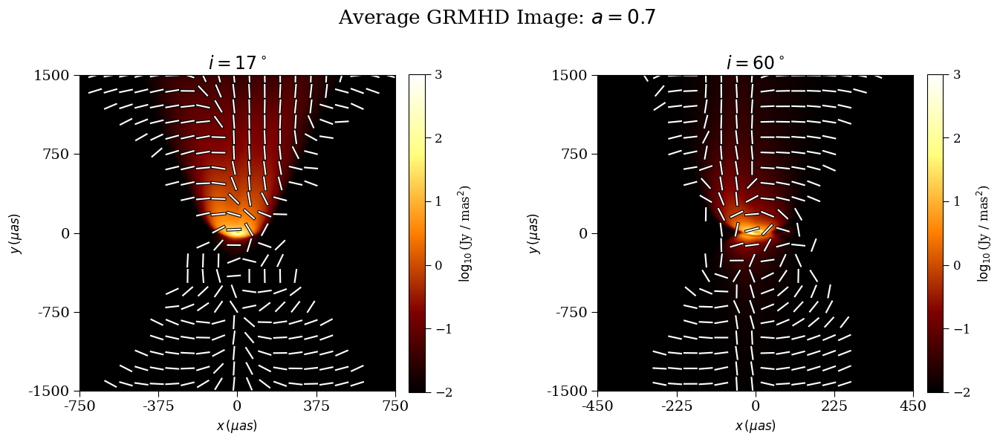

In [13]:
fig, ax = plt.subplots(1,2,figsize=(15,7.5))
dynrange = [1e5, 1e5]
bmax5 = 100
lower = [-2, -2]
upper = [3, 3]
i = 0
for j in range(2):   
    imavgs[i][j][1].display(scale='log',axis=ax[j],dynamic_range=[dynrange[i]],has_title=False,plotp=True,pcut=1e-10, cbar_unit=['Jy','mas2'], cbar_lims=[lower[j],upper[j]])
    # Get the current limits (pixel space)
    xmin, xmax = ax[j].get_xlim()
    ymin, ymax = ax[j].get_ylim()

    # Force exactly 5 ticks at the edges and center
    ax[j].set_xticks(np.linspace(xmin, xmax, 5))
    ax[j].set_yticks(np.linspace(ymin, ymax, 5))
    # Now assign YOUR labels to those tick locations
    ax[j].set_xticklabels(np.linspace(-fovx[j]//2, fovx[j]//2, 5).astype(int))
    ax[j].set_yticklabels(np.linspace(-fovy[j]//2, fovy[j]//2, 5).astype(int))

    # Optional: clean axis labels
    ax[j].set_xlabel(r'$x\,(\mu as)$')
    ax[j].set_ylabel(r'$y\,(\mu as)$')

plt.subplots_adjust(wspace=0.5)
fs=17
# ax[0][1].set_ylabel('')
# ax[1][1].set_ylabel('')
ax[0].set_title(r'$i=17^\circ$',fontsize=fs)
ax[1].set_title(r'$i=60^\circ$',fontsize=fs)
plt.suptitle(r'Average GRMHD Image: $a=0.7$',fontsize=fs+2,y=0.9)
plt.subplots_adjust(wspace=0.5)
plt.savefig('Figures/avgim_a7_compareinc_eta01.pdf',dpi=300)
plt.savefig('Figures/avgim_a7_compareinc_eta01.png',dpi=300)

# Compute limb profile

In [15]:
imFOV = [(1500, 3000),(900, 3000)]  # only inc dependent

alphavals = [[] for freq in freqs]
betavals = [[] for freq in freqs]
arecede = [[] for freq in freqs]
aapproach = [[] for freq in freqs]
arecedeavgsnap = [[] for freq in freqs]
aapproachavgsnap = [[] for freq in freqs]
arecedeavglimb = [[] for freq in freqs]
aapproachavglimb = [[] for freq in freqs]

for f in range(len(freqs)):
    for i in range(len(incs)):
        alphahere, betahere = getimagecoords(ims[f][i][0][0], imFOV[i][0], imFOV[i][1])
        alphavals[f].append(alphahere[0])
        betavals[f].append(betahere[:,0])
        arecede[f].append([])
        aapproach[f].append([])
        arecedeavgsnap[f].append([])
        aapproachavgsnap[f].append([])
        arecedeavglimb[f].append([])
        aapproachavglimb[f].append([])
        for j in range(len(spinstr)):
            aavgrecede, aavgapproach = getalphalimb(imavgs[f][i][j], alphavals[f][i], flip = False)
            arecedeavgsnap[f][i].append(aavgrecede)
            aapproachavgsnap[f][i].append(aavgapproach)
            arecede[f][i].append([])
            aapproach[f][i].append([])
            for im in ims[f][i][j]:
                arecedehere, aapproachhere = getalphalimb(im, alphavals[f][i], flip = False)
                arecede[f][i][j].append(arecedehere)
                aapproach[f][i][j].append(aapproachhere)
            arecedeavglimb[f][i].append(np.mean(np.array(arecede[f][i][j]),axis=0))
            aapproachavglimb[f][i].append(np.mean(np.array(aapproach[f][i][j]),axis=0))
            
arecede = np.array(arecede)
aapproach = np.array(aapproach)

The history saving thread hit an unexpected error (OperationalError('disk I/O error')).History will not be written to the database.


/tmp/ipykernel_2364662/4229313243.py:51: RuntimeWarning: invalid value encountered in log
  dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
/tmp/ipykernel_2364662/4229313243.py:51: RuntimeWarning: invalid value encountered in subtract
  dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))


clipping values leq 0 in pol display


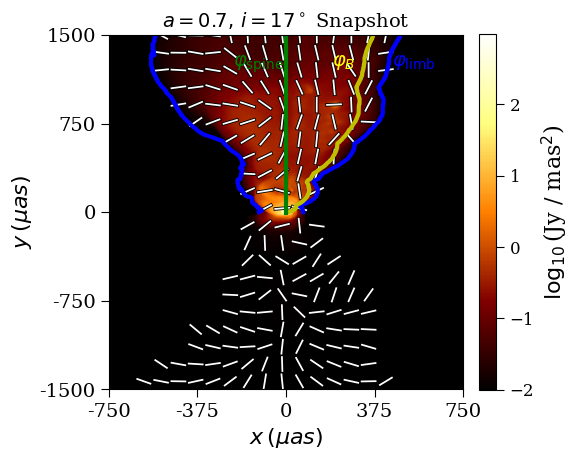

In [16]:
incind = 0
spinind = 1
fref = 0
fig, ax = plt.subplots(1,1,figsize=(5,5))
def getcoordshere(alpha, beta, alphamax, betamax, nx, ny):
    alpha2 = alpha/alphamax*(nx//2)+nx//2
    beta2 = -beta/betamax*(ny//2)+ny//2
    return alpha2, beta2
im = ims[fref][incind][spinind][0]
alphamax = imFOV[incind][0]/MoD/2
betamax = imFOV[incind][1]/MoD/2
nx = im.xdim
ny = im.ydim
im.display(scale='log',plotp=True,pcut=1e-10,dynamic_range=[1e5],axis=ax,has_title=False, cbar_unit=['Jy','mas2'])
ax_position = ax.get_position()
bar_height = 1.0  # height of the tick mark bar

xmin, xmax = ax.get_xlim()
ymin, ymax = ax.get_ylim()

# Force exactly 5 ticks at the edges and center
ax.set_xticks(np.linspace(xmin, xmax, 5))
ax.set_yticks(np.linspace(ymin, ymax, 5))
# Now assign YOUR labels to those tick locations
ax.set_xticklabels(np.linspace(-fovx[0]//2, fovx[0]//2, 5).astype(int))
ax.set_yticklabels(np.linspace(-fovy[0]//2, fovy[0]//2, 5).astype(int))

# Optional: clean axis labels
ax.set_xlabel(r'$x\,(\mu as)$')
ax.set_ylabel(r'$y\,(\mu as)$')
# ax_ticks = fig.add_axes([ax_position.x0+ax_position.width/nx/2, ax_position.y0, ax_position.width-ax_position.width/nx, 0])
# xmax = 120
# ymax = 400
# ax_ticks.set_xlim(-alphamax, alphamax)
# ax_ticks.set_ylim(0,1000)  # Keep the height small to make it look like a bar
# ax_ticks.xaxis.set_ticks(np.linspace(-120, 120, 5))
# ax_ticks.yaxis.set_ticks([])  
# for i in range(len())
# xnew, ynew = getcoordshere(limbind1[i],i,nx,ny)
varphiR = np.arctan(betavals[fref][incind]/arecede[fref][incind][spinind][0])
varphiB = np.pi/2-(np.pi/2-varphiR)*(193/250)
alphaB = betavals[fref][incind]/np.tan(varphiB)
xtest, ytest = getcoordshere(arecede[fref][incind][spinind][0], betavals[fref][incind], alphamax, betamax, nx, ny)
xtest2, ytest2 = getcoordshere(aapproach[fref][incind][spinind][0], betavals[fref][incind], alphamax, betamax, nx, ny)
xtestB, ytestB = getcoordshere(alphaB, betavals[fref][incind], alphamax, betamax, nx, ny)
xtestavglimb, ytestavglimb = getcoordshere(arecedeavglimb[fref][incind][spinind], betavals[fref][incind], alphamax, betamax, nx, ny)
xtest2avglimb, ytest2avglimb = getcoordshere(aapproachavglimb[fref][incind][spinind], betavals[fref][incind], alphamax, betamax, nx, ny)
xtestavgsnap, ytestavgsnap = getcoordshere(arecedeavgsnap[fref][incind][spinind], betavals[fref][incind], alphamax, betamax, nx, ny)
xtest2avgsnap, ytest2avgsnap = getcoordshere(aapproachavgsnap[fref][incind][spinind], betavals[fref][incind], alphamax, betamax, nx, ny)
xspine, yspine = getcoordshere(np.zeros(10), np.linspace(0,betamax,10), alphamax, betamax, nx, ny)
ax.plot(xtest,ytest,'b-',lw=3)
ax.plot(xtest2,ytest2,'b-',lw=3)
ax.plot(xtestB,ytestB,'y-',lw=3)
ax.plot(xspine, yspine, 'g-', lw=3)

ax.text(0.8, 0.95, r'$\varphi_{\rm limb}$', transform=ax.transAxes, fontsize=14, verticalalignment='top',color='blue')
ax.text(0.63, 0.95, r'$\varphi_B$', transform=ax.transAxes, fontsize=14, verticalalignment='top',color='yellow')
ax.text(0.35, 0.95, r'$\varphi_{\rm spine}$', transform=ax.transAxes, fontsize=14, verticalalignment='top',color='green')

# ax[1].plot(xtestavgsnap,ytestavgsnap,'g-',lw=3)
# ax[1].plot(xtest2avgsnap,ytest2avgsnap,'g-',lw=3)
# ax[1].plot(xtestavglimb,ytestavglimb,'b-',lw=3)
# ax[1].plot(xtest2avglimb,ytest2avglimb,'b-',lw=3)
# ax[2].plot(-aapproachavglimb[incind][spinind], betavals[incind], 'b-', lw=3, label='Average Position of Limb')
# ax[2].plot(-aapproachavgsnap[incind][spinind], betavals[incind], 'g-', lw=3, label='Limb of Average Image')
# ax[2].legend(fontsize=10)
ax.set_title(r'$a=0.7,\,i=17^\circ$ Snapshot')
plt.savefig('Figures/limbprofiles_a7_inc17.png',dpi=300,bbox_inches='tight')
plt.savefig('Figures/limbprofiles_a7_inc17.pdf',dpi=300,bbox_inches='tight')

clipping values leq 0 in pol display
clipping values leq 0 in pol display


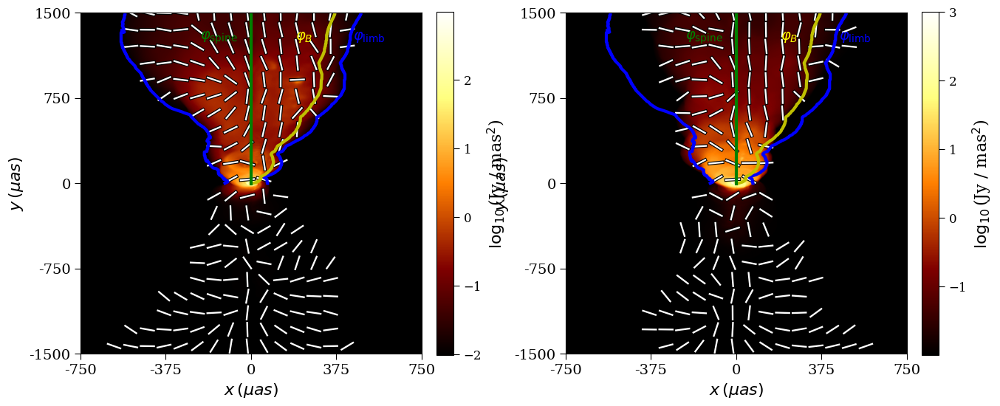

In [ ]:
incind = 0
spinind = 1
fref = 0
def getcoordshere(alpha, beta, alphamax, betamax, nx, ny):
    alpha2 = alpha/alphamax*(nx//2)+nx//2
    beta2 = -beta/betamax*(ny//2)+ny//2
    return alpha2, beta2
iminds = [0, 250]
fig, axs = plt.subplots(1,2,figsize=(15,7))
for axind in range(2):
    ax = axs[axind]

    im = ims[fref][incind][spinind][iminds[axind]]
    alphamax = imFOV[incind][0]/MoD/2
    betamax = imFOV[incind][1]/MoD/2
    nx = im.xdim
    ny = im.ydim
    im.display(scale='log',plotp=True,pcut=1e-10,dynamic_range=[1e5],axis=ax,has_title=False, cbar_unit=['Jy','mas2'])
    ax_position = ax.get_position()
    bar_height = 1.0  # height of the tick mark bar

    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()

    # Force exactly 5 ticks at the edges and center
    ax.set_xticks(np.linspace(xmin, xmax, 5))
    ax.set_yticks(np.linspace(ymin, ymax, 5))
    # Now assign YOUR labels to those tick locations
    ax.set_xticklabels(np.linspace(-fovx[0]//2, fovx[0]//2, 5).astype(int))
    ax.set_yticklabels(np.linspace(-fovy[0]//2, fovy[0]//2, 5).astype(int))

    # Optional: clean axis labels
    ax.set_xlabel(r'$x\,(\mu as)$')
    ax.set_ylabel(r'$y\,(\mu as)$')
    # ax_ticks = fig.add_axes([ax_position.x0+ax_position.width/nx/2, ax_position.y0, ax_position.width-ax_position.width/nx, 0])
    # xmax = 120
    # ymax = 400
    # ax_ticks.set_xlim(-alphamax, alphamax)
    # ax_ticks.set_ylim(0,1000)  # Keep the height small to make it look like a bar
    # ax_ticks.xaxis.set_ticks(np.linspace(-120, 120, 5))
    # ax_ticks.yaxis.set_ticks([])  
    # for i in range(len())
    # xnew, ynew = getcoordshere(limbind1[i],i,nx,ny)
    varphiR = np.arctan(betavals[fref][incind]/arecede[fref][incind][spinind][iminds[axind]])
    varphiB = np.pi/2-(np.pi/2-varphiR)*(193/250)
    alphaB = betavals[fref][incind]/np.tan(varphiB)
    xtest, ytest = getcoordshere(arecede[fref][incind][spinind][0], betavals[fref][incind], alphamax, betamax, nx, ny)
    xtest2, ytest2 = getcoordshere(aapproach[fref][incind][spinind][0], betavals[fref][incind], alphamax, betamax, nx, ny)
    xtestB, ytestB = getcoordshere(alphaB, betavals[fref][incind], alphamax, betamax, nx, ny)
    xtestavglimb, ytestavglimb = getcoordshere(arecedeavglimb[fref][incind][spinind], betavals[fref][incind], alphamax, betamax, nx, ny)
    xtest2avglimb, ytest2avglimb = getcoordshere(aapproachavglimb[fref][incind][spinind], betavals[fref][incind], alphamax, betamax, nx, ny)
    xtestavgsnap, ytestavgsnap = getcoordshere(arecedeavgsnap[fref][incind][spinind], betavals[fref][incind], alphamax, betamax, nx, ny)
    xtest2avgsnap, ytest2avgsnap = getcoordshere(aapproachavgsnap[fref][incind][spinind], betavals[fref][incind], alphamax, betamax, nx, ny)
    xspine, yspine = getcoordshere(np.zeros(10), np.linspace(0,betamax,10), alphamax, betamax, nx, ny)
    ax.plot(xtest,ytest,'b-',lw=3)
    ax.plot(xtest2,ytest2,'b-',lw=3)
    ax.plot(xtestB,ytestB,'y-',lw=3)
    ax.plot(xspine, yspine, 'g-', lw=3)

    ax.text(0.8, 0.95, r'$\varphi_{\rm limb}$', transform=ax.transAxes, fontsize=14, verticalalignment='top',color='blue')
    ax.text(0.63, 0.95, r'$\varphi_B$', transform=ax.transAxes, fontsize=14, verticalalignment='top',color='yellow')
    ax.text(0.35, 0.95, r'$\varphi_{\rm spine}$', transform=ax.transAxes, fontsize=14, verticalalignment='top',color='green')

# ax[1].plot(xtestavgsnap,ytestavgsnap,'g-',lw=3)
# ax[1].plot(xtest2avgsnap,ytest2avgsnap,'g-',lw=3)
# ax[1].plot(xtestavglimb,ytestavglimb,'b-',lw=3)
# ax[1].plot(xtest2avglimb,ytest2avglimb,'b-',lw=3)
# ax[2].plot(-aapproachavglimb[incind][spinind], betavals[incind], 'b-', lw=3, label='Average Position of Limb')
# ax[2].plot(-aapproachavgsnap[incind][spinind], betavals[incind], 'g-', lw=3, label='Limb of Average Image')
# ax[2].legend(fontsize=10)
# ax.set_title(r'$a=0.7,\,i=17^\circ$ Snapshot')
# plt.savefig('Figures/limbprofiles_a7_inc17.png',dpi=300,bbox_inches='tight')
# plt.savefig('Figures/limbprofiles_a7_inc17.pdf',dpi=300,bbox_inches='tight')

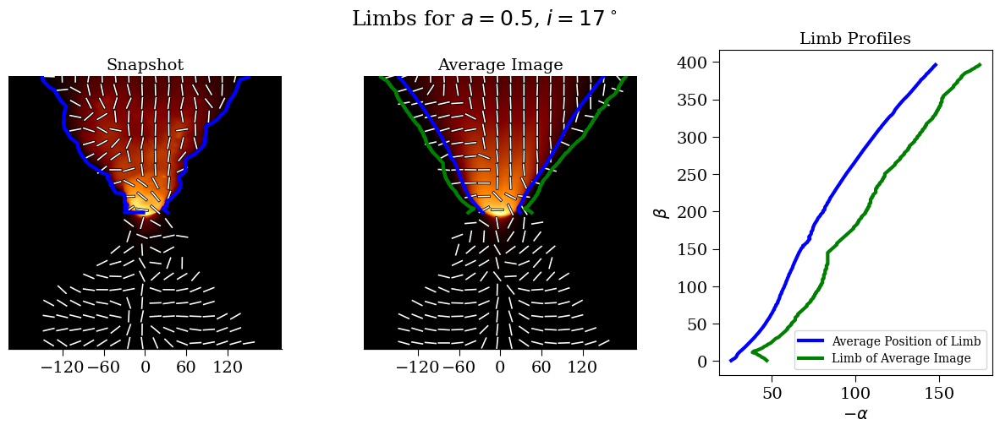

In [11]:
find = 0
incind = 0
spinind = 2
fig, ax = plt.subplots(1,3,figsize=(15,5))
def getcoordshere(alpha, beta, alphamax, betamax, nx, ny):
    alpha2 = alpha/alphamax*(nx//2)+nx//2
    beta2 = -beta/betamax*(ny//2)+ny//2
    return alpha2, beta2
im = ims[find][incind][spinind][0]
alphamax = imFOV[incind][0]/MoD/2
betamax = imFOV[incind][1]/MoD/2
nx = im.xdim
ny = im.ydim
im.display(scale='log',plotp=True,pcut=1e-10,dynamic_range=[1e5],axis=ax[0],label_type=None,has_title=False,has_cbar=False)
imavgs[find][incind][spinind].display(scale='log',plotp=True,pcut=1e-10,dynamic_range=[1e5],axis=ax[1],label_type=None,has_title=False,has_cbar=False)
for i in range(2):
    ax_position = ax[i].get_position()
    bar_height = 1.0  # height of the tick mark bar
    ax_ticks = fig.add_axes([ax_position.x0+ax_position.width/nx/2, ax_position.y0, ax_position.width-ax_position.width/nx, 0])
    xmax = 120
    ymax = 400
    ax_ticks.set_xlim(-alphamax, alphamax)
    ax_ticks.set_ylim(0,1000)  # Keep the height small to make it look like a bar
    ax_ticks.xaxis.set_ticks(np.linspace(-120, 120, 5))
    ax_ticks.yaxis.set_ticks([])  
# for i in range(len())
# xnew, ynew = getcoordshere(limbind1[i],i,nx,ny)
xtest, ytest = getcoordshere(arecede[find][incind][spinind][0], betavals[find][incind], alphamax, betamax, nx, ny)
xtest2, ytest2 = getcoordshere(aapproach[find][incind][spinind][0], betavals[find][incind], alphamax, betamax, nx, ny)
xtestavglimb, ytestavglimb = getcoordshere(arecedeavglimb[find][incind][spinind], betavals[find][incind], alphamax, betamax, nx, ny)
xtest2avglimb, ytest2avglimb = getcoordshere(aapproachavglimb[find][incind][spinind], betavals[find][incind], alphamax, betamax, nx, ny)
xtestavgsnap, ytestavgsnap = getcoordshere(arecedeavgsnap[find][incind][spinind], betavals[find][incind], alphamax, betamax, nx, ny)
xtest2avgsnap, ytest2avgsnap = getcoordshere(aapproachavgsnap[find][incind][spinind], betavals[find][incind], alphamax, betamax, nx, ny)
ax[0].plot(xtest,ytest,'b-',lw=3)
ax[0].plot(xtest2,ytest2,'b-',lw=3)
ax[1].plot(xtestavgsnap,ytestavgsnap,'g-',lw=3)
ax[1].plot(xtest2avgsnap,ytest2avgsnap,'g-',lw=3)
ax[1].plot(xtestavglimb,ytestavglimb,'b-',lw=3)
ax[1].plot(xtest2avglimb,ytest2avglimb,'b-',lw=3)
ax[2].plot(-aapproachavglimb[find][incind][spinind], betavals[find][incind], 'b-', lw=3, label='Average Position of Limb')
ax[2].plot(-aapproachavgsnap[find][incind][spinind], betavals[find][incind], 'g-', lw=3, label='Limb of Average Image')
ax[2].legend(fontsize=10)
ax[0].set_title('Snapshot')
ax[1].set_title('Average Image')
ax[2].set_title('Limb Profiles')
ax[2].set_xlabel(r'$-\alpha$',fontsize=14)
ax[2].set_ylabel(r'$\beta$',fontsize=14)
plt.suptitle('Limbs for $a=0.5$, $i=17^\circ$',fontsize=18)
plt.savefig('Figures/limbprofiles_a5_inc17_eta01.png',dpi=300)
plt.savefig('Figures/limbprofiles_a5_inc17_eta01.pdf',dpi=300)

# Compute Polarization Profiles

In [5]:
def interpall(im, npoints):
    nx = im.xdim
    ny = im.ydim
    ihere = np.flip(np.reshape(np.copy(im.imvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
    Qhere = np.flip(np.reshape(np.copy(im.qvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
    Uhere = np.flip(np.reshape(np.copy(im.uvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
    Phere = Qhere+1j*Uhere
    dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
    dlogI[ihere<1e-14] = 0
    limbind1 = np.argmax(dlogI[:,ny//2:],axis=1)
    limbind2 = np.argmax(dlogI[:,:ny//2],axis=1)
    limb1arr = [np.arange((limbind2[i]),ny//2,1) for i in range(len(limbind2))]
    limb2arr = [np.arange(ny//2,ny//2+(limbind1[i]),1) for i in range(len(limbind1))]
    xarr = np.linspace(0,1,npoints)
    evpainterprecede = []
    evpainterpapproach = []
    Precede = []
    Papproach = []
    for i in range(len(limb1arr)):
        if len(limb1arr[i]) == 0 or len(limb2arr[i]) == 0:
            print('nans row', i, 'out of', len(limb1arr))
            evpainterpapproach.append(np.zeros(npoints)*np.nan)
            evpainterprecede.append(np.zeros(npoints)*np.nan)
            Precede.append(np.zeros(npoints)*np.nan)
            Papproach.append(np.zeros(npoints)*np.nan)
            continue
        evpahereapproach = np.flip(arrangeEVPA(0.5*np.angle(Phere[i][limb1arr[i]])))
        evpahererecede = arrangeEVPA(0.5*np.angle(Phere[i][limb2arr[i]]))
        Pmaghereapproach = np.flip(np.abs(Phere[i][limb1arr[i]]))
        Pmaghererecede = np.abs(Phere[i][limb2arr[i]])
        xvalsapproach = np.linspace(0,1,len(limb1arr[i]))
        xvalsrecede = np.linspace(0,1,len(limb2arr[i]))
        eintapproach = np.interp(xarr,xvalsapproach,evpahereapproach)
        eintrecede = np.interp(xarr,xvalsrecede,evpahererecede)
        evpainterpapproach.append(eintapproach)
        evpainterprecede.append(eintrecede)
        Pmaginterpapproach = np.interp(xarr,xvalsapproach,Pmaghereapproach)
        Pmaginterprecede = np.interp(xarr,xvalsrecede,Pmaghererecede)
        Precede.append(Pmaginterprecede*np.exp(1j*2*eintrecede))
        Papproach.append(Pmaginterpapproach*np.exp(1j*2*eintapproach))
    evpainterpapproach = np.array(evpainterpapproach)
    evpainterprecede = np.array(evpainterprecede)
    Precede = np.array(Precede)
    Papproach = np.array(Papproach)
    return evpainterpapproach, evpainterprecede, Precede, Papproach

def getalphalimb(im, alphavals, flip = False):
    nx = im.xdim
    ny = im.ydim
    ihere = np.flip(np.reshape(np.copy(im.imvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0) if flip == False else np.reshape(np.copy(im.imvec),(im.ydim,im.xdim))[im.ydim//2:,:]
    dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
    dlogI[ihere<1e-14] = 0
    limbind1 = np.argmax(dlogI[:,ny//2:],axis=1)
    limbind2 = np.argmax(dlogI[:,:ny//2],axis=1)
    alphalimbrecede = alphavals[nx//2+limbind1] 
    alphalimbapproach = alphavals[limbind2]
    return alphalimbrecede, alphalimbapproach

In [110]:
# average limb evpa

npoints = 500
evpaapproachavg = [[[] for inc in incs] for freq in freqs]
evparecedeavg = [[[] for inc in incs] for freq in freqs]
Papproachavg = [[[] for inc in incs] for freq in freqs]
Precedeavg = [[[] for inc in incs] for freq in freqs]
spins = [0.5, 0.7, 0.9]
for f in range(len(freqs)):
    for i in range(len(incs)):
        for j in range(len(spins)):
            eapproach, erecede, precede, papproach = interpall(imavgs[f][i][j], npoints)
            evpaapproachavg[f][i].append(eapproach)
            evparecedeavg[f][i].append(erecede)
            Papproachavg[f][i].append(papproach)
            Precedeavg[f][i].append(precede)
        evpaapproachavg[f][i] = np.array(evpaapproachavg[f][i])
        evparecedeavg[f][i] = np.array(evparecedeavg[f][i])
        Papproachavg[f][i] = np.array(Papproachavg[f][i])
        Precedeavg[f][i] = np.array(Precedeavg[f][i])
evpaapproachavg = np.array(evpaapproachavg)
evparecedeavg = np.array(evparecedeavg)
Papproachavg = np.array(Papproachavg)
Precedeavg = np.array(Precedeavg)


In [ ]:
npoints = 500
evpaapproach = [[[[] for spin in spinstr] for inc in incs] for freq in freqs]
evparecede = [[[[] for spin in spinstr] for inc in incs] for freq in freqs]
Papproach = [[[[] for spin in spinstr] for inc in incs] for freq in freqs]
Precede = [[[[] for spin in spinstr] for inc in incs] for freq in freqs]
spins = [0.5, 0.7, 0.9]
for f in range(len(freqs)):
    for i in range(len(incs)):
        for j in range(len(spins)):
            for k in range(len(ims[f][i][j])):
                print(f,i,j,k)
                eapproach, erecede, precede, papproach = interpall(ims[f][i][j][k], npoints)
                evpaapproach[f][i][j].append(eapproach)
                evparecede[f][i][j].append(erecede)
                Papproach[f][i][j].append(papproach)
                Precede[f][i][j].append(precede)
            evpaapproach[f][i][j] = np.array(evpaapproach[f][i][j])
            evparecede[f][i][j] = np.array(evparecede[f][i][j])
            Papproach[f][i][j] = np.array(Papproach[f][i][j])
            Precede[f][i][j] = np.array(Precede[f][i][j])
evpaapproach = np.array(evpaapproach)
evparecede = np.array(evparecede)
Papproach = np.array(Papproach)
Precede = np.array(Precede)
# shape axes are (freq, inc, spin, ims, ypos, transversepos)

In [78]:
circapproach = 0.5*st.circmean(2*evpaapproach, axis=3)
circrecede = 0.5*st.circmean(2*evparecede, axis=3)
circapproachP = np.nanmean(Papproach, axis=3)
circrecedeP = np.nanmean(Precede, axis=3)

circapproachavg = np.copy(evpaapproachavg)
circrecedeavg = 0.5*st.circmean(2*evparecedeavg)
circapproachPavg = np.copy(Papproachavg)
circrecedePavg = np.copy(Precedeavg)

##### Save

In [79]:
nx = 512
np.save(f'pklfiles/evpaapproach_Rhigh{Rhigh}_eta01_nx{nx}.npy',np.array(evpaapproach))
np.save(f'pklfiles/evparecede_Rhigh{Rhigh}_eta01_nx{nx}.npy',np.array(evparecede))
np.save(f'pklfiles/Papproach_Rhigh{Rhigh}_eta01_nx{nx}.npy',np.array(Papproach))
np.save(f'pklfiles/Precede_Rhigh{Rhigh}_eta01_nx{nx}.npy',np.array(Precede))

##### Load

In [82]:
nx = 512
evpaapproach = np.load(f'pklfiles/evpaapproach_Rhigh{Rhigh}_eta01_nx{nx}.npy',allow_pickle=True)
evparecede = np.load(f'pklfiles/evparecede_Rhigh{Rhigh}_eta01_nx{nx}.npy',allow_pickle=True)
Papproach = np.load(f'pklfiles/Papproach_Rhigh{Rhigh}_eta01_nx{nx}.npy',allow_pickle=True)
Precede = np.load(f'pklfiles/Precede_Rhigh{Rhigh}_eta01_nx{nx}.npy',allow_pickle=True)

circapproach = 0.5*st.circmean(2*evpaapproach, axis=3)
circrecede = 0.5*st.circmean(2*evparecede, axis=3)
circapproachP = np.nanmean(Papproach, axis=3)
circrecedeP = np.nanmean(Precede, axis=3)

In [8]:
evpaapproach = np.load(f'pklfiles/evpaapproach_Rhigh{Rhigh}_eta01.npy',allow_pickle=True)
evparecede = np.load(f'pklfiles/evparecede_Rhigh{Rhigh}_eta01.npy',allow_pickle=True)
circapproach = 0.5*st.circmean(2*evpaapproach, axis=3)
circrecede = 0.5*st.circmean(2*evparecede, axis=3)

In [19]:
circapproach = 0.5*np.array([[st.circmean(2*evpaapproach[incind][i],axis=0) for i in range(len(evpaapproach[0]))] for incind in range(len(incs))])
circrecede = 0.5*np.array([[st.circmean(2*evparecede[incind][i],axis=0) for i in range(len(evparecede[0]))] for incind in range(len(incs))])

In [ ]:
# np.save('pklfiles/evpaapproach_60_eta01.npy',np.array(evpaapproach))
# np.save('pklfiles/evparecede_60_eta01.npy',np.array(evparecede))
# np.save('pklfiles/Papproach_60_eta01.npy',np.array(Papproach))
# np.save('pklfiles/Precede_60_eta01.npy',np.array(Precede))

# np.save('pklfiles/evpaapproach_large45.npy',np.array(evpaapproach))
# np.save('pklfiles/evparecede_large45.npy',np.array(evparecede))
# np.save('pklfiles/Papproach_large45.npy',np.array(Papproach))
# np.save('pklfiles/Precede_large45.npy',np.array(Precede))

In [ ]:
spins = [0.5, 0.7, 0.9]
incs = [17,45,60]
# evpaapproachJet = np.load('pklfiles/evpaapproach_jet.npy',allow_pickle=True)
# evparecedeJet = np.load('pklfiles/evparecede_jet.npy',allow_pickle=True)
# PapproachJet = np.load('pklfiles/Papproach_jet.npy',allow_pickle=True)
# PrecedeJet = np.load('pklfiles/Precede_jet.npy',allow_pickle=True)

evpaapproachsmall = np.load('pklfiles/evpaapproach_smallres.npy',allow_pickle=True)
evparecedesmall = np.load('pklfiles/evparecede_smallres.npy',allow_pickle=True)
Papproachsmall = np.load('pklfiles/Papproach_smallres.npy',allow_pickle=True)
Precedesmall = np.load('pklfiles/Precede_smallres.npy',allow_pickle=True)

In [ ]:
# circapproachJet = 0.5*st.circmean(2*evpaapproachJet, axis=2)
# circrecedeJet = 0.5*st.circmean(2*evparecedeJet, axis=2)
# circapproachcollJet = st.circmean(2*circapproachJet, axis=-1)
# circredecollJet = st.circmean(2*circrecedeJet, axis=-1)
# avgapproachJet = 0.5*np.angle(np.nansum(PapproachJet, axis=2))
# # avgapproachcollJet = 0.5*np.angle(np.nansum(np.nansum(PapproachJet, axis=2),axis=-1))
# avgrecedeJet = 0.5*np.angle(np.nansum(PrecedeJet, axis=2))
# # avgrecedecollJet = 0.5*np.angle(np.nansum(np.nansum(PrecedeJet, axis=2),axis=-1))

circapproachsmall = 0.5*st.circmean(2*evpaapproachsmall, axis=2)
circrecedesmall = 0.5*st.circmean(2*evparecedesmall, axis=2)
circapproachcollsmall = st.circmean(2*circapproachsmall, axis=-1)
circredecollsmall = st.circmean(2*circrecedesmall, axis=-1)
avgapproachsmall = 0.5*np.angle(np.nansum(Papproachsmall, axis=2))
# avgapproachcollsmall = 0.5*np.angle(np.nansum(np.nansum(Papproachsmall, axis=2),axis=-1))
avgrecedesmall = 0.5*np.angle(np.nansum(Precedesmall, axis=2))
# avgrecedecollsmall = 0.5*np.angle(np.nansum(np.nansum(Precedesmall, axis=2),axis=-1))

In [ ]:
evpaapproach17 = np.load('pklfiles/evpaapproach_17_eta01.npy',allow_pickle=True)
evparecede17 = np.load('pklfiles/evparecede_17_eta01.npy',allow_pickle=True)
evpaapproach60 = np.load('pklfiles/evpaapproach_60_eta01.npy',allow_pickle=True)
evparecede60 = np.load('pklfiles/evparecede_60_eta01.npy',allow_pickle=True)
# Papproach = np.load('pklfiles/Papproach_17_eta01.npy',allow_pickle=True)
# Precede = np.load('pklfiles/Precede_17_eta01.npy',allow_pickle=True)

circapproach17 = 0.5*st.circmean(2*evpaapproach17, axis=2)
circrecede17 = 0.5*st.circmean(2*evparecede17, axis=2)
circapproach60 = 0.5*st.circmean(2*evpaapproach60, axis=2)
circrecede60 = 0.5*st.circmean(2*evparecede60, axis=2)
circapproach = np.array([circapproach17[0], circapproach60[0]])
circrecede = np.array([circrecede17[0], circrecede60[0]])

# circapproachcoll = st.circmean(2*circapproach, axis=-1)
# circredecoll = st.circmean(2*circrecede, axis=-1)
# avgapproach = 0.5*np.angle(np.nansum(Papproach, axis=2))
# avgrecede = 0.5*np.angle(np.nansum(Precede, axis=2))

# Now fit structure

### $i=17$

In [388]:
def getcoordshere(alpha, beta, alphamax, betamax, nx, ny):
    alpha2 = alpha/alphamax*(nx//2)+nx//2
    beta2 = -beta/betamax*(ny//2)+ny//2
    return alpha2, beta2

npar = 2
incind = 0
i = 0 #should match incind 
alphamax = imFOV[incind][0]/MoD/2
betamax = imFOV[incind][1]/MoD/2
nx = ims[0][incind][0][0].xdim
ny = ims[0][incind][0][0].ydim
spins = [0.5, 0.7, 0.9]
inchere = 17*np.pi/180
pminvals = [0.7, 0.7, 0.67]
pmaxvals = [0.7, 0.7, 0.67]
gammaminvals = [2.4, 2.45, 2.5]
gammamaxvals = [2.4, 2.45, 2.5]
thminvals = [60*np.pi/180, 60*np.pi/180, 60*np.pi/180]
thmaxvals = [70*np.pi/180, 70*np.pi/180, 70*np.pi/180]
betaswingminlimb = [[] for freq in freqs]
betaswingmaxlimb = [[] for freq in freqs]
betaswingminspine = [[] for freq in freqs]
betaswingmaxspine = [[] for freq in freqs]
xvals = [[] for freq in freqs]
ytopvals = [[] for freq in freqs]
ybotvals = [[] for freq in freqs]
for f in range(len(freqs)):
    for j in range(len(spins)):
        spin = spins[j]
        betawall = []
        pvals = np.linspace(pminvals[j], pmaxvals[j], npar)
        gammavals = np.linspace(gammaminvals[j], gammamaxvals[j], npar)
        vinfvals = np.sqrt(1-1/gammavals**2)
        thvals = np.linspace(thminvals[j], thmaxvals[j], npar)
        betalimbs = []
        betaspines = []
        for p in pvals:
            for vinf in vinfvals:
                for thplus in thvals:
                    spinehere = getbetaswingspine(vinf, spin, inchere, p, thplus)
                    # betaspines.append(spinehere[0])
                    betaspines.append(spinehere[1])
                    betalimbs.append(getbetaswinglimb(vinf, spin, inchere, p, thplus))
        betaswingminlimb[f].append(np.min(np.array(betalimbs)))
        betaswingmaxlimb[f].append(np.max(np.array(betalimbs)))
        betaswingminspine[f].append(np.min(np.array(betaspines)))
        betaswingmaxspine[f].append(np.max(np.array(betaspines)))
        for k in range(2):
            psitarget = (1+np.sqrt(1-spin**2))**pvals[k]*(1-np.cos(thvals[k]))
            pval = pvals[len(pvals)-1-k]
            betawallhere = np.array([betalimbfromalpha(alphavals[f][incind][i], pval, psitarget, inchere) for i in range(len(alphavals[f][incind]))])
            betawallhere[betawallhere>betamax] = betamax
            betawallhere[betawallhere<-betamax] = -betamax
            dbetadalpha = np.diff(betawallhere,prepend=0)/np.diff(alphavals[f][incind],prepend=0)
            d2betadalpha2 = np.diff(dbetadalpha,prepend=0)/np.diff(alphavals[f][incind],prepend=0)
            betawallhere[np.abs(dbetadalpha)>10] = np.nan
            betawallhere[np.abs(d2betadalpha2)>1] = np.nan
            betawall.append(betawallhere)
        xhere, yheretop = getcoordshere(alphavals[f][incind], np.maximum(betawall[0],betawall[1]), alphamax, betamax, nx, ny)
        xhere, yherebot = getcoordshere(alphavals[f][incind], np.minimum(betawall[0],betawall[1]), alphamax, betamax, nx, ny)
        xvals[f].append(xhere)
        ytopvals[f].append(yheretop)
        ybotvals[f].append(yherebot)
print(betaswingminlimb[0][2],betaswingmaxlimb[0][2])

/home/zg2027/.conda/envs/env9/lib/python3.9/site-packages/kgeo/bfields.py:509: RuntimeWarning: divide by zero encountered in scalar divide
  Bph = I / (2*np.pi*Delta*sth2)
/home/zg2027/.conda/envs/env9/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:178: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
/home/zg2027/.conda/envs/env9/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:178: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


59.02914309962341 89.80345111823503


In [ ]:
blur = False
gammasini = 0.5 #just <1 to indicate we will be plotting WRT receding limb
endpiece = 'blur' if blur == True else ''
fovx = 1500
fovy = 3000
nvarphi = 250
usefrac = True
PRall = [[] for spinind in spins]
PAall = [[] for spinind in spins]
PSall = [[] for spinind in spins]
vfacRall = [[] for spinind in spins]
vfacAall = [[] for spinind in spins]
vfacSall = [[] for spinind in spins]
bdphiRall = [[] for spinind in spins]
bdphiAall = [[] for spinind in spins]
bdphiSall = [[] for spinind in spins]

for spinind in range(len(spins)):
    for k in range(len(ims[f][i][spinind])):
        print(k)
        im = imsblur[f][i][spinind][k] if blur == True else ims[f][i][spinind][k]
        betahere = betavals[f][i]
        PR, PA, PS, vfacR, vfacA, vfacS = getavgstuff(im, betahere, arecede[f][i][spinind][k], aapproach[f][i][spinind][k], nvarphi, fovy=fovy, fovx=fovx, gammasini=gammasini)
        Reven, b2all = b2_interp(im, np.min(betahere)*MoD, np.max(betahere)*MoD, 0, 2*np.pi, len(betahere), deg=False, fovy=fovy, fovx=fovx, phifac=True)

        PRall[spinind].append(PR)
        PAall[spinind].append(PA)
        PSall[spinind].append(PS)
        
        vfacRall[spinind].append(vfacR)
        vfacAall[spinind].append(vfacA)
        vfacSall[spinind].append(vfacS)
        
        dphiR = np.diff(np.angle(vfacR)*0.5, axis=1)[:,1]
        dphiA = np.diff(np.angle(vfacA)*0.5, axis=1)[:,1]
        dphiS = np.diff(np.angle(vfacS)*0.5, axis=1)[:,1]
        
        bhereR = np.sqrt(betahere**2 + arecede[f][i][spinind][k]**2)
        bhereA = np.sqrt(betahere**2 + aapproach[f][i][spinind][k]**2)
        bhereS = np.copy(betahere)
        
        bdphiRall[spinind].append(dphiR*bhereR)
        bdphiAall[spinind].append(dphiA*bhereA)
        bdphiSall[spinind].append(dphiS*bhereS)
        
PRall = np.array(PRall)
PAall = np.array(PAall)
PSall = np.array(PSall)

vfacRall = np.array(vfacRall)
vfacAall = np.array(vfacAall)
vfacSall = np.array(vfacSall)

bdphiRall = np.array(bdphiRall)
bdphiAall = np.array(bdphiAall)
bdphiSall = np.array(bdphiSall)

directory = '/scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/'
np.save(directory+f'bdphiRall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', bdphiRall)
np.save(directory+f'bdphiAall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', bdphiAall)
np.save(directory+f'bdphiSall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', bdphiSall)
np.save(directory+f'PRall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', PRall)
np.save(directory+f'PAall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', PAall)
np.save(directory+f'PSall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', PSall)
np.save(directory+f'vfacRall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', vfacRall)
np.save(directory+f'vfacAall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', vfacAall)
np.save(directory+f'vfacSall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', vfacSall)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [389]:
i = 0
eta = 0.01
Rhigh = 40
dirpkl = '/scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/'
endpiece = f'_eta01_nx{nx}_Rhigh{Rhigh}_inc{str(incs[i])}'
PRall = np.load(dirpkl+'PRall'+endpiece+'.npy',allow_pickle=True)
PAall = np.load(dirpkl+'PAall'+endpiece+'.npy',allow_pickle=True)
PSall = np.load(dirpkl+'PSall'+endpiece+'.npy',allow_pickle=True)
vfacRall = np.load(dirpkl+'vfacRall'+endpiece+'.npy',allow_pickle=True)
vfacAall = np.load(dirpkl+'vfacAall'+endpiece+'.npy',allow_pickle=True)
vfacSall = np.load(dirpkl+'vfacSall'+endpiece+'.npy',allow_pickle=True)
bdphiRall = np.load(dirpkl+'bdphiRall'+endpiece+'.npy',allow_pickle=True)
bdphiAall = np.load(dirpkl+'bdphiAall'+endpiece+'.npy',allow_pickle=True)
bdphiSall = np.load(dirpkl+'bdphiSall'+endpiece+'.npy',allow_pickle=True)

# Average of Image Plots

In [390]:
%%capture
spins = [0.5, 0.7, 0.9]
fovx = 1500
fovy = 3000
# arg(beta2)

endpiece = ''
b2all = [[] for spinind in spins]
for spinind in range(len(spins)):
    for k in range(len(ims[f][i][spinind])):
        print(endpiece, spinind, k)
        im = imsblur[f][i][spinind][k] if endpiece == 'blur' else ims[f][i][spinind][k]
        betahere = betavals[f][i]
        Reven, b2pointhere = b2_interp(im, np.min(betahere)*MoD, np.max(betahere)*MoD, 0, 2*np.pi, len(betahere), deg=False, fovy=fovy, fovx=fovx, phifac=True)
        b2all[spinind].append(b2pointhere)
b2all = np.array(b2all)

In [401]:
def getcoordshere(alpha, beta, alphamax, betamax, nx, ny):
    alpha2 = alpha/alphamax*(nx//2)+nx//2
    beta2 = -beta/betamax*(ny//2)+ny//2
    return alpha2, beta2

npar = 2
incind = 0
i = 0 #should match incind 
alphamax = imFOV[incind][0]/MoD/2
betamax = imFOV[incind][1]/MoD/2
nx = ims[0][incind][0][0].xdim
ny = ims[0][incind][0][0].ydim
spins = [0.5, 0.7, 0.9]
inchere = 17*np.pi/180
# pminvals = [0.65, 0.65, 0.65]
# pmaxvals = [0.7, 0.7, 0.7]
pminvals = [0.7, 0.7, 0.7]
pmaxvals = [0.75, 0.75, 0.75]
gammaminvals = [2.5, 2.5, 2.5]
gammamaxvals = [2.5, 2.5, 2.5]
thminvalslimb = np.array([80*np.pi/180, 80*np.pi/180, 80*np.pi/180])
thmaxvalslimb = np.array([90*np.pi/180, 90*np.pi/180, 90*np.pi/180])
thminvalsspine = np.array([30*np.pi/180, 30*np.pi/180, 30*np.pi/180])
thmaxvalsspine = np.array([40*np.pi/180, 40*np.pi/180, 40*np.pi/180])
gammaminvals = [2.5, 2.5, 2.5]
gammamaxvals = [2.5, 2.5, 2.5]
thminvalslimb = np.array([90*np.pi/180, 90*np.pi/180, 90*np.pi/180])
thmaxvalslimb = np.array([90*np.pi/180, 90*np.pi/180, 90*np.pi/180])
thminvalsspine = np.array([30*np.pi/180, 30*np.pi/180, 30*np.pi/180])
thmaxvalsspine = np.array([30*np.pi/180, 30*np.pi/180, 30*np.pi/180])
betaswingminlimb = [[] for freq in freqs]
betaswingmaxlimb = [[] for freq in freqs]
betaswingminspine = [[] for freq in freqs]
betaswingmaxspine = [[] for freq in freqs]
xvals = [[] for freq in freqs]
ytopvals = [[] for freq in freqs]
ybotvals = [[] for freq in freqs]
for f in range(len(freqs)):
    for j in range(len(spins)):
        spin = spins[j]
        betawall = []
        pvals = np.linspace(pminvals[j], pmaxvals[j], npar)
        gammavals = np.linspace(gammaminvals[j], gammamaxvals[j], npar)
        vinfvals = np.sqrt(1-1/gammavals**2)
        thvalslimb = np.linspace(thminvalslimb[j], thmaxvalslimb[j], npar)
        thvalsspine = np.linspace(thminvalsspine[j], thmaxvalsspine[j], npar)
        betalimbs = []
        betaspines = []
        for p in pvals:
            for vinf in vinfvals:
                for i in range(len(thvals)):
                    spinehere = getbetaswingspine(vinf, spin, inchere, p, thvalsspine[i])
                    # betaspines.append(spinehere[0])
                    betaspines.append(spinehere[1])
                    betalimbs.append(getbetaswinglimb(vinf, spin, inchere, p, thvalslimb[i]))
        betaswingminlimb[f].append(np.min(np.array(betalimbs)))
        betaswingmaxlimb[f].append(np.max(np.array(betalimbs)))
        betaswingminspine[f].append(np.min(np.array(betaspines)))
        betaswingmaxspine[f].append(np.max(np.array(betaspines)))
        for k in range(2):
            psitarget = (1+np.sqrt(1-spin**2))**pvals[k]*(1-np.cos(thvals[k]))
            pval = pvals[len(pvals)-1-k]
            betawallhere = np.array([betalimbfromalpha(alphavals[f][incind][i], pval, psitarget, inchere) for i in range(len(alphavals[f][incind]))])
            betawallhere[betawallhere>betamax] = betamax
            betawallhere[betawallhere<-betamax] = -betamax
            dbetadalpha = np.diff(betawallhere,prepend=0)/np.diff(alphavals[f][incind],prepend=0)
            d2betadalpha2 = np.diff(dbetadalpha,prepend=0)/np.diff(alphavals[f][incind],prepend=0)
            betawallhere[np.abs(dbetadalpha)>10] = np.nan
            betawallhere[np.abs(d2betadalpha2)>1] = np.nan
            betawall.append(betawallhere)
        xhere, yheretop = getcoordshere(alphavals[f][incind], np.maximum(betawall[0],betawall[1]), alphamax, betamax, nx, ny)
        xhere, yherebot = getcoordshere(alphavals[f][incind], np.minimum(betawall[0],betawall[1]), alphamax, betamax, nx, ny)
        xvals[f].append(xhere)
        ytopvals[f].append(yheretop)
        ybotvals[f].append(yherebot)
print(betaswingminlimb[0][2],betaswingmaxlimb[0][2])

51.99024952079626 112.3058603782032


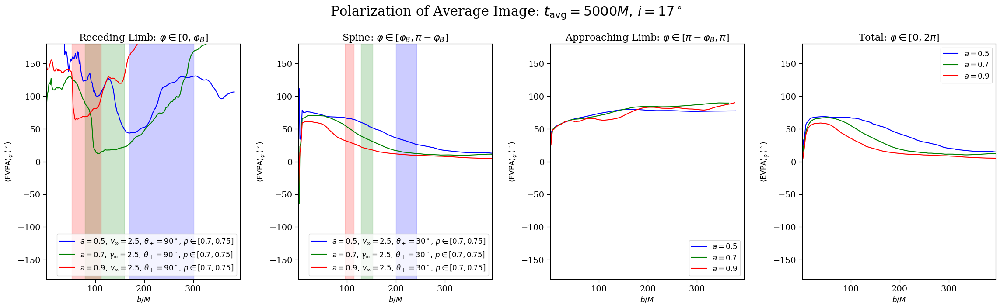

In [429]:
fig, ax = plt.subplots(1,4,figsize=(28,7))
nimstot = len(ims[f][i][0])
windowlength = None #filter window size
startfilter = 10 #minimum index to consider for outlier removal (to avoid removing early points with high curvature that are expected)
startim = 0 #first image to put in average
endim = nimstot #last image to put in average
polyorder = 3
ymin = -10
ymax = 160
betahere = np.copy(betavals[f][i])
indmatch = np.argmin(np.abs(betavals[f][i]-100))
multfac = 1 # np.exp(-1j*2*np.pi/2)
blurind = 0 # 0 for unblurred, 1 for blurred
nvarphi = PRall[blurind].shape[-1]
transinds = [nvarphi-53, nvarphi-57, nvarphi-40]
colors = ['b', 'g', 'r']
labelparams1 = [r'$a=0.5$', r'$a=0.7$', r'$a=0.9$']
labelparams2 = [r'$a=0.5,\,\gamma_\infty=2.5,\,\theta_+=90^\circ,\,p\in [0.7,0.75]$',r'$a=0.7,\,\gamma_\infty=2.5,\,\theta_+=90^\circ,\,p\in [0.7,0.75]$',r'$a=0.9,\,\gamma_\infty=2.5,\,\theta_+=90^\circ,\,p\in [0.7,0.75]$']
labelparams3 = [r'$a=0.5,\,\gamma_\infty=2.5,\,\theta_+=30^\circ,\,p\in [0.7,0.75]$',r'$a=0.7,\,\gamma_\infty=2.5,\,\theta_+=30^\circ,\,p\in [0.7,0.75]$',r'$a=0.9,\,\gamma_\infty=2.5,\,\theta_+=30^\circ,\,p\in [0.7,0.75]$']
alpha = 0.2
# transinds = [nvarphi-110, nvarphi-110, nvarphi-80]
for spinind in range(len(spins)):
    # transind = -100
    # sumy = 0.5*np.angle(np.sum(np.sum(Precede[f][i][spinind][:,:,transind:],axis=0), axis=1))
    # yvals = centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    # ax[0].plot(betahere,yvals)
    # sumy = 0.5*np.angle(np.sum(np.sum(Papproach[f][i][spinind][:,:,transind:],axis=0), axis=1))
    # yvals = centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    # ax[1].plot(betahere,yvals)
    # sumy = 0.5*np.angle(np.sum(Papproach[f][i][spinind][:,:,0],axis=0))
    # yvals = centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    # ax[2].plot(betahere,yvals)

    transind = transinds[spinind] #nvarphi-110
    sumy = 0.5*np.angle(np.sum(np.sum(PRall[spinind,startim:endim,:,transind:]*np.abs(bdphiRall[spinind,startim:endim,:,None])*vfacRall[spinind,startim:endim,:,transind:]*multfac,axis=0), axis=1))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=5.0, iters=2, startind=startfilter)
    yvals = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[0].plot(xvals,yvals,color=colors[spinind],label=labelparams2[spinind])
    ax[0].axvspan(betaswingminlimb[f][spinind], betaswingmaxlimb[f][spinind], color=colors[spinind], alpha=alpha)
    
    sumy = 0.5*np.angle(np.sum(np.sum(PSall[spinind,startim:endim,:,(nvarphi-transind)//2:(nvarphi+transind)//2]*np.abs(bdphiSall[spinind,startim:endim,:,None])*vfacSall[spinind,startim:endim,:,(nvarphi-transind)//2:(nvarphi+transind)//2]*multfac,axis=0), axis=1))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=1.0, iters=2, startind=startfilter)
    yvalsSpine = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[1].plot(xvals,yvalsSpine,color=colors[spinind],label=labelparams3[spinind])
    ax[1].axvspan(betaswingminspine[f][spinind], betaswingmaxspine[f][spinind], color=colors[spinind], alpha=alpha)
    
    #*bdphiAall[spinind,:,:,None]*vfacAall[spinind,:,:,transind:]*np.exp(-1j*2*np.pi/2)
    sumy = 0.5*np.angle(np.sum(np.sum(PAall[spinind,startim:endim,:,transind:]*np.abs(bdphiAall[spinind,startim:endim,:,None])*vfacAall[spinind,startim:endim,:,transind:]*multfac,axis=0), axis=1))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=5.0, iters=2, startind=startfilter)
    yvals = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[2].plot(xvals,yvals,color=colors[spinind], label=labelparams1[spinind])
    
    # Reven, argb2 = argb2_interp(imavgs[f][i][spinind], np.min(betahere)*MoD, np.max(betahere)*MoD, 0, 2*np.pi, len(betahere), deg=False, fovy=3000, fovx=1500, phifac=True)
    # yvals = centery(-arrangeEVPA(0.5*argb2)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(-arrangeEVPA(0.5*argb2)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    sumy = 0.5*np.angle(np.sum(b2all[spinind,startim:endim,:],axis=0))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=5.0, iters=2, startind=startfilter)
    yvals = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[3].plot(xvals,yvals,color=colors[spinind], label=labelparams1[spinind])


titles = [r'Receding Limb: $\varphi\in [0,\varphi_B]$', r'Spine: $\varphi\in [\varphi_B,\pi-\varphi_B]$', r'Approaching Limb: $\varphi\in [\pi-\varphi_B,\pi]$', r'Total: $\varphi\in [0,2\pi]$']
for j in range(4):
    ax[j].set(ylim=(-180,180), xlim=(betahere[0], betahere[-1]), xlabel=r'$b/M$', ylabel=r'$\langle {\rm EVPA} \rangle_\varphi \,(^\circ)$')
    ax[j].set_title(titles[j],fontsize=16)
    fsl = 12 if j < 2 else 12
    ax[j].legend(loc='lower right', fontsize=fsl)
# ax[0].legend()
ax[3].legend()
plt.suptitle(r'Polarization of Average Image: $t_{\rm avg}=5000M,\,i=17^\circ$',fontsize=22,y=1.01)
plt.subplots_adjust(wspace=0.3)
plt.savefig(f'Figures/pol_semi_compareavg_Rhigh{Rhigh}_inc17_eta01.pdf',bbox_inches='tight', dpi=300)
plt.savefig(f'Figures/pol_semi_compareavg_Rhigh{Rhigh}_inc17_eta01.png',bbox_inches='tight', dpi=300)

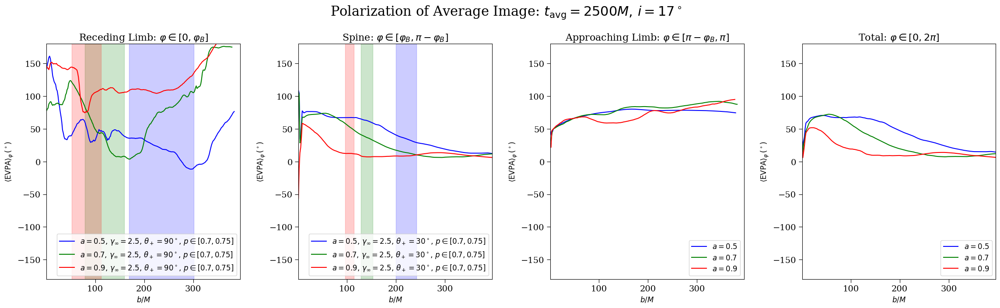

In [437]:
fig, ax = plt.subplots(1,4,figsize=(28,7))
nimstot = len(ims[f][i][0])
windowlength = None #filter window size
startfilter = 10 #minimum index to consider for outlier removal (to avoid removing early points with high curvature that are expected)
startim = nimstot//2 #first image to put in average
endim = nimstot #last image to put in average
polyorder = 3
ymin = -10
ymax = 160
betahere = np.copy(betavals[f][i])
indmatch = np.argmin(np.abs(betavals[f][i]-150))
multfac = 1 # np.exp(-1j*2*np.pi/2)
blurind = 0 # 0 for unblurred, 1 for blurred
nvarphi = PRall[blurind].shape[-1]
transinds = [nvarphi-90, nvarphi-40, nvarphi-40]
transinds = [nvarphi-53, nvarphi-57, nvarphi-40]
colors = ['b', 'g', 'r']
labelparams1 = [r'$a=0.5$', r'$a=0.7$', r'$a=0.9$']
labelparams2 = [r'$a=0.5,\,\gamma_\infty=2.5,\,\theta_+=90^\circ,\,p\in [0.7,0.75]$',r'$a=0.7,\,\gamma_\infty=2.5,\,\theta_+=90^\circ,\,p\in [0.7,0.75]$',r'$a=0.9,\,\gamma_\infty=2.5,\,\theta_+=90^\circ,\,p\in [0.7,0.75]$']
labelparams3 = [r'$a=0.5,\,\gamma_\infty=2.5,\,\theta_+=30^\circ,\,p\in [0.7,0.75]$',r'$a=0.7,\,\gamma_\infty=2.5,\,\theta_+=30^\circ,\,p\in [0.7,0.75]$',r'$a=0.9,\,\gamma_\infty=2.5,\,\theta_+=30^\circ,\,p\in [0.7,0.75]$']
alpha = 0.2
# transinds = [nvarphi-110, nvarphi-110, nvarphi-80]
for spinind in range(len(spins)):
    # transind = -100
    # sumy = 0.5*np.angle(np.sum(np.sum(Precede[f][i][spinind][:,:,transind:],axis=0), axis=1))
    # yvals = centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    # ax[0].plot(betahere,yvals)
    # sumy = 0.5*np.angle(np.sum(np.sum(Papproach[f][i][spinind][:,:,transind:],axis=0), axis=1))
    # yvals = centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    # ax[1].plot(betahere,yvals)
    # sumy = 0.5*np.angle(np.sum(Papproach[f][i][spinind][:,:,0],axis=0))
    # yvals = centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    # ax[2].plot(betahere,yvals)

    transind = transinds[spinind] #nvarphi-110
    sumy = 0.5*np.angle(np.sum(np.sum(PRall[spinind,startim:endim,:,transind:]*np.abs(bdphiRall[spinind,startim:endim,:,None])*vfacRall[spinind,startim:endim,:,transind:]*multfac,axis=0), axis=1))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=5.0, iters=2, startind=startfilter)
    yvals = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[0].plot(xvals,yvals,color=colors[spinind],label=labelparams2[spinind])
    ax[0].axvspan(betaswingminlimb[f][spinind], betaswingmaxlimb[f][spinind], color=colors[spinind], alpha=alpha)
    
    sumy = 0.5*np.angle(np.sum(np.sum(PSall[spinind,startim:endim,:,(nvarphi-transind)//2:(nvarphi+transind)//2]*np.abs(bdphiSall[spinind,startim:endim,:,None])*vfacSall[spinind,startim:endim,:,(nvarphi-transind)//2:(nvarphi+transind)//2]*multfac,axis=0), axis=1))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=1.0, iters=2, startind=startfilter)
    yvalsSpine = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[1].plot(xvals,yvalsSpine,color=colors[spinind],label=labelparams3[spinind])
    ax[1].axvspan(betaswingminspine[f][spinind], betaswingmaxspine[f][spinind], color=colors[spinind], alpha=alpha)
    
    #*bdphiAall[spinind,:,:,None]*vfacAall[spinind,:,:,transind:]*np.exp(-1j*2*np.pi/2)
    sumy = 0.5*np.angle(np.sum(np.sum(PAall[spinind,startim:endim,:,transind:]*np.abs(bdphiAall[spinind,startim:endim,:,None])*vfacAall[spinind,startim:endim,:,transind:]*multfac,axis=0), axis=1))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=5.0, iters=2, startind=startfilter)
    yvals = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[2].plot(xvals,yvals,color=colors[spinind], label=labelparams1[spinind])
    
    # Reven, argb2 = argb2_interp(imavgs[f][i][spinind], np.min(betahere)*MoD, np.max(betahere)*MoD, 0, 2*np.pi, len(betahere), deg=False, fovy=3000, fovx=1500, phifac=True)
    # yvals = centery(-arrangeEVPA(0.5*argb2)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(-arrangeEVPA(0.5*argb2)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    sumy = 0.5*np.angle(np.sum(b2all[spinind,startim:endim,:],axis=0))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=5.0, iters=2, startind=startfilter)
    yvals = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[3].plot(xvals,yvals,color=colors[spinind], label=labelparams1[spinind])


titles = [r'Receding Limb: $\varphi\in [0,\varphi_B]$', r'Spine: $\varphi\in [\varphi_B,\pi-\varphi_B]$', r'Approaching Limb: $\varphi\in [\pi-\varphi_B,\pi]$', r'Total: $\varphi\in [0,2\pi]$']
for j in range(4):
    ax[j].set(ylim=(-180,180), xlim=(betahere[0], betahere[-1]), xlabel=r'$b/M$', ylabel=r'$\langle {\rm EVPA} \rangle_\varphi \,(^\circ)$')
    ax[j].set_title(titles[j],fontsize=16)
    fsl = 12 if j < 2 else 12
    ax[j].legend(loc='lower right', fontsize=fsl)
plt.suptitle(r'Polarization of Average Image: $t_{\rm avg}=2500M,\,i=17^\circ$',fontsize=22,y=1.01)
plt.subplots_adjust(wspace=0.3)
plt.savefig(f'Figures/pol_semi_compareavg_2500_Rhigh{Rhigh}_inc17_eta01.pdf',bbox_inches='tight', dpi=300)
plt.savefig(f'Figures/pol_semi_compareavg_2500_Rhigh{Rhigh}_inc17_eta01.png',bbox_inches='tight', dpi=300)

### Transverse

In [230]:
spinind = 1
i = 0
nimstot = len(ims[f][i][0])
startfilter = 10 #minimum index to consider for outlier removal (to avoid removing early points with high curvature that are expected)
startim = 0 #first image to put in average
endim = nimstot #last image to put in average
polyorder = 3
ymin = -10
ymax = 160
betahere = np.copy(betavals[f][i])
indmatch = np.argmin(np.abs(betavals[f][i]-100))
multfac = 1 # np.exp(-1j*2*np.pi/2)
blurind = 0 # 0 for unblurred, 1 for blurred
nvarphi = PRall.shape[-1]
yvals = 0.5*np.angle(np.sum(PRall[spinind,startim:endim,:,:]*np.abs(bdphiRall[spinind,startim:endim,:,None])*vfacRall[spinind,startim:endim,:,:],axis=0))
yvalsMag = 0.5*np.abs(np.sum(PRall[spinind,startim:endim,:,:]*np.abs(bdphiRall[spinind,startim:endim,:,None])*vfacRall[spinind,startim:endim,:,:],axis=0))

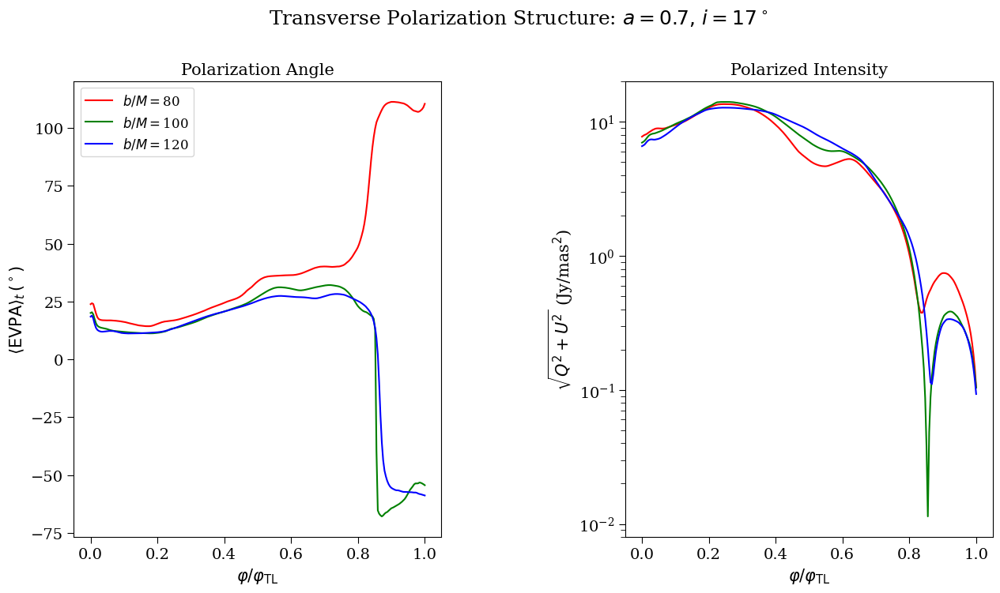

In [237]:
fig, ax = plt.subplots(1,2,figsize=(15,7.5))
colors = ['r','g','b']
betaplots = [80, 100, 120]
factor = 1
i = 0
fovfactor = ims[f][i][0][0].xdim * ims[f][i][0][0].psize * (1 / eh.RADPERUAS) / 1000.
factor *= (1. / fovfactor)**2 / (1. / ims[0][0][0][0].xdim)**2
for betaplot in betaplots:
    indplot = np.argmin(np.abs(betahere-betaplot))
    xvals = np.linspace(0, 1, len(yvalsMag[indplot,:]))
    ax[0].plot(xvals, arrangeEVPA(yvals[indplot,:])*180/np.pi, color=colors[betaplots.index(betaplot)], label=r'$b/M=$'+str(betaplot))
    ax[1].semilogy(xvals, yvalsMag[indplot,:]*factor,color=colors[betaplots.index(betaplot)], label=r'$b/M=$'+str(betaplot))
ax[0].set_xlabel(r'$\varphi/\varphi_{\rm TL}$', fontsize=15)
ax[0].set_ylabel(r'$\langle {\rm EVPA} \rangle_t \,(^\circ)$', fontsize=15)
ax[1].set_xlabel(r'$\varphi/\varphi_{\rm TL}$', fontsize=15)
ax[1].set_ylabel(r'$\sqrt{Q^2+U^2}$ (Jy/mas$^2$)', fontsize=15)
ax[0].set_title(r'Polarization Angle', fontsize=15)
ax[1].set_title(r'Polarized Intensity', fontsize=15)
ax[0].legend()
plt.subplots_adjust(wspace=0.5)
plt.suptitle(r'Transverse Polarization Structure: $a=0.7,\,i=17^\circ$',fontsize=18,y=1.005)
plt.savefig('Figures/pol_semi_transverse_a7_inc17.pdf',bbox_inches='tight', dpi=300)
plt.savefig('Figures/pol_semi_transverse_a7_inc17.png',bbox_inches='tight', dpi=300)

### $i=60^\circ$

In [27]:
def getcoordshere(alpha, beta, alphamax, betamax, nx, ny):
    alpha2 = alpha/alphamax*(nx//2)+nx//2
    beta2 = -beta/betamax*(ny//2)+ny//2
    return alpha2, beta2

npar = 2
incind = 1
i = 1
alphamax = imFOV[incind][0]/MoD/2
betamax = imFOV[incind][1]/MoD/2
nx = ims[0][incind][0][0].xdim
ny = ims[0][incind][0][0].ydim
spins = [0.5, 0.7, 0.9]
inchere = 60*np.pi/180
pminvals = [0.7, 0.7, 0.7]
pmaxvals = [0.7, 0.7, 0.7]
gammaminvals = [2.0, 2.0, 2.0]
gammamaxvals = [3.0, 3.0, 3.0]
thminvals = [80*np.pi/180, 80*np.pi/180, 80*np.pi/180]
thmaxvals = [90*np.pi/180, 90*np.pi/180, 90*np.pi/180]
betaswingminlimb = [[] for freq in freqs]
betaswingmaxlimb = [[] for freq in freqs]
betaswingminspine = [[] for freq in freqs]
betaswingmaxspine = [[] for freq in freqs]
xvals = [[] for freq in freqs]
ytopvals = [[] for freq in freqs]
ybotvals = [[] for freq in freqs]
for f in range(len(freqs)):
    for j in range(len(spins)):
        spin = spins[j]
        betawall = []
        pvals = np.linspace(pminvals[j], pmaxvals[j], npar)
        gammavals = np.linspace(gammaminvals[j], gammamaxvals[j], npar)
        vinfvals = np.sqrt(1-1/gammavals**2)
        thvals = np.linspace(thminvals[j], thmaxvals[j], npar)
        betalimbs = []
        betaspines = []
        for p in pvals:
            for vinf in vinfvals:
                for thplus in thvals:
                    spinehere = getbetaswingspine(vinf, spin, inchere, p, thplus)
                    # betaspines.append(spinehere[0])
                    betaspines.append(spinehere[1])
                    betalimbs.append(getbetaswinglimb(vinf, spin, inchere, p, thplus))
        betaswingminlimb[f].append(np.min(np.array(betalimbs)))
        betaswingmaxlimb[f].append(np.max(np.array(betalimbs)))
        betaswingminspine[f].append(np.min(np.array(betaspines)))
        betaswingmaxspine[f].append(np.max(np.array(betaspines)))
        for k in range(2):
            psitarget = (1+np.sqrt(1-spin**2))**pvals[k]*(1-np.cos(thvals[k]))
            pval = pvals[len(pvals)-1-k]
            betawallhere = np.array([betalimbfromalpha(alphavals[f][incind][i], pval, psitarget, inchere) for i in range(len(alphavals[f][incind]))])
            betawallhere[betawallhere>betamax] = betamax
            betawallhere[betawallhere<-betamax] = -betamax
            dbetadalpha = np.diff(betawallhere,prepend=0)/np.diff(alphavals[f][incind],prepend=0)
            d2betadalpha2 = np.diff(dbetadalpha,prepend=0)/np.diff(alphavals[f][incind],prepend=0)
            betawallhere[np.abs(dbetadalpha)>10] = np.nan
            betawallhere[np.abs(d2betadalpha2)>1] = np.nan
            betawall.append(betawallhere)
        xhere, yheretop = getcoordshere(alphavals[f][incind], np.maximum(betawall[0],betawall[1]), alphamax, betamax, nx, ny)
        xhere, yherebot = getcoordshere(alphavals[f][incind], np.minimum(betawall[0],betawall[1]), alphamax, betamax, nx, ny)
        xvals[f].append(xhere)
        ytopvals[f].append(yheretop)
        ybotvals[f].append(yherebot)
print(betaswingminlimb[0][2],betaswingmaxlimb[0][2])

/home/zg2027/.conda/envs/env9/lib/python3.9/site-packages/kgeo/bfields.py:509: RuntimeWarning: divide by zero encountered in scalar divide
  Bph = I / (2*np.pi*Delta*sth2)


68.53684019543277 104.4789123887567


In [ ]:
blur = False
gammasini = 1.5 # just has to be > 1 to indicate we will measure phi WRT approaching limb
endpiece = 'blur' if blur == True else ''
fovx = 900
fovy = 3000
nvarphi = 250
usefrac = True
PRall = [[] for spinind in spins]
PAall = [[] for spinind in spins]
PSall = [[] for spinind in spins]
vfacRall = [[] for spinind in spins]
vfacAall = [[] for spinind in spins]
vfacSall = [[] for spinind in spins]
bdphiRall = [[] for spinind in spins]
bdphiAall = [[] for spinind in spins]
bdphiSall = [[] for spinind in spins]

for spinind in range(len(spins)):
    for k in range(len(ims[f][i][spinind])):
        print(k)
        im = imsblur[f][i][spinind][k] if blur == True else ims[f][i][spinind][k]
        betahere = betavals[f][i]
        PR, PA, PS, vfacR, vfacA, vfacS = getavgstuff(im, betahere, arecede[f][i][spinind][k], aapproach[f][i][spinind][k], nvarphi, fovy=fovy, fovx=fovx, gammasini=gammasini)
        Reven, b2all = b2_interp(im, np.min(betahere)*MoD, np.max(betahere)*MoD, 0, 2*np.pi, len(betahere), deg=False, fovy=fovy, fovx=fovx, phifac=True)

        PRall[spinind].append(PR)
        PAall[spinind].append(PA)
        PSall[spinind].append(PS)
        
        vfacRall[spinind].append(vfacR)
        vfacAall[spinind].append(vfacA)
        vfacSall[spinind].append(vfacS)
        
        dphiR = np.diff(np.angle(vfacR)*0.5, axis=1)[:,1]
        dphiA = np.diff(np.angle(vfacA)*0.5, axis=1)[:,1]
        dphiS = np.diff(np.angle(vfacS)*0.5, axis=1)[:,1]
        
        bhereR = np.sqrt(betahere**2 + arecede[f][i][spinind][k]**2)
        bhereA = np.sqrt(betahere**2 + aapproach[f][i][spinind][k]**2)
        bhereS = np.copy(betahere)
        
        bdphiRall[spinind].append(dphiR*bhereR)
        bdphiAall[spinind].append(dphiA*bhereA)
        bdphiSall[spinind].append(dphiS*bhereS)
        
PRall = np.array(PRall)
PAall = np.array(PAall)
PSall = np.array(PSall)

vfacRall = np.array(vfacRall)
vfacAall = np.array(vfacAall)
vfacSall = np.array(vfacSall)

bdphiRall = np.array(bdphiRall)
bdphiAall = np.array(bdphiAall)
bdphiSall = np.array(bdphiSall)

directory = '/scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/'
np.save(directory+f'bdphiRall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', bdphiRall)
np.save(directory+f'bdphiAall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', bdphiAall)
np.save(directory+f'bdphiSall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', bdphiSall)
np.save(directory+f'PRall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', PRall)
np.save(directory+f'PAall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', PAall)
np.save(directory+f'PSall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', PSall)
np.save(directory+f'vfacRall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', vfacRall)
np.save(directory+f'vfacAall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', vfacAall)
np.save(directory+f'vfacSall_eta01_nx{nx}_Rhigh{Rhigh}{endpiece}_inc{str(incs[i])}.npy', vfacSall)

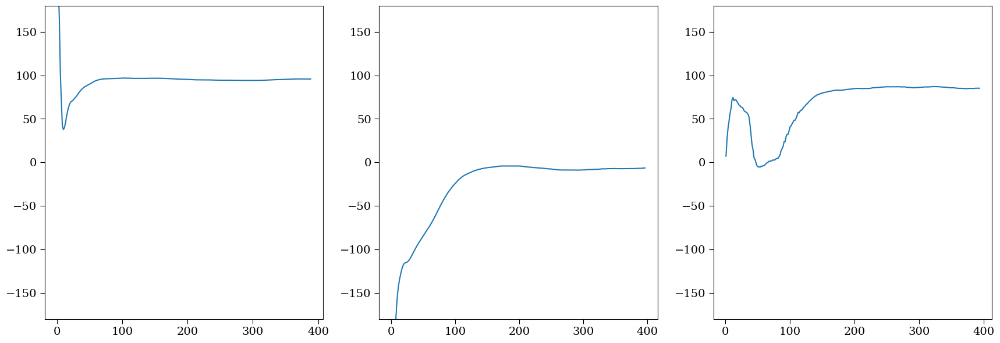

In [ ]:
#test plot for single data
fig, ax = plt.subplots(1,3,figsize=(21,7))
spinind = 0
startim = 0
endim = len(ims[f][i][spinind])
nvarphi = PRall.shape[-1]
transind = nvarphi-30
multfac = 1
sumy = 0.5*np.angle(np.sum(np.sum(PRall[spinind,startim:endim,:,transind:]*np.abs(bdphiRall[spinind,startim:endim,:,None])*vfacRall[spinind,startim:endim,:,transind:]*multfac,axis=0), axis=1))
xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=1.0, iters=2, startind=10)
ax[0].plot(xvals, arrangeEVPA(sumy)*180/np.pi+180)

startfilter = 10
sumy = 0.5*np.angle(np.sum(np.sum(PSall[spinind,startim:endim,:,(nvarphi-transind)//2:(nvarphi+transind)//2]*np.abs(bdphiSall[spinind,startim:endim,:,None])*vfacSall[spinind,startim:endim,:,(nvarphi-transind)//2:(nvarphi+transind)//2]*multfac,axis=0), axis=1))
xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=1.0, iters=2, startind=startfilter)
yvalsSpine = arrangeEVPA(sumy)*180/np.pi
ax[1].plot(xvals,yvalsSpine-180)

sumy = 0.5*np.angle(np.sum(np.sum(PAall[spinind,startim:endim,:,transind:]*np.abs(bdphiAall[spinind,startim:endim,:,None])*vfacAall[spinind,startim:endim,:,transind:]*multfac,axis=0), axis=1))
xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=5.0, iters=2, startind=startfilter)
yvals = arrangeEVPA(sumy)*180/np.pi
ax[2].plot(xvals,yvals)

for i in range(3):
    ax[i].set_ylim(-180,180)

In [ ]:
fig, ax = plt.subplots(1,4,figsize=(28,7))
nimstot = len(ims[f][i][0])
windowlength = 11 #filter window size
startfilter = 10 #minimum index to consider for outlier removal (to avoid removing early points with high curvature that are expected)
startim = 0 #first image to put in average
endim = nimstot #last image to put in average
polyorder = 3
ymin = -10
ymax = 100
betahere = np.copy(betavals[f][i])
indmatch = np.argmin(np.abs(betavals[f][i]-150))
multfac = 1 # np.exp(-1j*2*np.pi/2)
blurind = 0 # 0 for unblurred, 1 for blurred
nvarphi = PRall[blurind].shape[-1]
# transinds = [nvarphi-5, nvarphi-5, nvarphi-5]
transinds = [nvarphi-30, nvarphi-50, nvarphi-65]
# transinds = [nvarphi-30, nvarphi, nvarphi-65]
# transinds = [nvarphi-75, nvarphi-100, nvarphi-50]
colors = ['b', 'g', 'r']
labelparams = [r'$a=0.5,\,\gamma_\infty=2.5,\,p=0.7,\,\theta_+\in[60^\circ,70^\circ]$',r'$a=0.7,\,\gamma_\infty=2.45,\,p=0.7,\,\theta_+\in[60^\circ,70^\circ]$',r'$a=0.9,\,\gamma_\infty=2.5,\,p=0.68,\,\theta_+\in[60^\circ,70^\circ]$']
# transinds = [nvarphi-110, nvarphi-110, nvarphi-80]
for spinind in range(len(spins)):
    # transind = -100
    # sumy = 0.5*np.angle(np.sum(np.sum(Precede[f][i][spinind][:,:,transind:],axis=0), axis=1))
    # yvals = centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    # ax[0].plot(betahere,yvals)
    # sumy = 0.5*np.angle(np.sum(np.sum(Papproach[f][i][spinind][:,:,transind:],axis=0), axis=1))
    # yvals = centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    # ax[1].plot(betahere,yvals)
    # sumy = 0.5*np.angle(np.sum(Papproach[f][i][spinind][:,:,0],axis=0))
    # yvals = centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    # ax[2].plot(betahere,yvals)

    transind = transinds[spinind] #nvarphi-110
    sumy = 0.5*np.angle(np.sum(np.sum(PRall[spinind,startim:endim,:,transind:]*np.abs(bdphiRall[spinind,startim:endim,:,None])*vfacRall[spinind,startim:endim,:,transind:]*multfac,axis=0), axis=1))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=1.0, iters=2, startind=startfilter)
    yvals = centery(arrangeEVPA(arrangeEVPA(arrangeEVPA(sumy)))*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[0].plot(xvals,yvals,color=colors[spinind],label=labelparams[spinind])
    
    sumy = 0.5*np.angle(np.sum(np.sum(PSall[spinind,startim:endim,:,(nvarphi-transind)//2:(nvarphi+transind)//2]*np.abs(bdphiSall[spinind,startim:endim,:,None])*vfacSall[spinind,startim:endim,:,(nvarphi-transind)//2:(nvarphi+transind)//2]*multfac,axis=0), axis=1))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=1.0, iters=2, startind=startfilter)
    yvalsSpine = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,-50,50)
    ax[1].plot(xvals,yvalsSpine,color=colors[spinind],label=labelparams[spinind])
    
    #*bdphiAall[spinind,:,:,None]*vfacAall[spinind,:,:,transind:]*np.exp(-1j*2*np.pi/2)
    sumy = 0.5*np.angle(np.sum(np.sum(PAall[spinind,startim:endim,:,transind:]*np.abs(bdphiAall[spinind,startim:endim,:,None])*vfacAall[spinind,startim:endim,:,transind:]*multfac,axis=0), axis=1))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=5.0, iters=2, startind=startfilter)
    yvals = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    if spinind == 2:
        yvals -= 180
    ax[2].plot(xvals,yvals,color=colors[spinind],label=labelparams[spinind])
    ax[2].axvspan(betaswingminlimb[f][spinind], betaswingmaxlimb[f][spinind], color=colors[spinind], alpha=0.3)
    
    # Reven, argb2 = argb2_interp(imavgs[f][i][spinind], np.min(betahere)*MoD, np.max(betahere)*MoD, 0, 2*np.pi, len(betahere), deg=False, fovy=3000, fovx=1500, phifac=True)
    # yvals = centery(-arrangeEVPA(0.5*argb2)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(-arrangeEVPA(0.5*argb2)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    sumy = 0.5*np.angle(np.sum(b2all[spinind,startim:endim,:],axis=0))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=5.0, iters=2, startind=startfilter)
    yvals = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[3].plot(xvals,yvals,color=colors[spinind])
    

titles = [r'Receding Limb: $\varphi\in [0,\varphi_B]$', r'Spine: $\varphi\in [\varphi_B,\pi-\varphi_B]$', r'Approaching Limb: $\varphi\in [\pi-\varphi_B,\pi]$', r'Total: $\varphi\in [0,2\pi]$']
for j in range(4):
    ax[j].set(ylim=(-110,110), xlim=(betahere[0], betahere[-1]), xlabel=r'$b/M$', ylabel=r'$\langle {\rm EVPA} \rangle_\varphi \,(^\circ)$')
    ax[j].set_title(titles[j],fontsize=16)
# ax[0].legend()
ax[1].legend()

plt.subplots_adjust(wspace=0.3)
# plt.savefig(f'Figures/pol_semi_compareavg_Rhigh{Rhigh}_inc60_eta01.pdf',bbox_inches='tight', dpi=300)
# plt.savefig(f'Figures/pol_semi_compareavg_Rhigh{Rhigh}_inc60_eta01.png',bbox_inches='tight', dpi=300)

In [239]:
i = 1
eta = 0.01
Rhigh = 40
dirpkl = '/scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/'
endpiece = f'_eta01_nx{nx}_Rhigh{Rhigh}_inc{str(incs[i])}'
PRall = np.load(dirpkl+'PRall'+endpiece+'.npy',allow_pickle=True)
PAall = np.load(dirpkl+'PAall'+endpiece+'.npy',allow_pickle=True)
PSall = np.load(dirpkl+'PSall'+endpiece+'.npy',allow_pickle=True)
vfacRall = np.load(dirpkl+'vfacRall'+endpiece+'.npy',allow_pickle=True)
vfacAall = np.load(dirpkl+'vfacAall'+endpiece+'.npy',allow_pickle=True)
vfacSall = np.load(dirpkl+'vfacSall'+endpiece+'.npy',allow_pickle=True)
bdphiRall = np.load(dirpkl+'bdphiRall'+endpiece+'.npy',allow_pickle=True)
bdphiAall = np.load(dirpkl+'bdphiAall'+endpiece+'.npy',allow_pickle=True)
bdphiSall = np.load(dirpkl+'bdphiSall'+endpiece+'.npy',allow_pickle=True)

In [240]:
%%capture
# arg(beta2)
endpiece = ''
fovx = 900
fovy = 3000
nvarphi = 250

b2all = [[] for spinind in spins]
for spinind in range(len(spins)):
    for k in range(len(ims[f][i][spinind])):
        print(endpiece, spinind, k)
        im = imsblur[f][i][spinind][k] if endpiece == 'blur' else ims[f][i][spinind][k]
        betahere = betavals[f][i]
        Reven, b2pointhere = b2_interp(im, np.min(betahere)*MoD, np.max(betahere)*MoD, 0, 2*np.pi, len(betahere), deg=False, fovy=fovy, fovx=fovx, phifac=True)
        b2all[spinind].append(b2pointhere)
b2all = np.array(b2all)

In [53]:
def getcoordshere(alpha, beta, alphamax, betamax, nx, ny):
    alpha2 = alpha/alphamax*(nx//2)+nx//2
    beta2 = -beta/betamax*(ny//2)+ny//2
    return alpha2, beta2

npar = 2
incind = 1
i = 1
alphamax = imFOV[incind][0]/MoD/2
betamax = imFOV[incind][1]/MoD/2
nx = ims[0][incind][0][0].xdim
ny = ims[0][incind][0][0].ydim
spins = [0.5, 0.7, 0.9]
inchere = 60*np.pi/180
pminvals = [0.6, 0.6, 0.6]
pmaxvals = [0.7, 0.7, 0.7]
gammaminvals = [2.0, 2.0, 3.0]
gammamaxvals = [3.0, 3.0, 4.0]
thminvals = [80*np.pi/180, 80*np.pi/180, 80*np.pi/180]
thmaxvals = [90*np.pi/180, 90*np.pi/180, 90*np.pi/180]
betaswingminlimb = [[] for freq in freqs]
betaswingmaxlimb = [[] for freq in freqs]
betaswingminspine = [[] for freq in freqs]
betaswingmaxspine = [[] for freq in freqs]
xvals = [[] for freq in freqs]
ytopvals = [[] for freq in freqs]
ybotvals = [[] for freq in freqs]
for f in range(len(freqs)):
    for j in range(len(spins)):
        spin = spins[j]
        betawall = []
        pvals = np.linspace(pminvals[j], pmaxvals[j], npar)
        gammavals = np.linspace(gammaminvals[j], gammamaxvals[j], npar)
        vinfvals = np.sqrt(1-1/gammavals**2)
        thvals = np.linspace(thminvals[j], thmaxvals[j], npar)
        betalimbs = []
        betaspines = []
        for p in pvals:
            for vinf in vinfvals:
                for thplus in thvals:
                    spinehere = getbetaswingspine(vinf, spin, inchere, p, thplus)
                    # betaspines.append(spinehere[0])
                    betaspines.append(spinehere[1])
                    betalimbs.append(getbetaswinglimb(vinf, spin, inchere, p, thplus))
        betaswingminlimb[f].append(np.min(np.array(betalimbs)))
        betaswingmaxlimb[f].append(np.max(np.array(betalimbs)))
        betaswingminspine[f].append(np.min(np.array(betaspines)))
        betaswingmaxspine[f].append(np.max(np.array(betaspines)))
        for k in range(2):
            psitarget = (1+np.sqrt(1-spin**2))**pvals[k]*(1-np.cos(thvals[k]))
            pval = pvals[len(pvals)-1-k]
            betawallhere = np.array([betalimbfromalpha(alphavals[f][incind][i], pval, psitarget, inchere) for i in range(len(alphavals[f][incind]))])
            betawallhere[betawallhere>betamax] = betamax
            betawallhere[betawallhere<-betamax] = -betamax
            dbetadalpha = np.diff(betawallhere,prepend=0)/np.diff(alphavals[f][incind],prepend=0)
            d2betadalpha2 = np.diff(dbetadalpha,prepend=0)/np.diff(alphavals[f][incind],prepend=0)
            betawallhere[np.abs(dbetadalpha)>10] = np.nan
            betawallhere[np.abs(d2betadalpha2)>1] = np.nan
            betawall.append(betawallhere)
        xhere, yheretop = getcoordshere(alphavals[f][incind], np.maximum(betawall[0],betawall[1]), alphamax, betamax, nx, ny)
        xhere, yherebot = getcoordshere(alphavals[f][incind], np.minimum(betawall[0],betawall[1]), alphamax, betamax, nx, ny)
        xvals[f].append(xhere)
        ytopvals[f].append(yheretop)
        ybotvals[f].append(yherebot)
print(betaswingminlimb[0][2],betaswingmaxlimb[0][2])

46.746155192575145 69.97952936246489


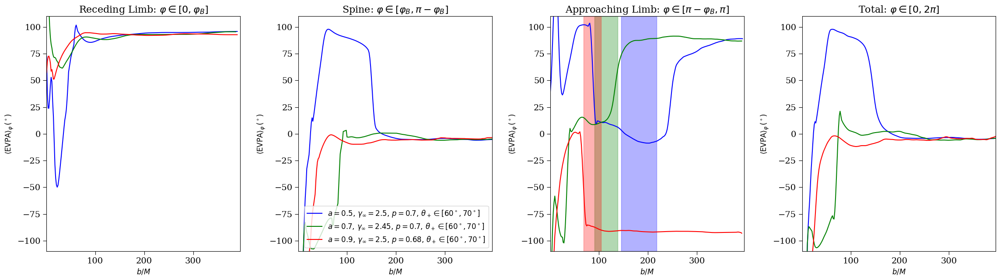

In [241]:
fig, ax = plt.subplots(1,4,figsize=(28,7))
nimstot = len(ims[f][i][0])
windowlength = 11 #filter window size
startfilter = 10 #minimum index to consider for outlier removal (to avoid removing early points with high curvature that are expected)
startim = 0 #first image to put in average
endim = nimstot #last image to put in average
polyorder = 3
ymin = -10
ymax = 100
betahere = np.copy(betavals[f][i])
indmatch = np.argmin(np.abs(betavals[f][i]-150))
multfac = 1 # np.exp(-1j*2*np.pi/2)
blurind = 0 # 0 for unblurred, 1 for blurred
nvarphi = PRall[blurind].shape[-1]
# transinds = [nvarphi-5, nvarphi-5, nvarphi-5]
transinds = [nvarphi-30, nvarphi-50, nvarphi-65]
# transinds = [nvarphi-30, nvarphi, nvarphi-65]
# transinds = [nvarphi-75, nvarphi-100, nvarphi-50]
colors = ['b', 'g', 'r']
labelparams = [r'$a=0.5,\,\gamma_\infty=2.5,\,p=0.7,\,\theta_+\in[60^\circ,70^\circ]$',r'$a=0.7,\,\gamma_\infty=2.45,\,p=0.7,\,\theta_+\in[60^\circ,70^\circ]$',r'$a=0.9,\,\gamma_\infty=2.5,\,p=0.68,\,\theta_+\in[60^\circ,70^\circ]$']
# transinds = [nvarphi-110, nvarphi-110, nvarphi-80]
for spinind in range(len(spins)):
    # transind = -100
    # sumy = 0.5*np.angle(np.sum(np.sum(Precede[f][i][spinind][:,:,transind:],axis=0), axis=1))
    # yvals = centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    # ax[0].plot(betahere,yvals)
    # sumy = 0.5*np.angle(np.sum(np.sum(Papproach[f][i][spinind][:,:,transind:],axis=0), axis=1))
    # yvals = centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    # ax[1].plot(betahere,yvals)
    # sumy = 0.5*np.angle(np.sum(Papproach[f][i][spinind][:,:,0],axis=0))
    # yvals = centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    # ax[2].plot(betahere,yvals)

    transind = transinds[spinind] #nvarphi-110
    sumy = 0.5*np.angle(np.sum(np.sum(PRall[spinind,startim:endim,:,transind:]*np.abs(bdphiRall[spinind,startim:endim,:,None])*vfacRall[spinind,startim:endim,:,transind:]*multfac,axis=0), axis=1))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=1.0, iters=2, startind=startfilter)
    yvals = centery(arrangeEVPA(arrangeEVPA(arrangeEVPA(sumy)))*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[0].plot(xvals,yvals,color=colors[spinind],label=labelparams[spinind])
    
    sumy = 0.5*np.angle(np.sum(np.sum(PSall[spinind,startim:endim,:,(nvarphi-transind)//2:(nvarphi+transind)//2]*np.abs(bdphiSall[spinind,startim:endim,:,None])*vfacSall[spinind,startim:endim,:,(nvarphi-transind)//2:(nvarphi+transind)//2]*multfac,axis=0), axis=1))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=1.0, iters=2, startind=startfilter)
    yvalsSpine = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,-50,50)
    ax[1].plot(xvals,yvalsSpine,color=colors[spinind],label=labelparams[spinind])
    
    #*bdphiAall[spinind,:,:,None]*vfacAall[spinind,:,:,transind:]*np.exp(-1j*2*np.pi/2)
    sumy = 0.5*np.angle(np.sum(np.sum(PAall[spinind,startim:endim,:,transind:]*np.abs(bdphiAall[spinind,startim:endim,:,None])*vfacAall[spinind,startim:endim,:,transind:]*multfac,axis=0), axis=1))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=5.0, iters=2, startind=startfilter)
    yvals = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    if spinind == 2:
        yvals -= 180
    ax[2].plot(xvals,yvals,color=colors[spinind],label=labelparams[spinind])
    ax[2].axvspan(betaswingminlimb[f][spinind], betaswingmaxlimb[f][spinind], color=colors[spinind], alpha=0.3)
    
    # Reven, argb2 = argb2_interp(imavgs[f][i][spinind], np.min(betahere)*MoD, np.max(betahere)*MoD, 0, 2*np.pi, len(betahere), deg=False, fovy=3000, fovx=1500, phifac=True)
    # yvals = centery(-arrangeEVPA(0.5*argb2)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(-arrangeEVPA(0.5*argb2)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    sumy = 0.5*np.angle(np.sum(b2all[spinind,startim:endim,:],axis=0))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=5.0, iters=2, startind=startfilter)
    yvals = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[3].plot(xvals,yvals,color=colors[spinind])
    

titles = [r'Receding Limb: $\varphi\in [0,\varphi_B]$', r'Spine: $\varphi\in [\varphi_B,\pi-\varphi_B]$', r'Approaching Limb: $\varphi\in [\pi-\varphi_B,\pi]$', r'Total: $\varphi\in [0,2\pi]$']
for j in range(4):
    ax[j].set(ylim=(-110,110), xlim=(betahere[0], betahere[-1]), xlabel=r'$b/M$', ylabel=r'$\langle {\rm EVPA} \rangle_\varphi \,(^\circ)$')
    ax[j].set_title(titles[j],fontsize=16)
# ax[0].legend()
ax[1].legend()

plt.subplots_adjust(wspace=0.3)
# plt.savefig(f'Figures/pol_semi_compareavg_Rhigh{Rhigh}_inc60_eta01.pdf',bbox_inches='tight', dpi=300)
# plt.savefig(f'Figures/pol_semi_compareavg_Rhigh{Rhigh}_inc60_eta01.png',bbox_inches='tight', dpi=300)

### Transverse

In [263]:
spinind = 1
i = 1
nimstot = len(ims[f][i][spinind])
startfilter = 10 #minimum index to consider for outlier removal (to avoid removing early points with high curvature that are expected)
startim = 0 #first image to put in average
endim = nimstot #last image to put in average
polyorder = 3
ymin = -10
ymax = 160
betahere = np.copy(betavals[f][i])
indmatch = np.argmin(np.abs(betavals[f][i]-100))
multfac = 1 # np.exp(-1j*2*np.pi/2)
blurind = 0 # 0 for unblurred, 1 for blurred
nvarphi = PAall.shape[-1]
# yvals = 0.5*np.angle(np.sum(PRall[spinind,startim:endim,:,:]*np.abs(bdphiRall[spinind,startim:endim,:,None])*vfacRall[spinind,startim:endim,:,:],axis=0))
# yvalsMag = 0.5*np.abs(np.sum(PRall[spinind,startim:endim,:,:]*np.abs(bdphiRall[spinind,startim:endim,:,None])*vfacRall[spinind,startim:endim,:,:],axis=0))
yvals = 0.5*np.angle(np.mean(PAall[spinind,startim:endim,:,:]*np.abs(bdphiAall[spinind,startim:endim,:,None])*vfacAall[spinind,startim:endim,:,:],axis=0))
yvalsMag = 0.5*np.abs(np.mean(PAall[spinind,startim:endim,:,:]*np.abs(bdphiAall[spinind,startim:endim,:,None])*vfacAall[spinind,startim:endim,:,:],axis=0))

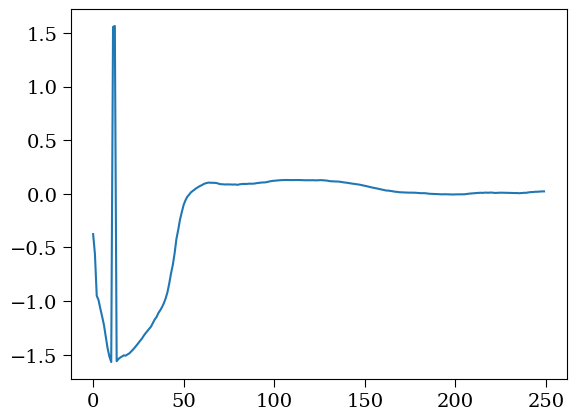

In [ ]:
plt.plot(arrangeEVPA(0.5*np.angle(np.mean(PAall[spinind,startim:endim],axis=0))[:,100])*180/np.pi)

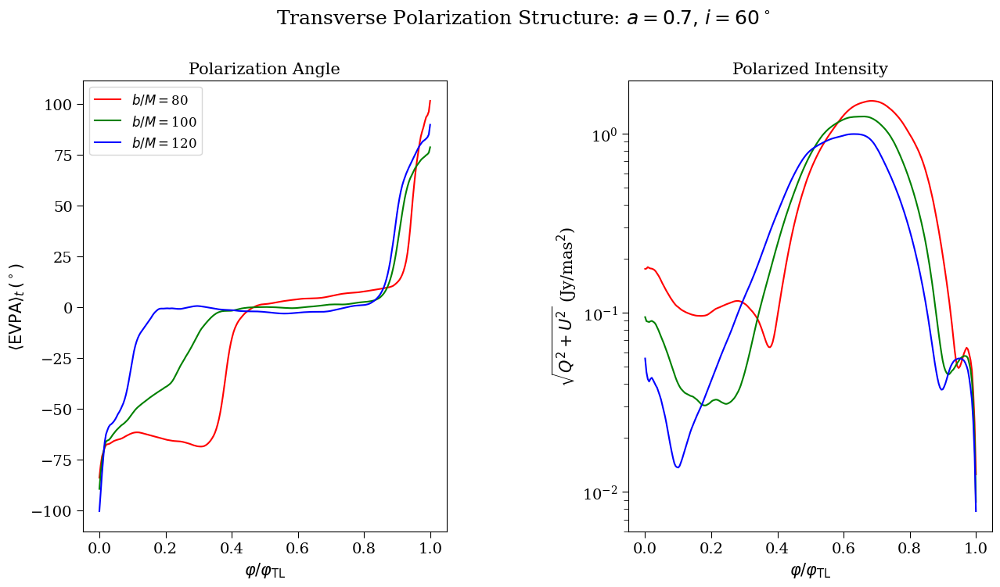

In [261]:
fig, ax = plt.subplots(1,2,figsize=(15,7.5))
colors = ['r','g','b']
betaplots = [80, 100, 120]
factor = 1
i = 0
fovfactor = ims[f][i][0][0].xdim * ims[f][i][0][0].psize * (1 / eh.RADPERUAS) / 1000.
factor *= (1. / fovfactor)**2 / (1. / ims[0][0][0][0].xdim)**2
for betaplot in betaplots:
    indplot = np.argmin(np.abs(betahere-betaplot))
    xvals = np.linspace(0, 1, len(yvalsMag[indplot,:]))
    indmatch = np.argmin(np.abs(xvals-0.7))
    ax[0].plot(xvals, centery(arrangeEVPA(yvals[indplot,:])*180/np.pi, indmatch, ymin, ymax), color=colors[betaplots.index(betaplot)], label=r'$b/M=$'+str(betaplot))
    ax[1].semilogy(xvals, yvalsMag[indplot,:]*factor,color=colors[betaplots.index(betaplot)], label=r'$b/M=$'+str(betaplot))
ax[0].set_xlabel(r'$\varphi/\varphi_{\rm TL}$', fontsize=15)
ax[0].set_ylabel(r'$\langle {\rm EVPA} \rangle_t \,(^\circ)$', fontsize=15)
ax[1].set_xlabel(r'$\varphi/\varphi_{\rm TL}$', fontsize=15)
ax[1].set_ylabel(r'$\sqrt{Q^2+U^2}$ (Jy/mas$^2$)', fontsize=15)
ax[0].set_title(r'Polarization Angle', fontsize=15)
ax[1].set_title(r'Polarized Intensity', fontsize=15)
ax[0].legend()
plt.subplots_adjust(wspace=0.5)
plt.suptitle(r'Transverse Polarization Structure: $a=0.7,\,i=60^\circ$',fontsize=18,y=1.005)
plt.savefig('Figures/pol_semi_transverse_a7_inc60.pdf',bbox_inches='tight', dpi=300)
plt.savefig('Figures/pol_semi_transverse_a7_inc60.png',bbox_inches='tight', dpi=300)

# Important Code

In [6]:
def getPlimbs(ims, offset, sumims=True):
    Precede = []
    Papproach = []
    Pspine = []
    for im in ims:
        nx = im.xdim
        ny = im.ydim
        ihere = np.flip(np.reshape(np.copy(im.imvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
        Qhere = np.flip(np.reshape(np.copy(im.qvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
        Uhere = np.flip(np.reshape(np.copy(im.uvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
        dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
        dlogI[ihere<1e-14] = 0
        limbind1 = np.argmax(dlogI[:,ny//2:],axis=1)
        limbind2 = np.argmax(dlogI[:,:ny//2],axis=1)
        limb0arr = np.array([np.arange(nx//2+limbind1[i]-offset,nx//2+limbind1[i],1) for i in range(len(limbind1))]).astype('int').T
        limb1arr = np.array([np.arange((limbind2[i]),(limbind2[i]+offset),1) for i in range(len(limbind2))]).astype('int').T
        Plimbapproach = np.array([Qhere[np.arange(len(Qhere)),i] for i in limb1arr]) + 1j*np.array([Uhere[np.arange(len(Uhere)),i] for i in limb1arr])
        Plimbrecede = np.array([Qhere[np.arange(len(Qhere)),i] for i in limb0arr]) + 1j*np.array([Uhere[np.arange(len(Uhere)),i] for i in limb0arr])
        Precede.append(Plimbrecede)
        Papproach.append(Plimbapproach)
        Pspine.append(Qhere[:,ny//2]+1j*Uhere[:,ny//2])
    Pspine = np.array(Pspine)
    Precede = np.array(Precede)
    Papproach = np.array(Papproach)
    if sumims: 
        return np.sum(Precede,axis=0)/len(Precede), np.flip(np.sum(Papproach,axis=0)/len(Papproach),axis=0), np.sum(Pspine,axis=0)/len(Pspine) #flip the approach so that we go from off limb to true limb
    else:
        return Precede, np.flip(Papproach,axis=1), Pspine #flip the approach so that we go from off limb to true limb

def getPlimbsingle(im, offset):
    nx = im.xdim
    ny = im.ydim
    ihere = np.flip(np.reshape(np.copy(im.imvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
    Qhere = np.flip(np.reshape(np.copy(im.qvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
    Uhere = np.flip(np.reshape(np.copy(im.uvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
    dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
    dlogI[ihere<1e-14] = 0
    limbind1 = np.argmax(dlogI[:,ny//2:],axis=1)
    limbind2 = np.argmax(dlogI[:,:ny//2],axis=1)
    limb0arr = np.array([np.arange(nx//2+limbind1[i]-offset,nx//2+limbind1[i],1) for i in range(len(limbind1))]).astype('int').T
    limb1arr = np.array([np.arange((limbind2[i]),(limbind2[i]+offset),1) for i in range(len(limbind2))]).astype('int').T
    Plimbapproach = np.array([Qhere[np.arange(len(Qhere)),i] for i in limb1arr]) + 1j*np.array([Uhere[np.arange(len(Uhere)),i] for i in limb1arr])
    Plimbrecede = np.array([Qhere[np.arange(len(Qhere)),i] for i in limb0arr]) + 1j*np.array([Uhere[np.arange(len(Uhere)),i] for i in limb0arr])
    Precede = np.copy(Plimbrecede)
    Papproach = np.copy(Plimbapproach)
    Pspine = (Qhere[:,ny//2]+1j*Uhere[:,ny//2])
    return Precede, np.flip(Papproach,axis=0), Pspine #flip the approach so that we go from off limb to true limb


def getangle(Pvals, start, windowlength, polyorder):
    return sig.savgol_filter(arrangeEVPA(0.5*np.angle(np.sum(Pvals[start:,:],axis=0)))*180/np.pi, windowlength, polyorder)

def centery(yvals, indmatch, ylower, yupper):
    while yvals[indmatch]<ylower:
        yvals += 180
    while yvals[indmatch]>yupper:
        yvals -= 180
    return yvals

# Image of Average

### Compute properties and show images

In [379]:
incs = np.array([17, 60])*np.pi/180 #np.array([17,45,60])*np.pi/180
spins = np.array([0.5, 0.7, 0.9])
startfitind = 50
spinstr = [str(int(round(spins*10,1))) for spins in spins]
offsets = [[1,1,2],[4,4,4]]
fovxvals = [1500, 900]
fovyvals = [3000, 3000]
ims = [[] for _ in range(len(incs))]
alphas = [[] for _ in range(len(incs))]
betas = [[] for _ in range(len(incs))]
spineevpa = [[] for _ in range(len(incs))]
cjEVPA = [[] for _ in range(len(incs))]
limbevpa = [[] for _ in range(len(incs))]
limbbadevpa = [[] for _ in range(len(incs))]
alphalimb = [[] for _ in range(len(incs))]
pvalssolve = [[] for _ in range(len(incs))]
thplusvalssolve = [[] for _ in range(len(incs))]
betalimbfit= [[] for _ in range(len(incs))]
endpieces = ['','_big','']
eta = 0.01
freq = 230
Rlow = 10
Rhigh = 40
for i in range(len(incs)):
    inc = incs[i]
    fovx = fovxvals[i]
    fovy = fovyvals[i]
    caselimb = 0 if i == 0 else 1
    for j in range(len(spins)):
        print(i,j)
        # if i == 1:
        #     offset = 1 if j == 1 else 2
        offset = offsets[i][j]
        spin = spins[j]
        if i == 0:
            imnames = sorted(glob(f'/scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a{spinstr[j]}/inc{str(int(round(inc*180/np.pi,2)))}/freq{freq}/imageofavg*Rhigh{Rhigh}*noF.h5'))
        else:
            imnames = sorted(glob(f'/scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a{spinstr[j]}/inc{str(int(round(inc*180/np.pi,2)))}/freq{freq}/imageofavg*Rhigh{Rhigh}*Zmin0.0*RF100.h5'))
        im = eh.image.load_image(imnames[0])
        im.psize = np.sqrt(fovx*fovy/im.xdim/im.ydim)*eh.RADPERUAS
        ims[i].append(im)
        alphavals = getimagecoords(im, fovx, fovy)[0][0]
        betavals = getimagecoords(im, fovx, fovy)[1][:,0]
        alphas[i].append(alphavals)
        betas[i].append(betavals)
        spineevpa[i].append(getEVPAspine(im))
        cjEVPA[i].append(getEVPAspine(im, flip=True))
        limbgood, limbbad, avals = getEVPAlimb(im, offset, caselimb, alphavals)
        limbevpa[i].append(limbgood)
        limbbadevpa[i].append(limbbad)
        alphalimb[i].append(avals) #aval=alpha on the relevant limb
        
        # (psolve, thplussolve) = getjetshape(avals[startfitind:], betavals[startfitind:], inc, spin)[0]
        # pvalssolve[i].append(psolve)
        # thplusvalssolve[i].append(thplussolve)
        # psisolve = (1+np.sqrt(1-spin**2))**psolve*(1-np.cos(thplussolve))
        # betasolve = np.array([betalimbfromalpha(avals[i], psolve, psisolve, inc) for i in range(len(avals))])
        # betalimbfit[i].append(betasolve)
        # alphalimb = alphavals[nx//2+limbind1] if limbcase == 0 else alphavals[limbind2]

0 0
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a5/inc17/freq230/imageofavg_eta0.01_Rlow10_Rhigh40_h0.05_Munit1.5e25_sigmaZ0.0_Zmin10.0_noF.h5
0 1
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a7/inc17/freq230/imageofavg_eta0.01_Rlow10_Rhigh40_h0.035_Munit1.35e25_sigmaZ0.0_Zmin10.0_noF.h5
0 2
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a9/inc17/freq230/imageofavg_eta0.01_Rlow10_Rhigh40_h0.02_Munit1.2e25_sigmaZ0.0_Zmin10.0_noF.h5
1 0
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a5/inc60/freq230/imageofavg_eta0.01_Rlow10_Rhigh40_h0.05_Munit1.5e25_sigmaZ0.0_Zmin0.0_RF100.h5


/home/zg2027/.conda/envs/env9/lib/python3.9/site-packages/ehtim/image.py:423: RuntimeWarning: invalid value encountered in divide
  chivec = 0.5 * np.angle((self.qvec + 1j * self.uvec) / self.ivec)
/tmp/ipykernel_2649870/1149490075.py:93: RuntimeWarning: invalid value encountered in log
  dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
/tmp/ipykernel_2649870/1149490075.py:93: RuntimeWarning: invalid value encountered in subtract
  dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
/tmp/ipykernel_2649870/1149490075.py:122: RuntimeWarning: invalid value encountered in log
  dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
/tmp/ipykernel_2649870/1149490075.py:122: RuntimeWarning: invalid value encountered in subtract
  dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))


1 1
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a7/inc60/freq230/imageofavg_eta0.01_Rlow10_Rhigh40_h0.035_Munit1.35e25_sigmaZ0.0_Zmin0.0_RF100.h5
1 2
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a9/inc60/freq230/imageofavg_eta0.01_Rlow10_Rhigh40_h0.02_Munit1.2e25_sigmaZ0.0_Zmin0.0_RF100.h5


clipping values less than 0 in display


/home/zg2027/.conda/envs/env9/lib/python3.9/site-packages/ehtim/image.py:3697: RuntimeWarning: invalid value encountered in divide
  m = (np.abs(qvec + 1j * uvec) / imvec).reshape(self.ydim, self.xdim)
/home/zg2027/.conda/envs/env9/lib/python3.9/site-packages/ehtim/image.py:3701: RuntimeWarning: invalid value encountered in divide
  maskb = (np.abs(qvec + 1j * uvec) / imvec).reshape(self.ydim, self.xdim) > mcut
/home/zg2027/.conda/envs/env9/lib/python3.9/site-packages/ehtim/image.py:3717: RuntimeWarning: invalid value encountered in divide
  m = (np.abs(qvec + 1j * uvec) / imvec).reshape(self.ydim, self.xdim)
/home/zg2027/.conda/envs/env9/lib/python3.9/site-packages/ehtim/image.py:3724: RuntimeWarning: invalid value encountered in divide
  voi = (vvec / imvec).reshape(self.ydim, self.xdim)


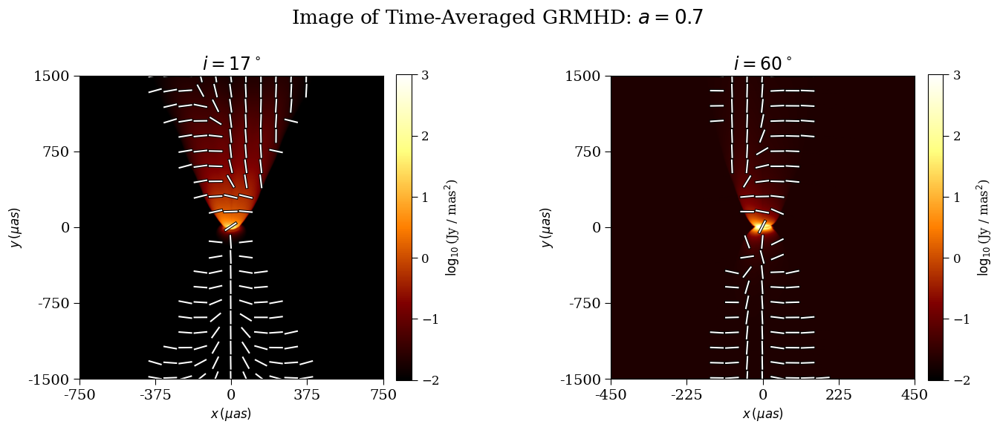

In [302]:
fig, ax = plt.subplots(1,2,figsize=(15,7.5))
dynrange = [1e5, 1e5]
bmax5 = 100
lower = [-3, -3]
upper = [2, 2]
i = 0
for j in range(2):   
    ims[j][1].display(scale='log',axis=ax[j],dynamic_range=[dynrange[j]],has_title=False,plotp=True,pcut=1e-10, cbar_unit=['Jy','mas2'], cbar_lims=[-2,3])
    # Get the current limits (pixel space)
    xmin, xmax = ax[j].get_xlim()
    ymin, ymax = ax[j].get_ylim()

    # Force exactly 5 ticks at the edges and center
    ax[j].set_xticks(np.linspace(xmin, xmax, 5))
    ax[j].set_yticks(np.linspace(ymin, ymax, 5))
    # Now assign YOUR labels to those tick locations
    ax[j].set_xticklabels(np.linspace(-fovxvals[j]//2, fovxvals[j]//2, 5).astype(int))
    ax[j].set_yticklabels(np.linspace(-fovyvals[j]//2, fovyvals[j]//2, 5).astype(int))

    # Optional: clean axis labels
    ax[j].set_xlabel(r'$x\,(\mu as)$')
    ax[j].set_ylabel(r'$y\,(\mu as)$')

fs=17
# ax[0][1].set_ylabel('')
# ax[1][1].set_ylabel('')
ax[0].set_title(r'$i=17^\circ$',fontsize=fs)
ax[1].set_title(r'$i=60^\circ$',fontsize=fs)
plt.suptitle(r'Image of Time-Averaged GRMHD: $a=0.7$',fontsize=fs+2,y=0.89)
plt.subplots_adjust(wspace=0.6)
plt.savefig('Figures/imofavg_a7_compareinc_eta01.pdf',dpi=300)
plt.savefig('Figures/imofavg_a7_compareinc_eta01.png',dpi=300)

### EVPA curves

In [380]:
npar = 2
incind = 0
alphamax = fovxvals[incind]/MoD/2
betamax = fovyvals[incind]/MoD/2
nx = ims[incind][0].xdim
ny = ims[incind][0].ydim
spins = [0.5, 0.7, 0.9]
inchere = 17*np.pi/180
pminvals = np.array([0.75, 0.75, 0.75])
pmaxvals = np.array([0.8, 0.8, 0.8])
gammaminvals = [2.0, 2.0, 2.0]
gammamaxvals = [2.0, 2.0, 2.0]
thminvalslimb = np.array([50*np.pi/180, 50*np.pi/180, 50*np.pi/180])
thmaxvalslimb = np.array([50*np.pi/180, 50*np.pi/180, 50*np.pi/180])
thminvalsspine = np.array([25*np.pi/180, 25*np.pi/180, 25*np.pi/180])
thmaxvalsspine = np.array([25*np.pi/180, 25*np.pi/180, 25*np.pi/180])
betaswingminlimb = []
betaswingmaxlimb = []
betaswingminspine = []
betaswingmaxspine = []
xvals = []
ytopvals = []
ybotvals = []
for j in range(len(spins)):
    spin = spins[j]
    betawall = []
    pvals = np.linspace(pminvals[j], pmaxvals[j], npar)
    gammavals = np.linspace(gammaminvals[j], gammamaxvals[j], npar)
    vinfvals = np.sqrt(1-1/gammavals**2)
    thvalslimb = np.linspace(thminvalslimb[j], thmaxvalslimb[j], npar)
    thvalsspine = np.linspace(thminvalsspine[j], thmaxvalsspine[j], npar)
    betalimbs = []
    betaspines = []
    betaspinesCJ = []
    for p in pvals:
        for vinf in vinfvals:
            for thind in range(len(thvalslimb)):
                spinehere = getbetaswingspine(vinf, spin, inchere, p, thvalsspine[thind])
                # betaspines.append(spinehere[0])
                betaspines.append(spinehere[1])
                betalimbs.append(getbetaswinglimb(vinf, spin, inchere, p, thvalslimb[thind]))
    betaswingminlimb.append(np.min(np.array(betalimbs)))
    betaswingmaxlimb.append(np.max(np.array(betalimbs)))
    betaswingminspine.append(np.min(np.array(betaspines)))
    betaswingmaxspine.append(np.max(np.array(betaspines)))

/home/zg2027/.conda/envs/env9/lib/python3.9/site-packages/kgeo/bfields.py:509: RuntimeWarning: divide by zero encountered in scalar divide
  Bph = I / (2*np.pi*Delta*sth2)


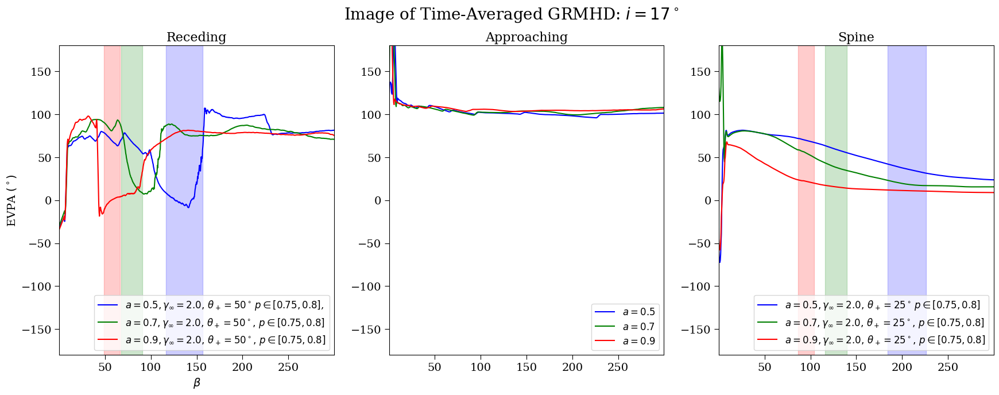

In [381]:
fig, ax = plt.subplots(1,3,figsize=(21,7))
usesum = False
windowlength = 11
polyorder = 3
ymin = -90
ymax = 90
colors = ['b','g','r']
betastar = [200, 130, np.nan]
endinds = (np.ones(3)*len(betas[incind][0])-1).astype('int')
incind = 0
labelparams1 = [r'$a=0.5$', r'$a=0.7$', r'$a=0.9$']
labelparams2 = [r'$a=0.5,\gamma_\infty=2.0,\,\theta_+=50^\circ\,p\in[0.75,0.8]$,',r'$a=0.7,\gamma_\infty=2.0,\,\theta_+=50^\circ,\, p\in[0.75,0.8]$',r'$a=0.9,\gamma_\infty=2.0,\,\theta_+=50^\circ,\, p\in[0.75,0.8]$']
labelparams3 = [r'$a=0.5,\gamma_\infty=2.0,\,\theta_+=25^\circ\,p\in[0.75,0.8]$',r'$a=0.7,\gamma_\infty=2.0,\,\theta_+=25^\circ,\,p\in[0.75,0.8]$',r'$a=0.9,\gamma_\infty=2.0,\,\theta_+=25^\circ,\,p\in[0.75,0.8]$']
indmatch = np.argmin(np.abs(betas[incind][0]-100))
alpha = 0.2
for spinind in range(3):
    endind = endinds[spinind]
    # ax[0].plot(betavals[incind], centery(sig.savgol_filter(arrangeEVPA(circrecede[0][spinind][:,colinds[spinind]])*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)+180,color=colors[spinind], label=f'a={spins[spinind]}')
    yvals = centery(arrangeEVPA(limbevpa[incind][spinind])*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(limbevpa[incind][spinind])*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    endind = np.argmin(np.abs(betas[incind][spinind]-300))
    ax[0].plot(betas[incind][spinind][:endind], yvals[:endind],color=colors[spinind],label=labelparams2[spinind])
    ax[0].axvspan(betaswingminlimb[spinind], betaswingmaxlimb[spinind], color=colors[spinind], alpha=alpha)
    yvals = centery(arrangeEVPA(limbbadevpa[incind][spinind])*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(limbbadevpa[incind][spinind])*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)+180
    ax[1].plot(betas[incind][spinind][:endind], yvals[:endind],color=colors[spinind], label=labelparams1[spinind])
    yvals = centery(arrangeEVPA(spineevpa[incind][spinind])*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(spineevpa[incind][spinind])*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[2].plot(betas[incind][spinind][:endind], yvals[:endind],color=colors[spinind], label=labelparams3[spinind])
    ax[2].axvspan(betaswingminspine[spinind], betaswingmaxspine[spinind], color=colors[spinind], alpha=alpha)
spinind = 2
for i in range(3):
    ax[i].set(xlim=(betas[incind][0][0],betas[incind][0][endind]),ylim=(-180,180))
    ax[i].legend(loc='lower right')
# ax[0].legend(fontsize=12)
ax[0].legend(fontsize=12,loc='lower right')
ax[0].set_title('Receding', fontsize=16)
ax[0].set_ylabel(r'EVPA $(^\circ)$', fontsize=14)
ax[0].set_xlabel(r'$\beta$', fontsize=14)
ax[1].set_title('Approaching', fontsize=16)
ax[2].set_title('Spine', fontsize=16)
plt.suptitle(r'Image of Time-Averaged GRMHD: $i=17^\circ$',fontsize=20)
plt.savefig('Figures/pol_imofavg_inc17_eta01.pdf',bbox_inches='tight', dpi=300)
plt.savefig('Figures/pol_imofavg_compare_inc17_eta01.png',bbox_inches='tight', dpi=300)

### $i=60^\circ$

In [382]:
incs = np.array([60, 60])*np.pi/180 #np.array([17,45,60])*np.pi/180
spins = np.array([0.5, 0.7, 0.9])
startfitind = 50
spinstr = [str(int(round(spins*10,1))) for spins in spins]
offsets = [[1,1,1],[2,2,2]]
fovxvals = [1500, 900]
fovyvals = [3000, 3000]
ims = [[] for _ in range(len(incs))]
alphas = [[] for _ in range(len(incs))]
betas = [[] for _ in range(len(incs))]
spineevpa = [[] for _ in range(len(incs))]
cjEVPA = [[] for _ in range(len(incs))]
limbevpa = [[] for _ in range(len(incs))]
limbbadevpa = [[] for _ in range(len(incs))]
alphalimb = [[] for _ in range(len(incs))]
pvalssolve = [[] for _ in range(len(incs))]
thplusvalssolve = [[] for _ in range(len(incs))]
betalimbfit= [[] for _ in range(len(incs))]
endpieces = ['','_big','']
eta = 0.01
freq = 230
Rlow = 10
Rhigh = 40
for i in range(len(incs)):
    inc = incs[i]
    fovx = fovxvals[i]
    fovy = fovyvals[i]
    caselimb = 0 if i == 0 else 1
    for j in range(len(spins)):
        print(i,j)
        # if i == 1:
        #     offset = 1 if j == 1 else 2
        offset = offsets[i][j]
        spin = spins[j]
        if i < 0:
            imnames = sorted(glob(f'/scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a{spinstr[j]}/inc{str(int(round(inc*180/np.pi,2)))}/freq{freq}/imageofavg*Rhigh{Rhigh}*all.h5'))
        else:
            imnames = sorted(glob(f'/scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a{spinstr[j]}/inc{str(int(round(inc*180/np.pi,2)))}/freq{freq}/imageofavg*Rhigh{Rhigh}*Zmin0.0*RF100.h5'))
        im = eh.image.load_image(imnames[0])
        im.psize = np.sqrt(fovx*fovy/im.xdim/im.ydim)*eh.RADPERUAS
        ims[i].append(im)
        alphavals = getimagecoords(im, fovx, fovy)[0][0]
        betavals = getimagecoords(im, fovx, fovy)[1][:,0]
        alphas[i].append(alphavals)
        betas[i].append(betavals)
        spineevpa[i].append(getEVPAspine(im))
        cjEVPA[i].append(getEVPAspine(im, flip=True))
        limbgood, limbbad, avals = getEVPAlimb(im, offset, caselimb, alphavals)
        limbevpa[i].append(limbgood)
        limbbadevpa[i].append(limbbad)
        alphalimb[i].append(avals) #aval=alpha on the relevant limb
        
        # (psolve, thplussolve) = getjetshape(avals[startfitind:], betavals[startfitind:], inc, spin)[0]
        # pvalssolve[i].append(psolve)
        # thplusvalssolve[i].append(thplussolve)
        # psisolve = (1+np.sqrt(1-spin**2))**psolve*(1-np.cos(thplussolve))
        # betasolve = np.array([betalimbfromalpha(avals[i], psolve, psisolve, inc) for i in range(len(avals))])
        # betalimbfit[i].append(betasolve)
        # # alphalimb = alphavals[nx//2+limbind1] if limbcase == 0 else alphavals[limbind2]

0 0
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a5/inc60/freq230/imageofavg_eta0.01_Rlow10_Rhigh40_h0.05_Munit1.5e25_sigmaZ0.0_Zmin0.0_RF100.h5


/home/zg2027/.conda/envs/env9/lib/python3.9/site-packages/ehtim/image.py:423: RuntimeWarning: invalid value encountered in divide
  chivec = 0.5 * np.angle((self.qvec + 1j * self.uvec) / self.ivec)
/tmp/ipykernel_2649870/1149490075.py:93: RuntimeWarning: invalid value encountered in log
  dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
/tmp/ipykernel_2649870/1149490075.py:93: RuntimeWarning: invalid value encountered in subtract
  dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
/tmp/ipykernel_2649870/1149490075.py:122: RuntimeWarning: invalid value encountered in log
  dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
/tmp/ipykernel_2649870/1149490075.py:122: RuntimeWarning: invalid value encountered in subtract
  dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))


0 1
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a7/inc60/freq230/imageofavg_eta0.01_Rlow10_Rhigh40_h0.035_Munit1.35e25_sigmaZ0.0_Zmin0.0_RF100.h5
0 2
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a9/inc60/freq230/imageofavg_eta0.01_Rlow10_Rhigh40_h0.02_Munit1.2e25_sigmaZ0.0_Zmin0.0_RF100.h5
1 0
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a5/inc60/freq230/imageofavg_eta0.01_Rlow10_Rhigh40_h0.05_Munit1.5e25_sigmaZ0.0_Zmin0.0_RF100.h5
1 1
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a7/inc60/freq230/imageofavg_eta0.01_Rlow10_Rhigh40_h0.035_Munit1.35e25_sigmaZ0.0_Zmin0.0_RF100.h5
1 2
Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a9/inc60/freq230/imageofavg_eta0.01_Rlow10_Rhigh40_h0.02_Munit1.2e25_sigmaZ0.0_Zmin0.0_RF100.h5


In [384]:
npar = 2
incind = 1
alphamax = fovxvals[incind]/MoD/2
betamax = fovyvals[incind]/MoD/2
nx = ims[incind][0].xdim
ny = ims[incind][0].ydim
spins = [0.5, 0.7, 0.9]
inchere = 60*np.pi/180
pminvals = [0.5, 0.5, 0.1]
pmaxvals = [0.65, 0.65, 0.3]
gammaminvals = [2.0, 2.0, 2.0]
gammamaxvals = [2.0, 2.0, 2.0]
thminvalslimb = [50*np.pi/180, 50*np.pi/180, 50*np.pi/180]
thmaxvalslimb = [50*np.pi/180, 50*np.pi/180, 50*np.pi/180]
thminvalsspine = [25*np.pi/180, 25*np.pi/180, 25*np.pi/180]
thmaxvalsspine = [25*np.pi/180, 25*np.pi/180, 25*np.pi/180]
betaswingminlimb = []
betaswingmaxlimb = []
betaswingminspine = []
betaswingmaxspine = []
xvals = []
ytopvals = []
ybotvals = []
for j in range(len(spins)):
    spin = spins[j]
    betawall = []
    pvals = np.linspace(pminvals[j], pmaxvals[j], npar)
    gammavals = np.linspace(gammaminvals[j], gammamaxvals[j], npar)
    vinfvals = np.sqrt(1-1/gammavals**2)
    thvalslimb = np.linspace(thminvalslimb[j], thmaxvalslimb[j], npar)
    thvalsspine = np.linspace(thminvalsspine[j], thmaxvalsspine[j], npar)
    betalimbs = []
    betaspines = []
    for p in pvals:
        for vinf in vinfvals:
            for i in range(len(thvalslimb)):
                spinehere = getbetaswingspine(vinf, spin, inchere, p, thvalsspine[i])
                # betaspines.append(spinehere[0])
                betaspines.append(spinehere[1])
                betalimbs.append(getbetaswinglimb(vinf, spin, inchere, p, thvalslimb[i]))
    betaswingminlimb.append(np.min(np.array(betalimbs)))
    betaswingmaxlimb.append(np.max(np.array(betalimbs)))
    betaswingminspine.append(np.min(np.array(betaspines)))
    betaswingmaxspine.append(np.max(np.array(betaspines)))

/home/zg2027/.conda/envs/env9/lib/python3.9/site-packages/kgeo/bfields.py:509: RuntimeWarning: divide by zero encountered in scalar divide
  Bph = I / (2*np.pi*Delta*sth2)


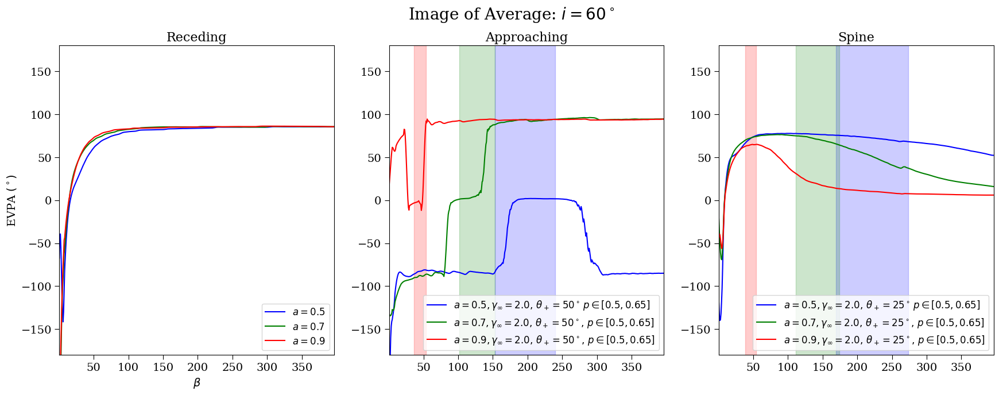

In [385]:
fig, ax = plt.subplots(1,3,figsize=(21,7))
usesum = False
windowlength = 11
polyorder = 3
ymin = -90
ymax = 90
colors = ['b','g','r']
betastar = [200, 130, np.nan]
endinds = (np.ones(3)*(len(betas[incind][0])-1)).astype('int')
incind = 1
labelparams1 = [r'$a=0.5$', r'$a=0.7$', r'$a=0.9$']
labelparams2 = [r'$a=0.5,\gamma_\infty=2.0,\,\theta_+=50^\circ\,p\in[0.5,0.65]$',r'$a=0.7,\gamma_\infty=2.0,\,\theta_+=50^\circ,\,p\in[0.5,0.65]$',r'$a=0.9,\gamma_\infty=2.0,\,\theta_+=50^\circ,\,p\in[0.5,0.65]$']
labelparams3 = [r'$a=0.5,\gamma_\infty=2.0,\,\theta_+=25^\circ\,p\in[0.5,0.65]$',r'$a=0.7,\gamma_\infty=2.0,\,\theta_+=25^\circ,\,p\in[0.5,0.65]$',r'$a=0.9,\gamma_\infty=2.0,\,\theta_+=25^\circ,\,p\in[0.5,0.65]$']
indmatch = np.argmin(np.abs(betas[incind][0]-100))
alpha = 0.2
for spinind in range(3):
    endind = endinds[spinind]
    yvals = centery(sig.savgol_filter(arrangeEVPA(limbbadevpa[incind][spinind])*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    endind = np.argmin(np.abs(betas[incind][spinind]-400))
    ax[0].plot(betas[incind][spinind][:endind], yvals[:endind],color=colors[spinind],label=labelparams1[spinind])
    yvals = centery(sig.savgol_filter(arrangeEVPA(limbevpa[incind][spinind])*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    if spinind == 2:
        yvals += 180
    ax[1].plot(betas[incind][spinind][:endind], yvals[:endind],color=colors[spinind],label=labelparams2[spinind])
    ax[1].axvspan(betaswingminlimb[spinind], betaswingmaxlimb[spinind], color=colors[spinind], alpha=alpha)
    yvals = centery(sig.savgol_filter(arrangeEVPA(spineevpa[incind][spinind])*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[2].plot(betas[incind][spinind][:endind], yvals[:endind],color=colors[spinind], label=labelparams3[spinind])
    # ax[0].axvspan(betaswingminlimb[spinind], betaswingmaxlimb[spinind], color=colors[spinind], alpha=0.3,label=labelparams[spinind])
    ax[2].axvspan(betaswingminspine[spinind], betaswingmaxspine[spinind], color=colors[spinind], alpha=alpha)
    # ax[0].axvspan(betaswingminlimb[spinind], betaswingmaxlimb[spinind], color=colors[spinind], alpha=0.3, label=labelparams[spinind])
    # ax[2].axvspan(betaswingminspine[spinind], betaswingmaxspine[spinind], color=colors[spinind], alpha=0.3, label=labelparams[spinind])
spinind = 2
for i in range(3):
    ax[i].set(xlim=(betas[incind][0][0],betas[incind][0][np.max(endinds)]),ylim=(-180,180))
    ax[i].legend(fontsize=12,loc='lower right')
# ax[0].legend(fontsize=12)
ax[0].set_title('Receding', fontsize=16)
ax[0].set_ylabel(r'EVPA $(^\circ)$', fontsize=14)
ax[0].set_xlabel(r'$\beta$', fontsize=14)
ax[1].set_title('Approaching', fontsize=16)
ax[2].set_title('Spine', fontsize=16)
plt.suptitle(r'Image of Average: $i=60^\circ$',fontsize=20)

plt.savefig('Figures/pol_imofavg_inc60_eta01.pdf',bbox_inches='tight', dpi=300)
plt.savefig('Figures/pol_imofavg_compare_inc60_eta01.png',bbox_inches='tight', dpi=300)

### Counter-Jet

In [125]:
%%capture
# NORMAL
#IM FOV'S (IN ORDER OF INCLINATION) [(1500, 3000), (2400, 8000), (900, 3000)]
fovx = [1500, 900, 900]
fovy = [3000, 3000, 3000]
spinstr = ['5','7','9']
incs = [17, 60, 90]
imnames = [[sorted(glob(f'/scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a{spin}/inc{inc}/freq230/*noF*.h5')) for spin in spinstr] for inc in incs]
ims = []
for i in range(len(incs)):
    ims.append([])
    for j in range(len(spinstr)):
        ims[i].append(eh.image.load_image(imnames[i][j][0]))
# coords per (freq, inc) using spin index 0, image index 0 as a representative
betavals  = [getimagecoords(ims[i][0], fovx[i], fovy[i])[1][:, 0] for i in range(len(incs))]
alphavals = [getimagecoords(ims[i][0], fovx[i], fovy[i])[0][0] for i in range(len(incs))]

In [126]:
npar = 2
spins = [0.5, 0.7, 0.9]
pminvals = [0.7, 0.7, 0.7]
pmaxvals = [0.7, 0.7, 0.7]
gammaminvals = [1000, 1000, 1000]
gammamaxvals = [1000, 1000, 1000]
thminvals = [20*np.pi/180, 20*np.pi/180, 30*np.pi/180]
thmaxvals = [30*np.pi/180, 30*np.pi/180, 60*np.pi/180]
betaswingminspineCJ = [[] for i in range(len(incs))]
betaswingmaxspineCJ = [[] for i in range(len(incs))]

for i in range(len(incs)):
    inchere = incs[i]*np.pi/180

    for j in range(len(spins)):
        spin = spins[j]
        pvals = np.linspace(pminvals[j], pmaxvals[j], npar)
        gammavals = np.linspace(gammaminvals[j], gammamaxvals[j], npar)
        vinfvals = np.sqrt(1-1/gammavals**2)
        thvals = np.linspace(thminvals[j], thmaxvals[j], npar)
        betaspinesCJ = []

        for p in pvals:
            for vinf in vinfvals:
                for thplus in thvals:
                    spineCJhere = getbetaswingCJ(
                        vinf, spin, inchere, p, thplus
                    )

                    for betaCJ in spineCJhere:
                        if betaCJ < 0:
                            betaspinesCJ.append(-betaCJ)

        betaswingminspineCJ[i].append(np.min(np.array(betaspinesCJ)))
        betaswingmaxspineCJ[i].append(np.max(np.array(betaspinesCJ)))
print(betaswingmaxspineCJ)

[[6.448586473953743, 4.225485165160947, 2.3527450397347645], [103.12392355566757, 64.71252781758919, 28.060272344660852], [264.8703577803059, 165.1649820839249, 68.59561908541608]]


/home/zg2027/.conda/envs/env9/lib/python3.9/site-packages/kgeo/bfields.py:509: RuntimeWarning: divide by zero encountered in scalar divide
  Bph = I / (2*np.pi*Delta*sth2)


In [127]:
imtest90 = eh.image.load_image('/scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a7/inc90/freq230/imageofavg_eta0.01_Rlow10_Rhigh40_h0.035_Munit1.35e25_sigmaZ0.0_Zmin10.0_all.h5')

Loading hdf5 image:  /scratch/gpfs/QUATAERT/zg2027/GRMHD/ipole_ims/a7/inc90/freq230/imageofavg_eta0.01_Rlow10_Rhigh40_h0.035_Munit1.35e25_sigmaZ0.0_Zmin10.0_all.h5


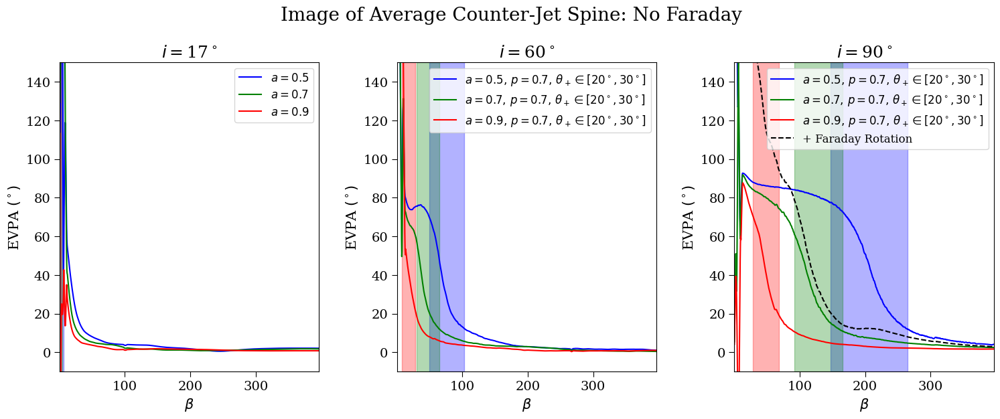

In [208]:
fig, ax = plt.subplots(1,3,figsize=(18,6))
windowlength = 11
polyorder = 3
colors = ['b','g','r']
labelparams1 = [r'$a=0.5$', r'$a=0.7$', r'$a=0.9$']
labelparams2 = [r'$a=0.5,\,p=0.7,\,\theta_+\in[20^\circ,30^\circ]$',r'$a=0.7,\,p=0.7,\,\theta_+\in[20^\circ,30^\circ]$',r'$a=0.9,\,p=0.7,\,\theta_+\in[20^\circ,30^\circ]$']
for i in range(len(incs)):
    for j in range(len(spinstr)):
        evpacj = np.reshape(
            ims[i][j].evpavec,
            (ims[i][j].ydim, ims[i][j].xdim)
        )[ims[i][j].ydim//2:, ims[i][j].xdim//2+2]

        labelhere = labelparams1[j] if i == 0 else labelparams2[j]
        ax[i].plot(
            betavals[i],
            centery(sig.savgol_filter(arrangeEVPA(evpacj)*180/np.pi, windowlength, polyorder), 100, -80, 100),
            color=colors[j],
            label=labelhere
        )

        ax[i].axvspan(
            betaswingminspineCJ[i][j],
            betaswingmaxspineCJ[i][j],
            color=colors[j],
            alpha=0.3
        )

        if j == len(spinstr)-1 and i == 2:
            evpacj = np.reshape(
            imtest90.evpavec,
            (imtest90.ydim, imtest90.xdim)
            )[imtest90.ydim//2:, imtest90.xdim//2+2]

            ax[i].plot(
                betavals[i],
                centery(sig.savgol_filter(arrangeEVPA(evpacj)*180/np.pi, windowlength, polyorder), 100, -80, 100)+180, 'k--', label=r'+ Faraday Rotation'
            )

    ax[i].set(
        xlim=(betavals[i][0], betavals[i][-1]),
        ylim=(-10, 150),
        ylabel=r'EVPA $(^\circ)$'
    )
    ax[i].set_xlabel(r'$\beta$', fontsize=15)
    ax[i].set_ylabel(r'EVPA $(^\circ)$', fontsize=15)
    ax[i].set_title(r'$i=$'+str(incs[i])+'$^\circ$', fontsize=18)
    ax[i].legend(loc='upper right')

ax[0].legend(fontsize=12)
plt.subplots_adjust(wspace=0.3)
plt.suptitle(
    'Image of Average Counter-Jet Spine: No Faraday',
    fontsize=20,
    y=1.02
)

plt.savefig('Figures/pol_imofavg_CJspine.pdf', bbox_inches='tight', dpi=300)
plt.savefig('Figures/pol_imofavg_CJspine.png', bbox_inches='tight', dpi=300)

In [165]:
pwd

'/home/zg2027/ipole_anisotropy/ipole/highresstuff'

# Comparing to Others

In [73]:
hvals = [0.05, 0.035, 0.020] #h for different spins
Munitvals = ['1.5e25', '1.35e25', '1.2e25']
j = 1
imnames = [f'imageofavg_eta0.01_Rlow10_Rhigh40_h{hvals[j]}_Munit{Munitvals[j]}_sigmaZ0.0_Zmin10.0.h5',f'imageofavg_eta0.01_Rlow10_Rhigh40_h{hvals[j]}_Munit{Munitvals[j]}_sigmaZ300.0_Zmin10.0.h5',f'imageofavg_eta1.0_Rlow10_Rhigh40_h{hvals[j]}_Munit{Munitvals[j]}_sigmaZ0.0_Zmin10.0.h5',f'imageofavg_eta0.01_Rlow10_Rhigh160_h{hvals[j]}_Munit{Munitvals[j]}_sigmaZ0.0_Zmin10.0.h5','imageofavg_blur20_eta0.01_Rlow10_Rhigh40_h0.035_Munit1.35e25_sigmaZ0.0_Zmin10.0.fits']
imnames = [f'/n/netscratch/bhi/Lab/zgelles/ipole_ims/a{spinstr[j]}/inc17/freq230/smallres/{name}' for name in imnames]
ims = [eh.image.load_image(imname) for imname in imnames]
alphavals = getimagecoords(ims[0], fovx[0], fovy[0])[0][0]
betavals = getimagecoords(ims[0], fovx[0], fovy[0])[1][:, 0]

arecede = []
aapproach = []
for i in range(len(ims)):
    aavgrecede, aavgapproach = getalphalimb(ims[i], alphavals, flip = False)
    arecede.append(aavgrecede)
    aapproach.append(aavgapproach)

Loading hdf5 image:  /n/netscratch/bhi/Lab/zgelles/ipole_ims/a7/inc17/freq230/smallres/imageofavg_eta0.01_Rlow10_Rhigh40_h0.035_Munit1.35e25_sigmaZ0.0_Zmin10.0.h5
   assuming source M87: ra 12.514 hr: dec 12.391 deg
Loading hdf5 image:  /n/netscratch/bhi/Lab/zgelles/ipole_ims/a7/inc17/freq230/smallres/imageofavg_eta0.01_Rlow10_Rhigh40_h0.035_Munit1.35e25_sigmaZ300.0_Zmin10.0.h5
   assuming source M87: ra 12.514 hr: dec 12.391 deg
Loading hdf5 image:  /n/netscratch/bhi/Lab/zgelles/ipole_ims/a7/inc17/freq230/smallres/imageofavg_eta1.0_Rlow10_Rhigh40_h0.035_Munit1.35e25_sigmaZ0.0_Zmin10.0.h5
   assuming source M87: ra 12.514 hr: dec 12.391 deg
Loading hdf5 image:  /n/netscratch/bhi/Lab/zgelles/ipole_ims/a7/inc17/freq230/smallres/imageofavg_eta0.01_Rlow10_Rhigh160_h0.035_Munit1.35e25_sigmaZ0.0_Zmin10.0.h5
   assuming source M87: ra 12.514 hr: dec 12.391 deg
Loading fits image:  /n/netscratch/bhi/Lab/zgelles/ipole_ims/a7/inc17/freq230/smallres/imageofavg_blur20_eta0.01_Rlow10_Rhigh40_h0.035

/tmp/ipykernel_1147320/4229313243.py:51: RuntimeWarning: invalid value encountered in log
  dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
/tmp/ipykernel_1147320/4229313243.py:51: RuntimeWarning: invalid value encountered in subtract
  dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))


In [ ]:
gammasini = 0.5 #just <1 to indicate we will be plotting WRT receding limb
fovx = 1500
fovy = 3000
nvarphi = 250
usefrac = True
PRall = []
PAall = []
PSall = []
vfacRall = []
vfacAall = []
vfacSall = []
bdphiRall = []
bdphiAall = []
bdphiSall = []
argb2here = []
Revenhere = []

for i in range(len(ims)):
    im = ims[i]
    betahere = np.copy(betavals)
    PR, PA, PS, vfacR, vfacA, vfacS = getavgstuff(im, betahere, arecede[i], aapproach[i], nvarphi, fovy=fovy, fovx=fovx, gammasini=gammasini)
    Reven, argb2all = argb2_interp(im, np.min(betahere)*MoD, np.max(betahere)*MoD, 0, 2*np.pi, len(betahere), deg=True, fovy=fovy, fovx=fovx, phifac=True)
    Revenhere.append(Reven)
    argb2here.append(argb2all)

    PRall.append(PR*np.abs(dphiR*bhereR)[:,None]*vfacR)
    PAall.append(PA*np.abs(dphiA*bhereA)[:,None]*vfacA)
    PSall.append(PS*np.abs(dphiS*bhereS)[:,None]*vfacS)
    
PRall = np.array(PRall)
PAall = np.array(PAall)
PSall = np.array(PSall)
Revenhere = np.array(Revenhere)
argb2here = np.array(argb2here)

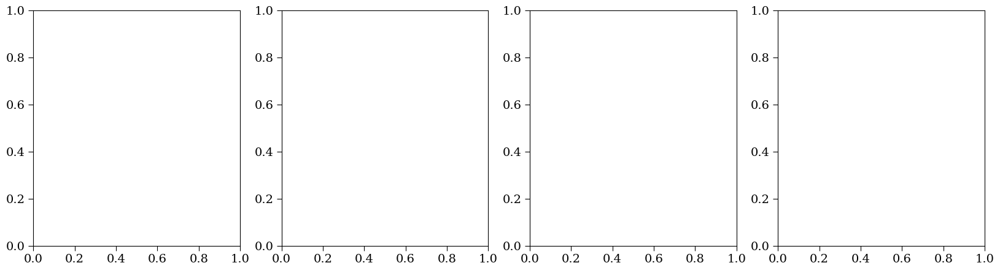

In [ ]:
fig, ax = plt.subplots(1,4,figsize=(28,7))
windowlength = None #filter window size
startfilter = 10 #minimum index to consider for outlier removal (to avoid removing early points with high curvature that are expected)
startim = 0 #first image to put in average
endim = nimstot #last image to put in average
labels = ['Original', r'$\sigma_{\rm cut}=300/\sqrt{r}$', r'$\eta=1.0$', r'$R_{\rm high}=160$, $R_{\rm max,Faraday}=100$', r'Blurred with 20$\mu$as Kernel']
polyorder = 3
ymin = -10
ymax = 160
betahere = np.copy(betavals[f][i])
indmatch = np.argmin(np.abs(betavals[f][i]-100))
multfac = 1 # np.exp(-1j*2*np.pi/2)
blurind = 0 # 0 for unblurred, 1 for blurred
nvarphi = PRall[blurind].shape[-1]
transinds = [nvarphi-53, nvarphi-57, nvarphi-40]
colors = ['b', 'g', 'r']
labelparams = [r'$a=0.5,\,\gamma_\infty=2.4,\,p=0.7,\,\theta_+\in[60^\circ,70^\circ]$',r'$a=0.7,\,\gamma_\infty=2.45,\,p=0.7,\,\theta_+\in[60^\circ,70^\circ]$',r'$a=0.9,\,\gamma_\infty=2.5,\,p=0.67,\,\theta_+\in[60^\circ,70^\circ]$']
transinds = [nvarphi-110]
for imind in range(1):
    transind = transinds[spinind] #nvarphi-110
    sumy = 0.5*np.angle*np.sum(PRall[imind,:,transind:], axis=-1)
    yvals = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[0].plot(xvals,yvals,color=colors[spinind],label=labelparams[spinind])
    ax[0].axvspan(betaswingminlimb[f][spinind], betaswingmaxlimb[f][spinind], color=colors[spinind], alpha=0.3)
    
    sumy = 0.5*np.angle(np.sum(np.sum(PSall[blurind][spinind,startim:endim,:,(nvarphi-transind)//2:(nvarphi+transind)//2]*np.abs(bdphiSall[blurind][spinind,startim:endim,:,None])*vfacSall[blurind][spinind,startim:endim,:,(nvarphi-transind)//2:(nvarphi+transind)//2]*multfac,axis=0), axis=1))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=1.0, iters=2, startind=startfilter)
    yvalsSpine = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[1].plot(xvals,yvalsSpine,color=colors[spinind],label=labelparams[spinind])
    
    #*bdphiAall[spinind,:,:,None]*vfacAall[spinind,:,:,transind:]*np.exp(-1j*2*np.pi/2)
    sumy = 0.5*np.angle(np.sum(np.sum(PAall[blurind][spinind,startim:endim,:,transind:]*np.abs(bdphiAall[blurind][spinind,startim:endim,:,None])*vfacAall[blurind][spinind,startim:endim,:,transind:]*multfac,axis=0), axis=1))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=5.0, iters=2, startind=startfilter)
    yvals = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[2].plot(xvals,yvals,color=colors[spinind])
    
    # Reven, argb2 = argb2_interp(imavgs[f][i][spinind], np.min(betahere)*MoD, np.max(betahere)*MoD, 0, 2*np.pi, len(betahere), deg=False, fovy=3000, fovx=1500, phifac=True)
    # yvals = centery(-arrangeEVPA(0.5*argb2)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(-arrangeEVPA(0.5*argb2)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    sumy = 0.5*np.angle(np.sum(b2all[blurind][spinind,startim:endim,:],axis=0))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=5.0, iters=2, startind=startfilter)
    yvals = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[3].plot(xvals,yvals,color=colors[spinind])
    

titles = [r'Receding Limb: $\varphi\in [0,\varphi_B]$', r'Spine: $\varphi\in [\varphi_B,\pi-\varphi_B]$', r'Approaching Limb: $\varphi\in [\pi-\varphi_B,\pi]$', r'Total: $\varphi\in [0,2\pi]$']
for j in range(4):
    ax[j].set(ylim=(0,200), xlim=(betahere[0], betahere[-1]), xlabel=r'$b/M$', ylabel=r'$\langle {\rm EVPA} \rangle_\varphi \,(^\circ)$')
    ax[j].set_title(titles[j],fontsize=16)
# ax[0].legend()
ax[1].legend()

plt.subplots_adjust(wspace=0.3)
# plt.savefig(f'Figures/pol_semi_compareavg_Rhigh{Rhigh}_inc17_eta01.pdf',bbox_inches='tight', dpi=300)
# plt.savefig(f'Figures/pol_semi_compareavg_Rhigh{Rhigh}_inc17_eta01.png',bbox_inches='tight', dpi=300)

In [ ]:
sumy = 0.5*np.angle(np.sum(np.sum(PAall[blurind][spinind,startim:endim,:,transind:]*np.abs(bdphiAall[blurind][spinind,startim:endim,:,None])*vfacAall[blurind][spinind,startim:endim,:,transind:]*multfac,axis=0), axis=1))
    xvals, sumy, mask = drop_curve_outliers(betahere, sumy, window=11, z_thresh=5.0, iters=2, startind=startfilter)
    yvals = centery(arrangeEVPA(sumy)*180/np.pi,indmatch,ymin,ymax) if windowlength == None else centery(sig.savgol_filter(arrangeEVPA(sumy)*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)

In [69]:
imnames = []
inc = '17'
freq = '230'
Rhigh = '40'
endfolder = ''
endpiece = '_snap'
eta = '0.01'
sigma_dynamic = '300.0'
spinstr = ['5', '7', '9']
for spin in spinstr:
    print(f'/n/netscratch/bhi/Lab/zgelles/ipole_ims/a{spin}/inc{inc}/freq{freq}/smallres/{endfolder}imageofavg_eta{eta}_Rlow10_Rhigh{Rhigh}_*_sigmaZ{sigma_dynamic}_Zmin10.0{endpiece}.h5')
    imnames.append(sorted(glob(f'/n/netscratch/bhi/Lab/zgelles/ipole_ims/a{spin}/inc{inc}/freq{freq}/smallres/{endfolder}imageofavg_eta{eta}_Rlow10_Rhigh{Rhigh}_*h0.0025*_sigmaZ{sigma_dynamic}_Zmin10.0{endpiece}.h5'))[0])    
ims = [eh.image.load_image(imname) for imname in imnames]

/n/netscratch/bhi/Lab/zgelles/ipole_ims/a5/inc17/freq230/smallres/imageofavg_eta0.01_Rlow10_Rhigh40_*_sigmaZ300.0_Zmin10.0_snap.h5
/n/netscratch/bhi/Lab/zgelles/ipole_ims/a7/inc17/freq230/smallres/imageofavg_eta0.01_Rlow10_Rhigh40_*_sigmaZ300.0_Zmin10.0_snap.h5
/n/netscratch/bhi/Lab/zgelles/ipole_ims/a9/inc17/freq230/smallres/imageofavg_eta0.01_Rlow10_Rhigh40_*_sigmaZ300.0_Zmin10.0_snap.h5
Loading hdf5 image:  /n/netscratch/bhi/Lab/zgelles/ipole_ims/a5/inc17/freq230/smallres/imageofavg_eta0.01_Rlow10_Rhigh40_h0.0025_Munit5e25_sigmaZ300.0_Zmin10.0_snap.h5
   assuming source M87: ra 12.514 hr: dec 12.391 deg
Loading hdf5 image:  /n/netscratch/bhi/Lab/zgelles/ipole_ims/a7/inc17/freq230/smallres/imageofavg_eta0.01_Rlow10_Rhigh40_h0.0025_Munit5e25_sigmaZ300.0_Zmin10.0_snap.h5
   assuming source M87: ra 12.514 hr: dec 12.391 deg
Loading hdf5 image:  /n/netscratch/bhi/Lab/zgelles/ipole_ims/a9/inc17/freq230/smallres/imageofavg_eta0.01_Rlow10_Rhigh40_h0.0025_Munit5e25_sigmaZ300.0_Zmin10.0_snap.

In [ ]:
caselimb = 0
fovx = 1500
fovy = 3000
offset = 1
alphas = []
betas = []
spineevpa = []
cjEVPA = []
limbevpa = []
limbbadevpa = []
alphalimb = [[] for imlist in ims]
for imind in range(len(ims)):
    imlist = ims[imind]
    for spinind in range(len(spins)):
        offset = offsets[spinind]
        spin = spins[spinind]
        alphavals = getimagecoords(imlist[spinind], fovx, fovy)[0][0]
        betavals = getimagecoords(imlist[spinind], fovx, fovy)[1][:,0]
        alphas[imind].append(alphavals)
        betas[imind].append(betavals)
        spineevpa[imind].append(getEVPAspine(imlist[spinind]))
        cjEVPA[imind].append(getEVPAspine(imlist[spinind], flip=True))
        limbgood, limbbad, avals = getEVPAlimb(imlist[spinind], offset, caselimb, alphavals)
        limbevpa[imind].append(limbgood)
        limbbadevpa[imind].append(limbbad)
        alphalimb[imind].append(avals) #aval=alpha on the relevant limb

255
255
255


Text(0.5, 0.98, 'Image of Average: $i=17^\\circ$')

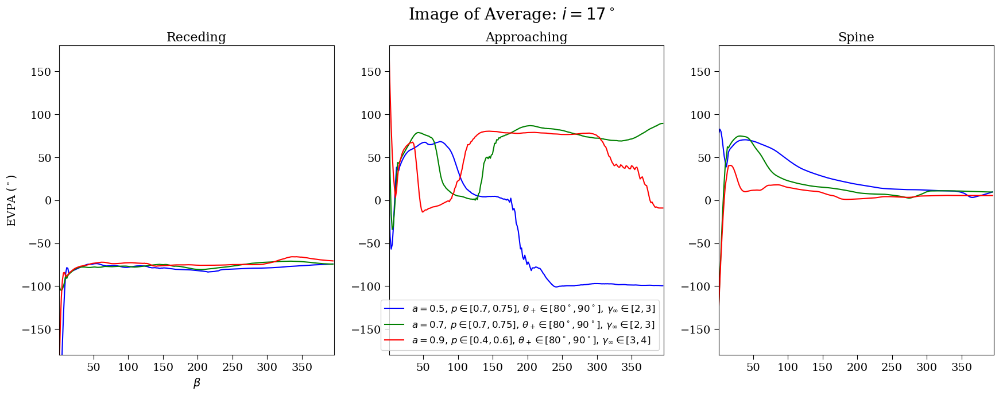

In [187]:
fig, ax = plt.subplots(1,3,figsize=(21,7))
usesum = False
windowlength = 11
polyorder = 3
ymin = -90
ymax = 90
colors = ['b','g','r']
betastar = [200, 130, np.nan]
endbetas = (np.ones(3)*np.max(betas[0][0])).astype('int')
incind = 1
labelparams = [r'$a=0.5,\,p\in[0.7,0.75],\,\theta_+\in[80^\circ,90^\circ],\,\gamma_\infty\in[2,3]$',r'$a=0.7,\,p\in[0.7,0.75],\,\theta_+\in[80^\circ,90^\circ],\,\gamma_\infty\in[2,3]$',r'$a=0.9,\,p\in[0.4,0.6],\,\theta_+\in[80^\circ,90^\circ],\,\gamma_\infty\in[3,4]$']
indmatch = np.argmin(np.abs(betas[0][0]-100))
for spinind in range(3):
    yvals = centery(sig.savgol_filter(arrangeEVPA(limbbadevpa[imind][spinind])*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    endind = np.argmin(np.abs(betas[imind][spinind]-endbetas[spinind]))
    print(endind)
    ax[0].plot(betas[imind][spinind][:endind], yvals[:endind],color=colors[spinind],label=r'$a=$'+str(spins[spinind]))
    yvals = centery(sig.savgol_filter(arrangeEVPA(limbevpa[imind][spinind])*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[1].plot(betas[imind][spinind][:endind], yvals[:endind],color=colors[spinind],label=labelparams[spinind])
    # ax[1].axvspan(betaswingminlimb[spinind], betaswingmaxlimb[spinind], color=colors[spinind], alpha=0.3)
    yvals = centery(sig.savgol_filter(arrangeEVPA(spineevpa[imind][spinind])*180/np.pi, windowlength, polyorder),indmatch,ymin,ymax)
    ax[2].plot(betas[imind][spinind][:endind], yvals[:endind],color=colors[spinind])
    # ax[0].axvspan(betaswingminlimb[spinind], betaswingmaxlimb[spinind], color=colors[spinind], alpha=0.3,label=labelparams[spinind])
    # ax[2].axvspan(betaswingminspine[spinind], betaswingmaxspine[spinind], color=colors[spinind], alpha=0.3)
    # ax[0].axvspan(betaswingminlimb[spinind], betaswingmaxlimb[spinind], color=colors[spinind], alpha=0.3, label=labelparams[spinind])
    # ax[2].axvspan(betaswingminspine[spinind], betaswingmaxspine[spinind], color=colors[spinind], alpha=0.3, label=labelparams[spinind])
spinind = 2
for i in range(3):
    ax[i].set(xlim=(betas[0][0][0],betas[0][0][np.max(endinds)]),ylim=(-180,180))
# ax[0].legend(fontsize=12)
ax[1].legend(fontsize=12,loc='lower right')
ax[0].set_title('Receding', fontsize=16)
ax[0].set_ylabel(r'EVPA $(^\circ)$', fontsize=14)
ax[0].set_xlabel(r'$\beta$', fontsize=14)
ax[1].set_title('Approaching', fontsize=16)
ax[2].set_title('Spine', fontsize=16)
plt.suptitle(r'Image of Average: $i=17^\circ$',fontsize=20)
# plt.savefig('Figures/pol_imofavg_inc60_eta01.pdf',bbox_inches='tight', dpi=300)
# plt.savefig('Figures/pol_imofavg_compare_inc60_eta01.png',bbox_inches='tight', dpi=300)

### Transverse Structure

In [140]:
npoints = 1000
evpaapproach = [[] for inc in incs]
evparecede = [[] for inc in incs]
Papproach = [[] for inc in incs]
Precede = [[] for inc in incs]
spins = [0.5, 0.7, 0.9]
for i in range(len(incs)):
    for j in range(len(spins)):
        print(i,j,k)
        eapproach, erecede, precede, papproach = interpall(ims[i][j], npoints)
        evpaapproach[i].append(eapproach)
        evparecede[i].append(erecede)
        Papproach[i].append(papproach)
        Precede[i].append(precede)
        # evpaapproach[i] = np.array(evpaapproach[i][j])
        # evparecede[i] = np.array(evparecede[i][j])
        # Papproach[i] = np.array(Papproach[i][j])
        # Precede[i] = np.array(Precede[i][j])
evpaapproach = np.array(evpaapproach)
evparecede = np.array(evparecede)
Papproach = np.array(Papproach)
Precede = np.array(Precede)

0 0 0
0 1 0
0 2 0
1 0 0


/tmp/ipykernel_2670680/4229313243.py:8: RuntimeWarning: invalid value encountered in log
  dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
/tmp/ipykernel_2670680/4229313243.py:8: RuntimeWarning: invalid value encountered in subtract
  dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))


1 1 0
1 2 0


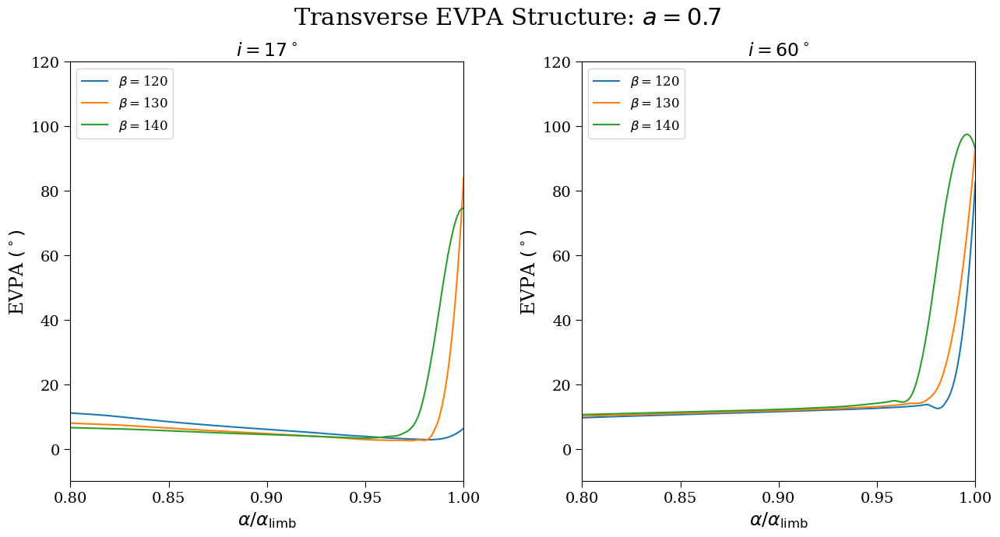

In [177]:
fig, ax = plt.subplots(1,2,figsize=(15, 7))
npoints = 1000
xvals = np.linspace(0,1,npoints)
start = np.argmin(np.abs(xvals-0.8))
xvals = xvals[start:]
windowlength = 31
polyorder = 3
spinind = 1
betaplotsall = [np.array([120, 130, 140]), np.array([120, 130, 140])]
titles=[r'$i=17^\circ$', r'$i=60^\circ$']
for incind in range(len(betaplotsall)):
    betaplots = betaplotsall[incind]
    colplot = np.array([np.argmin(np.abs(betaplots[i]-betas[incind][0])) for i in range(len(betaplots))]).astype('int')
    for i in range(len(betaplots)):
        if incind == 0:
            yvals = sig.savgol_filter(arrangeEVPA(evparecede[incind][spinind][colplot[i],start:])*180/np.pi, windowlength, polyorder)
        if incind == 1:
            yvals = sig.savgol_filter(arrangeEVPA(evpaapproach[incind][spinind][colplot[i],start:])*180/np.pi, windowlength, polyorder)
        if yvals[-1] <-50:
            yvals += 180
        ax[incind].plot(xvals,yvals,label=r'$\beta=$'+str(round(betas[incind][0][colplot[i]])))
    ax[incind].set(xlim=(xvals[0],xvals[-1]), ylim=(-10, 120))
    ax[incind].legend(loc='upper left')
    ax[incind].set_title(titles[incind],fontsize=17)
    ax[incind].set_xlabel(r'$\alpha/\alpha_{\rm limb}$',fontsize=17)
    ax[incind].set_ylabel(r'EVPA $(^\circ)$',fontsize=17)
    
    plt.suptitle('Transverse EVPA Structure: $a=0.7$', fontsize=22, y=0.98)
    plt.subplots_adjust(wspace=0.3)
    plt.savefig('Figures/transverse_evpa_imofavg_a7_eta01.pdf', dpi=300, bbox_inches='tight')

### Fitting Limbs

<>:9: SyntaxWarning: invalid escape sequence '\c'
<>:9: SyntaxWarning: invalid escape sequence '\c'
/tmp/ipykernel_109156/1393670140.py:9: SyntaxWarning: invalid escape sequence '\c'
  ax[incind].set(ylim=(0,400),xlabel=r'$\alpha_{\rm limb}$',ylabel=r'$\beta_{\rm limb}$',title=r'$i=$'+str(int(round(incs[incind]*180/np.pi,0)))+'$^\circ$')


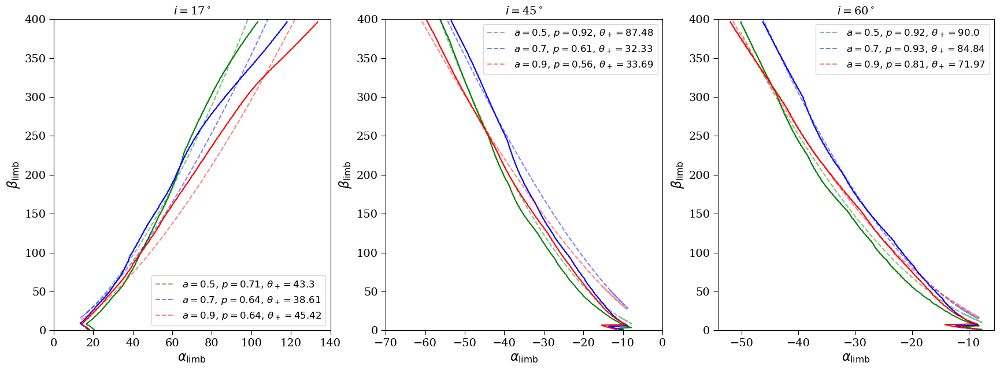

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(21,7))
incinds = [0,2]
colors = ['orange','g', 'b', 'r']
for incind in range(len(incs)):
    for j in range(1,len(spins),1):
        ax[incind].plot(alphalimb[incind][j], betas[incind][j], color=colors[j])
        ax[incind].plot(alphalimb[incind][j], betalimbfit[incind][j], color=colors[j], alpha=0.5, linestyle='--',label=r'$a={},\,p={},\, \theta_+={}$'.format(str(spins[j]),str(round(pvalssolve[incind][j],2)),str(round(thplusvalssolve[incind][j]*180/np.pi,2))))
    ax[incind].legend()
    ax[incind].set(ylim=(0,400),xlabel=r'$\alpha_{\rm limb}$',ylabel=r'$\beta_{\rm limb}$',title=r'$i=$'+str(int(round(incs[incind]*180/np.pi,0)))+'$^\circ$')
ax[0].set_xlim(0,140)
ax[1].set_xlim(-70,0)
ax[1].set_xlim(-70,0)
plt.savefig('timeavgims/timeavgfigs/jetshapes.png',dpi=200)
plt.savefig('timeavgims/timeavgfigs/jetshapes.pdf',dpi=200)

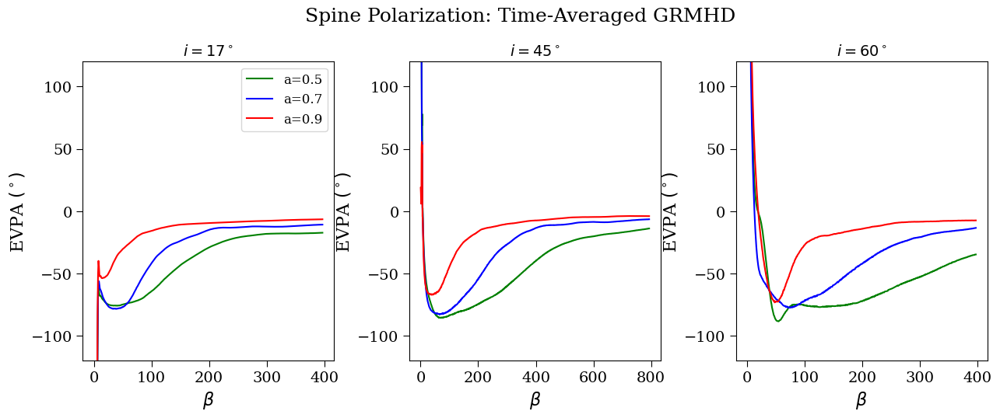

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5))
colors = ['orange','g', 'b', 'r']
windowlength = 15
polyorder = 3
for incind in range(len(incs)):
    for j in range(1,len(spins),1):
        yvals = -arrangeEVPA(spineevpa[incind][j])*180/np.pi
        if np.max(yvals) > 100:
            yvals -= 180
        if np.max(yvals) > 100:
            yvals -= 540
        if np.min(yvals) < -150:
            yvals += 180
        if np.min(yvals) < -150:
            yvals += 180
        ax[incind].plot(betas[incind][j], yvals, label=f'a={spins[j]}', color=colors[j])
    ax[incind].set(ylim=(-120,120),xlabel=r'$\beta$',ylabel=r'EVPA $(^\circ)$',title=r'$i={}^\circ$'.format(str(int(round(incs[incind]*180/np.pi,0)))))
ax[0].legend()
plt.subplots_adjust(wspace=0.3)
plt.suptitle('Spine Polarization: Time-Averaged GRMHD', y=1.02, fontsize=18)
plt.savefig('timeavgims/timeavgfigs/spinepol.png',dpi=300,bbox_inches='tight')
plt.savefig('timeavgims/timeavgfigs/spinepol.pdf',dpi=300,bbox_inches='tight')

/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:527: RuntimeWarning: divide by zero encountered in scalar divide
  Bph = I / (2*np.pi*Delta*sth2)


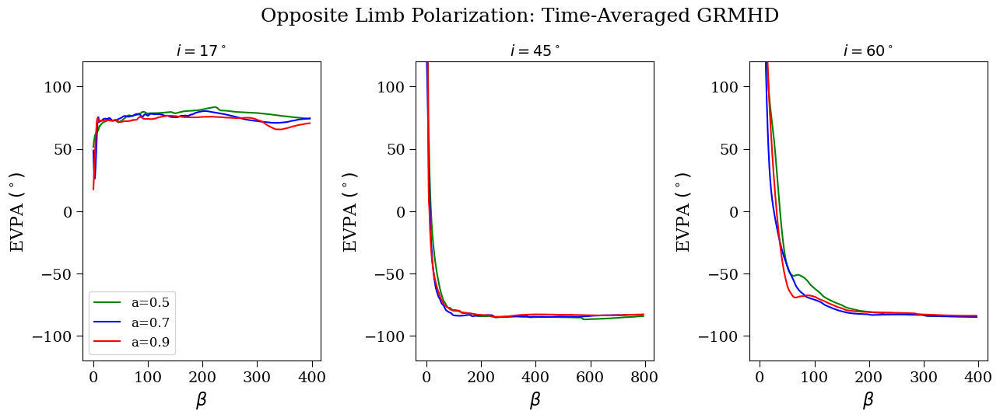

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5))
colors = ['orange','g', 'b', 'r']
windowlength = 15
polyorder = 3
gammatests = [2.2, 4.0, 4.0]
bswing = [[getbetaswinglimb(np.sqrt(1-1/gammatests[i]**2), spins[spinind], incs[i], pvalssolve[i][spinind], thplusvalssolve[i][spinind]) for spinind in range(1,len(spins),1)] for i in range(len(gammatests))]
for incind in range(len(incs)):
    for j in range(1,len(spins),1):
        yvals = -arrangeEVPA(limbbadevpa[incind][j])*180/np.pi
        yvals = sig.savgol_filter(yvals, windowlength, polyorder)
        if yvals[-1] > 100:
            yvals -= 180
        if np.min(yvals) < -150:
            yvals += 180
        if np.min(yvals) < -150:
            yvals += 180
        ax[incind].plot(betas[incind][j], yvals, label=f'a={spins[j]}', color=colors[j])
    ax[incind].set(ylim=(-120,120),xlabel=r'$\beta$',ylabel=r'EVPA $(^\circ)$',title=r'$i={}^\circ$'.format(str(int(round(incs[incind]*180/np.pi,0))), str(gammatests[incind])))
ax[0].legend()
plt.subplots_adjust(wspace=0.4)
plt.suptitle('Opposite Limb Polarization: Time-Averaged GRMHD', y=1.02, fontsize=18)
plt.savefig('timeavgims/timeavgfigs/limbpol3_oppo.png',dpi=300,bbox_inches='tight')
plt.savefig('timeavgims/timeavgfigs/limbpol3_oppo.pdf',dpi=300,bbox_inches='tight')

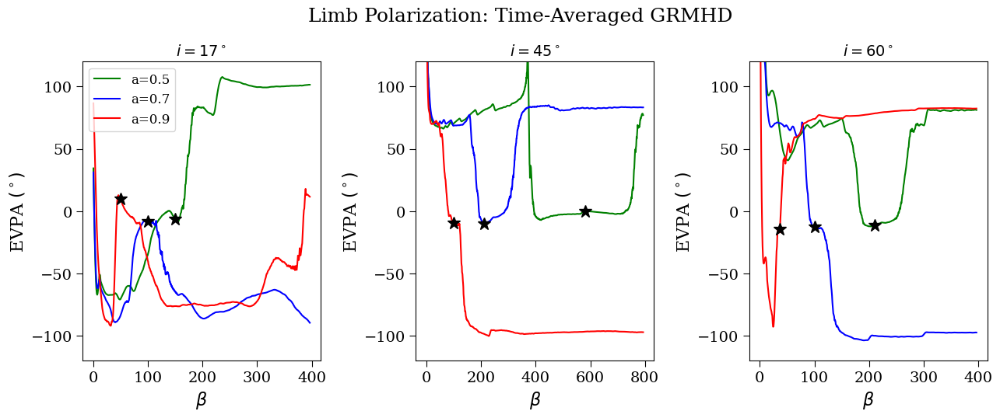

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5))
colors = ['orange','g', 'b', 'r']
windowlength = 15
polyorder = 3
gammatests = [2.2, 4.0, 4.0]
#bswing = [[getbetaswinglimb(np.sqrt(1-1/gammatests[i]**2), spins[spinind], incs[i], pvalssolve[i][spinind], thplusvalssolve[i][spinind]) for spinind in range(1,len(spins),1)] for i in range(len(gammatests))]
bswing = [[150, 100, 50], [580, 210, 100], [210, 100, 37]]
for incind in range(len(incs)):
    for j in range(1,len(spins),1):
        yvals = -arrangeEVPA(limbevpa[incind][j])*180/np.pi
        yvals = sig.savgol_filter(yvals, windowlength, polyorder)
        if yvals[-1] > 100:
            yvals -= 180
        if np.min(yvals) < -150:
            yvals += 180
        if np.min(yvals) < -150:
            yvals += 180
        ax[incind].plot(betas[incind][j], yvals, label=f'a={spins[j]}', color=colors[j])
        
        ind0 = np.argmin(np.abs(np.array(betas[incind][j])-bswing[incind][j-1]))
        ax[incind].plot(bswing[incind][j-1], yvals[ind0], 'k*', markersize=12)
    # ax[incind].set(ylim=(-120,120),xlabel=r'$\beta$',ylabel=r'EVPA $(^\circ)$',title=r'$i={}^\circ$, (Stars for $\gamma_\infty=${})'.format(str(int(round(incs[incind]*180/np.pi,0))), str(gammatests[incind])))
    ax[incind].set(ylim=(-120,120),xlabel=r'$\beta$',ylabel=r'EVPA $(^\circ)$',title=r'$i={}^\circ$'.format(str(int(round(incs[incind]*180/np.pi,0)))))
ax[0].legend()
plt.subplots_adjust(wspace=0.4)
plt.suptitle('Limb Polarization: Time-Averaged GRMHD', y=1.02, fontsize=18)
plt.savefig('timeavgims/timeavgfigs/limbpol2.png',dpi=300,bbox_inches='tight')
plt.savefig('timeavgims/timeavgfigs/limbpol2.pdf',dpi=300,bbox_inches='tight')

In [ ]:
incs = [17*np.pi/180, 45*np.pi/180]
pval = 0.7
thplus = 35*np.pi/180
gammainf = 2.0
vinf = np.sqrt(1-1/gammainf**2)
incs = [17*np.pi/180, 45*np.pi/180]
betaswingspine0 = [getbetaswingspine(vinf, spin, incs[0], pval, thplus) for spin in [0.3,0.5,0.7,0.9]]
betaswinglimb0 = [getbetaswinglimb(vinf, spin, incs[0], pval, thplus) for spin in [0.3,0.5,0.7,0.9]]
pval = 0.66
thplus = 70*np.pi/180
gammainf = 3.0
vinf = np.sqrt(1-1/gammainf**2)
betaswingspine1 = [getbetaswingspine(vinf, spin, incs[1], pval, thplus) for spin in [0.3,0.5,0.7,0.9]]
betaswinglimb1 = [getbetaswinglimb(vinf, spin, incs[1], pval, thplus) for spin in [0.3,0.5,0.7,0.9]]
print(betaswingspine0[-1])
print(betaswingspine1[-1])
print(betaswinglimb0[-1])
print(betaswinglimb1[-1])

(21.656562714603496, 52.02441061762684)
(35.34468680554545, 68.54856142642149)
70.13021026992172
102.07894672736703


In [ ]:
pvals = np.linspace(0.5,0.9,11)
thplusvals = np.linspace(20,90,11)*np.pi/180
gammamaxvals = np.linspace(2,3.0,11)
for p in pvals:
    for thplus in thplusvals:
        for gammamax in gammamaxvals:
            vinf = np.sqrt(1-1/gammamax**2)
            try:
                betaswingspine = getbetaswingspine(vinf, 0.9, incs[1], p, thplus)
                betaswinglimb = getbetaswinglimb(vinf, 0.9, incs[1], p, thplus)
            except:
                continue
            if np.abs(betaswinglimb-100) < 40 and np.abs(betaswingspine[1]-125) < 40:
                print(f'p={p}, thplus={thplus*180/np.pi}, gammamax={gammamax}, betaswingspine={betaswingspine}, betaswinglimb={betaswinglimb}')

p=0.54, thplus=34.0, gammamax=2.9, betaswingspine=(61.14977466082877, 88.81954521744382), betaswinglimb=136.3072948607462
p=0.54, thplus=34.0, gammamax=3.0, betaswingspine=(61.937847119796054, 89.85079711426508), betaswinglimb=132.5588813664032
p=0.62, thplus=41.0, gammamax=3.0, betaswingspine=(63.25254702907863, 91.78307707645804), betaswinglimb=139.17763127002945
p=0.66, thplus=48.0, gammamax=2.9, betaswingspine=(57.878627446264844, 86.9329937353249), betaswinglimb=138.76764300671212
p=0.66, thplus=48.0, gammamax=3.0, betaswingspine=(58.7106523502395, 88.0203667798604), betaswinglimb=134.6473169678298
p=0.7, thplus=55.0, gammamax=2.9, betaswingspine=(56.36709724665263, 86.38316445861484), betaswinglimb=139.73691411844922
p=0.7, thplus=55.0, gammamax=3.0, betaswingspine=(57.21167775815515, 87.49154514642375), betaswinglimb=135.4690032967425


In [4]:
def getRspineswing(vinf, inc, OmegaF):
    return np.sin(inc)/np.abs(1-np.cos(inc)*vinf)/OmegaF
def betafromRspine(Rswingspine, pval, psitarget, inc):
    solveZ = lambda Zlimb : np.sqrt(Rswingspine**2+Zlimb**2)**pval*(1-Zlimb/np.sqrt(Rswingspine**2+Zlimb**2))-psitarget
    Zswingspine = opt.newton(solveZ, 1) #solve for Z
    return Zswingspine*np.sin(inc)-Rswingspine*np.cos(inc), Zswingspine*np.sin(inc)+Rswingspine*np.cos(inc) #foreground and background
def getbetaswingspine(vinf, spin, inc, pval, thplus):
    rp = 1+np.sqrt(1-spin**2)
    psitarget = rp**pval*(1-np.cos(thplus))
    OmegaF = omega_eff(spin, pval, thplus)
    Rswingspine = getRspineswing(vinf, inc, OmegaF)
    return betafromRspine(Rswingspine, pval, psitarget, inc)
def getRCJswing(vinf, inc, OmegaF):
    return np.sin(inc)/np.abs(1+np.cos(inc)*vinf)/OmegaF
def betafromRspineCJ(Rswing, pval, psitarget, inc):
    # Solve for the positive magnitude |Z| using the reflected field-line shape.
    solve_Zmag = lambda Zmag: (
        np.hypot(Rswing, Zmag)**pval
        * (1 - Zmag / np.hypot(Rswing, Zmag))
        - psitarget
    )
    Zmag = opt.newton(solve_Zmag, 1)

    beta_foreground = -Zmag*np.sin(inc) - Rswing*np.cos(inc)
    beta_background = -Zmag*np.sin(inc) + Rswing*np.cos(inc)

    return beta_foreground, beta_background

def getbetaswingCJ(vinf, spin, inc, pval, thplus):
    rp = 1 + np.sqrt(1 - spin**2)
    psitarget = rp**pval * (1 - np.cos(thplus))
    OmegaF = omega_eff(spin, pval, thplus)

    Rswing = getRCJswing(vinf, inc, OmegaF)  # Eq. 60
    return betafromRspineCJ(Rswing, pval, psitarget, inc)
def betafromRlimb(Rswinglimb, pval, psitarget, inc):
    solveZ = lambda Zlimb : np.sqrt(Rswinglimb**2+Zlimb**2)**pval*(1-Zlimb/np.sqrt(Rswinglimb**2+Zlimb**2))-psitarget
    Zswinglimb = opt.newton(solveZ, 1) #solve for Z
    rswinglimb = np.sqrt(Rswinglimb**2+Zswinglimb**2)
    Yswinglimb = -(Rswinglimb**2+pval*Zswinglimb*(Zswinglimb-rswinglimb))/np.tan(inc)/(pval*(rswinglimb-Zswinglimb)+Zswinglimb)
    betaswinglimb = Zswinglimb*np.sin(inc)+Yswinglimb*np.cos(inc)
    return betaswinglimb 
def getbetaswinglimb(vinf, spin, inc, pval, thplus):
    rp = 1+np.sqrt(1-spin**2)
    psitarget = rp**pval*(1-np.cos(thplus))
    OmegaF = omega_eff(spin, pval, thplus)
    Rswinglimb = Rfinalexpand_spin(vinf, inc, OmegaF, pval, psitarget)
    return betafromRlimb(Rswinglimb, pval, psitarget, inc)

def YZfromXlimb(Xlimb, pval, psitarget, inc):
    def equations(vars):
        Y, Z = vars
        r = np.sqrt(Xlimb**2 + Y**2 + Z**2)
        R = np.sqrt(Xlimb**2 + Y**2)
        costheta = Z/r 
        eq1 = r**pval*(1-np.abs(costheta))
        eq2 = Y+((R**2+pval*Z*(Z-r))/np.tan(inc)/(pval*(r-Z)+Z))
        return [eq1-psitarget, eq2]
    YZ = opt.fsolve(equations, (-1, 1))
    return YZ

def betalimbfromalpha(alpha, pval, psitarget, inc):
    Y, Z = YZfromXlimb(alpha, pval, psitarget, inc)
    return Z*np.sin(inc)+Y*np.cos(inc)

def getjetshape(alphalimb, betalimb, inc, spin):
    rp = 1+np.sqrt(1-spin**2)
    def optfunc(alpha, p, thetaplus):
        psihere = rp**p*(1-np.abs(np.cos(thetaplus)))
        return np.array([betalimbfromalpha(alpha[i], p, psihere, inc) for i in range(len(alpha))])
    p0 = (0.7, 50*np.pi/180)
    betalimbfit = opt.curve_fit(optfunc, alphalimb, betalimb, p0=p0)
    return betalimbfit

def getimagecoords(im, fov_muasx, fov_muasy):
    nx = im.xdim
    ny = im.ydim
    pxi = (np.arange(nx))/nx-0.5
    pxi += (pxi[1]-pxi[0])/2
    pxj = np.copy(pxi)
    mui = pxi*fov_muasx
    muj = pxj*fov_muasy
    MUI,MUJ = np.meshgrid(mui,muj)
    Marrx = (MUI/MoD)[:ny//2,:]
    Marry = -(MUJ/MoD)[:ny//2,:]
    return np.flip(Marrx,axis=0), np.flip(Marry,axis=0)

def getEVPAspine(im, flip=False):
    nx = im.xdim
    ny = im.ydim
    evpahere = np.flip(np.reshape(np.copy(im.evpavec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0) if flip == False else np.reshape(np.copy(im.evpavec),(im.ydim,im.xdim))[im.ydim//2:,:]
    ihere = np.flip(np.reshape(np.copy(im.imvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0) if flip == False else np.reshape(np.copy(im.imvec),(im.ydim,im.xdim))[im.ydim//2:,:]
    dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
    dlogI[ihere<1e-14] = 0
    limbind1 = np.argmax(dlogI[:,ny//2:],axis=1)
    limbind2 = np.argmax(dlogI[:,:ny//2],axis=1)
    rowinds = np.arange(len(ihere)).astype('int')
    colinds = np.arange(len(ihere[0])).astype('int')
    rows, cols = np.meshgrid(rowinds,colinds,indexing='ij')
    other, colslimb1 = np.meshgrid(colinds,ny//2+limbind1)
    other, colslimb2 = np.meshgrid(colinds,limbind2)
    evpahere[np.logical_or(cols<colslimb2,cols>colslimb1)] = np.nan
    ihere[np.logical_or(cols<colslimb2,cols>colslimb1)] = np.nan
    return evpahere[:,nx//2]

def getlimbinds(im, flip = False):
    nx = im.xdim
    ny = im.ydim
    evpahere = np.flip(np.reshape(np.copy(im.evpavec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0) if flip == False else np.reshape(np.copy(im.evpavec),(im.ydim,im.xdim))[im.ydim//2:,:]
    ihere = np.flip(np.reshape(np.copy(im.imvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0) if flip == False else np.reshape(np.copy(im.imvec),(im.ydim,im.xdim))[im.ydim//2:,:]
    dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
    dlogI[ihere<1e-14] = 0
    limbind1 = np.argmax(dlogI[:,ny//2:],axis=1)
    limbind2 = np.argmax(dlogI[:,:ny//2],axis=1)
    return limbind1, limbind2

def getEVPAlimb(im, offset, limbcase, alphavals, flip = False, retevpa = False):
    nx = im.xdim
    ny = im.ydim
    evpahere = np.flip(np.reshape(np.copy(im.evpavec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0) if flip == False else np.reshape(np.copy(im.evpavec),(im.ydim,im.xdim))[im.ydim//2:,:]
    ihere = np.flip(np.reshape(np.copy(im.imvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0) if flip == False else np.reshape(np.copy(im.imvec),(im.ydim,im.xdim))[im.ydim//2:,:]
    dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
    dlogI[ihere<1e-14] = 0
    limbind1 = np.argmax(dlogI[:,ny//2:],axis=1)
    limbind2 = np.argmax(dlogI[:,:ny//2],axis=1)
    rowinds = np.arange(len(ihere)).astype('int')
    colinds = np.arange(len(ihere[0])).astype('int')
    rows, cols = np.meshgrid(rowinds,colinds,indexing='ij')
    other, colslimb1 = np.meshgrid(colinds,ny//2+limbind1)
    other, colslimb2 = np.meshgrid(colinds,limbind2)
    evpahere[np.logical_or(cols<colslimb2,cols>colslimb1)] = np.nan
    if retevpa == True:
        return evpahere
    ihere[np.logical_or(cols<colslimb2,cols>colslimb1)] = np.nan
    ylimb = evpahere[np.arange(len(evpahere)),nx//2+limbind1-offset] if limbcase == 0 else evpahere[np.arange(len(evpahere)),limbind2+offset]
    ylimb2 = evpahere[np.arange(len(evpahere)),nx//2+limbind1-offset] if limbcase == 1 else evpahere[np.arange(len(evpahere)),limbind2+offset]
    alphalimb = alphavals[nx//2+limbind1] if limbcase == 0 else alphavals[limbind2]
    return ylimb, ylimb2, alphalimb

def maskEVPA(im):
    nx = im.xdim
    ny = im.ydim
    evpahere = np.flip(np.reshape(np.copy(im.evpavec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
    ihere = np.flip(np.reshape(np.copy(im.imvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
    dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
    dlogI[ihere<1e-14] = 0
    limbind1 = np.argmax(dlogI[:,ny//2:],axis=1)
    limbind2 = np.argmax(dlogI[:,:ny//2],axis=1)
    rowinds = np.arange(len(ihere)).astype('int')
    colinds = np.arange(len(ihere[0])).astype('int')
    rows, cols = np.meshgrid(rowinds,colinds,indexing='ij')
    other, colslimb1 = np.meshgrid(colinds,ny//2+limbind1)
    other, colslimb2 = np.meshgrid(colinds,limbind2)
    evpahere[np.logical_or(cols<colslimb2,cols>colslimb1)] = np.nan
    ihere[np.logical_or(cols<colslimb2,cols>colslimb1)] = np.nan
    return ihere, evpahere

In [ ]:
spineevpa = []
limbevpa = []
offset = 10
limbcase = 1
for i in range(len(ims45)):
    im = ims45[i]
    nx = im.xdim
    ny = im.ydim
    evpahere = np.flip(np.reshape(np.copy(im.evpavec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
    ihere = np.flip(np.reshape(np.copy(im.imvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
    dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
    dlogI[ihere<1e-14] = 0
    limbind1 = np.argmax(dlogI[:,ny//2:],axis=1)
    limbind2 = np.argmax(dlogI[:,:ny//2],axis=1)
    rowinds = np.arange(len(ihere)).astype('int')
    colinds = np.arange(len(ihere[0])).astype('int')
    rows, cols = np.meshgrid(rowinds,colinds,indexing='ij')
    other, colslimb1 = np.meshgrid(colinds,ny//2+limbind1)
    other, colslimb2 = np.meshgrid(colinds,limbind2)
    evpahere[np.logical_or(cols<colslimb2,cols>colslimb1)] = np.nan
    ihere[np.logical_or(cols<colslimb2,cols>colslimb1)] = np.nan
    ylimb = evpahere[np.arange(len(evpahere)),nx//2+limbind1-offset] if limbcase == 0 else evpahere[np.arange(len(evpahere)),limbind2+offset]
    spineevpa.append(evpahere[:,nx//2])
    limbevpa.append(ylimb)

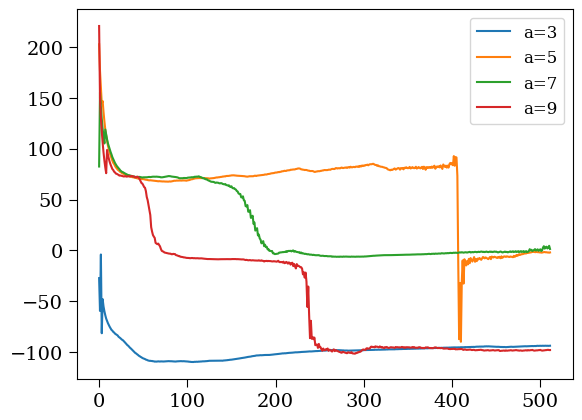

In [ ]:
for i in range(len(spins)):
    yvals = -arrangeEVPA(limbevpa[i])*180/np.pi
    if yvals[-1]<-150:
        yvals += 180
    if yvals[-1] > 200:
        yvals -= 360
    plt.plot(yvals,label=f'a={spins[i]}')
plt.legend()

1
1
1
1


(-90.0, 90.0)

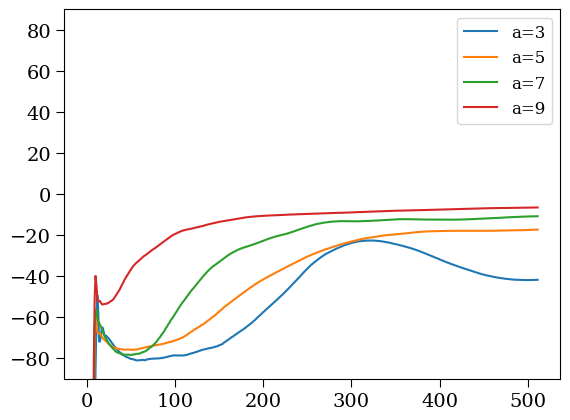

In [ ]:
for i in range(len(spins)):
    yvals = -arrangeEVPA(spineevpa[i])*180/np.pi
    if yvals[-1]<-150:
        yvals += 180
    if yvals[-1] > 200:
        yvals -= 360
    plt.plot(yvals,label=f'a={spins[i]}')
plt.legend()
plt.ylim(-90,90)

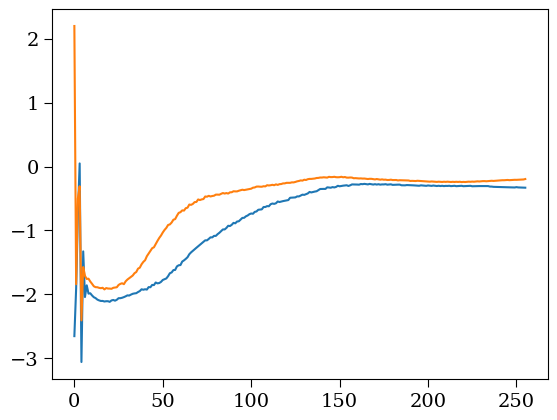

In [ ]:
plt.plot(-2*np.flip(np.reshape(im.evpavec,(im.xdim,im.ydim))[:im.xdim//2,im.xdim//2]))
plt.plot(-2*np.flip(np.reshape(im2.evpavec,(im.xdim,im.ydim))[:im.xdim//2,im.xdim//2]))

In [ ]:
%%capture
spins = ['3','5','7','9']
ims17 = [eh.image.load_image(f'timeavgims/avgim_a{spin}_inc17.h5') for spin in spins]
ims45 = [eh.image.load_image(f'timeavgims/avgim_a{spin}_inc45.h5') for spin in spins]
ims60 = [eh.image.load_image(f'timeavgims/avgim_a{spin}_inc60.h5') for spin in spins]
ims89 = [eh.image.load_image(f'timeavgims/avgim_a{spin}_inc89.h5') for spin in spins]

In [ ]:
im=ims17[3] #eh.image.load_image('timeavgims/avgim_a7_inc45.h5')
nx = im.xdim
ny = im.ydim
evpahere = np.flip(np.reshape(np.copy(im.evpavec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
ihere = np.flip(np.reshape(np.copy(im.imvec),(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
dlogI = np.abs(np.log(np.roll(ihere,-1,axis=1))-np.log(ihere))
dlogI[ihere<1e-14] = 0
limbind1 = np.argmax(dlogI[:,ny//2:],axis=1)
limbind2 = np.argmax(dlogI[:,:ny//2],axis=1)
rowinds = np.arange(len(ihere)).astype('int')
colinds = np.arange(len(ihere[0])).astype('int')
rows, cols = np.meshgrid(rowinds,colinds,indexing='ij')
other, colslimb1 = np.meshgrid(colinds,ny//2+limbind1)
other, colslimb2 = np.meshgrid(colinds,limbind2)
evpahere[np.logical_or(cols<colslimb2,cols>colslimb1)] = np.nan

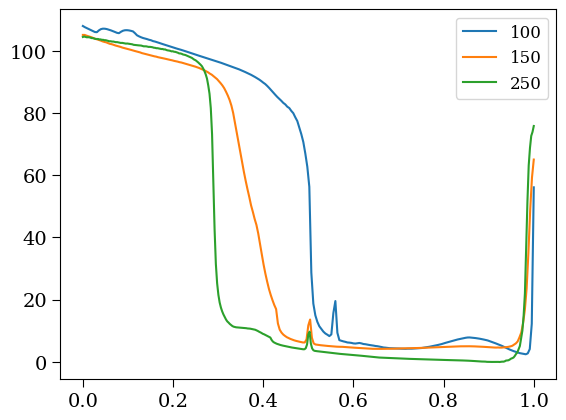

In [ ]:
colinds = [100,150,250]
for i in range(len(colinds)):
    yvals = evpahere[colinds[i]][np.where(~np.isnan(evpahere[colinds[i]]))[0]]
    yvals = arrangeEVPA(yvals)*180/np.pi+180
    plt.plot(np.linspace(0,1,len(yvals)),yvals,label=str(colinds[i]))
plt.legend()

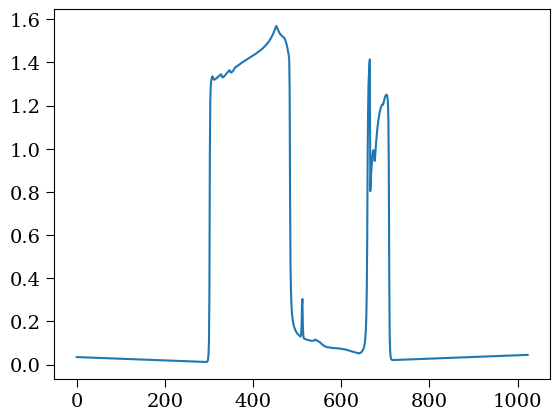

In [ ]:
evpahere7 = np.flip(np.reshape(im.evpavec,(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
ihere7 = np.flip(np.reshape(im.imvec,(im.ydim,im.xdim))[:im.ydim//2,:],axis=0)
plt.plot(np.abs(evpahere7[240]))
# plt.semilogy(ihere7[130])
# plt.plot(evpahere7[100])

clipping values leq 0 in pol display


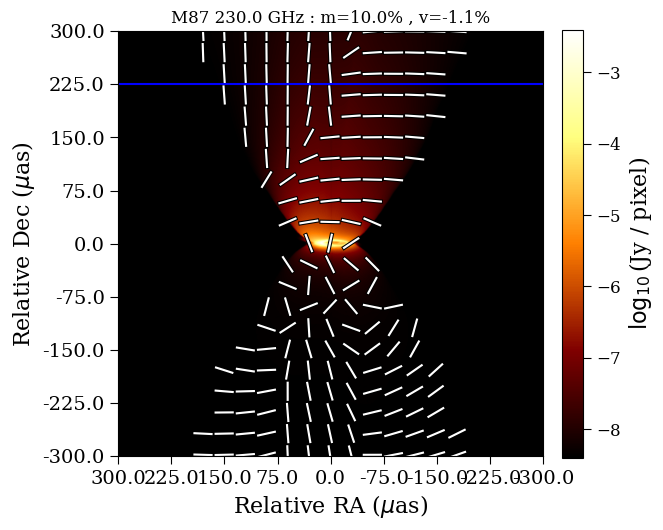

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(6,6))
im.display(scale='log',dynamic_range=[1e6],plotp=True,pcut=1e-10,axis=ax)
xvals = np.linspace(-100,100,1000)
plt.axhline(256-130,color='b')

In [ ]:
#define metric components
def metric(r, a, theta, M):
    SigmaK = r**2+a**2*np.cos(theta)**2
    DeltaK = r**2-2*M*r+a**2
    gmunu = np.zeros((4,4))
    gmunu[0][0] = -(1-2*M*r/SigmaK)
    gmunu[0][3] = gmunu[3][0] = -2*a*M*r/SigmaK*np.sin(theta)**2
    gmunu[1][1] = SigmaK/DeltaK
    gmunu[2][2] = SigmaK
    gmunu[3][3] = (r**2+a**2+2*M*r*a**2/SigmaK*np.sin(theta)**2)*np.sin(theta)**2
    
    return gmunu

In [ ]:
def b2func(r, a, theta, M, omegaF): #returns b^2, where b^\mu is the (unnormalized) four-velocity co-rotating with field
    g = metric(r, a, theta, M)
    vecb = np.array([1, 0, 0, omegaF])
    return (vecb[0]**2*g[0][0]+vecb[3]**2*g[3][3]+2*vecb[0]*vecb[3]*g[0][3])

In [ ]:
#computes light cylinder by finding where b^2 goes null
def lightcylinder(rvals, a, thetavals, M, omegaF, bvals, bmin = 0):
    i = 0
    while b2func(rvals[i], a, thetavals[i], M, omegaF)*b2func(rvals[i+1], a, thetavals[i+1], M, omegaF) > 0 or bvals[i] < bmin:
        i += 1
        if i == len(bvals)-1:
            return 0
    return bvals[i]

In [ ]:
#computes arg beta2 and makes it look nice for axisymmetric row of evpa's
def getargb2func(evpavec):
    return -2*evpavec*180/np.pi

In [ ]:
def getangroots(spin, r, comp=False): #gets u_{\pm}
    delta = r**2-2*r+spin**2
    # if delta <= 0:
    #     print('hi', r/(spin*(r-1))**2*(-r**3+3*r-2*spin**2+2*np.sqrt(complex(delta)*(2*r**3-3*r**2+spin**2))), r/(spin*(r-1))**2*(-r**3+3*r-2*spin**2-2*np.sqrt(complex(delta)*(2*r**3-3*r**2+spin**2))))
    if comp:
        delta = complex(delta)
        uplus = r/(spin*(r-1))**2*(-r**3+3*r-2*spin**2+2*np.sqrt(delta*(2*r**3-3*r**2+spin**2)))
        uminus = r/(spin*(r-1))**2*(-r**3+3*r-2*spin**2-2*np.sqrt(delta*(2*r**3-3*r**2+spin**2)))
    else:
        uplus = r/(spin*(r-1))**2*(-r**3+3*r-2*spin**2+2*np.sqrt(delta*(2*r**3-3*r**2+spin**2)))
        uminus = r/(spin*(r-1))**2*(-r**3+3*r-2*spin**2-2*np.sqrt(delta*(2*r**3-3*r**2+spin**2)))
    return uplus, uminus 
def getparamsanalytic(spin, theta): #analytic solution for BL radius on beta axis (all other points need numerics)
    if spin == 0:
        return 3, np.sqrt(27)
    spin += 0j  #makes it complex type
    cuberootfac = (-9+9*spin**2+np.sqrt(3*spin**2*(-27+18*spin**2+spin**4)))**(1/3)
    r = 1-(-1/3)**(1/3)*(-3+spin**2)/cuberootfac-(-1)**(2/3)*cuberootfac/3**(2/3)
    r = np.real(r) #imaginary part should just be a numerical artefact
    
    delta = r**2-2*r+spin**2
    ell = ((r**2-spin**2)-r*delta)/(spin*(r-1))
    up, um = getangroots(spin, r)
    rho = np.sqrt(spin**2*((np.cos(theta))**2-up*um)+ell**2)
    
    return r, np.real(rho) #imaginary part should just be a numerical artefact

#get impact parameter which intersects light cylinder
def getlc_power(rvals, thvals, spin, betas, pval, usemono=False, nimage = 3):
    #preliminaries
    bf = Bfield('power', p=pval, usemono=usemono)
    ind = np.where(np.nan_to_num(rvals) != 0)[0][0] #important for indirect images, which are filled with zeros when there's no crossing
    omega = bf.omega_field(spin,rvals[ind],th=thvals[ind]) #single fieldline so single omega

    #reshape and get closest points to light cylinders
    rvals = np.reshape(rvals, (nimage,len(rvals)//nimage))
    thvals = np.reshape(thvals, (nimage,len(thvals)//nimage))

    lcvals = []
    lcinds = []
    for ind in range(len(rvals)):
        lchere = lightcylinder(rvals[ind], spin, thvals[ind], 1.0, omega, betas)
        lcvals.append(lchere)
        lcinds.append(np.argmin(np.abs(betas-lchere)))

    return np.array(lcvals), np.array(lcinds)

#get impact parameter which intersects light cylinder
def getlc_para(rvals, thvals, spin, betas, nimage = 3):
    #preliminaries
    bf = Bfield('bz_para')
    ind = np.where(np.nan_to_num(rvals) != 0)[0][0] #important for indirect images, which are filled with zeros when there's no crossing
    omega = bf.omega_field(spin,rvals[ind],th=thvals[ind]) #single fieldline so single omega

    #reshape and get closest points to light cylinders
    rvals = np.reshape(rvals, (nimage,len(rvals)//nimage))
    thvals = np.reshape(thvals, (nimage,len(thvals)//nimage))

    lcvals = []
    lcinds = []
    for ind in range(len(rvals)):
        lchere = lightcylinder(rvals[ind], spin, thvals[ind], 1.0, omega, betas)
        lcvals.append(lchere)
        lcinds.append(np.argmin(np.abs(betas-lchere)))

    return np.array(lcvals), np.array(lcinds)

def cartesianizeB(rvals, thvals, spin, B1, B2, B3):
    for i in range(len(rvals)):
        g = metric(rvals[i], spin, thvals[i], 1.0)
        B1[i] = B1[i]*np.sqrt(g[1][1])
        B2[i] = B2[i]*np.sqrt(g[2][2])
        B3[i] = B3[i]*np.sqrt(g[3][3])
    return B1, B2, B3
    
def reshape(arr, nimage, imageind, phiind):
    return np.reshape(arr[phiind::len(phivals)],(nimage, NPTS))

def getcoords(outgeo, psitarget, inc, spin, model, pval, vel, imageind, Nb, Nphi, alphagrid, betagrid, neqmax=2):
    #first, get coords of intersection
    tau, rvals, thvals, phivals, signpr, signptheta, neqvals, guesses_shape = findroot(outgeo, psitarget, alphagrid.flatten(), betagrid.flatten(), ROUT, inc, spin, NGEO, do_phi_and_t = True, model=model, neqmax=neqmax, pval=pval, retphi=True)
    tau = np.reshape(tau,guesses_shape)[imageind]
    rvals = np.reshape(rvals,guesses_shape)[imageind]
    thvals = np.reshape(thvals,guesses_shape)[imageind]
    phivals = np.reshape(phivals,guesses_shape)[imageind]
    signpr = np.reshape(signpr,guesses_shape)[imageind]
    signptheta = np.reshape(signptheta,guesses_shape)[imageind]
    neqvals = np.reshape(neqvals,guesses_shape)[imageind]
    guesses_shape = (1, len(tau))
    Zvals = rvals*np.cos(thvals)
    Rvals = rvals*np.sin(thvals)

    #get magnetic field profiles
    bf = Bfield('power', p=pval, usemono=False) if model == 'power' else Bfield('bz_monopole')
    omegaF = bf.omega_field(spin,rvals[0],th=thvals[0]) #single fieldline so single omega
    b2vals = np.array([b2func(rvals[i], spin, thvals[i], 1.0, omegaF) for i in range(len(rvals))])
    b2vals[Zvals<0] = 100 #don't want to artificially find LC with Z<0
    Zlc = Zvals[np.argmin(np.abs(b2vals))] #light cylinder height
    Rlc = Rvals[np.argmin(np.abs(b2vals))]
    return signpr, signptheta, neqvals, rvals, thvals, np.reshape(Zvals,(Nb,Nphi)), np.reshape(Rvals,(Nb,Nphi)), np.reshape(phivals,(Nb,Nphi)), Rlc, Zlc, b2vals, omegaF

def getinfo(signpr, signptheta, neqvals, rvals, thvals, inc, spin, model, pval, vel, alphagrid, betagrid, gammamax=None, neqmax = 2, specind=1.0, emit='R'):
    bf = Bfield('power', p=pval, usemono=False) if model == 'power' else Bfield('bz_monopole')
    velocity=Velocity(vel, bfield=bf, nu_parallel = 'FF', gammamax=gammamax)
    emissivity=Emissivity('constant')
    dvals = densityconstsigma(rvals, thvals, spin, 'FF', sigmaplasma, model, gammamax=gammamax, pval=pval, usemono=False, velmodel=vel)
    guesses_shape = (1, len(rvals))
    
    #do radiative transfer
    alphavals = np.tile(alphagrid.flatten(), guesses_shape[0])
    betavals = np.tile(betagrid.flatten(), guesses_shape[0])
    outvec = Iobs_off(spin, ROUT, rvals, inc, alphavals, betavals, signpr, signptheta,
        emissivity=emissivity, velocity=velocity, bfield=bf,
        polarization=True,  th_s=thvals, density=dvals, retsin=True, emit=emit, specind=specind)

    iobs = np.copy(outvec[0])
    qobs = np.copy(outvec[1])
    uobs = np.copy(outvec[2])

    iobs[rvals == 0] = qobs[rvals==0] = uobs[rvals==0] = 0 #zero out geodesics with no fieldline crossings

    iobs = np.real(np.nan_to_num(np.array(iobs))) #get rid of nans
    qobs = np.real(np.nan_to_num(np.array(qobs)))
    uobs = np.real(np.nan_to_num(np.array(uobs)))

    #call sorter here
    ivec, qvec, uvec = sort_image(iobs, qobs, uobs, neqvals, guesses_shape, alphagrid.shape, neqmax)
    return ivec, qvec, uvec

def getinterp(qvec, uvec, varphigrid, bgrid, Zvals, phivals, phisign = 1.0):
    Nb = bgrid.shape[0]
    Nphi = varphigrid.shape[1]
        
    # Interpolate using griddata
    Qbv = scint.griddata((varphigrid.flatten(), bgrid.flatten()), qvec[0].flatten(), (varphigrid, bgrid), method='cubic')
    Ubv = scint.griddata((varphigrid.flatten(), bgrid.flatten()), uvec[0].flatten(), (varphigrid, bgrid), method='cubic')
    b2_bv = np.nan_to_num((Qbv+1j*Ubv)*np.exp(2*1j*(-varphigrid-np.pi/2)))
    b2_bv_orig = np.nan_to_num((qvec[0]+1j*uvec[0])*np.exp(2*1j*(-varphigrid-np.pi/2)))
    argb2_bv = np.angle(b2_bv)

    phimod = np.nan_to_num(phivals%(2*np.pi))
    phiinterp = np.linspace(np.pi/2, 3*np.pi/2, Nphi) #np.linspace(np.min(phimod[phimod>0]), np.max(phimod[phimod>0]), Nphi)
    phigrid = np.reshape(np.tile(phiinterp,Nb),(Nb,Nphi))
    Qbp = scint.griddata((phimod.flatten(), bgrid.flatten()), qvec[0].flatten(), (phigrid, bgrid), method='cubic')
    Ubp = scint.griddata((phimod.flatten(), bgrid.flatten()), uvec[0].flatten(), (phigrid, bgrid), method='cubic')
    b2_bp = np.nan_to_num((Qbp+1j*Ubp)*np.exp(2*1j*(-phisign*phigrid-np.pi)))
    b2_bp_orig = np.nan_to_num((qvec[0]+1j*uvec[0])*np.exp(2*1j*(-phisign*phivals-np.pi)))
    argb2_bp = np.angle(b2_bp)

    Zvert = Zvals[:,len(Zvals[0])//2]
    Zinterp = np.linspace(np.min(Zvert[Zvert>0]),np.max(Zvert[Zvert>0]), Nb)
    Zgrid = np.transpose(np.reshape(np.tile(Zinterp,Nphi),(Nphi,Nb)))
    Qzv = scint.griddata((varphigrid.flatten(), Zvals.flatten()), qvec[0].flatten(), (varphigrid, Zgrid), method='cubic')
    Uzv = scint.griddata((varphigrid.flatten(), Zvals.flatten()), uvec[0].flatten(), (varphigrid, Zgrid), method='cubic')
    b2_zv = np.nan_to_num((Qzv+1j*Uzv)*np.exp(2*1j*(-varphigrid-np.pi/2)))
    b2_zv_orig = np.nan_to_num((qvec[0]+1j*uvec[0])*np.exp(2*1j*(-varphigrid-np.pi/2)))
    argb2_zv = np.angle(b2_zv)

    Qzp = scint.griddata((phimod.flatten(), Zvals.flatten()), qvec[0].flatten(), (phigrid, Zgrid), method='cubic')
    Uzp = scint.griddata((phimod.flatten(), Zvals.flatten()), uvec[0].flatten(), (phigrid, Zgrid), method='cubic')
    b2_zp = np.nan_to_num((Qzp+1j*Uzp)*np.exp(2*1j*(-phisign*phigrid-np.pi)))
    b2_zp_orig = np.nan_to_num((qvec[0]+1j*uvec[0])*np.exp(2*1j*(-phisign*phivals-np.pi)))
    argb2_zp = np.angle(b2_zp)
    
    return b2_bv, b2_bv_orig, b2_bp, b2_bp_orig, b2_zv, b2_zv_orig, b2_zp, b2_zp_orig, phiinterp, Zinterp, Qzp, Uzp

def getinterp_GRMHD(im, nphi, inc, phisign=1, dropfac=None, pval=0.7, thplus=50*np.pi/180, spin=0.7, nth=500, thmax=4.5*np.pi/180, tophalf=True):
    nx = im.xdim
    ny = im.ydim
    fov_muas = im.fovx()/eh.RADPERUAS
    pxi = (np.arange(nx))/nx-0.5
    pxi += (pxi[1]-pxi[0])/2
    pxj = np.copy(pxi)
    mui = pxi*fov_muas
    muj = pxj*fov_muas
    MUI,MUJ = np.meshgrid(mui,muj)
    Marrx = (MUI/MoD)[:nx//2,:] if tophalf else (MUI/MoD)[nx//2:,:]
    Marry = -(MUJ/MoD)[:nx//2,:] if tophalf else -(MUJ/MoD)[nx//2:,:]
    imvechere = np.reshape(im.imvec,(nx, ny))[:nx//2,:] if tophalf else np.reshape(im.imvec,(nx, ny))[nx//2:,:]
    qvechere = np.reshape(im.qvec,(nx, ny))[:nx//2,:] if tophalf else np.reshape(im.qvec,(nx, ny))[nx//2:,:]
    uvechere = np.reshape(im.uvec,(nx, ny))[:nx//2,:] if tophalf else np.reshape(im.uvec,(nx, ny))[nx//2:,:]
    evpahere = np.reshape(im.evpavec,(nx, ny))[:nx//2,:] if tophalf else np.reshape(im.evpavec,(nx, ny))[nx//2:,:]
    nx = nx//2

    if dropfac == None:
        dlogI = np.abs(np.log(np.roll(imvechere,-1,axis=1))-np.log(imvechere))
        dlogI[imvechere<1e-14] = 0
        limbind1 = np.argmax(dlogI[:,ny//2:],axis=1)
        limbind2 = np.argmax(dlogI[:,:ny//2],axis=1)
        Rlimbvals = .5*(Marrx[0,ny//2:][limbind1]-Marrx[0,:ny//2][limbind2])
        Zlimbvals = (Marry[:,0])/np.sin(inc)

    elif dropfac == 'preset':
        rp = 1+np.sqrt(1-spin**2)
        psitarget = rp**pval*(1-np.cos(thplus))
        thvals = np.linspace(thplus, thmax,nth)
        rvals = (psitarget/(1-np.cos(thvals)))**(1/pval)
        Rlimbvals = np.flip(rvals*np.sin(thvals))
        Zlimbvals = np.flip(rvals*np.cos(thvals))
    
    elif dropfac == 'maxreflect':
        limbind2 = np.argmax(imvechere,axis=1)
        limbind2[limbind2>nx//2] -= 1
        limbind1 = nx//2-limbind2
        Rlimbvals = .5*(Marrx[0,ny//2:][limbind1]-Marrx[0,:ny//2][limbind2])
        Zlimbvals = (Marry[:,0])/np.sin(inc)
        
    else:
        Rlimbvals = []
        Zlimbvals = []
        for i in range(len(imvechere)):
            maxvals = np.argmax(imvechere[:,:ny//2],axis=1)
            max2 = np.argmin(np.abs(imvechere[i,:maxvals[i]+1]-imvechere[i,maxvals[i]]/dropfac))
            Rlimbvals.append(np.abs(Marrx[i,max2]))
            Zlimbvals.append((Marry[i,max2])/np.sin(inc))
        Rlimbvals = np.array(Rlimbvals)
        Zlimbvals = np.array(Zlimbvals)
        
    betainit = Zlimbvals*np.sin(inc)+Rlimbvals*np.cos(inc) if tophalf else Zlimbvals*np.sin(inc)-Rlimbvals*np.cos(inc)
    maxind = np.argmin(np.abs(np.abs(betainit)-np.max(np.abs(Marry))))
    Rlimbvals = Rlimbvals[maxind+1:] if tophalf else Rlimbvals[:maxind]
    Zlimbvals = Zlimbvals[maxind+1:] if tophalf else Zlimbvals[:maxind]

    #for a given (R,Z) pair, compute (b, varphi) and then interpolate the polarization at that point so we can compute e^{2iphi}
    Rtile = np.tile(Rlimbvals, (nphi,1)).T
    Ztile = np.tile(Zlimbvals, (nphi,1)).T
    philinear = np.linspace(0, np.pi, nphi) if tophalf else np.linspace(np.pi, .9999*2*np.pi, nphi)
    phitile = np.tile(philinear, (len(Rlimbvals), 1))
    alphatile = Rtile*np.cos(phitile)
    betatile = Ztile*np.sin(inc)+Rtile*np.sin(phitile)*np.cos(inc)
    Qinterp = scint.griddata((Marrx.flatten(), Marry.flatten()), qvechere.flatten(), (alphatile, betatile), method='cubic')
    Uinterp = scint.griddata((Marrx.flatten(), Marry.flatten()), uvechere.flatten(), (alphatile, betatile), method='cubic')
    b2_zp = (Qinterp+1j*Uinterp)*np.exp(2*1j*(-phisign*(phitile+np.pi/2))) #positive on phitile because we want it to be increasing from left to right on image

    betas = np.copy(Marry)[:,0]
    varphilinear = np.linspace(0,np.pi,nphi) if tophalf else np.linspace(np.pi, .9999*2*np.pi, nphi) #top half of image. bottom would just be an offset
    varphigrid, bgrid = np.meshgrid(varphilinear, np.abs(betas))
    alphagrid = bgrid*np.cos(varphigrid)
    betagrid = bgrid*np.sin(varphigrid)
    Qinterp_v = np.nan_to_num(scint.griddata((Marrx.flatten(), Marry.flatten()), qvechere.flatten(), (alphagrid, betagrid), method='cubic'))
    Uinterp_v = np.nan_to_num(scint.griddata((Marrx.flatten(), Marry.flatten()), uvechere.flatten(), (alphagrid, betagrid), method='cubic'))
    b2_bv = (Qinterp_v+1j*Uinterp_v)*np.exp(2*1j*(-varphigrid))
    
    return Rlimbvals, Zlimbvals, limbind1, limbind2, evpahere, imvechere, qvechere, uvechere, philinear, b2_zp, betas, varphilinear, b2_bv

# def 
# MHD(im, nphi, inc, phisign=1, dropfac=None, pval=0.7, thplus=50*np.pi/180, spin=0.7, nth=500, thmax=4.5*np.pi/180):
#     nx = im.xdim
#     ny = im.ydim
#     fov_muas = im.fovx()/eh.RADPERUAS
#     pxi = (np.arange(nx))/nx-0.5
#     pxi += (pxi[1]-pxi[0])/2
#     pxj = np.copy(pxi)
#     mui = pxi*fov_muas
#     muj = pxj*fov_muas
#     MUI,MUJ = np.meshgrid(mui,muj)
#     Marrx = (MUI/MoD)[:nx//2,:]
#     Marry = -(MUJ/MoD)[:nx//2,:]
#     imvechere = np.reshape(im.imvec,(nx, ny))[:nx//2,:]
#     qvechere = np.reshape(im.qvec,(nx, ny))[:nx//2,:]
#     uvechere = np.reshape(im.uvec,(nx, ny))[:nx//2,:]
#     nx = nx//2

#     if dropfac == None:
#         dlogI = np.abs(np.log(np.roll(imvechere,-1,axis=1))-np.log(imvechere))
#         dlogI[imvechere<1e-14] = 0
#         Rlimbvals = .5*(Marrx[0,ny//2:][np.argmax(dlogI[:,ny//2:],axis=1)]-Marrx[0,:ny//2][np.argmax(dlogI[:,:ny//2],axis=1)])
#         Zlimbvals = (Marry[:,0])/np.sin(inc)

#     elif dropfac == 'preset':
#         rp = 1+np.sqrt(1-spin**2)
#         psitarget = rp**pval*(1-np.cos(thplus))
#         thvals = np.linspace(thplus, thmax,nth)
#         rvals = (psitarget/(1-np.cos(thvals)))**(1/pval)
#         Rlimbvals = np.flip(rvals*np.sin(thvals))
#         Zlimbvals = np.flip(rvals*np.cos(thvals))
        
#     else:
#         Rlimbvals = []
#         Zlimbvals = []
#         for i in range(len(imvechere)):
#             maxvals = np.argmax(imvechere[:,:ny//2],axis=1)
#             max2 = np.argmin(np.abs(imvechere[i,:maxvals[i]+1]-imvechere[i,maxvals[i]]/dropfac))
#             Rlimbvals.append(np.abs(Marrx[i,max2]))
#             Zlimbvals.append((Marry[i,max2])/np.sin(inc))
#         Rlimbvals = np.array(Rlimbvals)
#         Zlimbvals = np.array(Zlimbvals)
        
#     betainit = Zlimbvals*np.sin(inc)+Rlimbvals*np.cos(inc)
#     maxind = np.argmin(np.abs(betainit-np.max(Marry)))
#     Rlimbvals = Rlimbvals[maxind+1:]
#     Zlimbvals = Zlimbvals[maxind+1:]

#     #for a given (R,Z) pair, compute (b, varphi) and then interpolate the polarization at that point so we can compute e^{2iphi}
#     Rtile = np.tile(Rlimbvals, (nphi,1)).T
#     Ztile = np.tile(Zlimbvals, (nphi,1)).T
#     philinear = np.linspace(0, np.pi, nphi)
#     phitile = np.tile(philinear, (len(Rlimbvals), 1))
#     alphatile = Rtile*np.cos(phitile)
#     betatile = Ztile*np.sin(inc)+Rtile*np.sin(phitile)*np.cos(inc)
#     Qinterp = scint.griddata((Marrx.flatten(), Marry.flatten()), qvechere.flatten(), (alphatile, betatile), method='cubic')
#     Uinterp = scint.griddata((Marrx.flatten(), Marry.flatten()), uvechere.flatten(), (alphatile, betatile), method='cubic')
#     b2_zp = (Qinterp+1j*Uinterp)*np.exp(2*1j*(-phisign*(phitile+np.pi/2))) #positive on phitile because we want it to be increasing from left to right on image

#     betas = np.copy(Marry)[:,0]
#     varphilinear = np.linspace(0,np.pi,nphi) #top half of image
#     varphigrid, bgrid = np.meshgrid(varphilinear, betas)
#     alphagrid = bgrid*np.cos(varphigrid)
#     betagrid = bgrid*np.sin(varphigrid)
#     Qinterp_v = np.nan_to_num(scint.griddata((Marrx.flatten(), Marry.flatten()), qvechere.flatten(), (alphagrid, betagrid), method='cubic'))
#     Uinterp_v = np.nan_to_num(scint.griddata((Marrx.flatten(), Marry.flatten()), uvechere.flatten(), (alphagrid, betagrid), method='cubic'))
#     b2_bv = (Qinterp_v+1j*Uinterp_v)*np.exp(2*1j*(-varphigrid))
    
#     return Rlimbvals, Zlimbvals, philinear, b2_zp, betas, varphilinear, b2_bv

def Mtopix(im, alphacoord, betacoord):
    nx = im.xdim
    ny = im.ydim
    fov_muas = im.fovx()/eh.RADPERUAS
    pxi = (np.arange(nx))/nx-0.5
    pxi += (pxi[1]-pxi[0])/2
    pxj = np.copy(pxi)
    mui = pxi*fov_muas
    muj = pxj*fov_muas
    MUI,MUJ = np.meshgrid(mui,muj)
    Marrx = (MUI/MoD)
    Marry = (MUJ/MoD)
    dMdpixx = Marrx[1,1]-Marrx[0,0]
    dMdpixy = Marry[1,1]-Marry[0,0]
    nrowsmiddle = alphacoord/dMdpixx
    ncolmiddle = betacoord/dMdpixy
    nrowsleft = nrowsmiddle + nx//2
    nrowstop = ny//2-ncolmiddle
    return nrowsleft, nrowstop

# def getinfo(outgeo, psitarget, inc, spin, model, pval, vel, imageind, Nb, Nphi, alphagrid, betagrid, gammamax=None, neqmax=2):
#     #first, get coords of intersection
#     tau, rvals, thvals, phivals, signpr, signptheta, neqvals, guesses_shape = findroot(outgeo, psitarget, alphagrid.flatten(), betagrid.flatten(), ROUT, inc, spin, NGEO, do_phi_and_t = True, model=model, neqmax=neqmax, pval=pval, retphi=True)
#     tau = np.reshape(tau,guesses_shape)[imageind]
#     rvals = np.reshape(rvals,guesses_shape)[imageind]
#     thvals = np.reshape(thvals,guesses_shape)[imageind]
#     phivals = np.reshape(phivals,guesses_shape)[imageind]
#     signpr = np.reshape(signpr,guesses_shape)[imageind]
#     signptheta = np.reshape(signptheta,guesses_shape)[imageind]
#     neqvals = np.reshape(neqvals,guesses_shape)[imageind]
#     guesses_shape = (1, len(tau))
#     Zvals = rvals*np.cos(thvals)
#     Rvals = rvals*np.sin(thvals)

#     #get magnetic field profiles
#     dvals = densityconstsigma(rvals, thvals, spin, 'FF', sigmaplasma, model, gammamax=gammamax, pval=pval, usemono=False, velmodel=vel)
#     bf = Bfield('power', p=pval, usemono=False)
#     omegaF = bf.omega_field(spin,rvals[0],th=thvals[0]) #single fieldline so single omega
#     b2vals = np.array([b2func(rvals[i], spin, thvals[i], 1.0, omegaF) for i in range(len(rvals))])
#     Zlc = Zvals[np.argmin(np.abs(b2vals))]#light cylinder height
#     Rlc = Rvals[np.argmin(np.abs(b2vals))]
#     velocity=Velocity(vel, bfield=bf, nu_parallel = 'FF', gammamax=gammamax)
#     emissivity=Emissivity('constant')
    
#     #do radiative transfer
#     alphavals = np.tile(alphagrid.flatten(), guesses_shape[0])
#     betavals = np.tile(betagrid.flatten(), guesses_shape[0])
#     outvec = Iobs_off(spin, ROUT, rvals, inc, alphavals, betavals, signpr, signptheta,
#         emissivity=Emissivity('constant'), velocity=Velocity(vel, bfield=bf, nu_parallel = 'FF', gammamax=gammamax), bfield=bf,
#         polarization=True,  th_s=thvals, density=dvals, retsin=True, emit=emit)

#     iobs = np.copy(outvec[0])
#     qobs = np.copy(outvec[1])
#     uobs = np.copy(outvec[2])

#     iobs[rvals == 0] = qobs[rvals==0] = uobs[rvals==0] = 0 #zero out geodesics with no fieldline crossings

#     iobs = np.real(np.nan_to_num(np.array(iobs))) #get rid of nans
#     qobs = np.real(np.nan_to_num(np.array(qobs)))
#     uobs = np.real(np.nan_to_num(np.array(uobs)))

#     #call sorter here
#     ivec, qvec, uvec = sort_image(iobs, qobs, uobs, neqvals, guesses_shape, alphagrid.shape, neqmax)
#     return ivec, qvec, uvec, np.reshape(Zvals,(Nb,Nphi)), np.reshape(Rvals,(Nb,Nphi)), np.reshape(phivals,(Nb,Nphi)), Rlc, Zlc

# Load high-res geodesics

In [ ]:
#define parameters
ROUT = 4.e10 # sgra distance in M
Nphi = 2500 #number of points in row on image
Nb = 100
bmin = 5 #np.min(np.abs(b2pars_noeps_17[0][0]/MoD))*.5
bmax = 500 #np.max(np.abs(b2pars_noeps_17[0][0]/MoD))
bvals = np.linspace(bmin, bmax, Nb)
NGEO = 300 #number of points per geodesic (for guessing before root-finder)
neqmax = 2
model = 'power'

INC = 17*np.pi/180
spins = np.array([0.3,0.5,0.7,0.9])
spinstring = np.char.mod('%i', spins*10)
rp = 1+np.sqrt(1-spins**2)
shift = 0

minphi = 0
maxphi = np.pi
varphivals = np.linspace(minphi, maxphi, Nphi)
varphigrid, bgrid = np.meshgrid(varphivals, bvals)

alphagrid = bgrid*np.cos(varphigrid)
betagrid = bgrid*np.sin(varphigrid)

incs = np.array([17*np.pi/180]) #np.array([0.01, 8.5, 17, 25.5, 34])*np.pi/180
incstring = np.char.mod('%.1f', incs*180/np.pi)

In [ ]:
outgeos_varphi = []
for spin in spins:
    for i in list(range(len(incs))):
        inc = incs[i]
        print(inc*180/np.pi, spin)
        outgeo_varphi = raytrace_ana(a=spin,
                observer_coords = [0,ROUT,inc,0],
                image_coords = [alphagrid.flatten(), betagrid.flatten()], #assumes 1D arrays of alpha and beta
                ngeo=NGEO,
                do_phi_and_t=True,
                savedata=False, plotdata=False)
        outname = f'pklgeo_gen/geo_inc{incstring[i]}_spin{int(spin*10)}_varphi.pkl'
        print(outname)
        with open(outname, 'wb') as file:
            pickle.dump(outgeo_varphi, file)
        file.close()
# for spin in spinstring:
#     for i in list(range(len(incs))):
#         inc = incs[i]
#         print(inc*180/np.pi, spin)
#         outname = f'pklgeo_gen/geo_inc{incstring[i]}_spin{int(spin*10)}_varphi.pkl'
#         with open(outname, 'rb') as file:
#             outgeo = pickle.load(file)
#             outgeos.append(outgeo)
#         file.close()
# print('done')

17.0 0.9
calculating preliminaries...


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/scipy_ellip_binding.py:215: RuntimeWarning: invalid value encountered in divide
  p_m = (z_m*(x_m+y_m+q_m) - x_m*y_m) / (z_m + q_m)


integrating in theta...134.16 s


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/scipy_ellip_binding.py:215: RuntimeWarning: divide by zero encountered in divide
  p_m = (z_m*(x_m+y_m+q_m) - x_m*y_m) / (z_m + q_m)


integrating in r...188.89 s
done!   363.68945360183716  seconds!
pklgeo_gen/geo_inc17.0_spin9_varphi.pkl


In [ ]:
ivecs_varphi = []
qvecs_varphi = []
uvecs_varphi = []
evpas_varphi = []
rvals_varphi = []
thvals_varphi = []
sinthbs_varphi = []
thplus = 50*np.pi/180
pval = 0.7
gammamax = 2.0
for spinind in range(len(spins)):
    psitarget = rp[spinind]**pval*(1-np.cos(thplus))
    spin = spins[spinind]
    outname = f'pklgeo_gen/geo_inc{incstring[i]}_spin{int(spin*10)}_varphi.pkl'
    with open(outname, 'rb') as file:
        outgeo_varphi = pickle.load(file)
    file.close()
    ivec_3, qvec_3, uvec_3, evpa_3, r_3, th_3, sinthb_3 = getstokes(psitarget, alphagrid, betagrid, ROUT, INC, spins[spinind], NGEO, do_phi_and_t = True, model=model, neqmax=neqmax, outgeo=outgeo_varphi, nu_parallel = 'FF', vel='driftframe', sigma = 1, gammamax=gammamax, retvals=True, pval=pval, retsin=True, sigmaplasma = sigmaplasma, emit = emit)
    ivecs_varphi.append(ivec_3)
    qvecs_varphi.append(qvec_3)
    uvecs_varphi.append(uvec_3)
    evpas_varphi.append(evpa_3)
    rvals_varphi.append(r_3)
    thvals_varphi.append(th_3)
    sinthbs_varphi.append(sinthb_3)
    print('done with spin ', spins[spinind])

(4, 250000)
before solve


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:204: RuntimeWarning: RMS of 0.00631885 reached
  outqty = scipy.optimize.newton(get_coord_intersect, guesses, maxiter=500, tol=tol)


after solve
guesses before  (4, 250000)
gammafac 1.126680605530325
hiii
gammafac 1.126680605530325
hiii
done with spin  0.3
(4, 250000)
before solve


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/scipy_ellip_binding.py:215: RuntimeWarning: invalid value encountered in divide
  p_m = (z_m*(x_m+y_m+q_m) - x_m*y_m) / (z_m + q_m)
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:204: RuntimeWarning: RMS of 0.00632866 reached
  outqty = scipy.optimize.newton(get_coord_intersect, guesses, maxiter=500, tol=tol)


after solve
guesses before  (4, 250000)
gammafac 1.1328548120047872
hiii
gammafac 1.1328548120047872
hiii
done with spin  0.5
(4, 250000)
before solve


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:204: RuntimeWarning: RMS of 0.00634278 reached
  outqty = scipy.optimize.newton(get_coord_intersect, guesses, maxiter=500, tol=tol)


after solve
guesses before  (4, 250000)
gammafac 1.139007499498793
hiii
gammafac 1.139007499498793
hiii
done with spin  0.7
(4, 250000)
before solve
after solve
guesses before  (4, 250000)
gammafac 1.1440923312901248
hiii
gammafac 1.1440923312901248
hiii
done with spin  0.9


Text(0.5, 1.0, 'arg (beta2)')

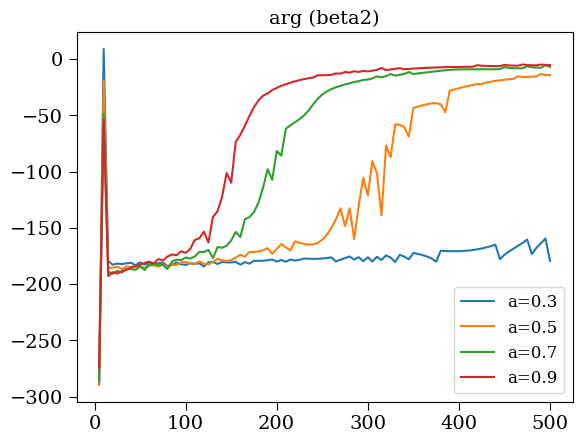

In [ ]:
for spinind in range(len(spins)):
    argb2here = -np.angle(np.sum(qvecs_varphi[spinind][-1]+1j*uvecs_varphi[spinind][-1], axis=1))*180/np.pi
    argb2here[argb2here>50] -= 360
    plt.plot(bvals, argb2here, label=f'a={spins[spinind]}')
plt.legend()
plt.title('arg (beta2)')

# Load GRMHD

In [ ]:
INC = 17*np.pi/180
inc = 17*np.pi/180
spins = np.array([0.5, 0.7])
rp = 1+np.sqrt(1-spins**2)
spinstring = ['5', '7']
imnames = [[f'im_a{spin}avg_inc17.h5'] for spin in spinstring]
tophalf = True
ims = [[eh.image.load_image(imname) for imname in imname0] for imname0 in imnames]
nphi = 500
pval = 0.7
thplus = 50*np.pi/180
dropfac = None #'maxreflect'
Rlimbvals_GRMHD = [[] for i in range(len(spins))]
Zlimbvals_GRMHD = [[] for i in range(len(spins))]
phivals_GRMHD = [[] for i in range(len(spins))]
b2_zpvals_GRMHD = [[] for i in range(len(spins))]
betavals_GRMHD = [[] for i in range(len(spins))]
varphivals_GRMHD = [[] for i in range(len(spins))]
b2_bvvals_GRMHD = [[] for i in range(len(spins))]
evpavals_GRMHD = [[] for i in range(len(spins))]
limbindvals1_GRMHD = [[] for i in range(len(spins))]
limbindvals2_GRMHD = [[] for i in range(len(spins))]

for i in range(len(spins)):
    spin = spins[i]
    for j in range(len(imnames[0])):
        Rlimbs, Zlimbs, limbind1, limbind2, evpahere, ihere, qhere, uhere, phi, b2_zp, betas, varphi, b2_bv = getinterp_GRMHD(ims[i][j], nphi, inc, phisign=1, dropfac=dropfac, pval=pval, thplus=thplus, spin=spin, nth=500, thmax=4.5*np.pi/180, tophalf=tophalf)
        Rlimbvals_GRMHD[i].append(Rlimbs)
        Zlimbvals_GRMHD[i].append(Zlimbs)
        limbindvals1_GRMHD[i].append(limbind1)
        limbindvals2_GRMHD[i].append(limbind2)
        betavals_GRMHD[i].append(betas)
        phivals_GRMHD[i].append(phi)
        varphivals_GRMHD[i].append(varphi)
        b2_zpvals_GRMHD[i].append(b2_zp)
        b2_bvvals_GRMHD[i].append(b2_bv)
        evpavals_GRMHD[i].append(evpahere)

offset = 1
evpalimbs1_grmhd = np.array([[[evpavals_GRMHD[i][j][k,limbindvals1_GRMHD[i][j][k]+256-offset+1] for k in range(len(limbindvals1_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))])
evpalimbs2_grmhd = np.array([[[evpavals_GRMHD[i][j][k,limbindvals2_GRMHD[i][j][k]+offset] for k in range(len(limbindvals2_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))])
evpaspines_grmhd = np.array([[evpavals_GRMHD[i][j][:,ims[i][j].xdim//2] for j in range(len(imnames[0]))] for i in range(len(spins))])

Loading hdf5 image:  im_a5avg_inc17.h5
   assuming source M87: ra 12.514 hr: dec 12.391 deg
Loading hdf5 image:  im_a7avg_inc17.h5
   assuming source M87: ra 12.514 hr: dec 12.391 deg


clipping values leq 0 in pol display


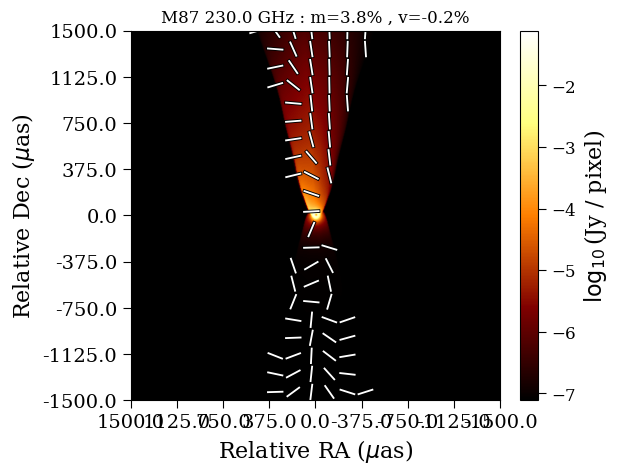

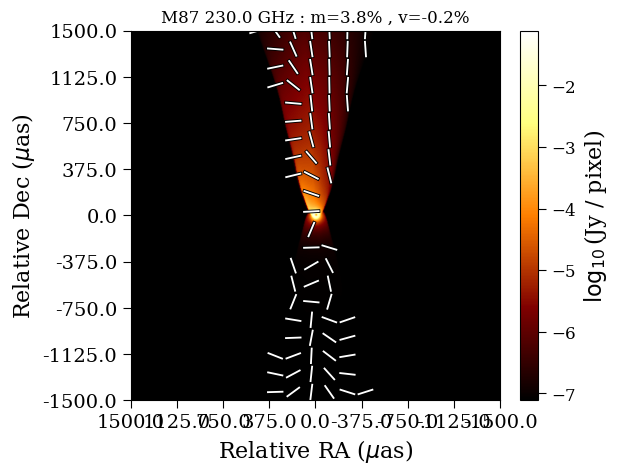

In [ ]:
ims[1][0].display(scale='log',plotp=True,pcut=1e-10,dynamic_range=[1e6])

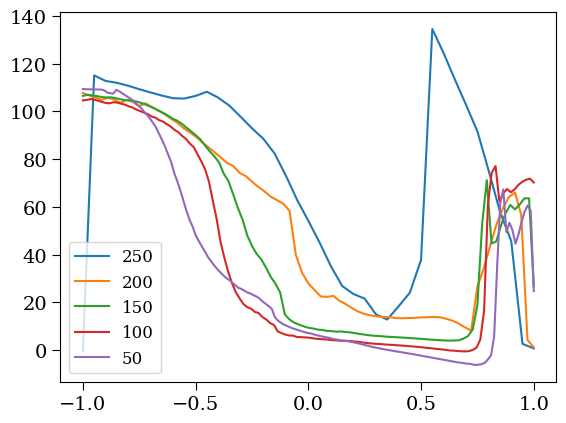

In [ ]:
bind = 5
offset = -10
for bind in range(250,0,-50):
    yvals = np.reshape(ims[1][0].evpavec,(512,512))[bind]*180/np.pi
    yvals[yvals<-10] += 180
    start = limbindvals2_GRMHD[1][0][bind]+offset
    end = limbindvals1_GRMHD[1][0][bind]+256-offset+1
    plt.plot(np.linspace(-1,1,end-start),yvals[start:end],label=bind)
plt.legend()

clipping values leq 0 in pol display


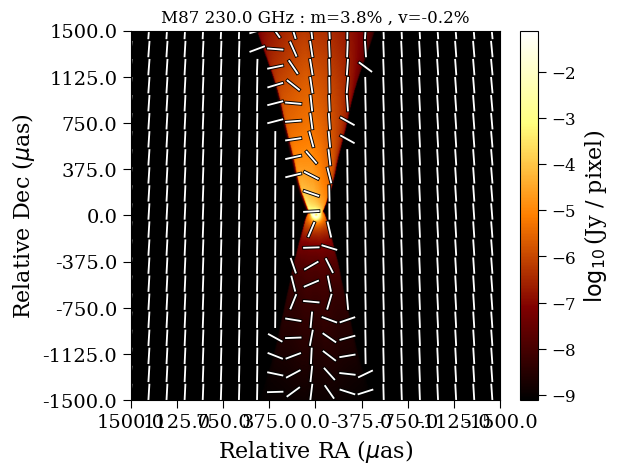

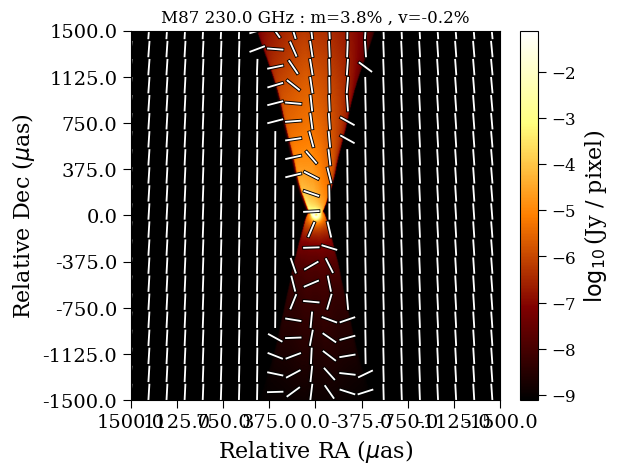

In [ ]:
ims[1][0].display(scale='log',plotp=True,pcut=0.0,dynamic_range=[1e8])

In [ ]:
offset = 3
evpalimbs1_grmhd = np.array([[[evpavals_GRMHD[i][j][k,limbindvals1_GRMHD[i][j][k]+256-offset+1] for k in range(len(limbindvals1_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))])
evpalimbs2_grmhd = np.array([[[evpavals_GRMHD[i][j][k,limbindvals2_GRMHD[i][j][k]+offset] for k in range(len(limbindvals2_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))])
evpaspines_grmhd = np.array([[evpavals_GRMHD[i][j][:,ims[i][j].xdim//2] for j in range(len(imnames[0]))] for i in range(len(spins))])

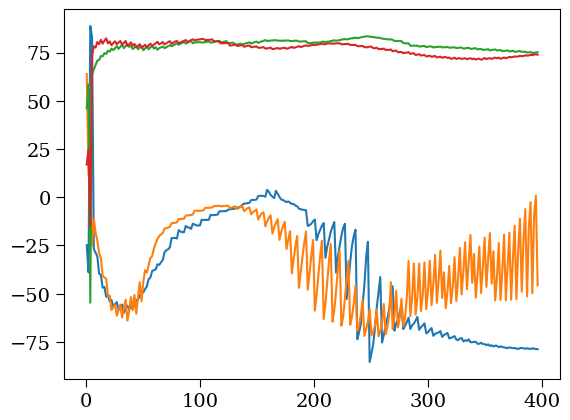

In [ ]:
for spinind in range(len(spins)):
    plt.plot(betavals_GRMHD[spinind][0],-evpalimbs1_grmhd[spinind][0]*180/np.pi)
for spinind in range(len(spins)):
    plt.plot(betavals_GRMHD[spinind][0],-evpalimbs2_grmhd[spinind][0]*180/np.pi)

clipping values leq 0 in pol display


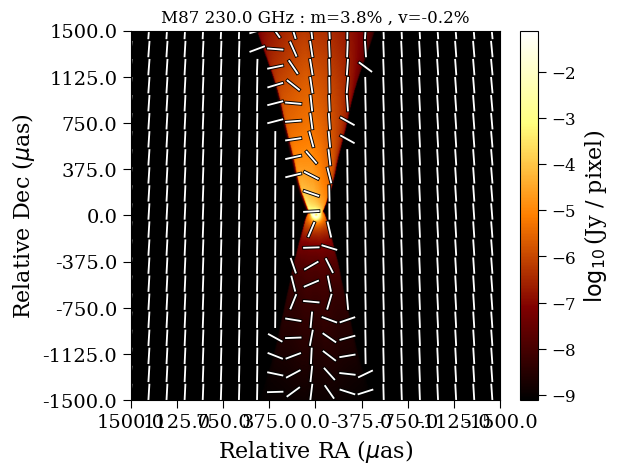

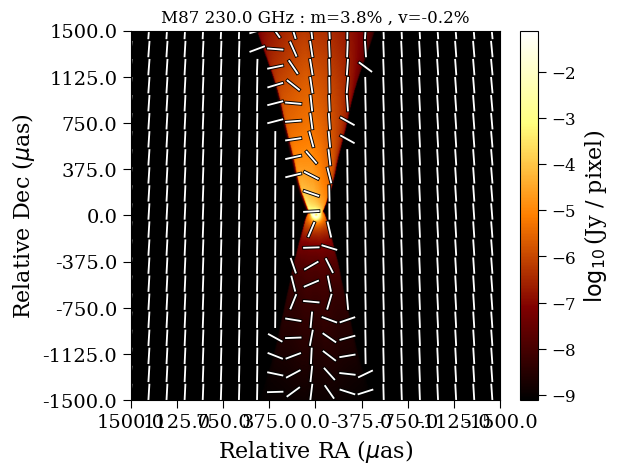

In [ ]:
ims[1][0].display(scale='log',dynamic_range=[1e8],plotp=True,pcut=0)

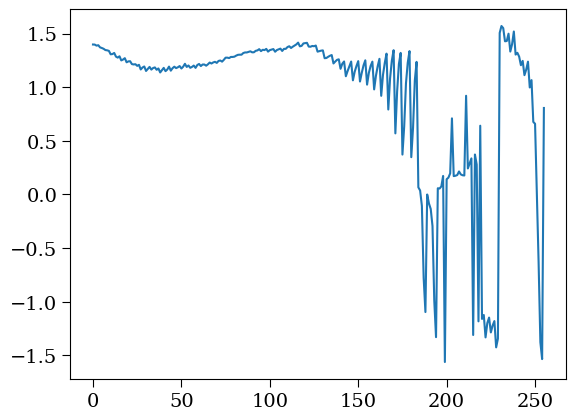

In [ ]:
plt.plot(evpalimbs1_grmhd[1][0])

In [ ]:
im = ims[2][0]
nx = im.xdim
ny = im.ydim
fov_muas = im.fovx()/eh.RADPERUAS
pxi = (np.arange(nx))/nx-0.5
pxi += (pxi[1]-pxi[0])/2
pxj = np.copy(pxi)
mui = pxi*fov_muas
muj = pxj*fov_muas
MUI,MUJ = np.meshgrid(mui,muj)
Marrx = (MUI/MoD)[:nx//2,:] if tophalf else (MUI/MoD)[nx//2:,:]
Marry = -(MUJ/MoD)[:nx//2,:] if tophalf else -(MUJ/MoD)[nx//2:,:]

In [ ]:
imvechere = np.reshape(ims[0][0].imvec,(nx, ny))[nx//2:,:]
dlogI = np.abs(np.log(np.roll(imvechere,-1,axis=1))-np.log(imvechere))
dlogI[imvechere<1e-14] = 0
limbind1 = np.argmax(dlogI[:,ny//2:],axis=1)
limbind2 = np.argmax(dlogI[:,:ny//2],axis=1)
# Rlimbvals = .5*(Marrx[0,ny//2:][limbind1]-Marrx[0,:ny//2][limbind2])
# Zlimbvals = (Marry[:,0])/np.sin(inc)


In [ ]:
limbind2 = np.argmax(imvechere,axis=1)
limbind1 = nx//2-limbind2
Rlimbvals = .5*(Marrx[0,ny//2:][limbind1]-Marrx[0,:ny//2][limbind2])
Zlimbvals = (Marry[:,0])/np.sin(inc)

IndexError: index 256 is out of bounds for axis 0 with size 256

In [ ]:
imvechere.shape

(256, 512)

clipping values leq 0 in pol display


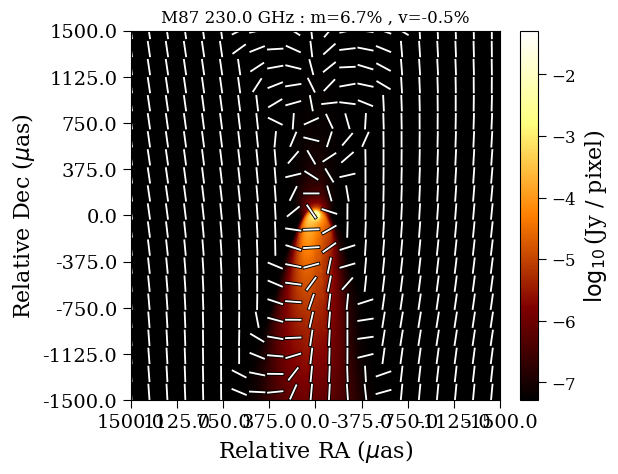

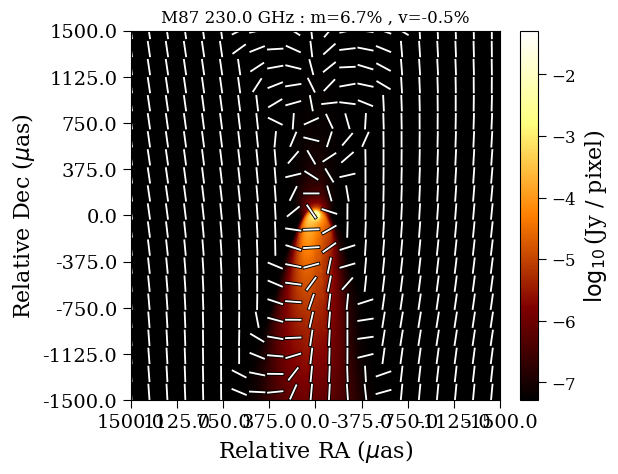

In [ ]:
ims[2][0].display(scale='log',plotp=True,pcut=0,dynamic_range=[1e6])

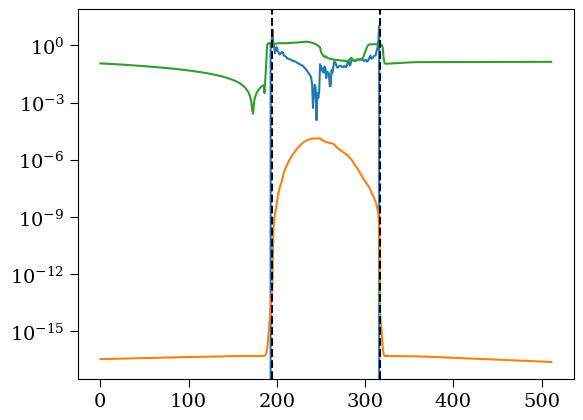

In [ ]:
ind = 100
evpahere = np.reshape(ims[2][0].evpavec,(nx, ny))[nx//2:,:]
plt.semilogy(np.abs(dlogI)[ind])
plt.semilogy(np.abs(imvechere)[ind])
plt.semilogy(np.abs(evpahere[ind]))
plt.axvline(limbind2[ind],color='k',linestyle='--')
plt.axvline(limbind1[ind]+256+1,color='k',linestyle='--')

In [ ]:
nx = 512
ny = 512
evpahere = np.reshape(ims[2][0].evpavec,(nx, ny))[nx//2:,:]

clipping values leq 0 in pol display


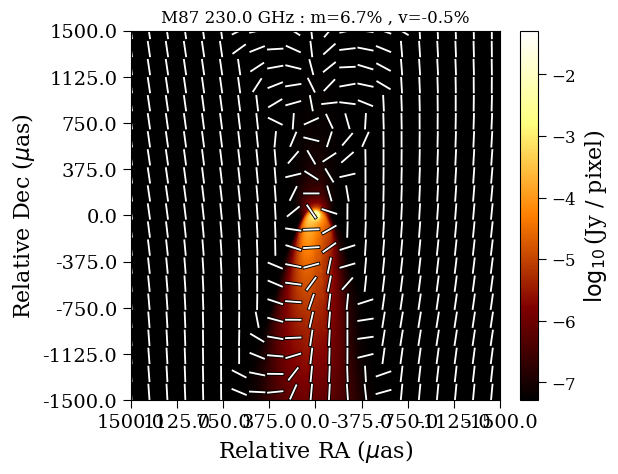

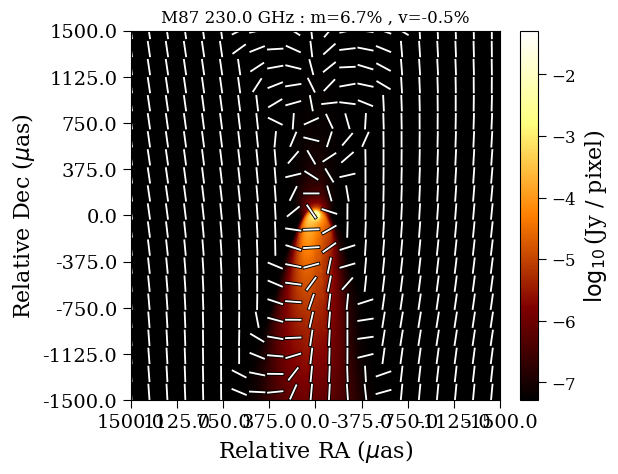

In [ ]:
ims[2][0].display(scale='log',plotp=True,pcut=0,dynamic_range=[1e6])

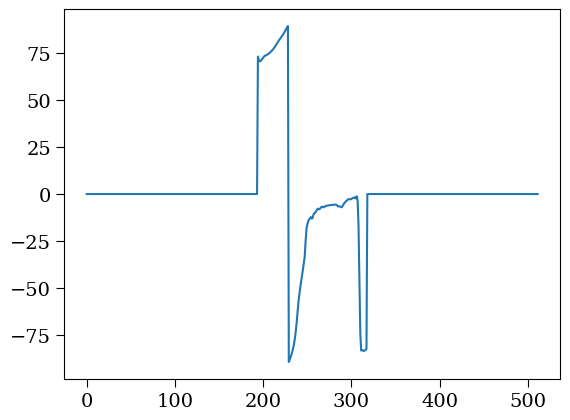

In [ ]:
nx = 512
ny = 512
evpahere = np.reshape(ims[2][0].evpavec,(nx, ny))[nx//2:,:]
imhere = np.reshape(ims[2][0].imvec,(nx, ny))[nx//2:,:]
yvals = evpahere[128]
yvals[imhere[128]<1e-8] = 0
plt.plot(yvals*180/np.pi)

clipping values leq 0 in pol display


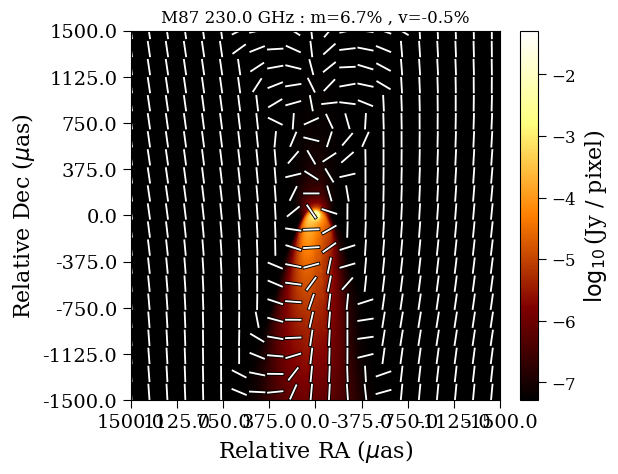

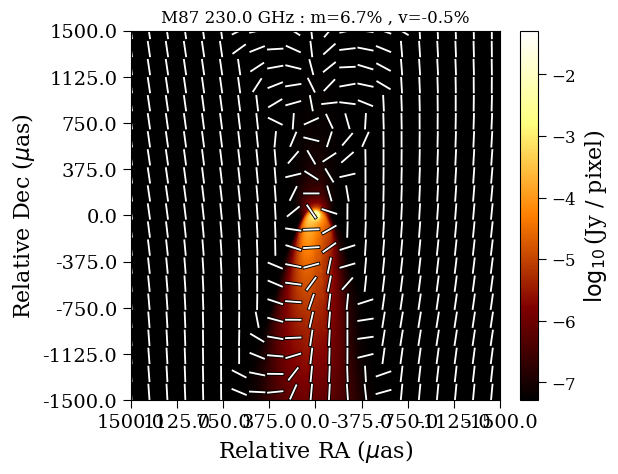

In [ ]:
ims[2][0].display(scale='log',dynamic_range=[1e6],plotp=True,pcut=0)

In [ ]:
offset = 10
evpalimbs1_grmhd = np.array([[[evpavals_GRMHD[i][j][k,limbindvals1_GRMHD[i][j][k]+256-offset+1] for k in range(len(limbindvals1_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))])
evpalimbs2_grmhd = np.array([[[evpavals_GRMHD[i][j][k,limbindvals2_GRMHD[i][j][k]+offset] for k in range(len(limbindvals2_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))])
evpaspines_grmhd = np.array([[evpavals_GRMHD[i][j][:,ims[i][j].xdim//2] for j in range(len(imnames[0]))] for i in range(len(spins))])

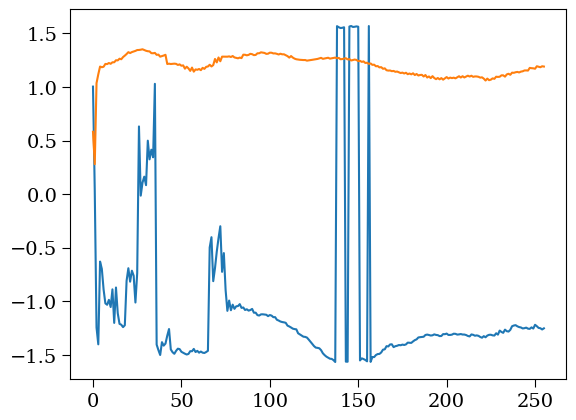

In [ ]:
plt.plot(evpalimbs1_grmhd[2][0])
plt.plot(evpalimbs2_grmhd[2][0])

/tmp/ipykernel_4635/96745177.py:2: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


clipping values leq 0 in pol display
clipping values leq 0 in pol display


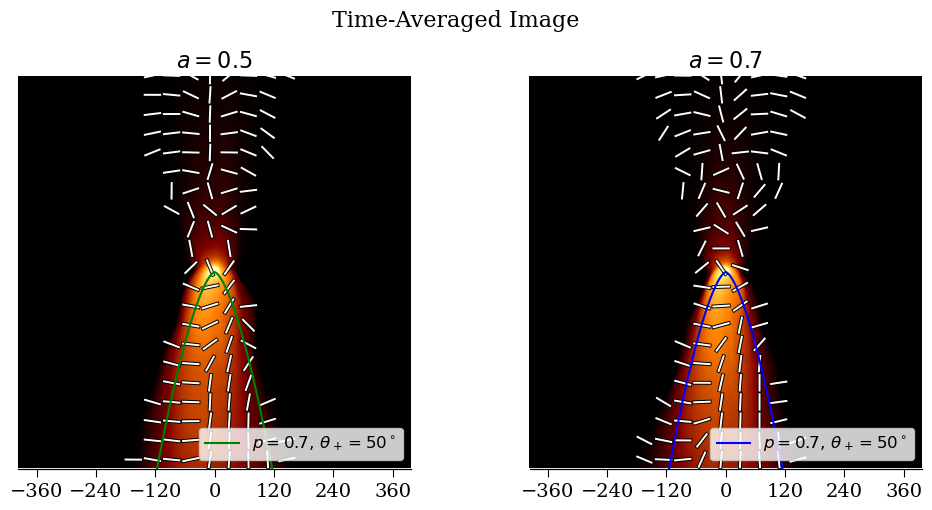

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(10,5), constrained_layout=True)
fig.tight_layout()
psitarget = rp**pval*(1-np.cos(thplus))
nth = 1000
thvals = np.linspace(thplus, 1*np.pi/180,nth)
colors = ['g', 'b']
iminds = [1,2]
for i in range(len(iminds)):
    imind = iminds[i]
    rvals = (psitarget[i]/(1-np.cos(thvals)))**(1/pval)
    Rvals = rvals*np.sin(thvals)
    Zvals = rvals*np.cos(thvals)
    alphavals = np.copy(Rvals)
    betavals = -Zvals*np.sin(inc)
    rownew, colnew = Mtopix(ims[1][0], alphavals, betavals)
    ax[i].plot(rownew, colnew,color=colors[i])
    rownew, colnew = Mtopix(ims[1][0], -alphavals, betavals)
    ax[i].plot(rownew, colnew,color=colors[i],label=r'$p={},\,\theta_+={}^\circ$'.format(str(pval),str(int(thplus*180/np.pi))))
    ims[imind][0].display(scale='log',plotp=True,pcut=1e-10,dynamic_range=[1e7],axis=ax[i],has_title=False,label_type=None,has_cbar=False)
    ax[i].set(xlim=(0,ims[1][0].xdim),ylim=(ims[1][0].ydim,0))
ax[0].set_title(r'$a=0.5$',fontsize=16)
ax[1].set_title(r'$a=0.7$',fontsize=16)
ax[0].legend(loc='lower right')
ax[1].legend(loc='lower right')

plt.suptitle('Time-Averaged Image', fontsize=16,y=1.05)
for i in range(2):
    ax_position = ax[i].get_position()
    bar_height = 0.05
    NPTS = ims[0][0].xdim
    bmax5 = ims[0][0].fovx()/eh.RADPERUAS/MoD/2
    ax_ticks = fig.add_axes([ax_position.x0+ax_position.width/NPTS/2, ax_position.y0, ax_position.width-ax_position.width/NPTS, 0])
    ax_ticks.set_xlim(-bmax5, bmax5)
    ax_ticks.set_ylim(0, 1)  # Keep the height small to make it look like a bar
    ax_ticks.xaxis.set_ticks(np.linspace(-360, 360, 7))
    ax_ticks.yaxis.set_ticks([])  # Hide y-axis ticks

# plt.savefig('Figures/GRMHD_images_ZAMO.pdf',bbox_inches='tight',dpi=300)
# plt.savefig('Figures/GRMHD_images_ZAMO.png',bbox_inches='tight',dpi=300)

# Space geodesics in $\phi$ and include limbs separately

In [ ]:
#define parameters
ROUT = 4.e10 # sgra distance in M
Nphi = 21 #number of points in row on image
alphafac = 1.0-1e-5 #smush in
Nz = 100
INC = 17*np.pi/180
Zmin = 5 #np.min(np.abs(b2pars_noeps_17[0][0]/MoD))*.5
Zmax = 1e4/np.sin(INC) #np.max(np.abs(b2pars_noeps_17[0][0]/MoD))
Zvals_plan = np.logspace(np.log10(Zmin), np.log10(Zmax), Nz)

NGEO = 50000 #number of points per geodesic (for guessing before root-finder)
neqmax = 2
model = 'power'

spins = np.array([0.3, 0.5, 0.7, 0.9])
spinstring = np.char.mod('%i', spins*10)
rp = 1+np.sqrt(1-spins**2)
pval = 0.7
thplus = 50*np.pi/180
psitarget = rp**pval*(1-np.cos(thplus))

minphi = np.pi/2
maxphi = 3*np.pi/2
phivals_plan = np.linspace(minphi, maxphi, Nphi)
phivals_plan = [phivals_plan[0], phivals_plan[1], phivals_plan[2], phivals_plan[Nphi//2], phivals_plan[-3], phivals_plan[-2], phivals_plan[-1]]
Nphi = len(phivals_plan)
phigrid, Zgrid = np.meshgrid(phivals_plan, Zvals_plan)

Rgrid = []
alphagrid = []
betagrid = []
for i in range(len(spins)):
    solveR = lambda Rvals : np.sqrt(Rvals**2+Zvals_plan**2)**pval*(1-Zvals_plan/np.sqrt(Rvals**2+Zvals_plan**2))-psitarget[i]
    Rhere = opt.newton(solveR, np.ones_like(Zvals_plan))
    phigrid2, Rgridhere = np.meshgrid(phivals_plan, Rhere)
    Rgrid.append(Rgridhere)
    alphagridhere = Rgrid[i]*np.cos(phigrid-np.pi/2)
    betagridhere = Zgrid*np.sin(INC)+Rgrid[i]*np.cos(INC)*np.sin(phigrid-np.pi/2)
    
    # alphagrid.append(alphagridhere)
    # betagrid.append(betagridhere)
    
    rhere = np.sqrt(Rhere**2+Zvals_plan**2)
    Ylimb = -(Rhere**2+pval*Zvals_plan*(Zvals_plan-rhere))/np.tan(INC)/(pval*(rhere-Zvals_plan)+Zvals_plan)
    Xlimb = np.sqrt(Rhere**2-Ylimb**2)
    
    zeros_begin = np.zeros((alphagridhere.shape[0], 1))
    zeros_end = np.zeros((alphagridhere.shape[0], 1))
    alphanew = np.hstack((zeros_begin, alphagridhere, zeros_end))
    betanew = np.hstack((zeros_begin, betagridhere, zeros_end))
    alphanew[:,0] = np.copy(Xlimb)*alphafac
    betanew[:,0] = (Ylimb*np.cos(INC)+Zvals_plan*np.sin(INC))
    alphanew[:,-1] = -np.copy(Xlimb)*alphafac
    betanew[:,-1] = (Ylimb*np.cos(INC)+Zvals_plan*np.sin(INC))
    
    alphagrid.append(alphanew)
    betagrid.append(betanew)
    
    # Xgrid[:,0] = -np.copy(Xlimb) #left (approaching) limb
    # Xgrid[:,1] = np.zeros_like(Xlimb) #spine
    # Xgrid[:,2] = np.copy(Xlimb) #right (receding) limb
    # Ygrid[:,0] = np.copy(Ylimb) #left (approaching) limb
    # Ygrid[:,1] = np.copy(Rhere) #spine
    # Ygrid[:,2] = np.copy(Ylimb) #right (receding) limb
    
    # alphagrid.append(np.copy(Xgrid)*alphafac)
    # betagrid.append(Ygrid*np.cos(INC)+Zgrid*np.sin(INC))

# alphagrid = bgrid*np.cos(varphigrid)
# betagrid = bgrid*np.sin(varphigrid)

incs = np.array([17*np.pi/180]) #np.array([0.01, 8.5, 17, 25.5, 34])*np.pi/180
incstring = np.char.mod('%.1f', incs*180/np.pi)
Nphi += 2

# outgeos = []
# for spinind in range(len(spins)):
#     for i in list(range(len(incs))):
#         inc = incs[i]
#         spin = spins[spinind]
#         print(inc*180/np.pi, spin)
#         outgeo = raytrace_ana(a=spin,
#                 observer_coords = [0,ROUT,inc,0],
#                 image_coords = [alphagrid[spinind].flatten(), betagrid[spinind].flatten()], #assumes 1D arrays of alpha and beta
#                 ngeo=NGEO,
#                 do_phi_and_t=True,
#                 savedata=False, plotdata=False)
#         outname = f'pklgeo_gen/geo_inc{incstring[i]}_spin{int(spin*10)}_phi.pkl'
#         with open(outname, 'wb') as file:
#             pickle.dump(outgeo, file)
#         file.close()
#         outgeos.append(outgeo)
        
# for spin in spinstring:
#     for i in list(range(len(incs))):
#         inc = incs[i]
#         print(inc*180/np.pi, spin)
#         outname = f'pklgeo_gen/geo_inc{incstring[i]}_spin{int(spin*10)}_phi.pkl'
#         with open(outname, 'rb') as file:
#             outgeo = pickle.load(file)
#             outgeos.append(outgeo)
#         file.close()
# print('done')

/tmp/ipykernel_22633/3499860228.py:45: RuntimeWarning: invalid value encountered in sqrt
  Xlimb = np.sqrt(Rhere**2-Ylimb**2)


# Now load semianalytic stuff

In [ ]:
model = 'power'
vel = 'driftframe'
gammamax = 2.0
spinind = 1
phisign = 1
imageind = 1
psitarget = rp**pval*(1-np.cos(thplus)) # 1-np.cos(5*np.pi/180)
sigmaplasma = 1
emit = 'sigma'
pathcor='R'
specind = 1
anis = None
R_all = [[] for i in range(3)]
Z_all = [[] for i in range(3)]
phi_all = [[] for i in range(3)]
Zlc_all = [[] for i in range(3)]
Rlc_all = [[] for i in range(3)]
Zinterp_all = [[] for i in range(3)]
Rlc_all = [[] for i in range(3)]
Zlc_all = [[] for i in range(3)]
b2_zpvals = [[] for i in range(3)]
b2_bvvals = [[] for i in range(3)]
I_all = [[] for i in range(3)]
Q_all = [[] for i in range(3)]
U_all = [[] for i in range(3)]
evpa_all = [[] for i in range(3)]
limbindvals1 = [[] for i in range(3)]
limbindvals2 = [[] for i in range(3)]
evpavals = [[] for i in range(3)]
# evpa_zpvals = []
# evpalimb1vals = []
# evpalimb2vals = []
# evpaspinevals = []
for spinind in range(len(spins)):
    outname = f'pklgeo_gen/geo_inc{incstring[0]}_spin{int(spin*10)}_phi.pkl'
    with open(outname, 'rb') as file:
        outgeo = pickle.load(file)
    file.close()
    for imageind in range(2):
        signpr, signptheta, neqvals, rvals, thvals, Zvals, Rvals, phivals, Rlc, Zlc, b2vals, OmegaF = getcoords(outgeo, psitarget[spinind], INC, spins[spinind], model, pval, vel, imageind, Nz, Nphi, alphagrid[spinind], betagrid[spinind], neqmax=neqmax)
        print(Rlc, Zlc)
        ivec, qvec, uvec = getinfo(signpr, signptheta, neqvals, rvals, thvals, INC, spins[spinind], model, pval, vel, alphagrid[spinind], betagrid[spinind], gammamax=gammamax, neqmax=neqmax)
        dlogI = np.abs(np.log(np.roll(ivec[0],-1,axis=1))-np.log(ivec[0]))
        dlogI[ivec[0]<1e-14] = 0
        # limbindvals1.append(np.argmax(dlogI[:,nphi//2:],axis=1))
        # limbindvals2.append(np.argmax(dlogI[:,:nphi//2],axis=1))
        I_all[imageind].append(ivec[0])
        Q_all[imageind].append(qvec[0])
        U_all[imageind].append(uvec[0])
        b2_zpvals[imageind].append((qvec[0]+1j*uvec[0])*np.exp(-1j*2*(phisign*phivals)))
        evpavals[imageind].append(.5*np.angle(qvec[0]+1j*uvec[0]))
        # Zlimbvals = (Marry[:,0])/np.sin(inc)
        varphigrid = np.nan_to_num(np.arctan2(alphagrid[spinind],betagrid[spinind]))
        bgrid = np.nan_to_num(np.sqrt(alphagrid[spinind]**2+betagrid[spinind]**2))
        # b2_bv, b2_bv_orig, b2_bp, b2_bp_orig, b2_zv, b2_zv_orig, b2_zp, b2_zp_orig, phiinterp, Zinterp, Qzp, Uzp = getinterp(qvec, uvec, varphigrid, bgrid, Zvals, phivals, phisign = 1.0)
        # evpa_zp = .5*np.angle(Qzp+1j*Uzp)
        R_all[imageind].append(Rvals)
        Rlc_all[imageind].append(Rlc)
        Z_all[imageind].append(Zvals)
        phi_all[imageind].append(phivals)
        Zlc_all[imageind].append(Zlc)
        # Zinterp_all.append(Zinterp)
        # Qzp_all.append(Qzp)
        # Uzp_all.append(Uzp)
        # b2_zpvals.append(b2_zp)
        # b2_bvvals.append(b2_bv_orig)
        # b2_bvvals[imageind].append(b2_bv)
        # evpa_zpvals.append(evpa_zp)
    I_all[2].append(I_all[0][spinind]+I_all[1][spinind])
    Q_all[2].append(Q_all[0][spinind]+Q_all[1][spinind])
    U_all[2].append(U_all[0][spinind]+U_all[1][spinind])
    evpavals[2].append(.5*np.angle(Q_all[2][spinind]+1j*U_all[2][spinind]))
    # b2_bvvals[2].append(b2_bvvals[0][spinind]+b2_bvvals[1][spinind])
    # evpalimbs1 = np.array([[evpavals[i][k,limbindvals1[i][k]+nphi//2] for k in range(len(limbindvals1[i]))] for i in range(len(evpavals))])
    # evpalimbs2 = np.array([[evpavals[i][k,limbindvals2[i][k]] for k in range(len(limbindvals2[i]))] for i in range(len(evpavals))])
    # evpaspines = np.array([evpavals[i][:,nphi//2] for i in range(len(evpavals))])
    # betas1 = np.array([[bgrid[k,limbindvals1[i][k]+nphi//2]*np.sin(varphigrid[k,limbindvals1[i][k]+nphi//2]) for k in range(len(limbindvals1[i]))] for i in range(len(evpavals))])
    # betas2 = np.array([[bgrid[k,limbindvals2[i][k]]*np.sin(varphigrid[k,limbindvals2[i][k]]) for k in range(len(limbindvals2[i]))] for i in range(len(evpavals))])

NameError: name 'spin' is not defined

In [ ]:
model = 'power'
vel = 'driftframe'
gammamaxvals = [2.0] #, 3.0, 4.0, 5.0]
spinind = 1
psitarget = rp**pval*(1-np.cos(thplus)) # 1-np.cos(5*np.pi/180)
sigmaplasma = 1
emit = 'sigma'
pathcor='R'
specind = 0.5
anis = None
R_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Z_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
th_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
phi_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Zlc_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Rlc_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Zinterp_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Rlc_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Zlc_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
b2_zpvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
b2_bvvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
I_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Q_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
U_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
evpa_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
limbindvals1 = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
limbindvals2 = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
evpavals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
OmegaFvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
kprvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
kpthetavals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
kpphivals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
fthetavals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Bprvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Bpthetavals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Bpphivals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
vrvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
# urvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]

for spinind in range(len(spins)):
    spin = spins[spinind]
    outname = f'pklgeo_gen/geo_inc{incstring[0]}_spin{int(spin*10)}_phi.pkl'
    with open(outname, 'rb') as file:
        outgeo = pickle.load(file)
    file.close()
    for gammaind in range(len(gammamaxvals)):
        for imageind in range(2):
            phisign = 1 if imageind == 1 else -1
            signpr, signptheta, neqvals, rvals, thvals, Zvals, Rvals, phivals, Rlc, Zlc, b2vals, OmegaF = getcoords(outgeo, psitarget[spinind], INC, spins[spinind], model, pval, vel, imageind, Nz, Nphi, alphagrid[spinind], betagrid[spinind], neqmax=neqmax)
            (kp_t, kp_x, kp_y, kp_z, Bp_x, Bp_y, Bp_z, ut, ur) = getkB(alphagrid[spinind], betagrid[spinind], spins[spinind], signpr, signptheta, neqvals, rvals, thvals, Zvals, Rvals, phivals, Rlc, Zlc, b2vals, OmegaF, sigmaplasma=sigmaplasma, gammamax=gammamaxvals[gammaind], pval=pval, velmodel=vel, model=model)
            kprvals[imageind][gammaind].append(np.reshape(kp_x,(Nz,Nphi)))
            kpthetavals[imageind][gammaind].append(np.reshape(kp_y,(Nz,Nphi)))
            kpphivals[imageind][gammaind].append(np.reshape(kp_z,(Nz,Nphi)))
            Bprvals[imageind][gammaind].append(np.reshape(Bp_x,(Nz,Nphi)))
            Bpthetavals[imageind][gammaind].append(np.reshape(Bp_y,(Nz,Nphi)))
            Bpphivals[imageind][gammaind].append(np.reshape(Bp_z,(Nz,Nphi)))
            vrvals[imageind][gammaind].append(np.reshape(ur/ut,(Nz,Nphi)))
            fthetahere = kprvals[imageind][gammaind][spinind]*Bpphivals[imageind][gammaind][spinind]-kpphivals[imageind][gammaind][spinind]*Bprvals[imageind][gammaind][spinind]
            fthetavals[imageind][gammaind].append(fthetahere)
            print(Rlc, Zlc, np.min(Zvals))
            ivec, qvec, uvec = getinfo(signpr, signptheta, neqvals, rvals, thvals, INC, spins[spinind], model, pval, vel, alphagrid[spinind], betagrid[spinind], gammamax=gammamaxvals[gammaind], neqmax=neqmax, specind=specind)
            dlogI = np.abs(np.log(np.roll(ivec[0],-1,axis=1))-np.log(ivec[0]))
            dlogI[ivec[0]<1e-14] = 0
            # b2_zpvals[imageind].append((qvec[0]+1j*uvec[0])*np.exp(-1j*2*(phisign*phivals)))
            I_all[imageind][gammaind].append(ivec[0])
            Q_all[imageind][gammaind].append(qvec[0])
            U_all[imageind][gammaind].append(uvec[0])
            evpavals[imageind][gammaind].append(.5*np.angle(qvec[0]+1j*uvec[0]))
            OmegaFvals[imageind][gammaind].append(OmegaF)
            R_all[imageind][gammaind].append(Rvals)
            th_all[imageind][gammaind].append(np.reshape(thvals,(Nz,Nphi)))
            Rlc_all[imageind][gammaind].append(Rlc)
            Z_all[imageind][gammaind].append(Zvals)
            phi_all[imageind][gammaind].append(phivals)
            Zlc_all[imageind][gammaind].append(Zlc)
        print('adding')
        I_all[2][gammaind].append(I_all[0][gammaind][spinind]+I_all[1][gammaind][spinind])
        Q_all[2][gammaind].append(Q_all[0][gammaind][spinind]+Q_all[1][gammaind][spinind])
        U_all[2][gammaind].append(U_all[0][gammaind][spinind]+U_all[1][gammaind][spinind])
        # b2_zpvals[2][gammaind].append((Q_all[2][gammaind][spinind]+1j*U_all[2][gammaind][spinind])*np.exp(-1j*2*(phi_all[0][gammaind][spinind])))
        evpavals[2][gammaind].append(.5*np.angle(Q_all[2][gammaind][spinind]+1j*U_all[2][gammaind][spinind]))

(4, 900)
before solve
after solve
gammafac 1.1266813384447956
hiii
gammafac 1.1266813384447956
hiii
26.360545285320097 137.0606990308814 0.0
gammafac 1.1266813384447956
hiii
gammafac 1.1266813384447956
hiii


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:517: RuntimeWarning: invalid value encountered in divide
  dpsidr = p*psi/r
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:525: RuntimeWarning: invalid value encountered in divide
  Br = C*dpsidtheta / gdet
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:527: RuntimeWarning: invalid value encountered in divide
  Bph = I / (2*np.pi*Delta*sth2)
/tmp/ipykernel_22633/2378339416.py:28: RuntimeWarning: divide by zero encountered in divide
  g33_up = (Delta - a2*sth2)/(Sigma*Delta*sth2)
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equatorial_images.py:302: RuntimeWarning: divide by zero encountered in divide
  TH = eta + a2*cth2 - lam*lam*cth2/sth2
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equatorial_images.py:305: RuntimeWarning: invalid value encountered in sqrt
  g = 1 / (1*u0 - lam*u3 - np.sign(kth_sign)*u2*np.sqrt(TH) - np.sign(kr_sign)*u1*np.sqrt(R

(4, 900)
before solve
after solve
gammafac 1.1266812118384175
hiii
gammafac 1.1266812118384175
hiii
26.174122466832483 135.56057228279516 0.0
gammafac 1.1266812118384175
hiii
gammafac 1.1266812118384175
hiii
adding
(4, 900)
before solve


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:204: RuntimeWarning: RMS of 0.000264995 reached
  outqty = scipy.optimize.newton(get_coord_intersect, guesses, maxiter=500, tol=tol)


after solve
gammafac 1.1328548756166341
hiii
gammafac 1.1328548756166341
hiii
15.818748042798001 63.57369577287683 0.0
gammafac 1.1328548756166341
hiii
gammafac 1.1328548756166341
hiii
(4, 900)
before solve
after solve
gammafac 1.1328549591540493
hiii
gammafac 1.1328549591540493
hiii
16.12328933023664 65.49137476382884 0.0
gammafac 1.1328549591540493
hiii
gammafac 1.1328549591540493
hiii
adding
(4, 900)
before solve


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:204: RuntimeWarning: RMS of 0.000264114 reached
  outqty = scipy.optimize.newton(get_coord_intersect, guesses, maxiter=500, tol=tol)


after solve
gammafac 1.1400744849246074
hiii
gammafac 1.1400744849246074
hiii
11.3766664811139 39.84921614371051 0.0
gammafac 1.1400744849246074
hiii
gammafac 1.1400744849246074
hiii
(4, 900)
before solve
after solve
gammafac 1.1390075144319576
hiii
gammafac 1.1390075144319576
hiii
11.183282972326637 38.794080596194505 0.0
gammafac 1.1390075144319576
hiii
gammafac 1.1390075144319576
hiii
adding
(4, 900)
before solve


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:204: RuntimeWarning: RMS of 0.000263407 reached
  outqty = scipy.optimize.newton(get_coord_intersect, guesses, maxiter=500, tol=tol)


after solve
gammafac 1.1457403125816945
hiii
gammafac 1.1457403125816945
hiii
8.584084247057014 28.338601105904775 0.0
gammafac 1.1457403125816945
hiii
gammafac 1.1457403125816945
hiii
(4, 900)
before solve
after solve
gammafac 1.1440933325336864
hiii
gammafac 1.1440933325336864
hiii
8.634178754487118 28.598367599069416 0.0
gammafac 1.1440933325336864
hiii
gammafac 1.1440933325336864
hiii
adding


(5.0, 1000.0)

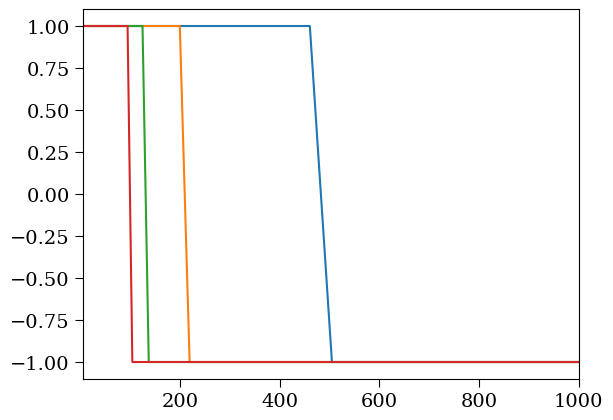

In [ ]:
plt.semilogx(betagrid[0][:,0],np.sign(fthetavals[0][0][0][:,0]))
plt.semilogx(betagrid[1][:,0],np.sign(fthetavals[0][0][1][:,0]))
plt.semilogx(betagrid[2][:,0],np.sign(fthetavals[0][0][2][:,0]))
plt.semilogx(betagrid[3][:,0],np.sign(fthetavals[0][0][3][:,0]))
plt.xscale('linear')
plt.xlim(5,1000)

In [ ]:
varphigrid = np.nan_to_num(np.arctan2(betagrid[0],alphagrid[0]))
bgrid = np.nan_to_num(np.sqrt(alphagrid[0]**2+betagrid[0]**2))
varphiinterp = np.linspace(0, np.pi, 100)
binterp = np.linspace(5,300,100)
vginterp, bginterp = np.meshgrid(varphiinterp, binterp)
# Interpolate using griddata
Qbv = scint.griddata((varphigrid.flatten(), bgrid.flatten()), Q_all[2][0].flatten(), (vginterp, bginterp), method='cubic')
Ubv = scint.griddata((varphigrid.flatten(), bgrid.flatten()), U_all[2][0].flatten(), (vginterp, bginterp), method='cubic')
b2_bv = np.nan_to_num((Qbv+1j*Ubv)*np.exp(2*1j*(-vginterp-np.pi/2)))
# b2_bv_orig = np.nan_to_num((qvec[0]+1j*uvec[0])*np.exp(2*1j*(-vginterp-np.pi/2)))
argb2_bv = np.angle(b2_bv)

802.1556924711948


(-90.0, 90.0)

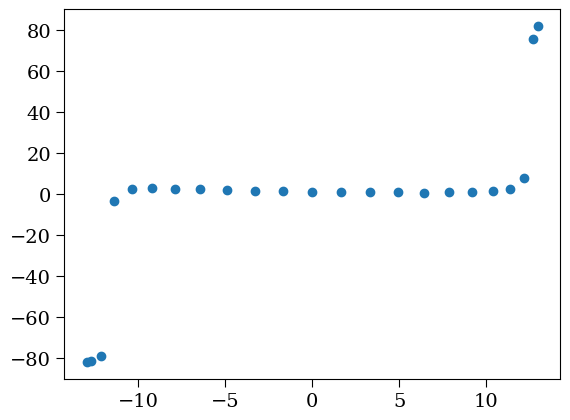

In [ ]:
imageind = 2
bind = 35
print(Zvals_plan[bind]*np.sin(INC))
varphihere = np.arctan2(alphagrid[spinind][bind],betagrid[spinind][bind])*180/np.pi
yvals = evpavals[imageind][spinind][bind,:]*180/np.pi
yvals2 = np.copy(yvals)
for i in range(1,len(yvals2),1):
    possiblevalues = np.array([yvals[i],yvals[i]-180,yvals[i]+180])
    minhere = np.argmin(np.abs(yvals2[i-1]-possiblevalues))
    yvals2[i] = possiblevalues[minhere]
# yvals[yvals<0] += 180
# yvals[yvals>90]-= 180
# yvals2[yvals2<-20]+= 180
plt.plot(varphihere,yvals2,'o')
plt.ylim(-90,90)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


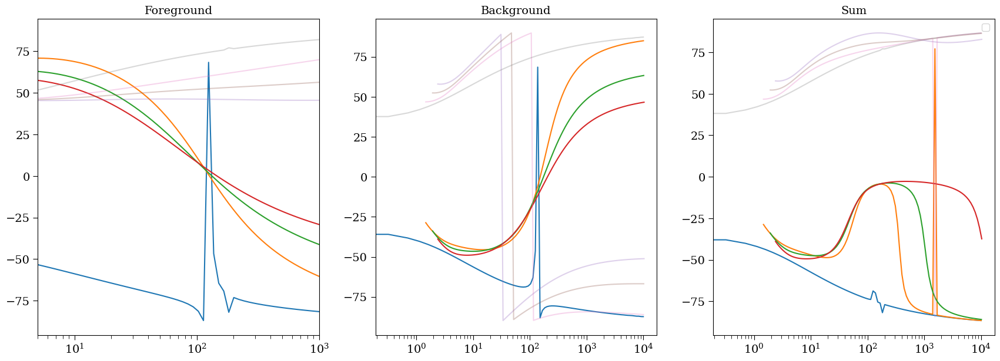

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(21,7))
imageind = 0
spinind = 2
gammaind = 0
colors = ['r','g','orange','blue','brown','purple','pink','magenta']
for phiind in range(Nphi):
    if phiind == Nphi//2:
        continue
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    if phiind>Nphi//2:
        ax[0].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind,alpha=0.3)
    else:
        ax[0].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind)
plt.legend()

imageind = 1
spinind = 2
gammaind = 0
colors = ['r','g','orange','blue','brown','purple','pink','magenta']
for phiind in range(Nphi):
    if phiind == Nphi//2:
        continue
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    if phiind>Nphi//2:
        ax[1].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind,alpha=0.3)
    else:
        ax[1].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind)
        
imageind = 2
spinind = 2
gammaind = 0
colors = ['r','g','orange','blue','brown','purple','pink','magenta']
for phiind in range(Nphi):
    if phiind == Nphi//2:
        continue
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    if phiind>Nphi//2:
        ax[2].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind,alpha=0.3)
    else:
        ax[2].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind)
# imageind = 2
# phiinds = [0,1,2,3] #[0,1,2,3,4,5,6]
# colors = ['r','g','orange','blue','brown','purple','pink']
# for i in range(len(phiinds)):
#     phiind = phiinds[i]
#     yvals = -evpavals[imageind][spinind][:,phiind]*180/np.pi
#     plt.semilogx(betagrid[spinind][:,phiind], yvals, label=phiinds[i],color=colors[i],alpha=0.3)
# plt.axvline(betagrid[spinind][bind,phiind])
# # plt.xlim(5,5e3)
ax[0].set_yscale('linear')
ax[0].set_xlim(5,1e3)
ax[0].set_title('Foreground')
ax[1].set_title('Background')
ax[2].set_title('Sum')
# plt.xscale('linear')
# plt.xlim(5,1000)
plt.savefig('Figures/semi_limb_pol.pdf',bbox_inches='tight', dpi=300)
plt.savefig('Figures/semi_limb_pol.png',bbox_inches='tight', dpi=300)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


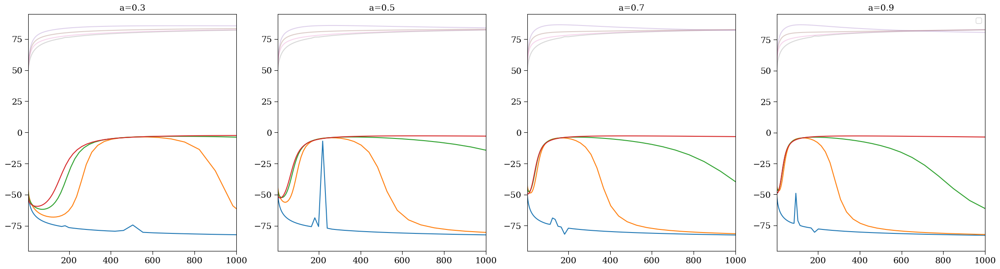

In [ ]:
fig, ax = plt.subplots(1,4,figsize=(28,7))
imageind = 2
spinind = 0
gammaind = 0
colors = ['r','g','orange','blue','brown','purple','pink','magenta']
for phiind in range(Nphi):
    if phiind == Nphi//2:
        continue
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    if phiind>Nphi//2:
        ax[0].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind,alpha=0.3)
    else:
        ax[0].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind)
plt.legend()

imageind = 2
spinind = 1
gammaind = 0
colors = ['r','g','orange','blue','brown','purple','pink','magenta']
for phiind in range(Nphi):
    if phiind == Nphi//2:
        continue
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    if phiind>Nphi//2:
        ax[1].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind,alpha=0.3)
    else:
        ax[1].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind)
        
imageind = 2
spinind = 2
gammaind = 0
colors = ['r','g','orange','blue','brown','purple','pink','magenta']
for phiind in range(Nphi):
    if phiind == Nphi//2:
        continue
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    if phiind>Nphi//2:
        ax[2].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind,alpha=0.3)
    else:
        ax[2].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind)
        
imageind = 2
spinind = 3
gammaind = 0
colors = ['r','g','orange','blue','brown','purple','pink','magenta']
for phiind in range(Nphi):
    if phiind == Nphi//2:
        continue
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    if phiind>Nphi//2:
        ax[3].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind,alpha=0.3)
    else:
        ax[3].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind)
# imageind = 2
# phiinds = [0,1,2,3] #[0,1,2,3,4,5,6]
# colors = ['r','g','orange','blue','brown','purple','pink']
# for i in range(len(phiinds)):
#     phiind = phiinds[i]
#     yvals = -evpavals[imageind][spinind][:,phiind]*180/np.pi
#     plt.semilogx(betagrid[spinind][:,phiind], yvals, label=phiinds[i],color=colors[i],alpha=0.3)
# plt.axvline(betagrid[spinind][bind,phiind])
# # plt.xlim(5,5e3)
ax[0].set_yscale('linear')
ax[0].set_xlim(5,1e3)
ax[0].set_title('a=0.3')
ax[1].set_title('a=0.5')
ax[2].set_title('a=0.7')
ax[3].set_title('a=0.9')
for i in range(4):
    ax[i].set_xscale('linear')
    ax[i].set_xlim(5,1000)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


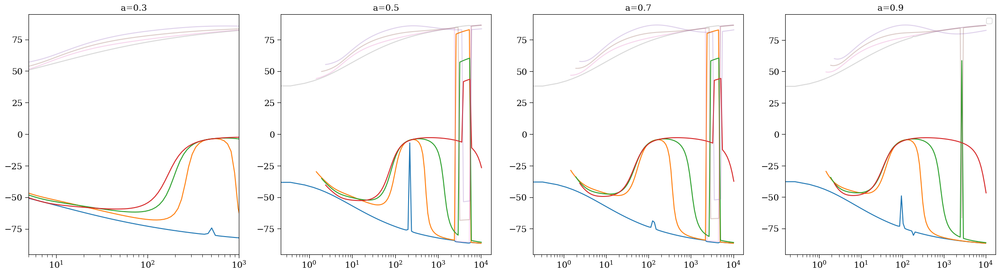

In [ ]:
fig, ax = plt.subplots(1,4,figsize=(28,7))
imageind = 2
spinind = 0
gammaind = 0
colors = ['r','g','orange','blue','brown','purple','pink','magenta']
for phiind in range(Nphi):
    if phiind == Nphi//2:
        continue
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    if phiind>Nphi//2:
        ax[0].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind,alpha=0.3)
    else:
        ax[0].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind)
plt.legend()

imageind = 2
spinind = 1
gammaind = 0
colors = ['r','g','orange','blue','brown','purple','pink','magenta']
for phiind in range(Nphi):
    if phiind == Nphi//2:
        continue
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    if phiind>Nphi//2:
        ax[1].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind,alpha=0.3)
    else:
        ax[1].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind)
        
imageind = 2
spinind = 2
gammaind = 0
colors = ['r','g','orange','blue','brown','purple','pink','magenta']
for phiind in range(Nphi):
    if phiind == Nphi//2:
        continue
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    if phiind>Nphi//2:
        ax[2].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind,alpha=0.3)
    else:
        ax[2].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind)
        
imageind = 2
spinind = 3
gammaind = 0
colors = ['r','g','orange','blue','brown','purple','pink','magenta']
for phiind in range(Nphi):
    if phiind == Nphi//2:
        continue
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    if phiind>Nphi//2:
        ax[3].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind,alpha=0.3)
    else:
        ax[3].semilogx(betagrid[spinind][:,phiind], yvals, label=phiind)
# imageind = 2
# phiinds = [0,1,2,3] #[0,1,2,3,4,5,6]
# colors = ['r','g','orange','blue','brown','purple','pink']
# for i in range(len(phiinds)):
#     phiind = phiinds[i]
#     yvals = -evpavals[imageind][spinind][:,phiind]*180/np.pi
#     plt.semilogx(betagrid[spinind][:,phiind], yvals, label=phiinds[i],color=colors[i],alpha=0.3)
# plt.axvline(betagrid[spinind][bind,phiind])
# # plt.xlim(5,5e3)
ax[0].set_yscale('linear')
ax[0].set_xlim(5,1e3)
ax[0].set_title('a=0.3')
ax[1].set_title('a=0.5')
ax[2].set_title('a=0.7')
ax[3].set_title('a=0.9')
# plt.xscale('linear')
# plt.xlim(5,1000)

plt.savefig('Figures/semi_limb_pol_spin.pdf',bbox_inches='tight', dpi=300)
plt.savefig('Figures/semi_limb_pol_spin.png',bbox_inches='tight', dpi=300)

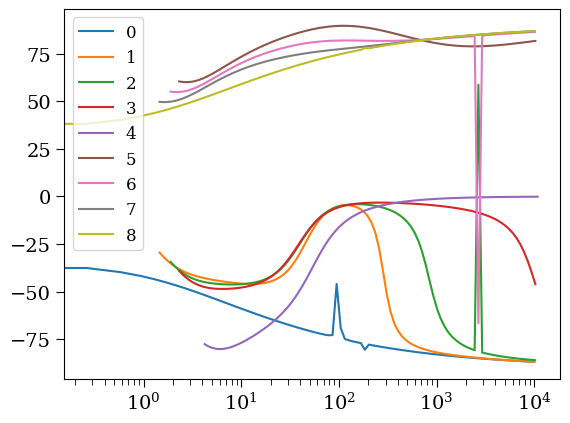

In [ ]:
imageind = 2
spinind = 3
colors = ['r','g','orange','blue','brown','purple','pink','magenta']
for phiind in range(Nphi):
    yvals = -evpavals[imageind][spinind][:,phiind]*180/np.pi
    plt.semilogx(betagrid[spinind][:,phiind], yvals, label=phiind)
plt.legend()
# imageind = 2
# phiinds = [0,1,2,3] #[0,1,2,3,4,5,6]
# colors = ['r','g','orange','blue','brown','purple','pink']
# for i in range(len(phiinds)):
#     phiind = phiinds[i]
#     yvals = -evpavals[imageind][spinind][:,phiind]*180/np.pi
#     plt.semilogx(betagrid[spinind][:,phiind], yvals, label=phiinds[i],color=colors[i],alpha=0.3)
# plt.axvline(betagrid[spinind][bind,phiind])
# # plt.xlim(5,5e3)
plt.yscale('linear')
# plt.xscale('linear')
# plt.xlim(5,1000)

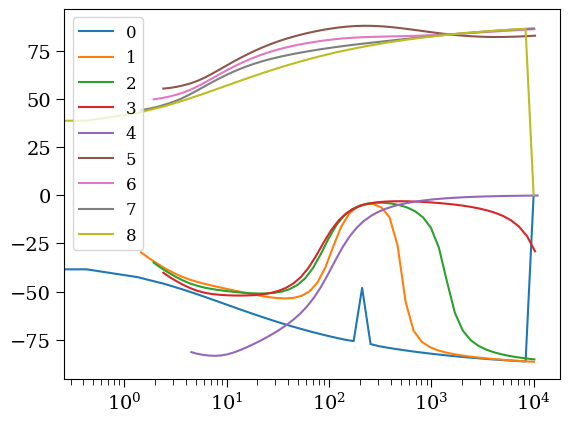

In [ ]:
imageind = 2
colors = ['r','g','orange','blue','brown','purple','pink','magenta']
for phiind in range(Nphi):
    yvals = -evpavals[imageind][spinind][:,phiind]*180/np.pi
    plt.semilogx(betagrid[spinind][:,phiind], yvals, label=phiind)
plt.legend()
# imageind = 2
# phiinds = [0,1,2,3] #[0,1,2,3,4,5,6]
# colors = ['r','g','orange','blue','brown','purple','pink']
# for i in range(len(phiinds)):
#     phiind = phiinds[i]
#     yvals = -evpavals[imageind][spinind][:,phiind]*180/np.pi
#     plt.semilogx(betagrid[spinind][:,phiind], yvals, label=phiinds[i],color=colors[i],alpha=0.3)
# plt.axvline(betagrid[spinind][bind,phiind])
# # plt.xlim(5,5e3)
plt.yscale('linear')

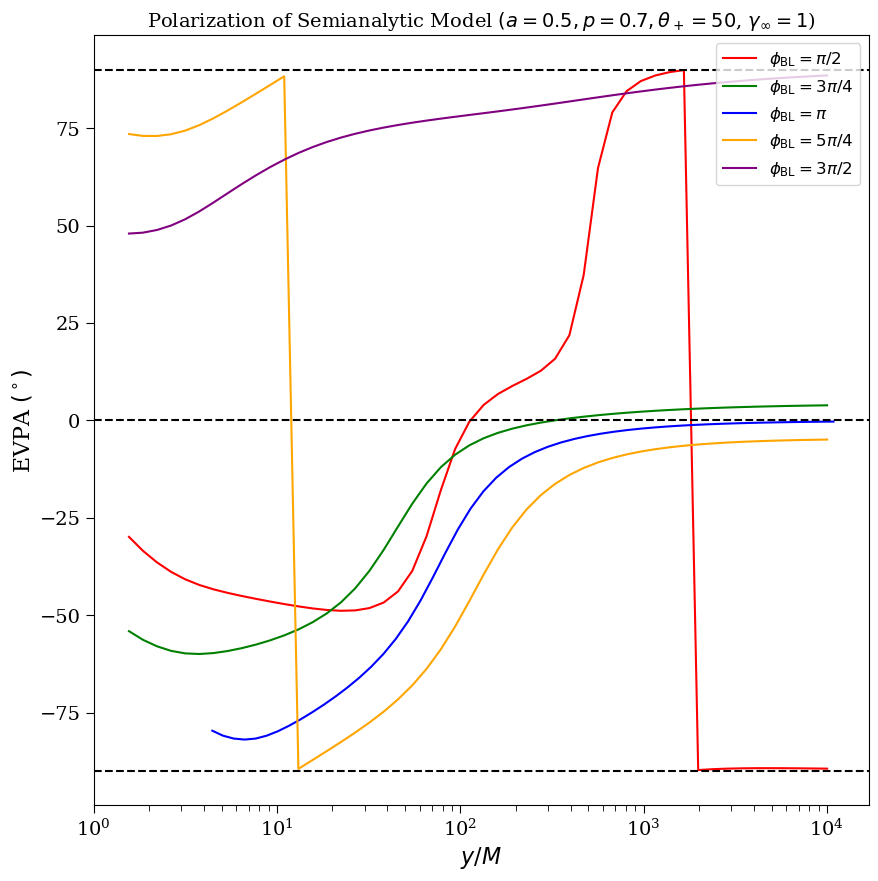

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
imageind = 2
for ind in range(1):
    colors = ['r','g','b','orange','purple']
    alpha = 0.3
    yvals = -evpavals[imageind][spinind][:,1]*180/np.pi
    # yvals[yvals<-25] += 180
    plt.plot(betagrid[spinind][:,1],yvals,color=colors[0], label=r'$\phi_{\rm BL}=\pi/2$')
    yvals = -evpavals[imageind][spinind][:,Nphi//4]*180/np.pi
    # yvals[yvals<-50] += 180
    plt.plot(betagrid[spinind][:,1],yvals,color=colors[1], label=r'$\phi_{\rm BL}=3\pi/4$')
    yvals = -evpavals[imageind][spinind][:,Nphi//2]*180/np.pi
    plt.plot(betagrid[spinind][:,Nphi//2],yvals,color=colors[2], label=r'$\phi_{\rm BL}=\pi$')
    yvals = -evpavals[imageind][spinind][:,3*Nphi//4]*180/np.pi
    # yvals[yvals>25] -= 180
    plt.plot(betagrid[spinind][:,-2],yvals,color=colors[3],label=r'$\phi_{\rm BL}=5\pi/4$')
    yvals = -evpavals[imageind][spinind][:,-2]*180/np.pi
    # yvals[yvals>25] -= 180
    plt.plot(betagrid[spinind][:,-2],yvals,color=colors[4],label=r'$\phi_{\rm BL}=3\pi/2$')
    # yvals = -evpalimbs1_grmhd[ind][1]*180/np.pi
    # yvals[yvals<-40] += 180
    # plt.plot(betavals_GRMHD[ind][1],yvals,color=colors[0],alpha=alpha)
    # yvals = -evpaspines_grmhd[ind][1]*180/np.pi
    # plt.plot(betavals_GRMHD[ind][1],yvals,color=colors[2],alpha=alpha)
    # yvals = -evpalimbs2_grmhd[ind][1]*180/np.pi
    # yvals[yvals>25] -= 180
    # plt.plot(betavals_GRMHD[ind][1],yvals,color=colors[4],alpha=alpha, label='GRMHD')
plt.legend(loc='upper right')
# plt.xlim(0,1000)
plt.xlabel(r'$y/M$')
plt.ylabel(r'EVPA $(^\circ)$')
plt.title(r'Polarization of Semianalytic Model $(a=0.5, p={}, \theta_+={}$, $\gamma_\infty=1$)'.format(str(pval),str(int(180/np.pi*thplus))), fontsize=14)
# plt.ylim(-150,150)
plt.axhline(-90,color='k',linestyle='--')
plt.axhline(0,color='k',linestyle='--')
plt.axhline(90,color='k',linestyle='--')
plt.xscale('log')
# plt.savefig('Figures/spine_sheath_ZAMO.pdf',bbox_inches='tight',dpi=300)
# plt.savefig('Figures/spine_sheath_ZAMO.png',bbox_inches='tight',dpi=300)

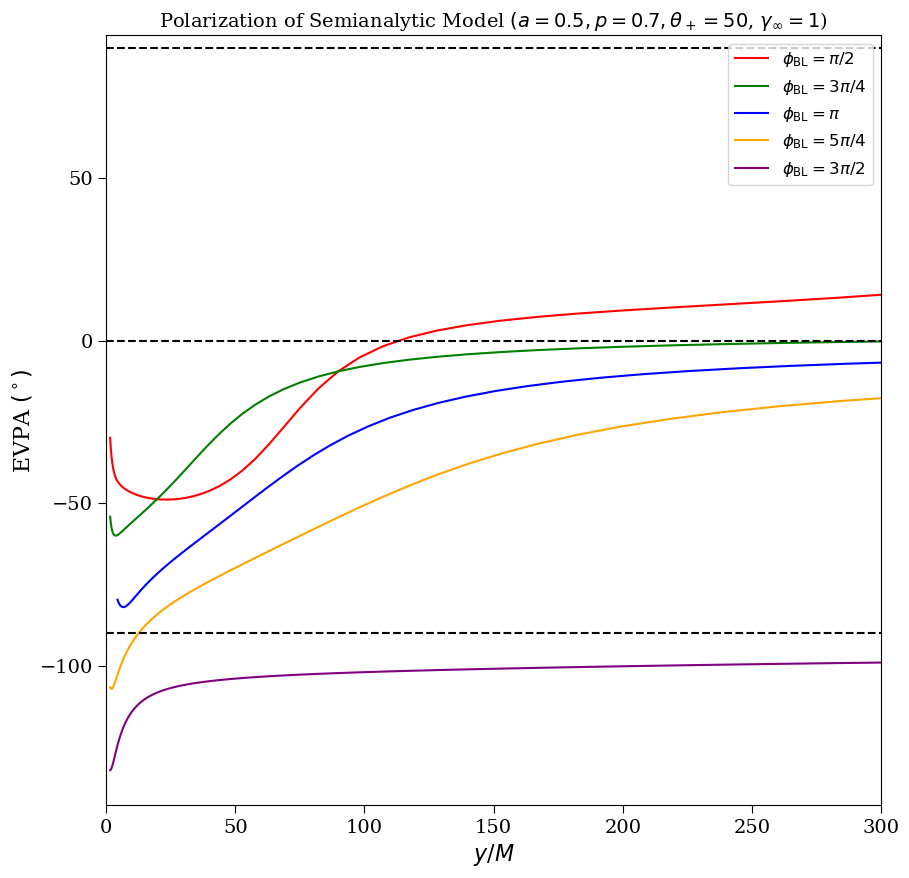

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
imageind = 2
for ind in range(1):
    colors = ['r','g','b','orange','purple']
    alpha = 0.3
    yvals = -evpavals[imageind][spinind][:,1]*180/np.pi
    # yvals[yvals<-25] += 180
    plt.plot(betagrid[spinind][:,1],yvals,color=colors[0], label=r'$\phi_{\rm BL}=\pi/2$')
    yvals = -evpavals[imageind][spinind][:,Nphi//4]*180/np.pi
    # yvals[yvals<-50] += 180
    plt.plot(betagrid[spinind][:,1],yvals,color=colors[1], label=r'$\phi_{\rm BL}=3\pi/4$')
    yvals = -evpavals[imageind][spinind][:,Nphi//2]*180/np.pi
    plt.plot(betagrid[spinind][:,Nphi//2],yvals,color=colors[2], label=r'$\phi_{\rm BL}=\pi$')
    yvals = -evpavals[imageind][spinind][:,3*Nphi//4]*180/np.pi
    yvals[yvals>25] -= 180
    plt.plot(betagrid[spinind][:,-2],yvals,color=colors[3],label=r'$\phi_{\rm BL}=5\pi/4$')
    yvals = -evpavals[imageind][spinind][:,-2]*180/np.pi
    yvals[yvals>25] -= 180
    plt.plot(betagrid[spinind][:,-2],yvals,color=colors[4],label=r'$\phi_{\rm BL}=3\pi/2$')
    # yvals = -evpalimbs1_grmhd[ind][1]*180/np.pi
    # yvals[yvals<-40] += 180
    # plt.plot(betavals_GRMHD[ind][1],yvals,color=colors[0],alpha=alpha)
    # yvals = -evpaspines_grmhd[ind][1]*180/np.pi
    # plt.plot(betavals_GRMHD[ind][1],yvals,color=colors[2],alpha=alpha)
    # yvals = -evpalimbs2_grmhd[ind][1]*180/np.pi
    # yvals[yvals>25] -= 180
    # plt.plot(betavals_GRMHD[ind][1],yvals,color=colors[4],alpha=alpha, label='GRMHD')
plt.legend(loc='upper right')
plt.xlim(0,300)
plt.xlabel(r'$y/M$')
plt.ylabel(r'EVPA $(^\circ)$')
plt.title(r'Polarization of Semianalytic Model $(a=0.5, p={}, \theta_+={}$, $\gamma_\infty=1$)'.format(str(pval),str(int(180/np.pi*thplus))), fontsize=14)
# plt.ylim(-150,150)
plt.axhline(-90,color='k',linestyle='--')
plt.axhline(0,color='k',linestyle='--')
plt.axhline(90,color='k',linestyle='--')
# plt.savefig('Figures/spine_sheath_ZAMO.pdf',bbox_inches='tight',dpi=300)
# plt.savefig('Figures/spine_sheath_ZAMO.png',bbox_inches='tight',dpi=300)

/tmp/ipykernel_162460/4225419228.py:2: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


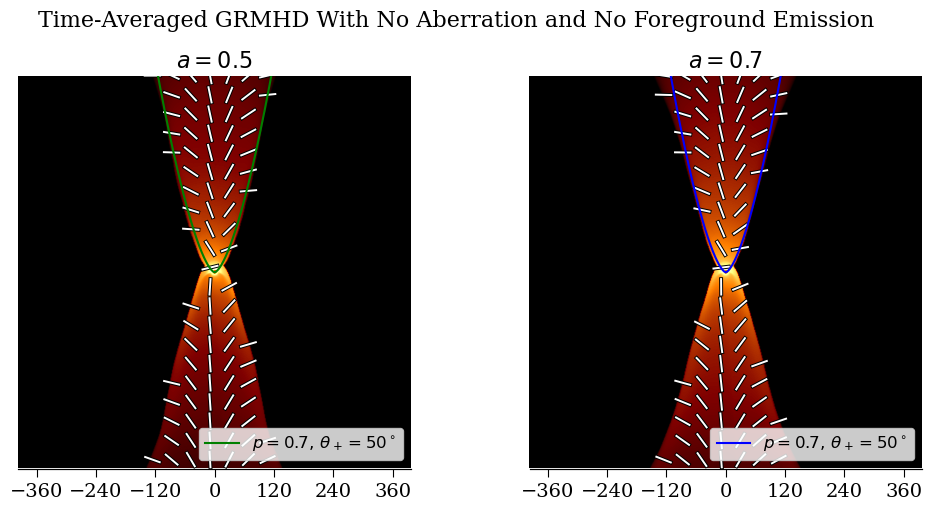

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(10,5), constrained_layout=True)
fig.tight_layout()
psitarget = rp**pval*(1-np.cos(thplus))
nth = 1000
thvals = np.linspace(thplus, 1*np.pi/180,nth)
colors = ['g', 'b']
for i in range(len(spins)):
    rvals = (psitarget[i]/(1-np.cos(thvals)))**(1/pval)
    Rvals = rvals*np.sin(thvals)
    Zvals = rvals*np.cos(thvals)
    alphavals = np.copy(Rvals)
    betavals = Zvals*np.sin(inc)
    rownew, colnew = Mtopix(ims[1][1], alphavals, betavals)
    ax[i].plot(rownew, colnew,color=colors[i])
    rownew, colnew = Mtopix(ims[1][1], -alphavals, betavals)
    ax[i].plot(rownew, colnew,color=colors[i],label=r'$p={},\,\theta_+={}^\circ$'.format(str(pval),str(int(thplus*180/np.pi))))
    ims[i][1].display(scale='log',plotp=True,pcut=1e-10,dynamic_range=[1e7],axis=ax[i],has_title=False,label_type=None,has_cbar=False)
    ax[i].set(xlim=(0,ims[i][1].xdim),ylim=(ims[i][1].ydim,0))
ax[0].set_title(r'$a=0.5$',fontsize=16)
ax[1].set_title(r'$a=0.7$',fontsize=16)
ax[0].legend(loc='lower right')
ax[1].legend(loc='lower right')

plt.suptitle('Time-Averaged GRMHD With No Aberration and No Foreground Emission', fontsize=16,y=1.05)
for i in range(2):
    ax_position = ax[i].get_position()
    bar_height = 0.05
    NPTS = ims[0][1].xdim
    bmax5 = ims[0][1].fovx()/eh.RADPERUAS/MoD/2
    ax_ticks = fig.add_axes([ax_position.x0+ax_position.width/NPTS/2, ax_position.y0, ax_position.width-ax_position.width/NPTS, 0])
    ax_ticks.set_xlim(-bmax5, bmax5)
    ax_ticks.set_ylim(0, 1)  # Keep the height small to make it look like a bar
    ax_ticks.xaxis.set_ticks(np.linspace(-360, 360, 7))
    ax_ticks.yaxis.set_ticks([])  # Hide y-axis ticks

plt.savefig('Figures/GRMHD_images_ZAMO.pdf',bbox_inches='tight',dpi=300)
plt.savefig('Figures/GRMHD_images_ZAMO.png',bbox_inches='tight',dpi=300)

(193, 500)
(190, 500)
(193, 500)
(190, 500)


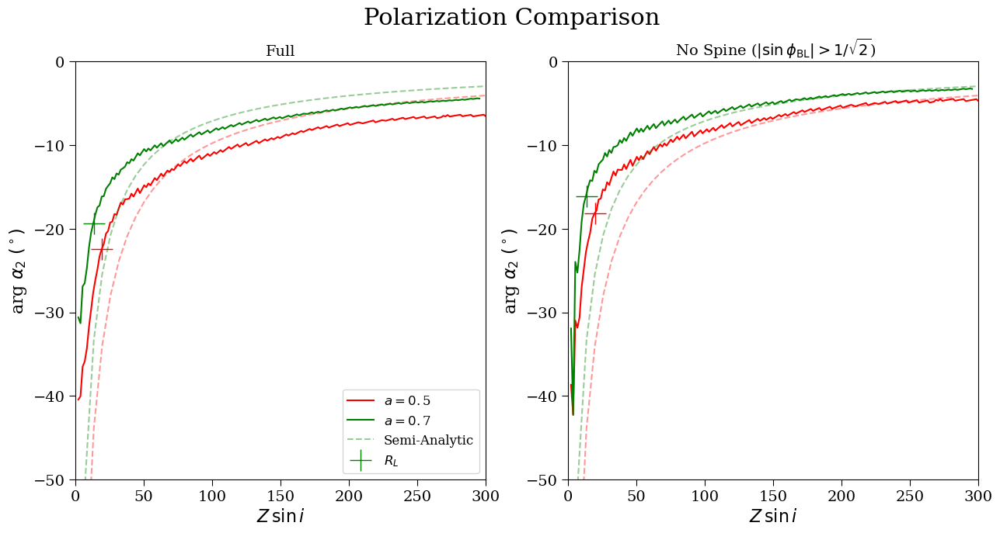

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(15,7))
minphiBL = [np.pi/2,np.pi/4]
titles=[r'Full', r' No Spine ($|\sin\phi_{\rm BL}|>1/\sqrt{2}$)']
for plotind in range(2):
    for i in range(len(spins)):
        testb2 = np.copy(b2_zpvals_GRMHD[i][1][:-1])
        print(testb2.shape)
        testb2[:,np.logical_and(phivals_GRMHD[i][1]>minphiBL[plotind], phivals_GRMHD[i][1]<np.pi-minphiBL[plotind])] = 0
        yvals = -180/np.pi*np.angle(np.sum(testb2, axis=1))
        ax[plotind].plot(Zlimbvals_GRMHD[i][1][:-1]*np.sin(inc), yvals,color=colors[i],label=r'$a=0.$'+spinstring[i])
        xlc = Zlc_all[i]*np.sin(inc)
        ylc = yvals[np.argmin(np.abs(Zlimbvals_GRMHD[i][1][:-1]*np.sin(inc)-xlc))]
        testb2 = np.copy(b2_zpvals[i])
        #testb2[:,np.logical_and(phivals_plan-np.pi/2>minphiBL[plotind], phivals_plan-np.pi/2<np.pi-minphiBL[plotind])] = 0
        yvals = -180/np.pi*np.angle(np.sum(testb2,axis=1))
        if i == 1:
            ax[plotind].plot(Z_all[0][:,Nphi//2]*np.sin(INC),yvals,color=colors[i],linestyle='--',alpha=0.4,label='Semi-Analytic')
            ax[plotind].plot(xlc,ylc,'+',color=colors[i],markersize=20,label=r'$R_L$')
        else:
            ax[plotind].plot(Z_all[0][:,Nphi//2]*np.sin(INC),yvals,color=colors[i],linestyle='--',alpha=0.4)
            ax[plotind].plot(xlc,ylc,'+',color=colors[i],markersize=20)
    ax[plotind].set(xlabel=r'$Z\,\sin i$',ylabel=r'arg $\alpha_2$ $(^\circ)$',ylim=(-50,0),title=titles[plotind],xlim=(0,300))
# ax[2].set(xlim=(0,np.max(Zinterp_all[0])*np.sin(inc)),ylim=(-50,0))
ax[0].legend()
plt.suptitle(r'Polarization Comparison',fontsize=22)
plt.savefig('Figures/GRMHD_pol_ZAMO.pdf',bbox_inches='tight',dpi=300)
plt.savefig('Figures/GRMHD_pol_ZAMO.png',bbox_inches='tight',dpi=300)

# And now repeat with aberration

In [ ]:
model = 'power'
vel = 'driftframe'
gammamax = 3.0 #1/np.sin(17*np.pi/180)
spinind = 1
phisign = 1
imageind = 1
psitarget = rp**pval*(1-np.cos(thplus)) # 1-np.cos(5*np.pi/180)
sigmaplasma = 1
emit = 'sigma'
pathcor='R'
specind = 1
anis = None
R_all = []
Z_all = []
phi_all = []
Zlc_all = []
Rlc_all = []
Zinterp_all = []
Rlc_all = []
Zlc_all = []
b2_zpvals = []
b2_bvvals = []
izpvals = []
Q_all = []
U_all = []
evpa_all = []
limbindvals1 = []
limbindvals2 = []
evpavals = []
OmegaFvals = []
# evpa_zpvals = []
# evpalimb1vals = []
# evpalimb2vals = []
# evpaspinevals = []
imageind = 2
for spinind in range(len(spins)):
    signpr, signptheta, neqvals, rvals, thvals, Zvals, Rvals, phivals, Rlc, Zlc, b2vals, OmegaF = getcoords(outgeos[spinind], psitarget[spinind], INC, spins[spinind], model, pval, vel, imageind, Nz, Nphi, alphagrid[spinind], betagrid[spinind], neqmax=neqmax)
    print(Rlc, Zlc)
    ivec, qvec, uvec = getinfo(signpr, signptheta, neqvals, rvals, thvals, INC, spins[spinind], model, pval, vel, alphagrid[spinind], betagrid[spinind], gammamax=gammamax, neqmax=neqmax)
    dlogI = np.abs(np.log(np.roll(ivec[imageind],-1,axis=1))-np.log(ivec[imageind]))
    dlogI[ivec[imageind]<1e-14] = 0
    # limbindvals1.append(np.argmax(dlogI[:,nphi//2:],axis=1))
    # limbindvals2.append(np.argmax(dlogI[:,:nphi//2],axis=1))
    b2_zpvals.append((qvec[imageind]+1j*uvec[imageind])*np.exp(-1j*2*(phisign*phivals)))
    izpvals.append(ivec[imageind])
    evpavals.append(.5*np.angle(qvec[imageind]+1j*uvec[imageind]))
    OmegaFvals.append(OmegaF)
    # Zlimbvals = (Marry[:,0])/np.sin(inc)
    # b2_bv, b2_bv_orig, b2_bp, b2_bp_orig, b2_zv, b2_zv_orig, b2_zp, b2_zp_orig, phiinterp, Zinterp, Qzp, Uzp = getinterp(qvec, uvec, varphigrid, bgrid, Zvals, phivals, phisign = 1.0)
    # evpa_zp = .5*np.angle(Qzp+1j*Uzp)
    R_all.append(Rvals)
    Rlc_all.append(Rlc)
    Z_all.append(Zvals)
    phi_all.append(phivals)
    Zlc_all.append(Zlc)
    # Zinterp_all.append(Zinterp)
    # Qzp_all.append(Qzp)
    # Uzp_all.append(Uzp)
    # b2_zpvals.append(b2_zp)
    # b2_bvvals.append(b2_bv_orig)
    # evpa_zpvals.append(evpa_zp)
    
# evpalimbs1 = np.array([[evpavals[i][k,limbindvals1[i][k]+nphi//2] for k in range(len(limbindvals1[i]))] for i in range(len(evpavals))])
# evpalimbs2 = np.array([[evpavals[i][k,limbindvals2[i][k]] for k in range(len(limbindvals2[i]))] for i in range(len(evpavals))])
# evpaspines = np.array([evpavals[i][:,nphi//2] for i in range(len(evpavals))])
# betas1 = np.array([[bgrid[k,limbindvals1[i][k]+nphi//2]*np.sin(varphigrid[k,limbindvals1[i][k]+nphi//2]) for k in range(len(limbindvals1[i]))] for i in range(len(evpavals))])
# betas2 = np.array([[bgrid[k,limbindvals2[i][k]]*np.sin(varphigrid[k,limbindvals2[i][k]]) for k in range(len(limbindvals2[i]))] for i in range(len(evpavals))])

(4, 10000)
before solve


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/scipy_ellip_binding.py:215: RuntimeWarning: invalid value encountered in divide
  p_m = (z_m*(x_m+y_m+q_m) - x_m*y_m) / (z_m + q_m)
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:43: RuntimeWarning: invalid value encountered in power
  return r**pval*(1-np.abs(np.cos(theta)))
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:204: RuntimeWarning: RMS of 0.000867139 reached
  outqty = scipy.optimize.newton(get_coord_intersect, guesses, maxiter=500, tol=tol)


after solve


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/scipy_ellip_binding.py:215: RuntimeWarning: divide by zero encountered in divide
  p_m = (z_m*(x_m+y_m+q_m) - x_m*y_m) / (z_m + q_m)
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:517: RuntimeWarning: invalid value encountered in scalar divide
  dpsidr = p*psi/r
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:525: RuntimeWarning: invalid value encountered in scalar divide
  Br = C*dpsidtheta / gdet
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:527: RuntimeWarning: invalid value encountered in scalar divide
  Bph = I / (2*np.pi*Delta*sth2)


0.0 0.0
gammafac 1.0611021575805917
hiii
gammafac 1.0611021575805917
hiii


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:517: RuntimeWarning: invalid value encountered in divide
  dpsidr = p*psi/r
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:525: RuntimeWarning: invalid value encountered in divide
  Br = C*dpsidtheta / gdet
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:527: RuntimeWarning: invalid value encountered in divide
  Bph = I / (2*np.pi*Delta*sth2)
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equatorial_images.py:302: RuntimeWarning: divide by zero encountered in divide
  TH = eta + a2*cth2 - lam*lam*cth2/sth2
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equatorial_images.py:305: RuntimeWarning: invalid value encountered in sqrt
  g = 1 / (1*u0 - lam*u3 - np.sign(kth_sign)*u2*np.sqrt(TH) - np.sign(kr_sign)*u1*np.sqrt(R)/Delta)
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equatorial_images.py:408: RuntimeWarning: divide by zero encountered in d

(4, 10000)
before solve


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:204: RuntimeWarning: RMS of 0.000867031 reached
  outqty = scipy.optimize.newton(get_coord_intersect, guesses, maxiter=500, tol=tol)


after solve
0.0 0.0
gammafac 1.0640255065248616
hiii
gammafac 1.0640255065248616
hiii


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/velocities.py:496: RuntimeWarning: invalid value encountered in sqrt
  vpar_max = np.sqrt(1 - Esq/Bsq)


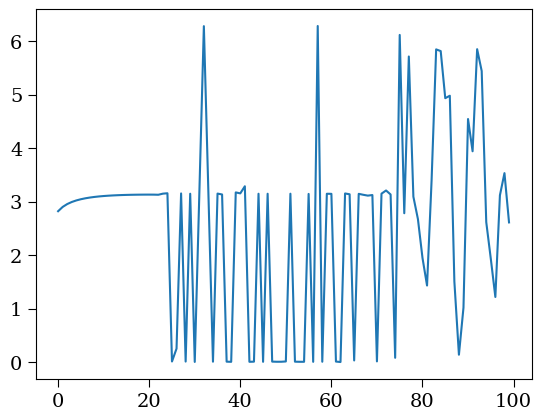

In [ ]:
plt.plot((phi_all[0]%(2*np.pi))[:,50])

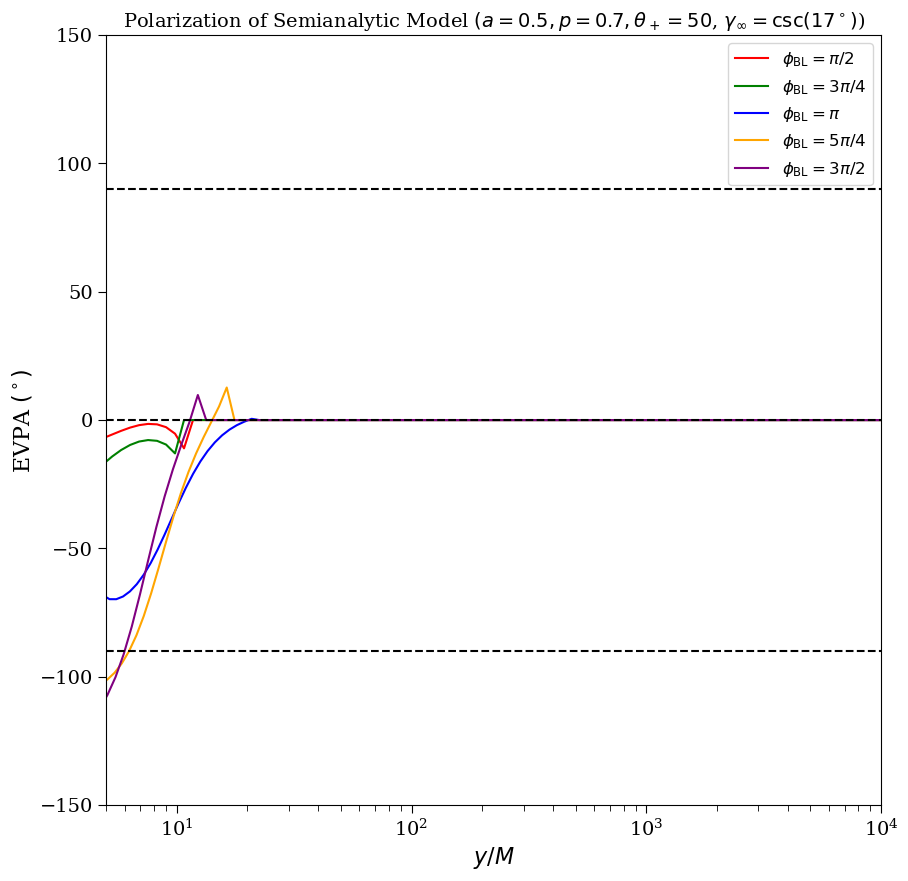

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
for ind in range(1):
    colors = ['r','g','b','orange','purple']
    alpha = 0.3
    yvals = -evpavals[ind][:,1]*180/np.pi
    # yvals[yvals<-25] += 180
    plt.plot(betagrid[ind][:,1],yvals,color=colors[0], label=r'$\phi_{\rm BL}=\pi/2$')
    yvals = -evpavals[ind][:,Nphi//4]*180/np.pi
    # yvals[yvals<-50] += 180
    plt.plot(betagrid[ind][:,1],yvals,color=colors[1], label=r'$\phi_{\rm BL}=3\pi/4$')
    yvals = -evpavals[ind][:,Nphi//2]*180/np.pi
    plt.plot(betagrid[ind][:,Nphi//2],yvals,color=colors[2], label=r'$\phi_{\rm BL}=\pi$')
    yvals = -evpavals[ind][:,3*Nphi//4]*180/np.pi
    yvals[yvals>25] -= 180
    plt.plot(betagrid[ind][:,3*Nphi//4],yvals,color=colors[3],label=r'$\phi_{\rm BL}=5\pi/4$')
    yvals = -evpavals[ind][:,-10]*180/np.pi
    yvals[yvals>40] -= 180
    plt.plot(betagrid[ind][:,-10],yvals,color=colors[4],label=r'$\phi_{\rm BL}=3\pi/2$')
    # yvals = -evpalimbs1_grmhd[ind][1]*180/np.pi
    # yvals[yvals<-50] += 180
    # plt.plot(betavals_GRMHD[ind][1],yvals,color=colors[0],alpha=alpha)
    # yvals = -evpaspines_grmhd[ind][1]*180/np.pi
    # plt.plot(betavals_GRMHD[ind][1],yvals,color=colors[2],alpha=alpha)
    # yvals = -evpalimbs2_grmhd[ind][1]*180/np.pi
    # yvals[yvals>25] -= 180
    # plt.plot(betavals_GRMHD[ind][1],yvals,color=colors[4],alpha=alpha, label='GRMHD')
plt.legend(loc='upper right')
plt.xlim(5,10000)
plt.xscale('log')
plt.xlabel(r'$y/M$')
plt.ylabel(r'EVPA $(^\circ)$')
plt.title(r'Polarization of Semianalytic Model $(a=0.5, p={}, \theta_+={}$, $\gamma_\infty=\csc(17^\circ)$)'.format(str(pval),str(int(180/np.pi*thplus))), fontsize=14)
plt.ylim(-150,150)
plt.axhline(-90,color='k',linestyle='--')
plt.axhline(0,color='k',linestyle='--')
plt.axhline(90,color='k',linestyle='--')
# plt.savefig(r'Figures/spine_sheath_gamma17deg.pdf',bbox_inches='tight',dpi=300)
# plt.savefig(r'Figures/spine_sheath_gamma17deg.png',bbox_inches='tight',dpi=300)

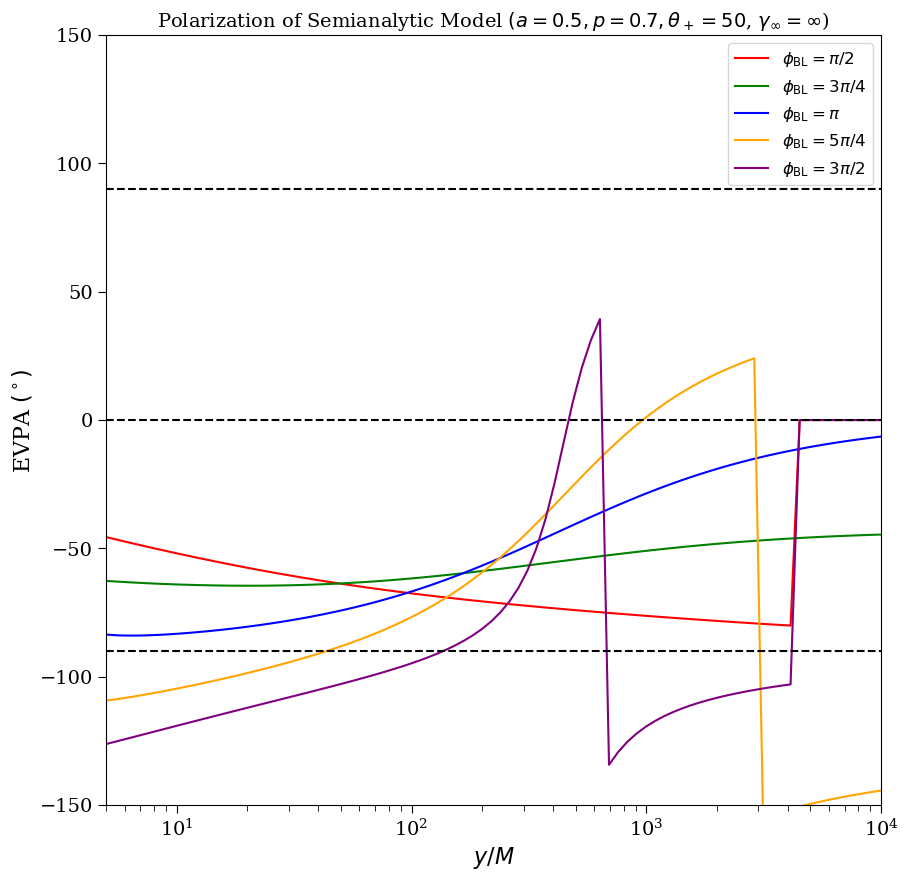

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
for ind in range(1):
    colors = ['r','g','b','orange','purple']
    alpha = 0.3
    yvals = -evpavals[ind][:,1]*180/np.pi
    # yvals[yvals<-25] += 180
    plt.plot(betagrid[ind][:,1],yvals,color=colors[0], label=r'$\phi_{\rm BL}=\pi/2$')
    yvals = -evpavals[ind][:,Nphi//4]*180/np.pi
    # yvals[yvals<-50] += 180
    plt.plot(betagrid[ind][:,1],yvals,color=colors[1], label=r'$\phi_{\rm BL}=3\pi/4$')
    yvals = -evpavals[ind][:,Nphi//2]*180/np.pi
    plt.plot(betagrid[ind][:,Nphi//2],yvals,color=colors[2], label=r'$\phi_{\rm BL}=\pi$')
    yvals = -evpavals[ind][:,3*Nphi//4]*180/np.pi
    yvals[yvals>25] -= 180
    plt.plot(betagrid[ind][:,3*Nphi//4],yvals,color=colors[3],label=r'$\phi_{\rm BL}=5\pi/4$')
    yvals = -evpavals[ind][:,-2]*180/np.pi
    yvals[yvals>40] -= 180
    plt.plot(betagrid[ind][:,-2],yvals,color=colors[4],label=r'$\phi_{\rm BL}=3\pi/2$')
    # yvals = -evpalimbs1_grmhd[ind][1]*180/np.pi
    # yvals[yvals<-50] += 180
    # plt.plot(betavals_GRMHD[ind][1],yvals,color=colors[0],alpha=alpha)
    # yvals = -evpaspines_grmhd[ind][1]*180/np.pi
    # plt.plot(betavals_GRMHD[ind][1],yvals,color=colors[2],alpha=alpha)
    # yvals = -evpalimbs2_grmhd[ind][1]*180/np.pi
    # yvals[yvals>25] -= 180
    # plt.plot(betavals_GRMHD[ind][1],yvals,color=colors[4],alpha=alpha, label='GRMHD')
plt.legend(loc='upper right')
plt.xlim(5,10000)
plt.xscale('log')
plt.xlabel(r'$y/M$')
plt.ylabel(r'EVPA $(^\circ)$')
plt.title(r'Polarization of Semianalytic Model $(a=0.5, p={}, \theta_+={}$, $\gamma_\infty=\infty$)'.format(str(pval),str(int(180/np.pi*thplus))), fontsize=14)
plt.ylim(-150,150)
plt.axhline(-90,color='k',linestyle='--')
plt.axhline(0,color='k',linestyle='--')
plt.axhline(90,color='k',linestyle='--')

In [ ]:
imnames = [[f'avgims/image_a{spin}_2500to3000.h5', f'avgims/image_a{spin}_2500to3000_front1.h5', f'avgims/image_a{spin}_2500to3000_front2.h5',  f'avgims/image_a{spin}_2500to3000thermal.h5', f'avgims/image_a{spin}_2500to3000power.h5'] for spin in spinstring] #[[f'im_a{spin}avg_inc17.h5' ,f'im_a{spin}avg_inc17_front1.h5',f'avg_spin{spin}_freq230.fits'] for spin in spinstring]
ims = [[eh.image.load_image(imname) for imname in imname0] for imname0 in imnames]

Loading hdf5 image:  avgims/image_a5_2500to3000.h5
Loading hdf5 image:  avgims/image_a5_2500to3000_front1.h5
Loading hdf5 image:  avgims/image_a5_2500to3000_front2.h5
Loading hdf5 image:  avgims/image_a5_2500to3000thermal.h5
Loading hdf5 image:  avgims/image_a5_2500to3000power.h5
Loading hdf5 image:  avgims/image_a7_2500to3000.h5
Loading hdf5 image:  avgims/image_a7_2500to3000_front1.h5
Loading hdf5 image:  avgims/image_a7_2500to3000_front2.h5
Loading hdf5 image:  avgims/image_a7_2500to3000thermal.h5
Loading hdf5 image:  avgims/image_a7_2500to3000power.h5


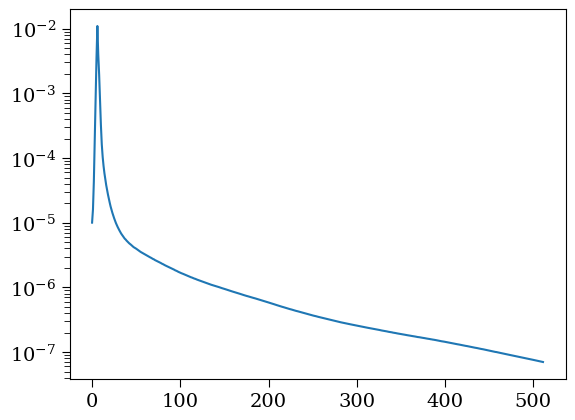

In [ ]:
plt.semilogy(np.flip(np.reshape(ims[0][0].imvec,(1024,1024))[:512,512]))

In [ ]:
inc = INC
imnames = [[f'avgims/image_a{spin}_2500to3000.h5', f'avgims/image_a{spin}_2500to3000_front1.h5', f'avgims/image_a{spin}_2500to3000_front2.h5',  f'avgims/image_a{spin}_2500to3000thermal.h5', f'avgims/image_a{spin}_2500to3000power.h5'] for spin in spinstring] #[[f'im_a{spin}avg_inc17.h5' ,f'im_a{spin}avg_inc17_front1.h5',f'avg_spin{spin}_freq230.fits'] for spin in spinstring]
ims = [[eh.image.load_image(imname) for imname in imname0] for imname0 in imnames]
nphi = 1000
Rlimbvals_GRMHD = [[] for i in range(len(spins))]
Zlimbvals_GRMHD = [[] for i in range(len(spins))]
phivals_GRMHD = [[] for i in range(len(spins))]
b2_zpvals_GRMHD = [[] for i in range(len(spins))]
betavals_GRMHD = [[] for i in range(len(spins))]
varphivals_GRMHD = [[] for i in range(len(spins))]
b2_bvvals_GRMHD = [[] for i in range(len(spins))]
evpavals_GRMHD = [[] for i in range(len(spins))]
ivals_GRMHD = [[] for i in range(len(spins))]
qvals_GRMHD = [[] for i in range(len(spins))]
uvals_GRMHD = [[] for i in range(len(spins))]
limbindvals1_GRMHD = [[] for i in range(len(spins))]
limbindvals2_GRMHD = [[] for i in range(len(spins))]

for i in range(len(spins)):
    spin = spins[i]
    for j in range(len(imnames[0])):
        tophalf = True
        Rlimbs, Zlimbs, limbind1, limbind2, evpahere, imvechere, qvechere, uvechere, phi, b2_zp, betas, varphi, b2_bv = getinterp_GRMHD(ims[i][j], nphi, inc, phisign=1, dropfac=None, pval=0.7, thplus=50*np.pi/180, spin=spin, nth=500, thmax=4.5*np.pi/180, tophalf=tophalf)
        Rlimbvals_GRMHD[i].append(Rlimbs)
        Zlimbvals_GRMHD[i].append(Zlimbs)
        limbindvals1_GRMHD[i].append(limbind1)
        limbindvals2_GRMHD[i].append(limbind2)
        betavals_GRMHD[i].append(betas)
        phivals_GRMHD[i].append(phi)
        varphivals_GRMHD[i].append(varphi)
        b2_zpvals_GRMHD[i].append(b2_zp)
        b2_bvvals_GRMHD[i].append(b2_bv)
        evpavals_GRMHD[i].append(evpahere)
        ivals_GRMHD[i].append(imvechere)
        qvals_GRMHD[i].append(qvechere)        
        uvals_GRMHD[i].append(uvechere)

offsets = 4*np.ones(len(imnames[0])).astype('int')
evpalimbs1_grmhd = [[[evpavals_GRMHD[i][j][k,limbindvals1_GRMHD[i][j][k]+ims[i][j].xdim//2-offsets[j]+1] for k in range(len(limbindvals1_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))]
evpalimbs2_grmhd = [[[evpavals_GRMHD[i][j][k,limbindvals2_GRMHD[i][j][k]+offsets[j]] for k in range(len(limbindvals2_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))]
evpaspines_grmhd = [[evpavals_GRMHD[i][j][:,ims[i][j].xdim//2] for j in range(len(imnames[0]))] for i in range(len(spins))]

ilimbs1_grmhd = [[[ivals_GRMHD[i][j][k,limbindvals1_GRMHD[i][j][k]+ims[i][j].xdim//2-offsets[j]+1] for k in range(len(limbindvals1_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))]
ilimbs2_grmhd = [[[ivals_GRMHD[i][j][k,limbindvals2_GRMHD[i][j][k]+offsets[j]] for k in range(len(limbindvals2_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))]
ispines_grmhd = [[ivals_GRMHD[i][j][:,ims[i][j].xdim//2] for j in range(len(imnames[0]))] for i in range(len(spins))]

offsets = 4*np.ones(len(imnames[0])).astype('int')
evpalimbs1_grmhd = [[[evpavals_GRMHD[i][j][k,limbindvals1_GRMHD[i][j][k]+ims[i][j].xdim//2-offsets[j]+1] for k in range(len(limbindvals1_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))]
evpalimbs2_grmhd = [[[evpavals_GRMHD[i][j][k,limbindvals2_GRMHD[i][j][k]+offsets[j]] for k in range(len(limbindvals2_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))]
evpaspines_grmhd = [[evpavals_GRMHD[i][j][:,ims[i][j].xdim//2] for j in range(len(imnames[0]))] for i in range(len(spins))]

qlimbs1_grmhd = [[[qvals_GRMHD[i][j][k,limbindvals1_GRMHD[i][j][k]+ims[i][j].xdim//2-offsets[j]+1] for k in range(len(limbindvals1_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))]
qlimbs2_grmhd = [[[qvals_GRMHD[i][j][k,limbindvals2_GRMHD[i][j][k]+offsets[j]] for k in range(len(limbindvals2_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))]
qspines_grmhd = [[qvals_GRMHD[i][j][:,ims[i][j].xdim//2] for j in range(len(imnames[0]))] for i in range(len(spins))]

ulimbs1_grmhd = [[[uvals_GRMHD[i][j][k,limbindvals1_GRMHD[i][j][k]+ims[i][j].xdim//2-offsets[j]+1] for k in range(len(limbindvals1_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))]
ulimbs2_grmhd = [[[uvals_GRMHD[i][j][k,limbindvals2_GRMHD[i][j][k]+offsets[j]] for k in range(len(limbindvals2_GRMHD[i][j]))] for j in range(len(imnames[0]))] for i in range(len(spins))]
uspines_grmhd = [[uvals_GRMHD[i][j][:,ims[i][j].xdim//2] for j in range(len(imnames[0]))] for i in range(len(spins))]

Loading hdf5 image:  avgims/image_a5_2500to3000.h5
Loading hdf5 image:  avgims/image_a5_2500to3000_front1.h5
Loading hdf5 image:  avgims/image_a5_2500to3000_front2.h5
Loading hdf5 image:  avgims/image_a5_2500to3000thermal.h5
Loading hdf5 image:  avgims/image_a5_2500to3000power.h5
Loading hdf5 image:  avgims/image_a7_2500to3000.h5
Loading hdf5 image:  avgims/image_a7_2500to3000_front1.h5
Loading hdf5 image:  avgims/image_a7_2500to3000_front2.h5
Loading hdf5 image:  avgims/image_a7_2500to3000thermal.h5
Loading hdf5 image:  avgims/image_a7_2500to3000power.h5


/home/zgelles/anaconda3/lib/python3.12/site-packages/ehtim/image.py:423: RuntimeWarning: invalid value encountered in divide
  chivec = 0.5 * np.angle((self.qvec + 1j * self.uvec) / self.ivec)
/tmp/ipykernel_6680/708475520.py:186: RuntimeWarning: invalid value encountered in subtract
  dlogI = np.abs(np.log(np.roll(imvechere,-1,axis=1))-np.log(imvechere))


/tmp/ipykernel_6680/1122481968.py:2: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/home/zgelles/anaconda3/lib/python3.12/site-packages/ehtim/image.py:3697: RuntimeWarning: invalid value encountered in divide
  m = (np.abs(qvec + 1j * uvec) / imvec).reshape(self.ydim, self.xdim)
/home/zgelles/anaconda3/lib/python3.12/site-packages/ehtim/image.py:3701: RuntimeWarning: invalid value encountered in divide
  maskb = (np.abs(qvec + 1j * uvec) / imvec).reshape(self.ydim, self.xdim) > mcut
/home/zgelles/anaconda3/lib/python3.12/site-packages/ehtim/image.py:3717: RuntimeWarning: invalid value encountered in divide
  m = (np.abs(qvec + 1j * uvec) / imvec).reshape(self.ydim, self.xdim)
/home/zgelles/anaconda3/lib/python3.12/site-packages/ehtim/image.py:3724: RuntimeWarning: invalid value encountered in divide
  voi = (vvec / imvec).reshape(self.ydim, self.xdim)


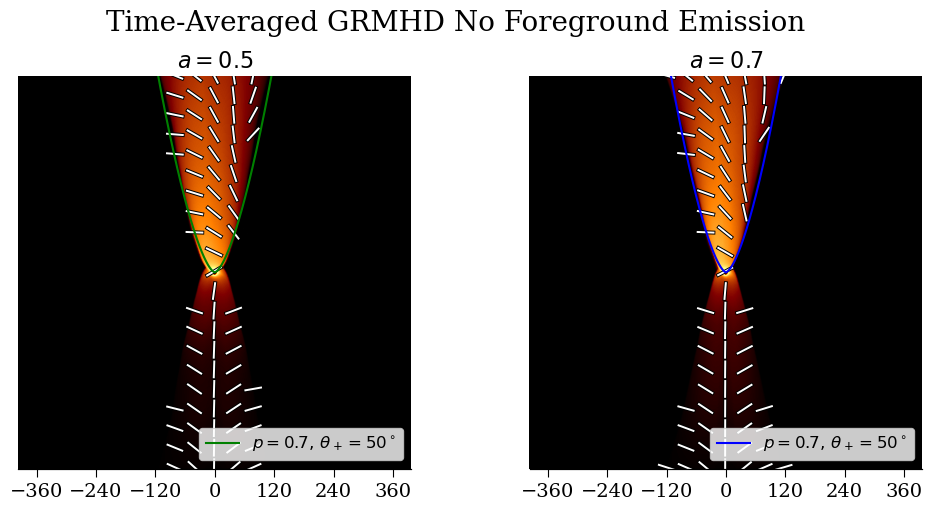

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(10,5), constrained_layout=True)
fig.tight_layout()
psitarget = rp**pval*(1-np.cos(thplus))
nth = 1000
thvals = np.linspace(thplus, 1*np.pi/180,nth)
colors = ['g', 'b']
for i in range(len(spins)):
    rvals = (psitarget[i]/(1-np.cos(thvals)))**(1/pval)
    Rvals = rvals*np.sin(thvals)
    Zvals = rvals*np.cos(thvals)
    alphavals = np.copy(Rvals)
    betavals = Zvals*np.sin(inc)
    rownew, colnew = Mtopix(ims[1][1], alphavals, betavals)
    ax[i].plot(rownew, colnew,color=colors[i])
    rownew, colnew = Mtopix(ims[1][1], -alphavals, betavals)
    ax[i].plot(rownew, colnew,color=colors[i],label=r'$p={},\,\theta_+={}^\circ$'.format(str(pval),str(int(thplus*180/np.pi))))
    ims[i][1].display(scale='log',plotp=True,pcut=1e-10,dynamic_range=[1e8],axis=ax[i],has_title=False,label_type=None,has_cbar=False)
    ax[i].set(xlim=(0,ims[i][1].xdim),ylim=(ims[i][1].ydim,0))
ax[0].set_title(r'$a=0.5$',fontsize=16)
ax[1].set_title(r'$a=0.7$',fontsize=16)
ax[0].legend(loc='lower right')
ax[1].legend(loc='lower right')

plt.suptitle('Time-Averaged GRMHD No Foreground Emission', fontsize=20,y=1.05)
for i in range(2):
    ax_position = ax[i].get_position()
    bar_height = 0.05
    NPTS = ims[0][1].xdim
    bmax5 = ims[0][1].fovx()/eh.RADPERUAS/MoD/2
    ax_ticks = fig.add_axes([ax_position.x0+ax_position.width/NPTS/2, ax_position.y0, ax_position.width-ax_position.width/NPTS, 0])
    ax_ticks.set_xlim(-bmax5, bmax5)
    ax_ticks.set_ylim(0, 1)  # Keep the height small to make it look like a bar
    ax_ticks.xaxis.set_ticks(np.linspace(-360, 360, 7))
    ax_ticks.yaxis.set_ticks([])  # Hide y-axis ticks

plt.savefig('Figures/GRMHD_images_full.pdf',bbox_inches='tight',dpi=300)
plt.savefig('Figures/GRMHD_images_full.png',bbox_inches='tight',dpi=300)

(199, 500)
(198, 500)
(199, 500)
(198, 500)


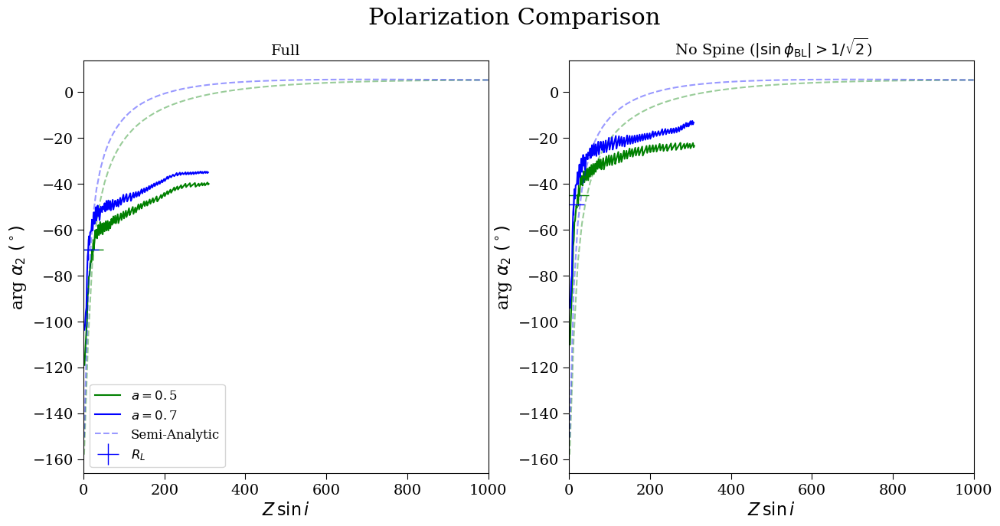

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(15,7))
minphiBL = [np.pi/2,np.pi/4]
titles=[r'Full', r' No Spine ($|\sin\phi_{\rm BL}|>1/\sqrt{2}$)']
for plotind in range(2):
    for i in range(len(spins)):
        testb2 = np.copy(b2_zpvals_GRMHD[i][1][:-1])
        print(testb2.shape)
        testb2[:,np.logical_and(phivals_GRMHD[i][1]>minphiBL[plotind], phivals_GRMHD[i][1]<np.pi-minphiBL[plotind])] = 0
        yvals = -180/np.pi*np.angle(np.sum(testb2, axis=1))
        ax[plotind].plot(Zlimbvals_GRMHD[i][1][:-1]*np.sin(inc), yvals,color=colors[i],label=r'$a=0.$'+spinstring[i])
        xlc = Zlc_all[i]*np.sin(inc)
        ylc = yvals[np.argmin(np.abs(Zlimbvals_GRMHD[i][1][:-1]*np.sin(inc)-xlc))]
        testb2 = np.copy(b2_zpvals[i])
        # testb2[:,np.logical_and(phivals_plan-np.pi/2>minphiBL[plotind], phivals_plan-np.pi/2<np.pi-minphiBL[plotind])] = 0
        yvals = -180/np.pi*np.angle(np.sum(testb2,axis=1))
        if i == 1:
            ax[plotind].plot(Z_all[0][:,Nphi//2]*np.sin(INC),yvals,color=colors[i],linestyle='--',alpha=0.4,label='Semi-Analytic')
            ax[plotind].plot(xlc,ylc,'+',color=colors[i],markersize=20,label=r'$R_L$')
        else:
            ax[plotind].plot(Z_all[0][:,Nphi//2]*np.sin(INC),yvals,color=colors[i],linestyle='--',alpha=0.4)
            ax[plotind].plot(xlc,ylc,'+',color=colors[i],markersize=20)
    ax[plotind].set(xlabel=r'$Z\,\sin i$',ylabel=r'arg $\alpha_2$ $(^\circ)$',title=titles[plotind],xlim=(0,1000))
# ax[2].set(xlim=(0,np.max(Zinterp_all[0])*np.sin(inc)),ylim=(-50,0))
ax[0].legend()
plt.xlim(0,1000)
plt.suptitle(r'Polarization Comparison',fontsize=22)
plt.savefig('Figures/GRMHD_pol_gamma2.pdf',bbox_inches='tight',dpi=300)
plt.savefig('Figures/GRMHD_pol_gamma2.png',bbox_inches='tight',dpi=300)

# And now with full image

## Testing

In [ ]:
#define parameters
ROUT = 4.e10 # sgra distance in M
Nphi = 5000 #number of points in row on image
Nb = 50
bmin = 5#np.min(np.abs(b2pars_noeps_17[0][0]/MoD))*.5
bmax = 375#np.max(np.abs(b2pars_noeps_17[0][0]/MoD))
bvals = np.linspace(bmin, bmax, Nb)
NGEO = 200 #number of points per geodesic (for guessing before root-finder)
neqmax = 2
model = 'para' #'para' for paraboloid otherwise monopole
model2 = 'power'
spinind = 2

incdeg = 17
INC = float(incdeg)*np.pi/180
spins = np.array([0.3, 0.5, 0.7, 0.9])
rp = 1+np.sqrt(1-spins**2)
pval = .8
psitarget = rp*np.log(4)*.99
psitarget2 = rp**pval*(1-np.cos(.99*np.pi/2))

#minphi = np.pi/2
minphi = 0
maxphi = np.pi
phivals = np.arange(minphi, maxphi, (maxphi-minphi)/Nphi)
phigrid, bgrid = np.meshgrid(phivals, bvals)

alphagrid = bgrid*np.cos(phigrid)
betagrid = bgrid*np.sin(phigrid)

endpiece = 'highres_inc{}_fulltop'.format(str(int(incdeg)))
with open('spin0.7geo_{}.pkl'.format(endpiece), 'rb') as file:
    outgeo_7 = pickle.load(file)
file.close()

sigma = 1

gammamaxvals = np.array([2.0]) #np.arange(1.5,5.5,.5)
pvals = np.array([0.7]) #np.arange(0.5,1.0,.1)
thetahorizonvals = np.array([50])

sigmaplasma = 1
emit='sigma'
pathcor = 'R'
specind = 0.5
spinind = 2

nannulus = 2
mmode = 2
b2ind = -1
dir0 = './' #'/n/netscratch/bhi/Lab/zgelles/semi_survey/halfvecs/'

for gammamax in gammamaxvals:
    for pval in pvals:
        for thetahorizon in thetahorizonvals: 
            try:
                print(gammamax, pval, thetahorizon)
                psitarget2 = rp**pval*(1-np.cos(.999*thetahorizon*np.pi/180))

                ivec_7_power, qvec_7_power, uvec_7_power, evpa_7_power, r_7_power, th_7_power = getstokes(psitarget2[spinind], alphagrid, betagrid, ROUT, INC, spins[spinind], NGEO, do_phi_and_t = True, model=model2, neqmax=neqmax, outgeo=outgeo_7, nu_parallel = 'FF', vel='driftframe', sigma = sigma, gammamax=gammamax, retvals=True, pval=pval, sigmaplasma=sigmaplasma, emit=emit, pathcor=pathcor, specind=specind)
                outall = np.array([ivec_7_power, qvec_7_power, uvec_7_power])
                outtext = dir0+'vecout_a'+str(spins[spinind])+'_p'+str(pval)+'_gamma'+str(gammamax)+'_theta'+str(thetahorizon)+'inc'+str(int(incdeg))+'.npy'
                # print(outtext)
                # np.save(outtext, outall)
            except:
                continue
            
print('done!')

2.0 0.7 50
(4, 250000)
before solve


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/scipy_ellip_binding.py:215: RuntimeWarning: invalid value encountered in divide
  p_m = (z_m*(x_m+y_m+q_m) - x_m*y_m) / (z_m + q_m)
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:43: RuntimeWarning: invalid value encountered in power
  return r**pval*(1-np.abs(np.cos(theta)))
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:204: RuntimeWarning: RMS of 0.00626196 reached
  outqty = scipy.optimize.newton(get_coord_intersect, guesses, maxiter=500, tol=tol)


after solve
guesses before  (4, 250000)


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:517: RuntimeWarning: invalid value encountered in divide
  dpsidr = p*psi/r
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:525: RuntimeWarning: invalid value encountered in divide
  Br = C*dpsidtheta / gdet
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:527: RuntimeWarning: invalid value encountered in divide
  Bph = I / (2*np.pi*Delta*sth2)


gammafac 1.1389926295257475
hiii
gammafac 1.1389926295257475
hiii


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equatorial_images.py:302: RuntimeWarning: divide by zero encountered in divide
  TH = eta + a2*cth2 - lam*lam*cth2/sth2
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equatorial_images.py:305: RuntimeWarning: invalid value encountered in sqrt
  g = 1 / (1*u0 - lam*u3 - np.sign(kth_sign)*u2*np.sqrt(TH) - np.sign(kr_sign)*u1*np.sqrt(R)/Delta)
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equatorial_images.py:408: RuntimeWarning: divide by zero encountered in divide
  g33_up = (Delta - a2*sth2)/(Sigma*Delta*sth2)
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equatorial_images.py:419: RuntimeWarning: divide by zero encountered in divide
  TH = eta + a2*cth2 - lam*lam*cth2/sth2
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equatorial_images.py:422: RuntimeWarning: invalid value encountered in sqrt
  k1_l = kr_sign*np.sqrt(R)/Delta
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo

done!


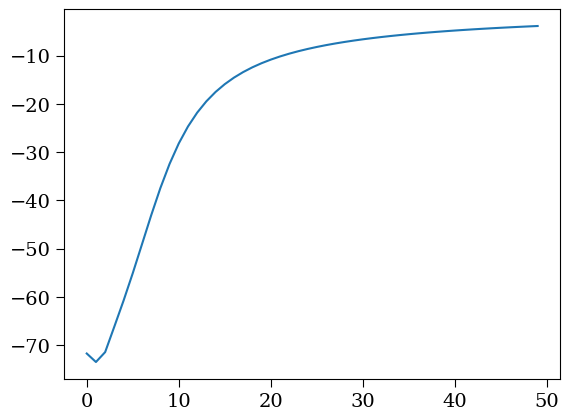

In [ ]:
phiind = 2500
betasemi = qvec_7_power[-1,:,phiind]+1j*uvec_7_power[-1,:,phiind]
plt.plot(-np.angle(betasemi)*180/np.pi/2)

In [ ]:
def getangroots(spin, r, comp=False): #gets u_{\pm}
    delta = r**2-2*r+spin**2
    # if delta <= 0:
    #     print('hi', r/(spin*(r-1))**2*(-r**3+3*r-2*spin**2+2*np.sqrt(complex(delta)*(2*r**3-3*r**2+spin**2))), r/(spin*(r-1))**2*(-r**3+3*r-2*spin**2-2*np.sqrt(complex(delta)*(2*r**3-3*r**2+spin**2))))
    if comp:
        delta = complex(delta)
        uplus = r/(spin*(r-1))**2*(-r**3+3*r-2*spin**2+2*np.sqrt(delta*(2*r**3-3*r**2+spin**2)))
        uminus = r/(spin*(r-1))**2*(-r**3+3*r-2*spin**2-2*np.sqrt(delta*(2*r**3-3*r**2+spin**2)))
    else:
        uplus = r/(spin*(r-1))**2*(-r**3+3*r-2*spin**2+2*np.sqrt(delta*(2*r**3-3*r**2+spin**2)))
        uminus = r/(spin*(r-1))**2*(-r**3+3*r-2*spin**2-2*np.sqrt(delta*(2*r**3-3*r**2+spin**2)))
    return uplus, uminus 
def getparamsanalytic(spin, theta): #analytic solution for BL radius on beta axis (all other points need numerics)
    if spin == 0:
        return 3, np.sqrt(27)
    spin += 0j  #makes it complex type
    cuberootfac = (-9+9*spin**2+np.sqrt(3*spin**2*(-27+18*spin**2+spin**4)))**(1/3)
    r = 1-(-1/3)**(1/3)*(-3+spin**2)/cuberootfac-(-1)**(2/3)*cuberootfac/3**(2/3)
    r = np.real(r) #imaginary part should just be a numerical artefact
    
    delta = r**2-2*r+spin**2
    ell = ((r**2-spin**2)-r*delta)/(spin*(r-1))
    up, um = getangroots(spin, r)
    rho = np.sqrt(spin**2*((np.cos(theta))**2-up*um)+ell**2)
    
    return r, np.real(rho) #imaginary part should just be a numerical artefact

#get impact parameter which intersects light cylinder
def getlc_power(rvals, thvals, spin, betas, pval, usemono=False, nimage = 3):
    #preliminaries
    bf = Bfield('power', p=pval, usemono=usemono)
    ind = np.where(np.nan_to_num(rvals) != 0)[0][0] #important for indirect images, which are filled with zeros when there's no crossing
    omega = bf.omega_field(spin,rvals[ind],th=thvals[ind]) #single fieldline so single omega

    #reshape and get closest points to light cylinders
    rvals = np.reshape(rvals, (nimage,len(rvals)//nimage))
    thvals = np.reshape(thvals, (nimage,len(thvals)//nimage))

    lcvals = []
    lcinds = []
    for ind in range(len(rvals)):
        lchere = lightcylinder(rvals[ind], spin, thvals[ind], 1.0, omega, betas)
        lcvals.append(lchere)
        lcinds.append(np.argmin(np.abs(betas-lchere)))

    return np.array(lcvals), np.array(lcinds)

#get impact parameter which intersects light cylinder
def getlc_para(rvals, thvals, spin, betas, nimage = 3):
    #preliminaries
    bf = Bfield('bz_para')
    ind = np.where(np.nan_to_num(rvals) != 0)[0][0] #important for indirect images, which are filled with zeros when there's no crossing
    omega = bf.omega_field(spin,rvals[ind],th=thvals[ind]) #single fieldline so single omega

    #reshape and get closest points to light cylinders
    rvals = np.reshape(rvals, (nimage,len(rvals)//nimage))
    thvals = np.reshape(thvals, (nimage,len(thvals)//nimage))

    lcvals = []
    lcinds = []
    for ind in range(len(rvals)):
        lchere = lightcylinder(rvals[ind], spin, thvals[ind], 1.0, omega, betas)
        lcvals.append(lchere)
        lcinds.append(np.argmin(np.abs(betas-lchere)))

    return np.array(lcvals), np.array(lcinds)

def cartesianizeB(rvals, thvals, spin, B1, B2, B3):
    for i in range(len(rvals)):
        g = metric(rvals[i], spin, thvals[i], 1.0)
        B1[i] = B1[i]*np.sqrt(g[1][1])
        B2[i] = B2[i]*np.sqrt(g[2][2])
        B3[i] = B3[i]*np.sqrt(g[3][3])
    return B1, B2, B3
    
def reshape(arr, nimage, imageind, phiind):
    return np.reshape(arr[phiind::len(phivals)],(nimage, NPTS))

def getcoords(outgeo, psitarget, inc, spin, model, pval, vel, imageind, Nb, Nphi, alphagrid, betagrid, neqmax=2):
    #first, get coords of intersection
    tau, rvals, thvals, phivals, signpr, signptheta, neqvals, guesses_shape = findroot(outgeo, psitarget, alphagrid.flatten(), betagrid.flatten(), ROUT, inc, spin, NGEO, do_phi_and_t = True, model=model, neqmax=neqmax, pval=pval, retphi=True)
    tau = np.reshape(tau,guesses_shape)[imageind]
    rvals = np.reshape(rvals,guesses_shape)[imageind]
    thvals = np.reshape(thvals,guesses_shape)[imageind]
    phivals = np.reshape(phivals,guesses_shape)[imageind]
    signpr = np.reshape(signpr,guesses_shape)[imageind]
    signptheta = np.reshape(signptheta,guesses_shape)[imageind]
    neqvals = np.reshape(neqvals,guesses_shape)[imageind]
    guesses_shape = (1, len(tau))
    Zvals = rvals*np.cos(thvals)
    Rvals = rvals*np.sin(thvals)

    #get magnetic field profiles
    bf = Bfield('power', p=pval, usemono=False) if model == 'power' else Bfield('bz_monopole')
    omegaF = bf.omega_field(spin,rvals[0],th=thvals[0]) #single fieldline so single omega
    b2vals = np.array([b2func(rvals[i], spin, thvals[i], 1.0, omegaF) for i in range(len(rvals))])
    b2vals[Zvals<0] = 100 #don't want to artificially find LC with Z<0
    Zlc = Zvals[np.argmin(np.abs(b2vals))] #light cylinder height
    Rlc = Rvals[np.argmin(np.abs(b2vals))]
    return signpr, signptheta, neqvals, rvals, thvals, np.reshape(Zvals,(Nb,Nphi)), np.reshape(Rvals,(Nb,Nphi)), np.reshape(phivals,(Nb,Nphi)), Rlc, Zlc, b2vals, omegaF

def getinfo(signpr, signptheta, neqvals, rvals, thvals, inc, spin, model, pval, vel, alphagrid, betagrid, gammamax=None, neqmax = 2, specind=1.0, emit='R'):
    bf = Bfield('power', p=pval, usemono=False) if model == 'power' else Bfield('bz_monopole')
    velocity=Velocity(vel, bfield=bf, nu_parallel = 'FF', gammamax=gammamax)
    emissivity=Emissivity('constant')
    dvals = densityconstsigma(rvals, thvals, spin, 'FF', sigmaplasma, model, gammamax=gammamax, pval=pval, usemono=False, velmodel=vel)
    guesses_shape = (1, len(rvals))
    
    #do radiative transfer
    alphavals = np.tile(alphagrid.flatten(), guesses_shape[0])
    betavals = np.tile(betagrid.flatten(), guesses_shape[0])
    outvec = Iobs_off(spin, ROUT, rvals, inc, alphavals, betavals, signpr, signptheta,
        emissivity=emissivity, velocity=velocity, bfield=bf,
        polarization=True,  th_s=thvals, density=dvals, retsin=True, emit=emit, specind=specind)

    iobs = np.copy(outvec[0])
    qobs = np.copy(outvec[1])
    uobs = np.copy(outvec[2])

    iobs[rvals == 0] = qobs[rvals==0] = uobs[rvals==0] = 0 #zero out geodesics with no fieldline crossings

    iobs = np.real(np.nan_to_num(np.array(iobs))) #get rid of nans
    qobs = np.real(np.nan_to_num(np.array(qobs)))
    uobs = np.real(np.nan_to_num(np.array(uobs)))

    #call sorter here
    ivec, qvec, uvec = sort_image(iobs, qobs, uobs, neqvals, guesses_shape, alphagrid.shape, neqmax)
    return ivec, qvec, uvec

def getinterp(qvec, uvec, varphigrid, bgrid, Zvals, phivals, phisign = 1.0):
    Nb = bgrid.shape[0]
    Nphi = varphigrid.shape[1]
        
    # Interpolate using griddata
    Qbv = scint.griddata((varphigrid.flatten(), bgrid.flatten()), qvec[0].flatten(), (varphigrid, bgrid), method='cubic')
    Ubv = scint.griddata((varphigrid.flatten(), bgrid.flatten()), uvec[0].flatten(), (varphigrid, bgrid), method='cubic')
    b2_bv = np.nan_to_num((Qbv+1j*Ubv)*np.exp(2*1j*(-varphigrid-np.pi/2)))
    b2_bv_orig = np.nan_to_num((qvec[0]+1j*uvec[0])*np.exp(2*1j*(-varphigrid-np.pi/2)))
    argb2_bv = np.angle(b2_bv)

    phimod = np.nan_to_num(phivals%(2*np.pi))
    phiinterp = np.linspace(np.pi/2, 3*np.pi/2, Nphi) #np.linspace(np.min(phimod[phimod>0]), np.max(phimod[phimod>0]), Nphi)
    phigrid = np.reshape(np.tile(phiinterp,Nb),(Nb,Nphi))
    Qbp = scint.griddata((phimod.flatten(), bgrid.flatten()), qvec[0].flatten(), (phigrid, bgrid), method='cubic')
    Ubp = scint.griddata((phimod.flatten(), bgrid.flatten()), uvec[0].flatten(), (phigrid, bgrid), method='cubic')
    b2_bp = np.nan_to_num((Qbp+1j*Ubp)*np.exp(2*1j*(-phisign*phigrid-np.pi)))
    b2_bp_orig = np.nan_to_num((qvec[0]+1j*uvec[0])*np.exp(2*1j*(-phisign*phivals-np.pi)))
    argb2_bp = np.angle(b2_bp)

    Zvert = Zvals[:,len(Zvals[0])//2]
    Zinterp = np.linspace(np.min(Zvert[Zvert>0]),np.max(Zvert[Zvert>0]), Nb)
    Zgrid = np.transpose(np.reshape(np.tile(Zinterp,Nphi),(Nphi,Nb)))
    Qzv = scint.griddata((varphigrid.flatten(), Zvals.flatten()), qvec[0].flatten(), (varphigrid, Zgrid), method='cubic')
    Uzv = scint.griddata((varphigrid.flatten(), Zvals.flatten()), uvec[0].flatten(), (varphigrid, Zgrid), method='cubic')
    b2_zv = np.nan_to_num((Qzv+1j*Uzv)*np.exp(2*1j*(-varphigrid-np.pi/2)))
    b2_zv_orig = np.nan_to_num((qvec[0]+1j*uvec[0])*np.exp(2*1j*(-varphigrid-np.pi/2)))
    argb2_zv = np.angle(b2_zv)

    Qzp = scint.griddata((phimod.flatten(), Zvals.flatten()), qvec[0].flatten(), (phigrid, Zgrid), method='cubic')
    Uzp = scint.griddata((phimod.flatten(), Zvals.flatten()), uvec[0].flatten(), (phigrid, Zgrid), method='cubic')
    b2_zp = np.nan_to_num((Qzp+1j*Uzp)*np.exp(2*1j*(-phisign*phigrid-np.pi)))
    b2_zp_orig = np.nan_to_num((qvec[0]+1j*uvec[0])*np.exp(2*1j*(-phisign*phivals-np.pi)))
    argb2_zp = np.angle(b2_zp)
    
    return b2_bv, b2_bv_orig, b2_bp, b2_bp_orig, b2_zv, b2_zv_orig, b2_zp, b2_zp_orig, phiinterp, Zinterp, Qzp, Uzp

def getinterp_GRMHD(im, nphi, inc, phisign=1, dropfac=None, pval=0.7, thplus=50*np.pi/180, spin=0.7, nth=500, thmax=4.5*np.pi/180, tophalf=True):
    nx = im.xdim
    ny = im.ydim
    fov_muas = im.fovx()/eh.RADPERUAS
    pxi = (np.arange(nx))/nx-0.5
    pxi += (pxi[1]-pxi[0])/2
    pxj = np.copy(pxi)
    mui = pxi*fov_muas
    muj = pxj*fov_muas
    MUI,MUJ = np.meshgrid(mui,muj)
    Marrx = (MUI/MoD)[:nx//2,:] if tophalf else (MUI/MoD)[nx//2:,:]
    Marry = -(MUJ/MoD)[:nx//2,:] if tophalf else -(MUJ/MoD)[nx//2:,:]
    imvechere = np.reshape(im.imvec,(nx, ny))[:nx//2,:] if tophalf else np.reshape(im.imvec,(nx, ny))[nx//2:,:]
    qvechere = np.reshape(im.qvec,(nx, ny))[:nx//2,:] if tophalf else np.reshape(im.qvec,(nx, ny))[nx//2:,:]
    uvechere = np.reshape(im.uvec,(nx, ny))[:nx//2,:] if tophalf else np.reshape(im.uvec,(nx, ny))[nx//2:,:]
    evpahere = np.reshape(im.evpavec,(nx, ny))[:nx//2,:] if tophalf else np.reshape(im.evpavec,(nx, ny))[nx//2:,:]
    nx = nx//2

    if dropfac == None:
        dlogI = np.abs(np.log(np.roll(imvechere,-1,axis=1))-np.log(imvechere))
        dlogI[imvechere<1e-14] = 0
        limbind1 = np.argmax(dlogI[:,ny//2:],axis=1)
        limbind2 = np.argmax(dlogI[:,:ny//2],axis=1)
        Rlimbvals = .5*(Marrx[0,ny//2:][limbind1]-Marrx[0,:ny//2][limbind2])
        Zlimbvals = (Marry[:,0])/np.sin(inc)

    elif dropfac == 'preset':
        rp = 1+np.sqrt(1-spin**2)
        psitarget = rp**pval*(1-np.cos(thplus))
        thvals = np.linspace(thplus, thmax,nth)
        rvals = (psitarget/(1-np.cos(thvals)))**(1/pval)
        Rlimbvals = np.flip(rvals*np.sin(thvals))
        Zlimbvals = np.flip(rvals*np.cos(thvals))
    
    elif dropfac == 'maxreflect':
        limbind2 = np.argmax(imvechere,axis=1)
        limbind2[limbind2>nx//2] -= 1
        limbind1 = nx//2-limbind2
        Rlimbvals = .5*(Marrx[0,ny//2:][limbind1]-Marrx[0,:ny//2][limbind2])
        Zlimbvals = (Marry[:,0])/np.sin(inc)
        
    else:
        Rlimbvals = []
        Zlimbvals = []
        for i in range(len(imvechere)):
            maxvals = np.argmax(imvechere[:,:ny//2],axis=1)
            max2 = np.argmin(np.abs(imvechere[i,:maxvals[i]+1]-imvechere[i,maxvals[i]]/dropfac))
            Rlimbvals.append(np.abs(Marrx[i,max2]))
            Zlimbvals.append((Marry[i,max2])/np.sin(inc))
        Rlimbvals = np.array(Rlimbvals)
        Zlimbvals = np.array(Zlimbvals)
        
    betainit = Zlimbvals*np.sin(inc)+Rlimbvals*np.cos(inc) if tophalf else Zlimbvals*np.sin(inc)-Rlimbvals*np.cos(inc)
    maxind = np.argmin(np.abs(np.abs(betainit)-np.max(np.abs(Marry))))
    Rlimbvals = Rlimbvals[maxind+1:] if tophalf else Rlimbvals[:maxind]
    Zlimbvals = Zlimbvals[maxind+1:] if tophalf else Zlimbvals[:maxind]

    #for a given (R,Z) pair, compute (b, varphi) and then interpolate the polarization at that point so we can compute e^{2iphi}
    Rtile = np.tile(Rlimbvals, (nphi,1)).T
    Ztile = np.tile(Zlimbvals, (nphi,1)).T
    philinear = np.linspace(0, np.pi, nphi) if tophalf else np.linspace(np.pi, .9999*2*np.pi, nphi)
    phitile = np.tile(philinear, (len(Rlimbvals), 1))
    alphatile = Rtile*np.cos(phitile)
    betatile = Ztile*np.sin(inc)+Rtile*np.sin(phitile)*np.cos(inc)
    Qinterp = scint.griddata((Marrx.flatten(), Marry.flatten()), qvechere.flatten(), (alphatile, betatile), method='cubic')
    Uinterp = scint.griddata((Marrx.flatten(), Marry.flatten()), uvechere.flatten(), (alphatile, betatile), method='cubic')
    b2_zp = (Qinterp+1j*Uinterp)*np.exp(2*1j*(-phisign*(phitile+np.pi/2))) #positive on phitile because we want it to be increasing from left to right on image

    betas = np.copy(Marry)[:,0]
    varphilinear = np.linspace(0,np.pi,nphi) if tophalf else np.linspace(np.pi, .9999*2*np.pi, nphi) #top half of image. bottom would just be an offset
    varphigrid, bgrid = np.meshgrid(varphilinear, np.abs(betas))
    alphagrid = bgrid*np.cos(varphigrid)
    betagrid = bgrid*np.sin(varphigrid)
    Qinterp_v = np.nan_to_num(scint.griddata((Marrx.flatten(), Marry.flatten()), qvechere.flatten(), (alphagrid, betagrid), method='cubic'))
    Uinterp_v = np.nan_to_num(scint.griddata((Marrx.flatten(), Marry.flatten()), uvechere.flatten(), (alphagrid, betagrid), method='cubic'))
    b2_bv = (Qinterp_v+1j*Uinterp_v)*np.exp(2*1j*(-varphigrid))
    
    return Rlimbvals, Zlimbvals, limbind1, limbind2, evpahere, imvechere, qvechere, uvechere, philinear, b2_zp, betas, varphilinear, b2_bv

# def 
# MHD(im, nphi, inc, phisign=1, dropfac=None, pval=0.7, thplus=50*np.pi/180, spin=0.7, nth=500, thmax=4.5*np.pi/180):
#     nx = im.xdim
#     ny = im.ydim
#     fov_muas = im.fovx()/eh.RADPERUAS
#     pxi = (np.arange(nx))/nx-0.5
#     pxi += (pxi[1]-pxi[0])/2
#     pxj = np.copy(pxi)
#     mui = pxi*fov_muas
#     muj = pxj*fov_muas
#     MUI,MUJ = np.meshgrid(mui,muj)
#     Marrx = (MUI/MoD)[:nx//2,:]
#     Marry = -(MUJ/MoD)[:nx//2,:]
#     imvechere = np.reshape(im.imvec,(nx, ny))[:nx//2,:]
#     qvechere = np.reshape(im.qvec,(nx, ny))[:nx//2,:]
#     uvechere = np.reshape(im.uvec,(nx, ny))[:nx//2,:]
#     nx = nx//2

#     if dropfac == None:
#         dlogI = np.abs(np.log(np.roll(imvechere,-1,axis=1))-np.log(imvechere))
#         dlogI[imvechere<1e-14] = 0
#         Rlimbvals = .5*(Marrx[0,ny//2:][np.argmax(dlogI[:,ny//2:],axis=1)]-Marrx[0,:ny//2][np.argmax(dlogI[:,:ny//2],axis=1)])
#         Zlimbvals = (Marry[:,0])/np.sin(inc)

#     elif dropfac == 'preset':
#         rp = 1+np.sqrt(1-spin**2)
#         psitarget = rp**pval*(1-np.cos(thplus))
#         thvals = np.linspace(thplus, thmax,nth)
#         rvals = (psitarget/(1-np.cos(thvals)))**(1/pval)
#         Rlimbvals = np.flip(rvals*np.sin(thvals))
#         Zlimbvals = np.flip(rvals*np.cos(thvals))
        
#     else:
#         Rlimbvals = []
#         Zlimbvals = []
#         for i in range(len(imvechere)):
#             maxvals = np.argmax(imvechere[:,:ny//2],axis=1)
#             max2 = np.argmin(np.abs(imvechere[i,:maxvals[i]+1]-imvechere[i,maxvals[i]]/dropfac))
#             Rlimbvals.append(np.abs(Marrx[i,max2]))
#             Zlimbvals.append((Marry[i,max2])/np.sin(inc))
#         Rlimbvals = np.array(Rlimbvals)
#         Zlimbvals = np.array(Zlimbvals)
        
#     betainit = Zlimbvals*np.sin(inc)+Rlimbvals*np.cos(inc)
#     maxind = np.argmin(np.abs(betainit-np.max(Marry)))
#     Rlimbvals = Rlimbvals[maxind+1:]
#     Zlimbvals = Zlimbvals[maxind+1:]

#     #for a given (R,Z) pair, compute (b, varphi) and then interpolate the polarization at that point so we can compute e^{2iphi}
#     Rtile = np.tile(Rlimbvals, (nphi,1)).T
#     Ztile = np.tile(Zlimbvals, (nphi,1)).T
#     philinear = np.linspace(0, np.pi, nphi)
#     phitile = np.tile(philinear, (len(Rlimbvals), 1))
#     alphatile = Rtile*np.cos(phitile)
#     betatile = Ztile*np.sin(inc)+Rtile*np.sin(phitile)*np.cos(inc)
#     Qinterp = scint.griddata((Marrx.flatten(), Marry.flatten()), qvechere.flatten(), (alphatile, betatile), method='cubic')
#     Uinterp = scint.griddata((Marrx.flatten(), Marry.flatten()), uvechere.flatten(), (alphatile, betatile), method='cubic')
#     b2_zp = (Qinterp+1j*Uinterp)*np.exp(2*1j*(-phisign*(phitile+np.pi/2))) #positive on phitile because we want it to be increasing from left to right on image

#     betas = np.copy(Marry)[:,0]
#     varphilinear = np.linspace(0,np.pi,nphi) #top half of image
#     varphigrid, bgrid = np.meshgrid(varphilinear, betas)
#     alphagrid = bgrid*np.cos(varphigrid)
#     betagrid = bgrid*np.sin(varphigrid)
#     Qinterp_v = np.nan_to_num(scint.griddata((Marrx.flatten(), Marry.flatten()), qvechere.flatten(), (alphagrid, betagrid), method='cubic'))
#     Uinterp_v = np.nan_to_num(scint.griddata((Marrx.flatten(), Marry.flatten()), uvechere.flatten(), (alphagrid, betagrid), method='cubic'))
#     b2_bv = (Qinterp_v+1j*Uinterp_v)*np.exp(2*1j*(-varphigrid))
    
#     return Rlimbvals, Zlimbvals, philinear, b2_zp, betas, varphilinear, b2_bv

def Mtopix(im, alphacoord, betacoord):
    nx = im.xdim
    ny = im.ydim
    fov_muas = im.fovx()/eh.RADPERUAS
    pxi = (np.arange(nx))/nx-0.5
    pxi += (pxi[1]-pxi[0])/2
    pxj = np.copy(pxi)
    mui = pxi*fov_muas
    muj = pxj*fov_muas
    MUI,MUJ = np.meshgrid(mui,muj)
    Marrx = (MUI/MoD)
    Marry = (MUJ/MoD)
    dMdpixx = Marrx[1,1]-Marrx[0,0]
    dMdpixy = Marry[1,1]-Marry[0,0]
    nrowsmiddle = alphacoord/dMdpixx
    ncolmiddle = betacoord/dMdpixy
    nrowsleft = nrowsmiddle + nx//2
    nrowstop = ny//2-ncolmiddle
    return nrowsleft, nrowstop

# def getinfo(outgeo, psitarget, inc, spin, model, pval, vel, imageind, Nb, Nphi, alphagrid, betagrid, gammamax=None, neqmax=2):
#     #first, get coords of intersection
#     tau, rvals, thvals, phivals, signpr, signptheta, neqvals, guesses_shape = findroot(outgeo, psitarget, alphagrid.flatten(), betagrid.flatten(), ROUT, inc, spin, NGEO, do_phi_and_t = True, model=model, neqmax=neqmax, pval=pval, retphi=True)
#     tau = np.reshape(tau,guesses_shape)[imageind]
#     rvals = np.reshape(rvals,guesses_shape)[imageind]
#     thvals = np.reshape(thvals,guesses_shape)[imageind]
#     phivals = np.reshape(phivals,guesses_shape)[imageind]
#     signpr = np.reshape(signpr,guesses_shape)[imageind]
#     signptheta = np.reshape(signptheta,guesses_shape)[imageind]
#     neqvals = np.reshape(neqvals,guesses_shape)[imageind]
#     guesses_shape = (1, len(tau))
#     Zvals = rvals*np.cos(thvals)
#     Rvals = rvals*np.sin(thvals)

#     #get magnetic field profiles
#     dvals = densityconstsigma(rvals, thvals, spin, 'FF', sigmaplasma, model, gammamax=gammamax, pval=pval, usemono=False, velmodel=vel)
#     bf = Bfield('power', p=pval, usemono=False)
#     omegaF = bf.omega_field(spin,rvals[0],th=thvals[0]) #single fieldline so single omega
#     b2vals = np.array([b2func(rvals[i], spin, thvals[i], 1.0, omegaF) for i in range(len(rvals))])
#     Zlc = Zvals[np.argmin(np.abs(b2vals))]#light cylinder height
#     Rlc = Rvals[np.argmin(np.abs(b2vals))]
#     velocity=Velocity(vel, bfield=bf, nu_parallel = 'FF', gammamax=gammamax)
#     emissivity=Emissivity('constant')
    
#     #do radiative transfer
#     alphavals = np.tile(alphagrid.flatten(), guesses_shape[0])
#     betavals = np.tile(betagrid.flatten(), guesses_shape[0])
#     outvec = Iobs_off(spin, ROUT, rvals, inc, alphavals, betavals, signpr, signptheta,
#         emissivity=Emissivity('constant'), velocity=Velocity(vel, bfield=bf, nu_parallel = 'FF', gammamax=gammamax), bfield=bf,
#         polarization=True,  th_s=thvals, density=dvals, retsin=True, emit=emit)

#     iobs = np.copy(outvec[0])
#     qobs = np.copy(outvec[1])
#     uobs = np.copy(outvec[2])

#     iobs[rvals == 0] = qobs[rvals==0] = uobs[rvals==0] = 0 #zero out geodesics with no fieldline crossings

#     iobs = np.real(np.nan_to_num(np.array(iobs))) #get rid of nans
#     qobs = np.real(np.nan_to_num(np.array(qobs)))
#     uobs = np.real(np.nan_to_num(np.array(uobs)))

#     #call sorter here
#     ivec, qvec, uvec = sort_image(iobs, qobs, uobs, neqvals, guesses_shape, alphagrid.shape, neqmax)
#     return ivec, qvec, uvec, np.reshape(Zvals,(Nb,Nphi)), np.reshape(Rvals,(Nb,Nphi)), np.reshape(phivals,(Nb,Nphi)), Rlc, Zlc

### $\phi=\pm\pi/2$

In [ ]:
#define parameters
ROUT = 4.e10 # sgra distance in M
Nphi = 2 #number of points in row on image
Nz = 75
INC = 17*np.pi/180
Zmin = 10/np.sin(INC) #np.min(np.abs(b2pars_noeps_17[0][0]/MoD))*.5
Zmax = 1e4/np.sin(INC) #np.max(np.abs(b2pars_noeps_17[0][0]/MoD))
Zvals_plan = np.logspace(np.log10(Zmin), np.log10(Zmax), Nz)

NGEO = 20000 #number of points per geodesic (for guessing before root-finder)
neqmax = 2
model = 'power'

spins = np.array([0.5, 0.7])
spinstring = np.char.mod('%i', spins*10)
rp = 1+np.sqrt(1-spins**2)
pval = 0.7
thplus = 50*np.pi/180
psitarget = rp**pval*(1-np.cos(thplus))

minphi = np.pi/2
maxphi = 3*np.pi/2
phivals_plan = np.linspace(minphi, maxphi, Nphi)
phigrid, Zgrid = np.meshgrid(phivals_plan, Zvals_plan)

Rgrid = []
alphagrid = []
betagrid = []
for i in range(len(spins)):
    solveR = lambda Rvals : np.sqrt(Rvals**2+Zvals_plan**2)**pval*(1-Zvals_plan/np.sqrt(Rvals**2+Zvals_plan**2))-psitarget[i]
    Rhere = opt.newton(solveR, np.ones_like(Zvals_plan))
    phigrid2, Rgridhere = np.meshgrid(phivals_plan, Rhere)
    Rgrid.append(Rgridhere)
    alphagrid.append(Rgrid[i]*np.cos(phigrid-np.pi/2))
    betagrid.append(Zgrid*np.sin(INC)+Rgrid[i]*np.cos(INC)*np.sin(phigrid-np.pi/2))

# alphagrid = bgrid*np.cos(varphigrid)
# betagrid = bgrid*np.sin(varphigrid)
incs = np.array([17*np.pi/180]) #np.array([0.01, 8.5, 17, 25.5, 34])*np.pi/180
incstrig = np.char.mod('%.1f', incs*180/np.pi)

outgeos = []
for spinind in range(len(spins)):
    for i in list(range(len(incs))):
        inc = incs[i]
        spin = spins[spinind]
        print(inc*180/np.pi, spin)
        outgeo = raytrace_ana(a=spin,
                observer_coords = [0,ROUT,inc,0],
                image_coords = [alphagrid[spinind].flatten(), betagrid[spinind].flatten()], #assumes 1D arrays of alpha and beta
                ngeo=NGEO,
                do_phi_and_t=True,
                savedata=False, plotdata=False)
        outgeos.append(outgeo)

17.0 0.5
calculating preliminaries...
integrating in theta...5.13 s


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/scipy_ellip_binding.py:215: RuntimeWarning: divide by zero encountered in divide
  p_m = (z_m*(x_m+y_m+q_m) - x_m*y_m) / (z_m + q_m)
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/scipy_ellip_binding.py:215: RuntimeWarning: invalid value encountered in divide
  p_m = (z_m*(x_m+y_m+q_m) - x_m*y_m) / (z_m + q_m)


integrating in r...5.48 s
done!   10.672888278961182  seconds!
17.0 0.7
calculating preliminaries...
integrating in theta...4.79 s
integrating in r...5.34 s
done!   10.15516209602356  seconds!


### True limb

In [ ]:
#define parameters
ROUT = 4.e10 # sgra distance in M
Nz = 200
Nphi = 3
INC = 17*np.pi/180
Zmin = 10/np.sin(INC)
Zmax = 1e3/np.sin(INC)
Zvals_plan = np.logspace(np.log10(Zmin), np.log10(Zmax), Nz)
Xvals_plan = np.zeros(Nphi)
alphafac = 1.0-1e-5 #smush in

NGEO = 10000 #number of points per geodesic (for guessing before root-finder)
neqmax = 2
model = 'power'

spins = np.array([0.5])
spinstring = np.char.mod('%i', spins*10)
rp = 1+np.sqrt(1-spins**2)
pval = 0.7
thplus = 50*np.pi/180
psitarget = rp**pval*(1-np.cos(thplus))

# minphi = np.pi/2
# maxphi = 3*np.pi/2
# phivals_plan = np.linspace(minphi, maxphi, Nphi)
Xgrid, Zgrid = np.meshgrid(Xvals_plan, Zvals_plan)
Ygrid = np.zeros_like(Xgrid)

alphagrid = []
betagrid = []
Ylimbvals = []
Xlimbvals = []
for i in range(len(spins)):
    solveR = lambda Rvals : np.sqrt(Rvals**2+Zvals_plan**2)**pval*(1-Zvals_plan/np.sqrt(Rvals**2+Zvals_plan**2))-psitarget[i]
    Rhere = opt.newton(solveR, np.ones_like(Zvals_plan))
    rhere = np.sqrt(Rhere**2+Zvals_plan**2)
    Ylimb = -(Rhere**2+pval*Zvals_plan*(Zvals_plan-rhere))/np.tan(INC)/(pval*(rhere-Zvals_plan)+Zvals_plan)
    Ylimbvals.append(Ylimb)
    Xlimb = np.sqrt(Rhere**2-Ylimb**2)
    Xlimbvals.append(Xlimb)
    
    Xgrid[:,0] = -np.copy(Xlimb) #left (approaching) limb
    Xgrid[:,1] = np.zeros_like(Xlimb) #spine
    Xgrid[:,2] = np.copy(Xlimb) #right (receding) limb
    Ygrid[:,0] = np.copy(Ylimb) #left (approaching) limb
    Ygrid[:,1] = np.copy(Rhere) #spine
    Ygrid[:,2] = np.copy(Ylimb) #right (receding) limb
    
    alphagrid.append(np.copy(Xgrid)*alphafac)
    betagrid.append(Ygrid*np.cos(INC)+Zgrid*np.sin(INC))
    
    
    
    # phigrid2, Rgridhere = np.meshgrid(phivals_plan, Rhere)
    # Rgrid.append(Rgridhere)
    # alphagrid.append(Rgrid[i]*np.cos(phigrid-np.pi/2))
    # betagrid.append(Zgrid*np.sin(INC)+Rgrid[i]*np.cos(INC)*np.sin(phigrid-np.pi/2))

# alphagrid = bgrid*np.cos(varphigrid)
# betagrid = bgrid*np.sin(varphigrid)

incs = np.array([17*np.pi/180]) #np.array([0.01, 8.5, 17, 25.5, 34])*np.pi/180
incstrig = np.char.mod('%.1f', incs*180/np.pi)

outgeos = []
for spinind in range(len(spins)):
    for i in list(range(len(incs))):
        inc = incs[i]
        spin = spins[spinind]
        print(inc*180/np.pi, spin)
        outgeo = raytrace_ana(a=spin,
                observer_coords = [0,ROUT,inc,0],
                image_coords = [alphagrid[spinind].flatten(), betagrid[spinind].flatten()], #assumes 1D arrays of alpha and beta
                ngeo=NGEO,
                do_phi_and_t=True,
                savedata=False, plotdata=False)
        outgeos.append(outgeo)

17.0 0.5
calculating preliminaries...


KeyboardInterrupt: 

### Now trace

In [ ]:
def getkB(alphahere, betahere, a, signpr, signptheta, neqvals, rvals, thvals, Zvals, Rvals, phivals, Rlc, Zlc, b2vals, OmegaF, sigmaplasma=1, gammamax=None, pval=0.7, velmodel='driftframe', model='power'):
    dvals = densityconstsigma(rvals, thvals, a, 'FF', sigmaplasma, model, gammamax=gammamax, pval = pval, velmodel=velmodel)
    bf = Bfield(model, p=pval, usemono=False)
    emissivity=Emissivity('constant')
    velocity=Velocity(velmodel, bfield=bf, nu_parallel = 'FF', gammamax=gammamax)
    (u0,u1,u2,u3) = velocity.u_lab(a, rvals, th=thvals)

    # Metric
    r = np.copy(rvals)
    th = np.copy(thvals)
    a2 = a**2
    r2 = r**2
    cth2 = np.cos(th)**2
    sth2 = np.sin(th)**2
    Delta = r2 - 2*r + a2
    Sigma = r2 + a2 * cth2
    gdet = Sigma*np.sqrt(sth2) #metric determinant

    g00 = -(1 - 2*r/Sigma)
    g11 = Sigma/Delta
    g22 = Sigma
    g33 = (r2 + a2 + 2*r*a2*sth2 / Sigma) * sth2
    g03 = -2*r*a*sth2 / Sigma

    g00_up = -(r2 + a2 + 2*r*a2*sth2/Sigma) / Delta
    g11_up = Delta/Sigma
    g22_up = 1./Sigma
    g33_up = (Delta - a2*sth2)/(Sigma*Delta*sth2)
    g03_up = -(2*a*r)/(Sigma*Delta)

    # covariant velocity
    u0_l = g00*u0 + g03*u3
    u1_l = g11*u1
    u2_l = g22*u2 
    u3_l = g33*u3 + g03*u0

    # conserved quantities
    lam = (-alphahere*np.sin(INC)).flatten()
    eta = ((alphahere**2 - a**2)*np.cos(INC)**2 + betahere**2).flatten()
    gg = calc_redshift(a, rvals, lam, eta, signpr, signptheta, u0, u1, u2, u3, th=thvals)   
    Iemis = emissivity.jrest(a, rvals)*dvals
            
    # photon momentum
    R = (r2 + a2 -a*lam)**2 - Delta*(eta + (lam-a)**2)
    TH = eta + a2*cth2 - lam*lam*cth2/sth2

    k0_l = -1
    k1_l = signpr*np.sqrt(R)/Delta
    k2_l = signptheta*np.sqrt(TH)
    k3_l = lam

    k0 = g00_up * k0_l + g03_up * k3_l
    k1 = g11_up * k1_l
    k2 = g22_up * k2_l
    k3 = g33_up * k3_l + g03_up * k0_l 

    # calculate tetrades
    tetrades = calc_tetrades(a, r, lam, eta, signpr, signptheta, u0, u1, u2, u3, th=thvals)
    ((e0_t,e1_t,e2_t,e3_t),(e0_x,e1_x,e2_x,e3_x),(e0_y,e1_y,e2_y,e3_y),(e0_z,e1_z,e2_z,e3_z)) = tetrades 
            
    (B1, B2, B3) = bf.bfield_lab(a, r, th=th)

    b0 = B1*u1_l + B2*u2_l + B3*u3_l
    b1 = (B1 + b0*u1)/u0
    b2 = (B2 + b0*u2)/u0
    b3 = (B3 + b0*u3)/u0     

    b0_l = g00*b0 + g03*b3
    b1_l = g11*b1
    b2_l = g22*b2
    b3_l = g33*b3 + g03*b0

    bsq = b0*b0_l + b1*b1_l + b2*b2_l + b3*b3_l

    # transform to comoving frame with tetrads
    Bp_x = e0_x*b0_l + e1_x*b1_l  + e2_x*b2_l + e3_x*b3_l
    Bp_y = e0_y*b0_l + e1_y*b1_l  + e2_y*b2_l + e3_y*b3_l
    Bp_z = e0_z*b0_l + e1_z*b1_l  + e2_z*b2_l + e3_z*b3_l

    # wavevector in comoving frame  
    kp_x = e0_x*k0_l + e1_x*k1_l  + e2_x*k2_l + e3_x*k3_l
    kp_y = e0_y*k0_l + e1_y*k1_l  + e2_y*k2_l + e3_y*k3_l
    kp_z = e0_z*k0_l + e1_z*k1_l  + e2_z*k2_l + e3_z*k3_l  
    kp_mag = np.sqrt(kp_x**2 + kp_y**2 + kp_z**2)
    kp_t = kp_mag #k^2=0 normalization for photon
    
    return kp_t, kp_x, kp_y, kp_z, Bp_x, Bp_y, Bp_z, u0, u1 #kp_t, kp_x, kp_y, kp_z, Bp_x, Bp_y, Bp_z, u0, u1

In [ ]:
model = 'power'
vel = 'driftframe'
gammamaxvals = [2.0] #, 3.0, 4.0, 5.0]
spinind = 1
psitarget = rp**pval*(1-np.cos(thplus)) # 1-np.cos(5*np.pi/180)
sigmaplasma = 1
emit = 'sigma'
pathcor='R'
specind = 0.5
anis = None
R_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Z_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
th_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
phi_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Zlc_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Rlc_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Zinterp_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Rlc_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Zlc_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
b2_zpvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
b2_bvvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
I_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Q_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
U_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
evpa_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
limbindvals1 = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
limbindvals2 = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
evpavals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
OmegaFvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
kprvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
kpthetavals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
kpphivals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Bprvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Bpthetavals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Bpphivals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
vrvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
# urvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]

for spinind in range(len(spins)):
    for gammaind in range(len(gammamaxvals)):
        for imageind in range(2):
            phisign = 1 if imageind == 1 else -1
            signpr, signptheta, neqvals, rvals, thvals, Zvals, Rvals, phivals, Rlc, Zlc, b2vals, OmegaF = getcoords(outgeos[spinind], psitarget[spinind], INC, spins[spinind], model, pval, vel, imageind, Nz, Nphi, alphagrid[spinind], betagrid[spinind], neqmax=neqmax)
            (kp_t, kp_x, kp_y, kp_z, Bp_x, Bp_y, Bp_z, ut, ur) = getkB(alphagrid[spinind], betagrid[spinind], spins[spinind], signpr, signptheta, neqvals, rvals, thvals, Zvals, Rvals, phivals, Rlc, Zlc, b2vals, OmegaF, sigmaplasma=sigmaplasma, gammamax=gammamaxvals[gammaind], pval=pval, velmodel=vel, model=model)
            kprvals[imageind][gammaind].append(np.reshape(kp_x,(Nz,Nphi)))
            kpthetavals[imageind][gammaind].append(np.reshape(kp_y,(Nz,Nphi)))
            kpphivals[imageind][gammaind].append(np.reshape(kp_z,(Nz,Nphi)))
            Bprvals[imageind][gammaind].append(np.reshape(Bp_x,(Nz,Nphi)))
            Bpthetavals[imageind][gammaind].append(np.reshape(Bp_y,(Nz,Nphi)))
            Bpphivals[imageind][gammaind].append(np.reshape(Bp_z,(Nz,Nphi)))
            vrvals[imageind][gammaind].append(np.reshape(ur/ut,(Nz,Nphi)))
            print(Rlc, Zlc, np.min(Zvals))
            ivec, qvec, uvec = getinfo(signpr, signptheta, neqvals, rvals, thvals, INC, spins[spinind], model, pval, vel, alphagrid[spinind], betagrid[spinind], gammamax=gammamaxvals[gammaind], neqmax=neqmax, specind=specind)
            dlogI = np.abs(np.log(np.roll(ivec[0],-1,axis=1))-np.log(ivec[0]))
            dlogI[ivec[0]<1e-14] = 0
            b2_zpvals[imageind].append((qvec[0]+1j*uvec[0])*np.exp(-1j*2*(phisign*phivals)))
            I_all[imageind][gammaind].append(ivec[0])
            Q_all[imageind][gammaind].append(qvec[0])
            U_all[imageind][gammaind].append(uvec[0])
            evpavals[imageind][gammaind].append(.5*np.angle(qvec[0]+1j*uvec[0]))
            OmegaFvals[imageind][gammaind].append(OmegaF)
            R_all[imageind][gammaind].append(Rvals)
            th_all[imageind][gammaind].append(np.reshape(thvals,(Nz,Nphi)))
            Rlc_all[imageind][gammaind].append(Rlc)
            Z_all[imageind][gammaind].append(Zvals)
            phi_all[imageind][gammaind].append(phivals)
            Zlc_all[imageind][gammaind].append(Zlc)
        print('adding')
        I_all[2][gammaind].append(I_all[0][gammaind][spinind]+I_all[1][gammaind][spinind])
        Q_all[2][gammaind].append(Q_all[0][gammaind][spinind]+Q_all[1][gammaind][spinind])
        U_all[2][gammaind].append(U_all[0][gammaind][spinind]+U_all[1][gammaind][spinind])
        b2_zpvals[2][gammaind].append((Q_all[2][gammaind][spinind]+1j*U_all[2][gammaind][spinind])*np.exp(-1j*2*(phi_all[0][gammaind][spinind])))
        evpavals[2][gammaind].append(.5*np.angle(Q_all[2][gammaind][spinind]+1j*U_all[2][gammaind][spinind]))

IndexError: list index out of range

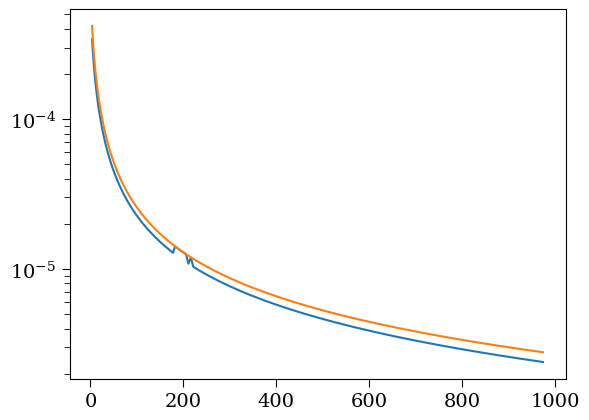

In [ ]:
gammaind = 0
spinind = 0
imageind = 0
phiind = 2
# plt.plot(Z_all[imageind][gammaind][spinind][:,phiind])
imageind = 1
for i in range(2):
    frvals = Bpthetavals[i][gammaind][spinind][:,phiind]*kpphivals[i][gammaind][spinind][:,phiind]-Bpphivals[i][gammaind][spinind][:,phiind]*kpthetavals[i][gammaind][spinind][:,phiind]
    fthetavals = Bprvals[i][gammaind][spinind][:,phiind]*kpphivals[i][gammaind][spinind][:,phiind]-Bpphivals[i][gammaind][spinind][:,phiind]*kprvals[i][gammaind][spinind][:,phiind]
    fphivals = Bpthetavals[i][gammaind][spinind][:,phiind]*kprvals[i][gammaind][spinind][:,phiind]-Bprvals[i][gammaind][spinind][:,phiind]*kpthetavals[i][gammaind][spinind][:,phiind]
    plt.semilogy(betagrid[spinind][:,0],np.abs(fthetavals))
#     thhere = th_all[i][gammaind][spinind][:,phiind]
#     phihere = phi_all[i][gammaind][spinind][:,phiind]-np.pi/2
#     kpthetatest = -np.cos(INC)*np.sin(thhere) - np.cos(thhere)*np.sin(phihere)*np.sin(INC)
#     krtest = np.cos(INC)*np.cos(thhere)-np.sin(phihere)*np.sin(thhere)*np.sin(INC)
#     kphitest = -np.cos(phihere)*np.sin(INC)
    # plt.semilogy(betagrid[spinind][:,0],-kpthetavals[i][gammaind][spinind][:,phiind])
    # plt.semilogy(betagrid[spinind][:,0],-kpthetatest,'k--')
y0 = evpavals[0][gammaind][spinind][:,phiind]%(2*np.pi)*180/np.pi
y0[y0>200] -= 180
# plt.plot(betagrid[spinind][:,0],y0)
# plt.plot(betagrid[spinind][:,0],evpavals[1][gammaind][spinind][:,phiind]%(2*np.pi)*180/np.pi)
# plt.plot(betagrid[spinind][:,0],evpavals[2][gammaind][spinind][:,phiind]%(2*np.pi)*180/np.pi)
# plt.xscale('log')

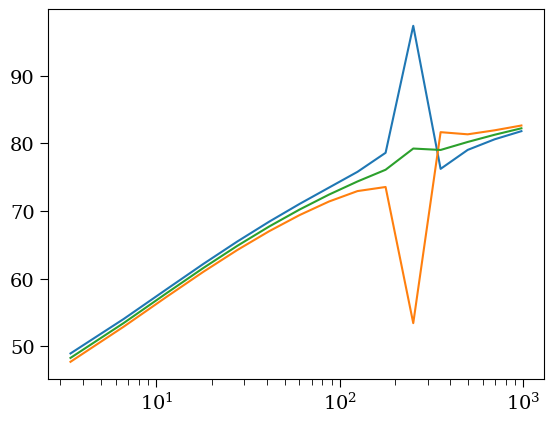

In [ ]:
gammaind = 0
spinind = 0
imageind = 0
phiind = 2
# plt.plot(Z_all[imageind][gammaind][spinind][:,phiind])
imageind = 1
for i in range(2):
    frvals = Bpthetavals[i][gammaind][spinind][:,phiind]*kpphivals[i][gammaind][spinind][:,phiind]-Bpphivals[i][gammaind][spinind][:,phiind]*kpthetavals[i][gammaind][spinind][:,phiind]
    fthetavals = Bprvals[i][gammaind][spinind][:,phiind]*kpphivals[i][gammaind][spinind][:,phiind]-Bpphivals[i][gammaind][spinind][:,phiind]*kprvals[i][gammaind][spinind][:,phiind]
    fphivals = Bpthetavals[i][gammaind][spinind][:,phiind]*kprvals[i][gammaind][spinind][:,phiind]-Bprvals[i][gammaind][spinind][:,phiind]*kpthetavals[i][gammaind][spinind][:,phiind]
    # plt.semilogy(betagrid[spinind][:,0],-fphivals)
    thhere = th_all[i][gammaind][spinind][:,phiind]
    phihere = phi_all[i][gammaind][spinind][:,phiind]-np.pi/2
    kpthetatest = -np.cos(INC)*np.sin(thhere) - np.cos(thhere)*np.sin(phihere)*np.sin(INC)
    krtest = np.cos(INC)*np.cos(thhere)-np.sin(phihere)*np.sin(thhere)*np.sin(INC)
    kphitest = -np.cos(phihere)*np.sin(INC)
    # plt.semilogy(betagrid[spinind][:,0],-kpthetavals[i][gammaind][spinind][:,phiind])
    # plt.semilogy(betagrid[spinind][:,0],-kpthetatest,'k--')
y0 = evpavals[0][gammaind][spinind][:,phiind]%(2*np.pi)*180/np.pi
y0[y0>200] -= 180
plt.plot(betagrid[spinind][:,0],y0)
plt.plot(betagrid[spinind][:,0],evpavals[1][gammaind][spinind][:,phiind]%(2*np.pi)*180/np.pi)
plt.plot(betagrid[spinind][:,0],evpavals[2][gammaind][spinind][:,phiind]%(2*np.pi)*180/np.pi)
plt.xscale('log')

In [ ]:
np.cos(17*np.pi/180)

0.9563047559630354

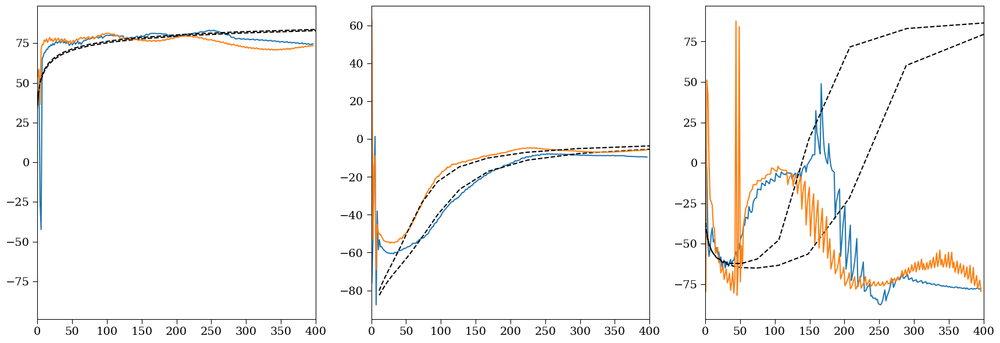

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(21,7))
gammaind = 0
spinind = 1
for spinind in range(len(spins)):
    phiind = 0
    ax[0].plot(betavals_GRMHD[spinind][0],-evpalimbs2_grmhd[spinind][0]*180/np.pi)
    ax[0].plot(betagrid[spinind][:,phiind],-evpavals[1][gammaind][spinind][:,phiind]*180/np.pi,'k--')
    phiind = 1
    ax[1].plot(betavals_GRMHD[spinind][0],-evpaspines_grmhd[spinind][0]*180/np.pi)
    ax[1].plot(betagrid[spinind][:,phiind],-evpavals[2][gammaind][spinind][:,phiind]*180/np.pi,'k--')
    phiind = 2
    ax[2].plot(betavals_GRMHD[spinind][0],-evpalimbs1_grmhd[spinind][0]*180/np.pi)
    ax[2].plot(betagrid[spinind][:,phiind],-evpavals[1][gammaind][spinind][:,phiind]*180/np.pi,'k--')
for i in range(3):
    ax[i].set_xlim(0,400)

In [ ]:
imageind

0

In [ ]:
    phiind = 2
    xvals = Z_all[imageind][gammaind][spinind][:,phiind]*np.sin(INC) #betagrid[spinind][:,phiind]
    yvals0 = np.copy(yvals)
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    for i in range(1,len(yvals),1):
        yops = np.array([yvals[i]-180,yvals[i],yvals[i]+180])
        yvals[i] = yops[np.argmin(np.abs(yops-yvals[i-1]))]
    if np.max(yvals)>200:
        yvals -= 180
    if gammaind == 1:
        yvals += 180
    if spinind == 0:
        ax.plot(xvals, yvals, alpha=alphavals[spinind], label='Receding',color='g')

In [ ]:
Z_all[2]

[[]]

In [ ]:
xvals = Z_all[imageind][gammaind][spinind][:,phiind]*np.sin(INC)

IndexError: list index out of range

[Text(0.5, 0, '$Z\\sin i/M$'), Text(0, 0.5, 'EVPA $(^\\circ)$')]

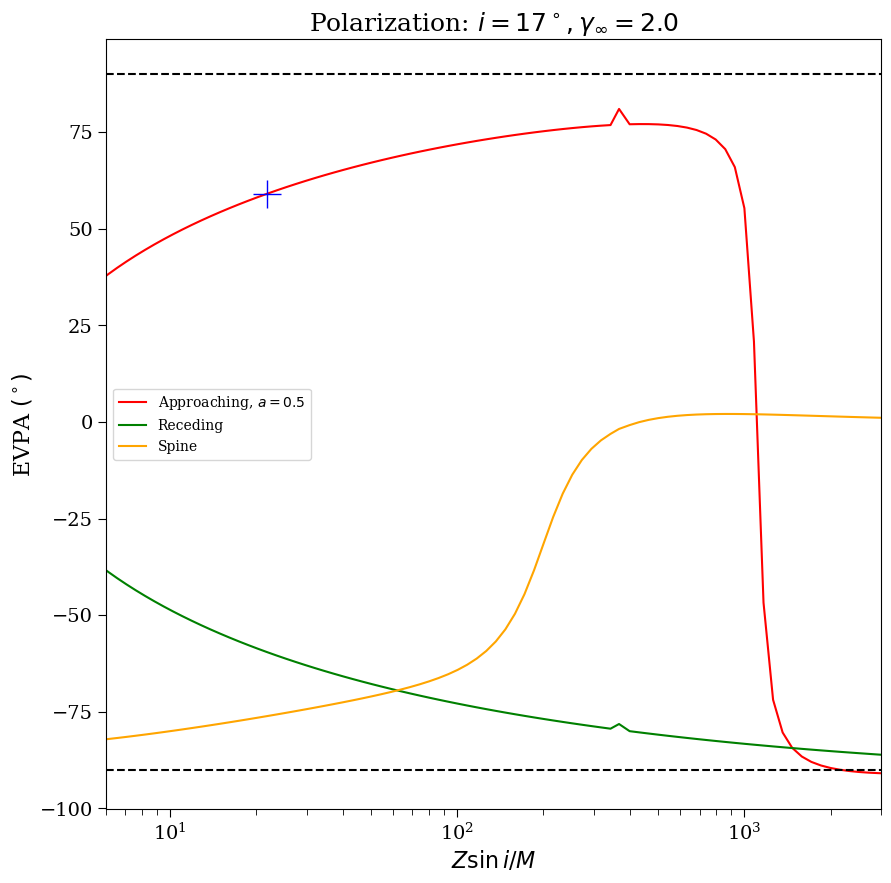

In [ ]:
imageind = 0
fig, ax = plt.subplots(1,figsize=(10,10))
plotinds = [0, 0]
alphavals = [1.0, 0.5]
plotinds = [(0,0),(0,1),(1,0),(1,1)]
for spinind in range(1):
    gammaind = 0
    phiind = 0
    imageind = 0
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    xvals = Z_all[0][gammaind][spinind][:,phiind]*np.sin(INC) #betagrid[spinind][:,phiind]
    lcind = np.argmin(np.abs(Z_all[0][gammaind][spinind][:,phiind]-Zlc_all[0][gammaind][spinind]))
    lceffhighind = np.argmin(np.abs(kprvals[0][gammaind][spinind][:,phiind]))
    yvals[yvals>85] -= 180
    if spinind == 0:
        ax.plot(xvals, yvals, alpha=alphavals[spinind], label=r'Approaching, $a=0.5$',color='r')
    else:
        ax.plot(xvals, yvals, alpha=alphavals[spinind], color='r')
    phiind = 2
    xvals = Z_all[0][gammaind][spinind][:,phiind]*np.sin(INC) #betagrid[spinind][:,phiind]
    yvals0 = np.copy(yvals)
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    for i in range(1,len(yvals),1):
        yops = np.array([yvals[i]-180,yvals[i],yvals[i]+180])
        yvals[i] = yops[np.argmin(np.abs(yops-yvals[i-1]))]
    if np.max(yvals)>200:
        yvals -= 180
    if gammaind == 1:
        yvals += 180
    if spinind == 0:
        ax.plot(xvals, yvals, alpha=alphavals[spinind], label='Receding',color='g')
    else:
        ax.plot(xvals, yvals, alpha=alphavals[spinind], color='g')
    yvals1 = np.copy(yvals)
    phiind = 1
    xvals = Z_all[0][gammaind][spinind][:,phiind]*np.sin(INC) #betagrid[spinind][:,phiind]
    yvals = -evpavals[2][gammaind][spinind][:,phiind]*180/np.pi
    phiind = 2
    xvals = Z_all[0][gammaind][spinind][:,phiind]*np.sin(INC) #betagrid[spinind][:,phiind]
    # if gammaind<2:
    #     khere = kprvals[imageind][gammaind][spinind][:,phiind]*Bpphivals[imageind][gammaind][spinind][:,phiind]-kpphivals[imageind][gammaind][spinind][:,phiind]*Bprvals[imageind][gammaind][spinind][:,phiind]
    #     indplot = np.where((np.roll(np.sign(khere),-1)-np.sign(khere))==-2)[0]
    #     ax[plotinds[gammaind]].plot(xvals[lcind],yvals1[lcind],'b+',markersize=20,label=r'$R_L$')
    #     if len(indplot)>0:
    #         indplot = indplot[0]
    #         ax[plotinds[gammaind]].plot(xvals[indplot],yvals1[indplot],'b*',markersize=20,label=r'$f^{(\theta)}=0$')
    ax.plot(xvals[lcind],yvals0[lcind],'b+',markersize=20)
    # ax.plot(xvals[lceffhighind],yvals0[lceffhighind],'b*',markersize=20,label=r'$k^{(r)}=0$')
    if spinind == 0:
        ax.plot(xvals, yvals, alpha=alphavals[spinind], label='Spine',color='orange')
    else:
        ax.plot(xvals, yvals, alpha=alphavals[spinind],label=r'$a=0.7$', color='orange')
    ax.axhline(-90,color='k',linestyle='--')
    ax.axhline(90,color='k',linestyle='--')
    ax.set(xscale=('log'),xlim=(6,3000))
    ax.legend(fontsize=10)
ax.set_title(r'Polarization: $i=17^\circ,\gamma_\infty=2.0$', fontsize=18)
ax.set(xlabel=r'$Z\sin i/M$', ylabel=r'EVPA $(^\circ)$')
# plt.savefig('Figures/limbs_comparespin_inc17.pdf',bbox_inches='tight',dpi=300)
# plt.savefig('Figures/limbs_comparespin_inc17.png',bbox_inches='tight',dpi=300)

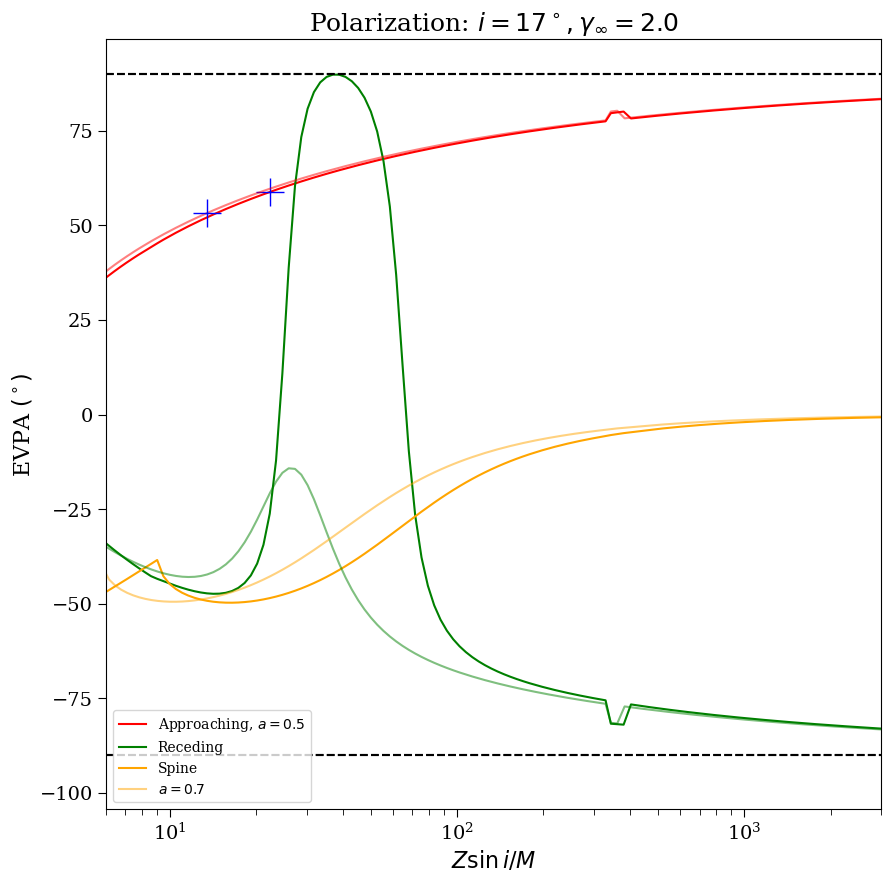

In [ ]:
imageind = 0
fig, ax = plt.subplots(1,figsize=(10,10))
plotinds = [0, 0]
alphavals = [1.0, 0.5]
plotinds = [(0,0),(0,1),(1,0),(1,1)]
for spinind in range(2):
    gammaind = 0
    phiind = 0
    imageind = 0
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    xvals = Z_all[imageind][gammaind][spinind][:,phiind]*np.sin(INC) #betagrid[spinind][:,phiind]
    lcind = np.argmin(np.abs(Z_all[imageind][gammaind][spinind][:,phiind]-Zlc_all[imageind][gammaind][spinind]))
    lceffhighind = np.argmin(np.abs(kprvals[imageind][gammaind][spinind][:,phiind]))
    yvals[yvals>85] -= 180
    if spinind == 0:
        ax.plot(xvals, yvals, alpha=alphavals[spinind], label=r'Approaching, $a=0.5$',color='r')
    else:
        ax.plot(xvals, yvals, alpha=alphavals[spinind], color='r')
    phiind = 2
    xvals = Z_all[imageind][gammaind][spinind][:,phiind]*np.sin(INC) #betagrid[spinind][:,phiind]
    yvals0 = np.copy(yvals)
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    for i in range(1,len(yvals),1):
        yops = np.array([yvals[i]-180,yvals[i],yvals[i]+180])
        yvals[i] = yops[np.argmin(np.abs(yops-yvals[i-1]))]
    if np.max(yvals)>200:
        yvals -= 180
    if gammaind == 1:
        yvals += 180
    if spinind == 0:
        ax.plot(xvals, yvals, alpha=alphavals[spinind], label='Receding',color='g')
    else:
        ax.plot(xvals, yvals, alpha=alphavals[spinind], color='g')
    yvals1 = np.copy(yvals)
    phiind = 1
    xvals = Z_all[imageind][gammaind][spinind][:,phiind]*np.sin(INC) #betagrid[spinind][:,phiind]
    yvals = -evpavals[2][gammaind][spinind][:,phiind]*180/np.pi
    phiind = 2
    xvals = Z_all[imageind][gammaind][spinind][:,phiind]*np.sin(INC) #betagrid[spinind][:,phiind]
    # if gammaind<2:
    #     khere = kprvals[imageind][gammaind][spinind][:,phiind]*Bpphivals[imageind][gammaind][spinind][:,phiind]-kpphivals[imageind][gammaind][spinind][:,phiind]*Bprvals[imageind][gammaind][spinind][:,phiind]
    #     indplot = np.where((np.roll(np.sign(khere),-1)-np.sign(khere))==-2)[0]
    #     ax[plotinds[gammaind]].plot(xvals[lcind],yvals1[lcind],'b+',markersize=20,label=r'$R_L$')
    #     if len(indplot)>0:
    #         indplot = indplot[0]
    #         ax[plotinds[gammaind]].plot(xvals[indplot],yvals1[indplot],'b*',markersize=20,label=r'$f^{(\theta)}=0$')
    ax.plot(xvals[lcind],yvals0[lcind],'b+',markersize=20)
    # ax.plot(xvals[lceffhighind],yvals0[lceffhighind],'b*',markersize=20,label=r'$k^{(r)}=0$')
    if spinind == 0:
        ax.plot(xvals, yvals, alpha=alphavals[spinind], label='Spine',color='orange')
    else:
        ax.plot(xvals, yvals, alpha=alphavals[spinind],label=r'$a=0.7$', color='orange')
    ax.axhline(-90,color='k',linestyle='--')
    ax.axhline(90,color='k',linestyle='--')
    ax.set(xscale=('log'),xlim=(6,3000))
    ax.legend(fontsize=10)
ax.set_title(r'Polarization: $i=17^\circ,\gamma_\infty=2.0$', fontsize=18)
ax.set(xlabel=r'$Z\sin i/M$', ylabel=r'EVPA $(^\circ)$')
plt.savefig('Figures/limbs_comparespin_inc17.pdf',bbox_inches='tight',dpi=300)
plt.savefig('Figures/limbs_comparespin_inc17.png',bbox_inches='tight',dpi=300)

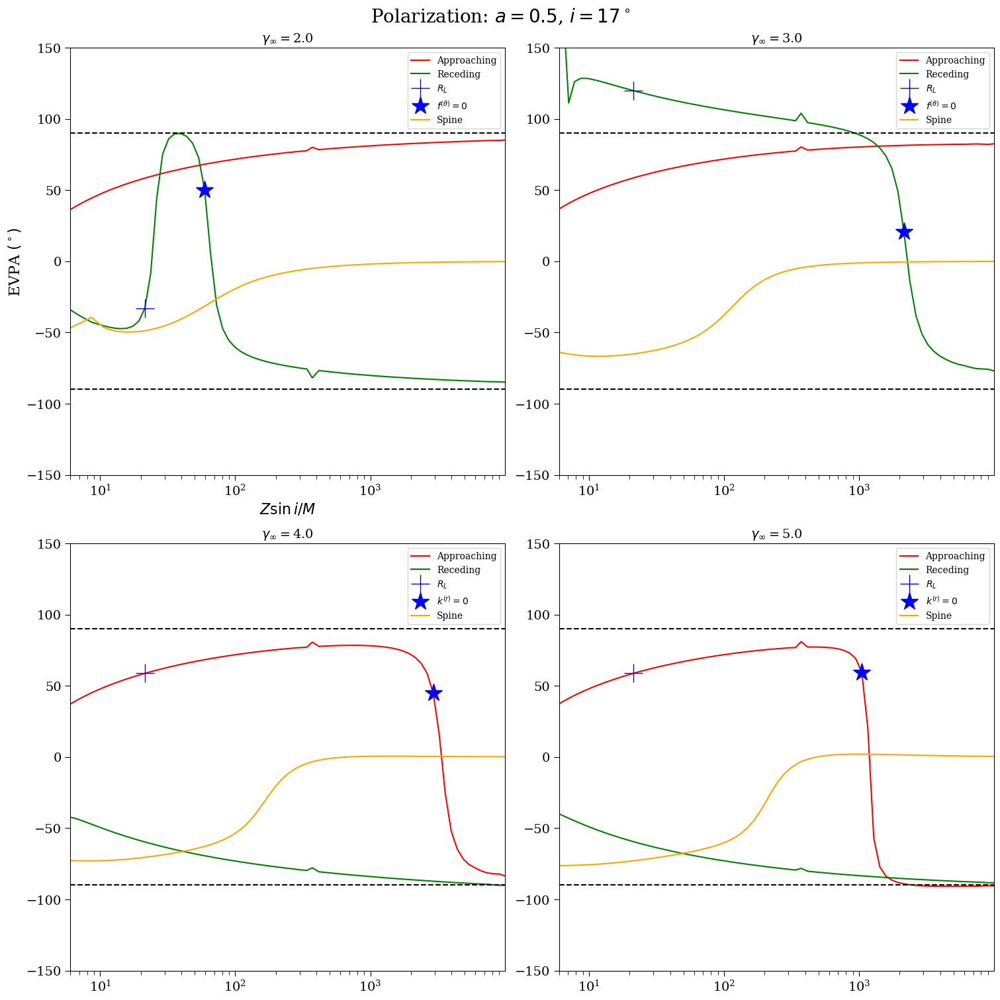

In [ ]:
imageind = 0
spinind = 0
fig, ax = plt.subplots(2,2,figsize=(15,15),constrained_layout=True)
plotinds = [(0,0),(0,1),(1,0),(1,1)]
for gammaind in range(4):
    phiind = 0
    imageind = 0
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    xvals = Z_all[imageind][gammaind][spinind][:,phiind]*np.sin(INC) #betagrid[spinind][:,phiind]
    lcind = np.argmin(np.abs(Z_all[imageind][gammaind][spinind][:,phiind]-Zlc_all[imageind][gammaind][spinind]))
    lceffhighind = np.argmin(np.abs(kprvals[imageind][gammaind][spinind][:,phiind]))
    if gammaind == 3:
        yvals[yvals>85] -= 180
    ax[plotinds[gammaind]].plot(xvals, yvals, label='Approaching',color='r')
    phiind = 2
    xvals = Z_all[imageind][gammaind][spinind][:,phiind]*np.sin(INC) #betagrid[spinind][:,phiind]
    yvals0 = np.copy(yvals)
    yvals = -evpavals[imageind][gammaind][spinind][:,phiind]*180/np.pi
    for i in range(1,len(yvals),1):
        yops = np.array([yvals[i]-180,yvals[i],yvals[i]+180])
        yvals[i] = yops[np.argmin(np.abs(yops-yvals[i-1]))]
    if np.max(yvals)>200:
        yvals -= 180
    if gammaind == 1:
        yvals += 180
    ax[plotinds[gammaind]].plot(xvals, yvals, label='Receding',color='g')
    yvals1 = np.copy(yvals)
    phiind = 1
    xvals = Z_all[imageind][gammaind][spinind][:,phiind]*np.sin(INC) #betagrid[spinind][:,phiind]
    yvals = -evpavals[2][gammaind][spinind][:,phiind]*180/np.pi
    phiind = 2
    xvals = Z_all[imageind][gammaind][spinind][:,phiind]*np.sin(INC) #betagrid[spinind][:,phiind]
    if gammaind<2:
        khere = kprvals[imageind][gammaind][spinind][:,phiind]*Bpphivals[imageind][gammaind][spinind][:,phiind]-kpphivals[imageind][gammaind][spinind][:,phiind]*Bprvals[imageind][gammaind][spinind][:,phiind]
        indplot = np.where((np.roll(np.sign(khere),-1)-np.sign(khere))==-2)[0]
        ax[plotinds[gammaind]].plot(xvals[lcind],yvals1[lcind],'b+',markersize=20,label=r'$R_L$')
        if len(indplot)>0:
            indplot = indplot[0]
            ax[plotinds[gammaind]].plot(xvals[indplot],yvals1[indplot],'b*',markersize=20,label=r'$f^{(\theta)}=0$')
    else:
        ax[plotinds[gammaind]].plot(xvals[lcind],yvals0[lcind],'b+',markersize=20,label=r'$R_L$')
        ax[plotinds[gammaind]].plot(xvals[lceffhighind],yvals0[lceffhighind],'b*',markersize=20,label=r'$k^{(r)}=0$')
    ax[plotinds[gammaind]].plot(xvals, yvals, label='Spine',color='orange')
    ax[plotinds[gammaind]].axhline(-90,color='k',linestyle='--')
    ax[plotinds[gammaind]].axhline(90,color='k',linestyle='--')
    ax[plotinds[gammaind]].set(xscale=('log'),xlim=(6,betagrid[spinind][-1,0]),ylim=(-150,150),title=r'$\gamma_\infty=$'+str(gammamaxvals[gammaind]))
    ax[plotinds[gammaind]].legend(fontsize=10)
plt.suptitle(r'Polarization: $a=0.5$, $i=17^\circ$', fontsize=20)
ax[0,0].set(xlabel=r'$Z\sin i/M$', ylabel=r'EVPA $(^\circ)$')
plt.savefig('Figures/limbs_comparegamma.pdf',bbox_inches='tight',dpi=300)
plt.savefig('Figures/limbs_comparegamma.png',bbox_inches='tight',dpi=300)

# Now compare to GRMHD

In [ ]:
#define parameters
ROUT = 4.e10 # sgra distance in M
Nz = 50
Nphi = 3
INC = 17*np.pi/180
Zmin = 5/np.sin(INC) #np.min(np.abs(b2pars_noeps_17[0][0]/MoD))*.5
Zmax = 500/np.sin(INC) #np.max(np.abs(b2pars_noeps_17[0][0]/MoD))
Zvals_plan = np.linspace(Zmin, Zmax, Nz) #np.logspace(np.log10(Zmin), np.log10(Zmax), Nz)
Xvals_plan = np.zeros(Nphi)
alphafac = 1.0-1e-4 #smush in

NGEO = 5000 #number of points per geodesic (for guessing before root-finder)
neqmax = 2
model = 'power'

spins = np.array([0.3, 0.5, 0.7, 0.9])
spinstring = np.char.mod('%i', spins*10)
rp = 1+np.sqrt(1-spins**2)
pval = 0.6
thplus = 40*np.pi/180
psitarget = rp**pval*(1-np.cos(thplus))

# minphi = np.pi/2
# maxphi = 3*np.pi/2
# phivals_plan = np.linspace(minphi, maxphi, Nphi)
Xgrid, Zgrid = np.meshgrid(Xvals_plan, Zvals_plan)
Ygrid = np.zeros_like(Xgrid)

alphagrid = []
betagrid = []
Ylimbvals = []
Xlimbvals = []
for i in range(len(spins)):
    solveR = lambda Rvals : np.sqrt(Rvals**2+Zvals_plan**2)**pval*(1-Zvals_plan/np.sqrt(Rvals**2+Zvals_plan**2))-psitarget[i]
    Rhere = opt.newton(solveR, np.ones_like(Zvals_plan))
    rhere = np.sqrt(Rhere**2+Zvals_plan**2)
    Ylimb = -(Rhere**2+pval*Zvals_plan*(Zvals_plan-rhere))/np.tan(INC)/(pval*(rhere-Zvals_plan)+Zvals_plan)
    Ylimbvals.append(Ylimb)
    Xlimb = np.sqrt(Rhere**2-Ylimb**2)
    Xlimbvals.append(Xlimb)
    
    Xgrid[:,0] = -np.copy(Xlimb) #left (approaching) limb
    Xgrid[:,1] = np.zeros_like(Xlimb) #spine
    Xgrid[:,2] = np.copy(Xlimb) #right (receding) limb
    Ygrid[:,0] = np.copy(Ylimb) #left (approaching) limb
    Ygrid[:,1] = np.copy(Rhere) #spine
    Ygrid[:,2] = np.copy(Ylimb) #right (receding) limb
    
    alphagrid.append(np.copy(Xgrid)*alphafac)
    betagrid.append(Ygrid*np.cos(INC)+Zgrid*np.sin(INC))
    
    
    
    # phigrid2, Rgridhere = np.meshgrid(phivals_plan, Rhere)
    # Rgrid.append(Rgridhere)
    # alphagrid.append(Rgrid[i]*np.cos(phigrid-np.pi/2))
    # betagrid.append(Zgrid*np.sin(INC)+Rgrid[i]*np.cos(INC)*np.sin(phigrid-np.pi/2))

# alphagrid = bgrid*np.cos(varphigrid)
# betagrid = bgrid*np.sin(varphigrid)

incs = np.array([17*np.pi/180]) #np.array([0.01, 8.5, 17, 25.5, 34])*np.pi/180
incstrig = np.char.mod('%.1f', incs*180/np.pi)

outgeos = []
for spinind in range(len(spins)):
    for i in list(range(len(incs))):
        inc = incs[i]
        spin = spins[spinind]
        print(inc*180/np.pi, spin)
        outgeo = raytrace_ana(a=spin,
                observer_coords = [0,ROUT,inc,0],
                image_coords = [alphagrid[spinind].flatten(), betagrid[spinind].flatten()], #assumes 1D arrays of alpha and beta
                ngeo=NGEO,
                do_phi_and_t=True,
                savedata=False, plotdata=False)
        outgeos.append(outgeo)

17.0 0.3
calculating preliminaries...
integrating in theta...0.86 s
integrating in r...1.37 s
done!   2.2451469898223877  seconds!
17.0 0.5
calculating preliminaries...
integrating in theta...0.89 s
integrating in r...1.33 s
done!   2.2292277812957764  seconds!
17.0 0.7
calculating preliminaries...
integrating in theta...0.88 s
integrating in r...1.38 s
done!   2.2619030475616455  seconds!
17.0 0.9
calculating preliminaries...
integrating in theta...0.89 s
integrating in r...1.37 s
done!   2.275350570678711  seconds!


In [ ]:
model = 'power'
vel = 'driftframe'
gammamaxvals = [2.0] #, 3.0, 4.0, 5.0]
psitarget = rp**pval*(1-np.cos(thplus)) # 1-np.cos(5*np.pi/180)
sigmaplasma = 1
emit = 'sigma'
pathcor='R'
specind = 1
anis = None
R_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Z_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
phi_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Zlc_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Rlc_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Zinterp_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Rlc_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Zlc_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
b2_zpvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
b2_bvvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
I_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Q_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
U_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
evpa_all = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
limbindvals1 = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
limbindvals2 = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
evpavals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
OmegaFvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
kprvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
kpphivals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Bprvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
Bpphivals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
vrvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]
# urvals = [[[] for j in range(len(gammamaxvals))] for i in range(3)]

for spinind in range(len(spins)):
    for gammaind in range(len(gammamaxvals)):
        for imageind in range(2):
            phisign = 1 if imageind == 1 else -1
            signpr, signptheta, neqvals, rvals, thvals, Zvals, Rvals, phivals, Rlc, Zlc, b2vals, OmegaF = getcoords(outgeos[spinind], psitarget[spinind], INC, spins[spinind], model, pval, vel, imageind, Nz, Nphi, alphagrid[spinind], betagrid[spinind], neqmax=neqmax)
            (kp_t, kp_x, kp_y, kp_z, Bp_x, Bp_y, Bp_z, ut, ur) = getkB(alphagrid[spinind], betagrid[spinind], spins[spinind], signpr, signptheta, neqvals, rvals, thvals, Zvals, Rvals, phivals, Rlc, Zlc, b2vals, OmegaF, sigmaplasma=sigmaplasma, gammamax=gammamaxvals[gammaind], pval=pval, velmodel=vel, model=model)
            kprvals[imageind][gammaind].append(np.reshape(kp_x,(Nz,Nphi)))
            kpphivals[imageind][gammaind].append(np.reshape(kp_z,(Nz,Nphi)))
            Bprvals[imageind][gammaind].append(np.reshape(Bp_x,(Nz,Nphi)))
            Bpphivals[imageind][gammaind].append(np.reshape(Bp_z,(Nz,Nphi)))
            vrvals[imageind][gammaind].append(np.reshape(ur/ut,(Nz,Nphi)))
            print(Rlc, Zlc, np.min(Zvals))
            ivec, qvec, uvec = getinfo(signpr, signptheta, neqvals, rvals, thvals, INC, spins[spinind], model, pval, vel, alphagrid[spinind], betagrid[spinind], gammamax=gammamaxvals[gammaind], neqmax=neqmax)
            dlogI = np.abs(np.log(np.roll(ivec[0],-1,axis=1))-np.log(ivec[0]))
            dlogI[ivec[0]<1e-14] = 0
            b2_zpvals[imageind].append((qvec[0]+1j*uvec[0])*np.exp(-1j*2*(phisign*phivals)))
            I_all[imageind][gammaind].append(ivec[0])
            Q_all[imageind][gammaind].append(qvec[0])
            U_all[imageind][gammaind].append(uvec[0])
            evpavals[imageind][gammaind].append(.5*np.angle(qvec[0]+1j*uvec[0]))
            OmegaFvals[imageind][gammaind].append(OmegaF)
            R_all[imageind][gammaind].append(Rvals)
            Rlc_all[imageind][gammaind].append(Rlc)
            Z_all[imageind][gammaind].append(Zvals)
            phi_all[imageind][gammaind].append(phivals)
            Zlc_all[imageind][gammaind].append(Zlc)
        I_all[2][gammaind].append(I_all[0][gammaind][spinind]+I_all[1][gammaind][spinind])
        Q_all[2][gammaind].append(Q_all[0][gammaind][spinind]+Q_all[1][gammaind][spinind])
        U_all[2][gammaind].append(U_all[0][gammaind][spinind]+U_all[1][gammaind][spinind])
        b2_zpvals[2][gammaind].append((Q_all[2][gammaind][spinind]+1j*U_all[2][gammaind][spinind])*np.exp(-1j*2*(phi_all[0][gammaind][spinind])))
        evpavals[2][gammaind].append(.5*np.angle(Q_all[2][gammaind][spinind]+1j*U_all[2][gammaind][spinind]))

(4, 150)
before solve
after solve
gammafac 1.1259008738050686
hiii
gammafac 1.1259008738050686
hiii
29.00343901786985 156.83015797327766 17.749588567689738
gammafac 1.1259008738050686
hiii
gammafac 1.1259008738050686
hiii
(4, 150)
before solve


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:204: RuntimeWarning: RMS of 0.000117084 reached
  outqty = scipy.optimize.newton(get_coord_intersect, guesses, maxiter=500, tol=tol)


after solve
gammafac 1.1258894275283768
hiii
gammafac 1.1258894275283768
hiii
28.605146027923684 153.74253271960166 16.38666459055368
gammafac 1.1258894275283768
hiii
gammafac 1.1258894275283768
hiii
(4, 150)
before solve
after solve
gammafac 1.135358248038216
hiii
gammafac 1.135358248038216
hiii
19.04472678017478 87.34440630254048 17.93734736909058
gammafac 1.135358248038216
hiii
gammafac 1.135358248038216
hiii
(4, 150)
before solve
after solve
gammafac 1.1336148206999968
hiii
gammafac 1.1336148206999968
hiii
18.691127005120418 85.01610201776549 16.18187026668538
gammafac 1.1336148206999968
hiii
gammafac 1.1336148206999968
hiii
(4, 150)
before solve


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:204: RuntimeWarning: RMS of 0.000116885 reached
  outqty = scipy.optimize.newton(get_coord_intersect, guesses, maxiter=500, tol=tol)


after solve
gammafac 1.150045118518365
hiii
gammafac 1.150045118518365
hiii
13.068472362401248 52.66507798376413 18.13203268568086
gammafac 1.150045118518365
hiii
gammafac 1.150045118518365
hiii
(4, 150)
before solve
after solve
gammafac 1.1453928814599055
hiii
gammafac 1.1453928814599055
hiii
12.708741104035113 50.58243156233425 15.969125207437806
gammafac 1.1453928814599055
hiii
gammafac 1.1453928814599055
hiii
(4, 150)
before solve
after solve
gammafac 1.1655634126835397
hiii
gammafac 1.1655634126835397
hiii
5.968599803310554 18.29943738694648 18.281958899952528
gammafac 1.1655634126835397
hiii
gammafac 1.1655634126835397
hiii
(4, 150)
before solve
after solve
gammafac 1.1575484386402146
hiii
gammafac 1.1575484386402146
hiii
5.66823253173584 16.972449968480838 15.80433426406703
gammafac 1.1575484386402146
hiii
gammafac 1.1575484386402146
hiii


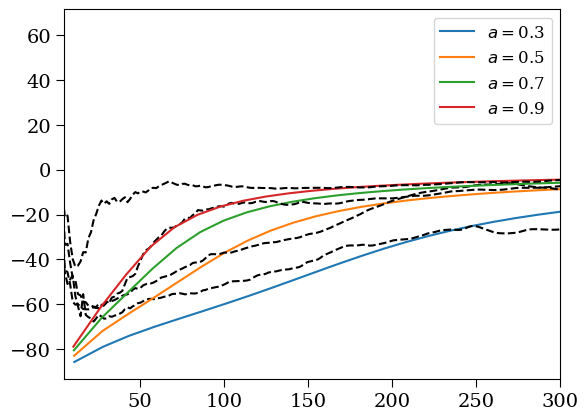

In [ ]:
gammaind = 0
phiind = 1
for i in range(len(spins)):
    plt.plot(betagrid[i][:,phiind],-evpavals[2][gammaind][i][:,phiind]*180/np.pi,label=r'$a=$'+str(spins[i]))
    plt.plot(-betavals_GRMHD[i][0],evpaspines_grmhd[i][0]*180/np.pi,'k--')
plt.xlim(5,300)
plt.legend()

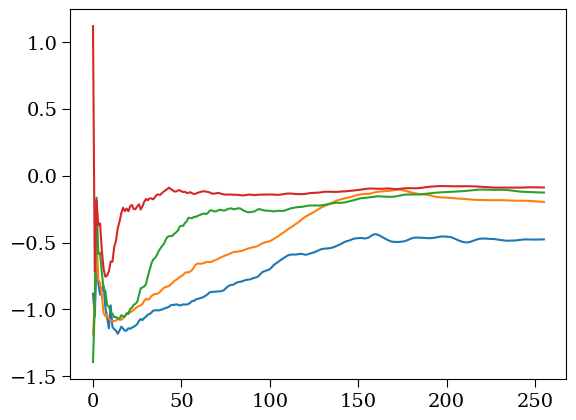

In [ ]:
for i in range(len(spins)):
    plt.plot(evpaspines_grmhd[i][0])

Text(0.5, 1.01, 'Comparison of Semi-Analytic Model to Time-Averaged GRMHD')

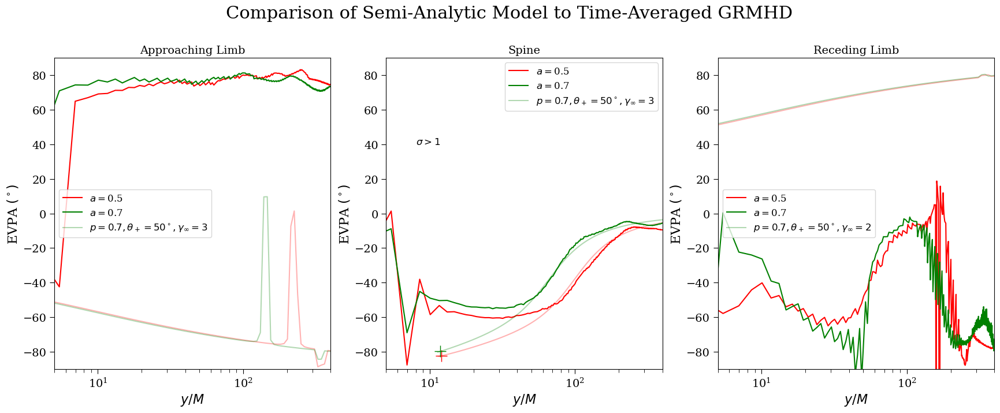

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(21,7))
alpha = 0.3
titles = ['Approaching Limb', 'Spine','Receding Limb']
colors = ['r','g']
for i in range(len(spins)):
    imageind = 2
    gammaind = 0
    phiind = 2
    ax[0].plot(betavals_GRMHD[i][0],-np.array(evpalimbs2_grmhd[i][0])*180/np.pi,color=colors[i],label=r'$a=$'+str(spins[i]))
    yvals = -evpavals[imageind][gammaind][i][:,-1]*180/np.pi
    if i == 0:
        ax[0].plot(betagrid[i][:,-1],yvals,color=colors[i],alpha=alpha)
    else:
        ax[0].plot(betagrid[i][:,-1],yvals,color=colors[i],alpha=alpha,label=r'$p=0.7,\theta_+=50^\circ,\gamma_\infty=3$')
    ax[0].plot(betagrid[i][phiind,-1],yvals[phiind],'+',color=colors[i],markersize=15.0)
    ax[1].plot(betavals_GRMHD[i][0],-np.array(evpaspines_grmhd[i][0])*180/np.pi,color=colors[i],label=r'$a=$'+str(spins[i]))
    yvals = -evpavals[imageind][gammaind][i][:,Nphi//2]*180/np.pi
    yvals[yvals>30] -= 180
    if i == 0:
        ax[1].plot(betagrid[i][:,Nphi//2],yvals,color=colors[i],alpha=alpha)
    else:
        ax[1].plot(betagrid[i][:,Nphi//2],yvals,color=colors[i],alpha=alpha,label=r'$p=0.7,\theta_+=50^\circ,\gamma_\infty=3$')
    phiind = 1
    ax[1].plot(betagrid[i][phiind,Nphi//2],yvals[phiind],'+',color=colors[i],markersize=15.0)
    yvals = -np.array(evpalimbs1_grmhd[i][0])*180/np.pi
    yvals[yvals>20] -= 180
    ax[2].plot(betavals_GRMHD[i][0],yvals,color=colors[i],label=r'$a=$'+str(spins[i]))
    gammaind = 0
    yvals = -evpavals[imageind][gammaind][i][:,0]*180/np.pi
    if i == 0:
        ax[2].plot(betagrid[i][:,0],yvals,color=colors[i],alpha=alpha)
    else:
        ax[2].plot(betagrid[i][:,0],yvals,color=colors[i],alpha=alpha,label=r'$p=0.7,\theta_+=50^\circ,\gamma_\infty=2$')
    phiind = 0
    ax[2].plot(betagrid[i][phiind,0],yvals[phiind],'+',color=colors[i],markersize=15.0)
    # indtest = np.argmin(np.abs(ispines_grmhd[0][4]-ispines_grmhd[0][3])/ispines_grmhd[0][4])
    # ax[1].axvline(betavals_GRMHD[i][0][indtest],color='k',linestyle='--')
ax[1].text(8,40,r'$\sigma>1$')
for i in range(3):
    ax[i].legend()
    ax[i].set(xscale='log',xlim=(5,400),ylim=(-90,90),title=titles[i],xlabel=r'$y/M$',ylabel=r'EVPA $(^\circ)$')
plt.suptitle('Comparison of Semi-Analytic Model to Time-Averaged GRMHD',fontsize=22,y=1.01)
# plt.savefig('Figures/GRMHD_pol_all_log.pdf',bbox_inches='tight',dpi=300)
# plt.savefig('Figures/GRMHD_pol_all_log.png',bbox_inches='tight',dpi=300)

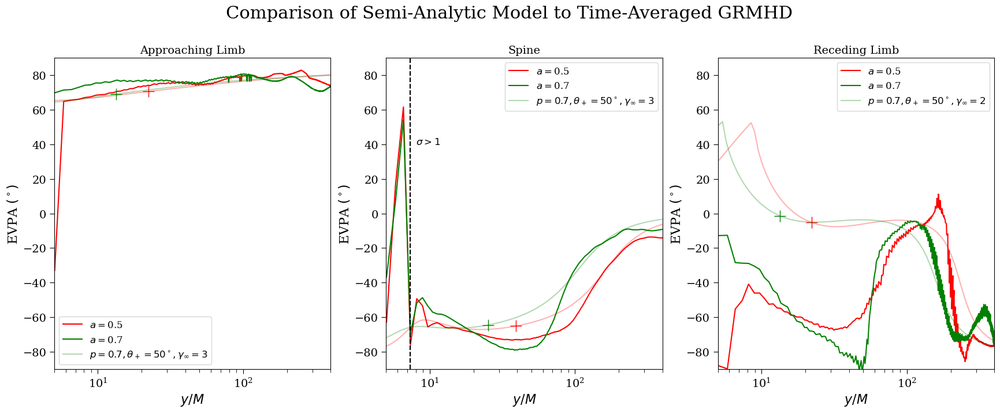

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(21,7))
alpha = 0.3
titles = ['Approaching Limb', 'Spine','Receding Limb']
colors = ['r','g']
for i in range(len(spins)):
    imageind = 2
    gammaind = 1
    ax[0].plot(betavals_GRMHD[i][0],-np.array(evpalimbs2_grmhd[i][0])*180/np.pi,color=colors[i],label=r'$a=$'+str(spins[i]))
    yvals = -evpavals[imageind][gammaind][i][:,-1]*180/np.pi
    if i == 0:
        ax[0].plot(betagrid[i][:,-1],yvals,color=colors[i],alpha=alpha)
    else:
        ax[0].plot(betagrid[i][:,-1],yvals,color=colors[i],alpha=alpha,label=r'$p=0.7,\theta_+=50^\circ,\gamma_\infty=3$')
    ax[0].plot(betagrid[i][indlimb2[i],-1],yvals[indlimb2[i]],'+',color=colors[i],markersize=15.0)
    ax[1].plot(betavals_GRMHD[i][0],-np.array(evpaspines_grmhd[i][0])*180/np.pi,color=colors[i],label=r'$a=$'+str(spins[i]))
    yvals = -evpavals[imageind][gammaind][i][:,Nphi//2]*180/np.pi
    yvals[yvals>30] -= 180
    if i == 0:
        ax[1].plot(betagrid[i][:,Nphi//2],yvals,color=colors[i],alpha=alpha)
    else:
        ax[1].plot(betagrid[i][:,Nphi//2],yvals,color=colors[i],alpha=alpha,label=r'$p=0.7,\theta_+=50^\circ,\gamma_\infty=3$')
    ax[1].plot(betagrid[i][indspines[i],Nphi//2],yvals[indspines[i]],'+',color=colors[i],markersize=15.0)
    yvals = -np.array(evpalimbs1_grmhd[i][0])*180/np.pi
    yvals[yvals>20] -= 180
    ax[2].plot(betavals_GRMHD[i][0],yvals,color=colors[i],label=r'$a=$'+str(spins[i]))
    gammaind = 0
    yvals = -evpavals[imageind][gammaind][i][:,0]*180/np.pi
    if i == 0:
        ax[2].plot(betagrid[i][:,0],yvals,color=colors[i],alpha=alpha)
    else:
        ax[2].plot(betagrid[i][:,0],yvals,color=colors[i],alpha=alpha,label=r'$p=0.7,\theta_+=50^\circ,\gamma_\infty=2$')
    ax[2].plot(betagrid[i][indlimb2[i],0],yvals[indlimb1[i]],'+',color=colors[i],markersize=15.0)
    indtest = np.argmin(np.abs(ispines_grmhd[0][4]-ispines_grmhd[0][3])/ispines_grmhd[0][4])
    ax[1].axvline(betavals_GRMHD[i][0][indtest],color='k',linestyle='--')
ax[1].text(8,40,r'$\sigma>1$')
for i in range(3):
    ax[i].legend()
    ax[i].set(xscale='log',xlim=(5,400),ylim=(-90,90),title=titles[i],xlabel=r'$y/M$',ylabel=r'EVPA $(^\circ)$')
plt.suptitle('Comparison of Semi-Analytic Model to Time-Averaged GRMHD',fontsize=22,y=1.01)
plt.savefig('Figures/GRMHD_pol_all_log.pdf',bbox_inches='tight',dpi=300)
plt.savefig('Figures/GRMHD_pol_all_log.png',bbox_inches='tight',dpi=300)

In [ ]:
ls Figures

GRMHD_images_ZAMO.pdf               pol_compareFaraday.png
GRMHD_images_ZAMO.png               pol_comparefreq.pdf
GRMHD_images_full.pdf               pol_comparefreq.png
GRMHD_images_full.png               pol_faraday_compare.pdf
GRMHD_pol_ZAMO.pdf                  pol_faraday_compare_disk45_r50.pdf
GRMHD_pol_ZAMO.png                  pol_z_compareinc_ZAMO.pdf
GRMHD_pol_gamm2.png                 pol_z_compareinc_ZAMO.png
GRMHD_pol_gamma2.pdf                pol_z_compareinc_gamm2.png
GRMHD_pol_gamma2.png                pol_z_compareinc_gamma2.pdf
avgim_freq230_spin5.pdf             pol_z_compareinc_gamma2.png
avgim_freq230_spin5.png             polarization_spin0.5_inc17_ZAMO.pdf
avgim_freq230_spin9.pdf             polarization_spin0.5_inc17_ZAMO.png
avgim_freq230_spin9.png             polarization_spin0.5_inc17_gamma2.pdf
compare_GRMHD_model.pdf             semi_pol.pdf
compare_GRMHD_model.png             semi_pol.png
compare_GRMHD_model_half.pdf        spine_sheath_FF.pdf
compare_GRM

/tmp/ipykernel_92399/3483838314.py:2: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


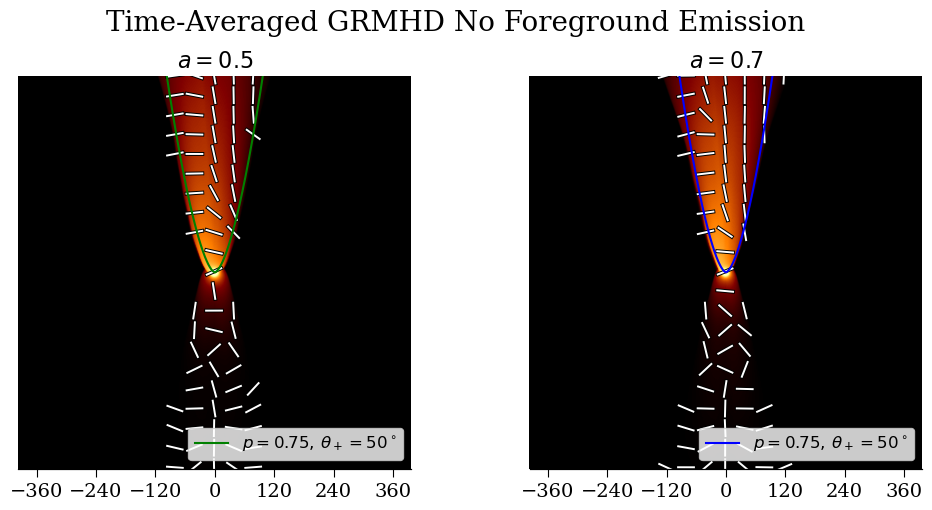

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(10,5), constrained_layout=True)
fig.tight_layout()
pval = 0.75
psitarget = rp**pval*(1-np.cos(thplus))
nth = 1000
thvals = np.linspace(thplus, 1*np.pi/180,nth)
colors = ['g', 'b']
for i in range(len(spins)):
    rvals = (psitarget[i]/(1-np.cos(thvals)))**(1/pval)
    Rvals = rvals*np.sin(thvals)
    Zvals = rvals*np.cos(thvals)
    alphavals = np.copy(Rvals)
    betavals = Zvals*np.sin(inc)
    rownew, colnew = Mtopix(ims[1][1], alphavals, betavals)
    ax[i].plot(rownew, colnew,color=colors[i])
    rownew, colnew = Mtopix(ims[1][1], -alphavals, betavals)
    ax[i].plot(rownew, colnew,color=colors[i],label=r'$p={},\,\theta_+={}^\circ$'.format(str(pval),str(int(thplus*180/np.pi))))
    ims[i][0].display(scale='log',plotp=True,pcut=1e-10,dynamic_range=[1e7],axis=ax[i],has_title=False,label_type=None,has_cbar=False)
    ax[i].set(xlim=(0,ims[i][1].xdim),ylim=(ims[i][1].ydim,0))
ax[0].set_title(r'$a=0.5$',fontsize=16)
ax[1].set_title(r'$a=0.7$',fontsize=16)
ax[0].legend(loc='lower right')
ax[1].legend(loc='lower right')

plt.suptitle('Time-Averaged GRMHD No Foreground Emission', fontsize=20,y=1.05)
for i in range(2):
    ax_position = ax[i].get_position()
    bar_height = 0.05
    NPTS = ims[0][1].xdim
    bmax5 = ims[0][1].fovx()/eh.RADPERUAS/MoD/2
    ax_ticks = fig.add_axes([ax_position.x0+ax_position.width/NPTS/2, ax_position.y0, ax_position.width-ax_position.width/NPTS, 0])
    ax_ticks.set_xlim(-bmax5, bmax5)
    ax_ticks.set_ylim(0, 1)  # Keep the height small to make it look like a bar
    ax_ticks.xaxis.set_ticks(np.linspace(-360, 360, 7))
    ax_ticks.yaxis.set_ticks([])  # Hide y-axis ticks

# plt.savefig('Figures/GRMHD_images_full.pdf',bbox_inches='tight',dpi=300)
# plt.savefig('Figures/GRMHD_images_full.png',bbox_inches='tight',dpi=300)

(5.0, 350.0)

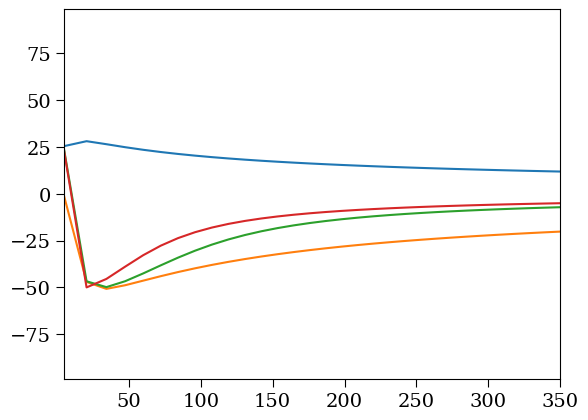

In [ ]:
for i in range(3):
    plt.plot(betagrid[0][:,50],-evpavals[i][0][:,50]*180/np.pi)
plt.plot(betagrid[0][:,50],-evpavals[2][1][:,50]*180/np.pi)
plt.plot(betavals_GRMHD[0][0],-180/np.pi*evpaspines_grmhd[0][0],'k--')
plt.plot(betavals_GRMHD[1][0],-180/np.pi*evpaspines_grmhd[1][0],'k--')
plt.xlim(5,350)

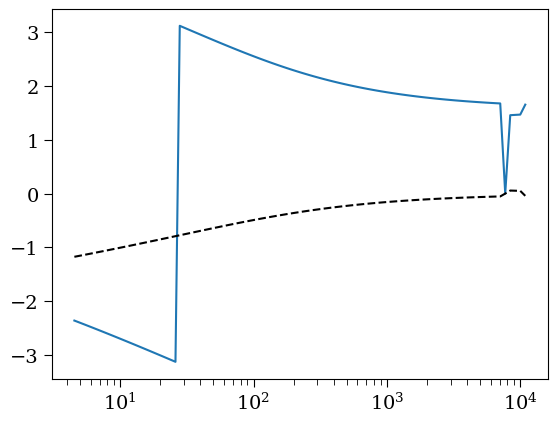

In [ ]:
plt.semilogx(betagrid[0][:,50],np.angle(Q_all[0][0][:,50]+1j*U_all[0][0][:,50]))
plt.semilogx(betagrid[0][:,50], evpavals[0][0][:,50], 'k--')

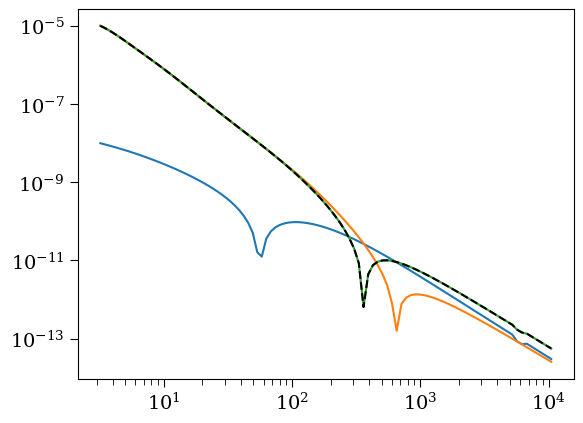

In [ ]:
indplot = 80
plt.loglog(betagrid[0][:,indplot],np.abs(Q_all[0][0][:,indplot]))
plt.loglog(betagrid[0][:,indplot],np.abs(Q_all[1][0][:,indplot]))
plt.loglog(betagrid[0][:,indplot],np.abs(Q_all[2][0][:,indplot]))
plt.loglog(betagrid[0][:,indplot],np.abs(Q_all[0][0][:,indplot]+Q_all[1][0][:,indplot]),'k--')

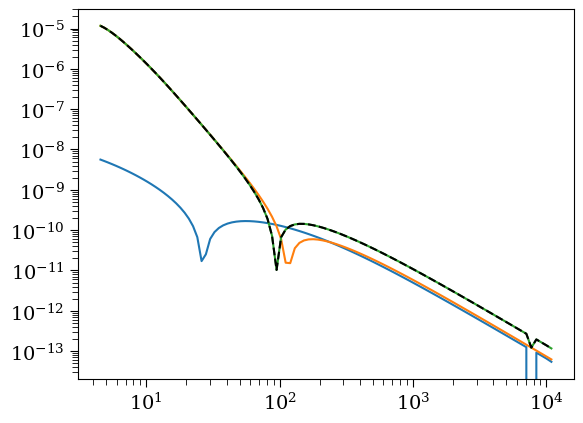

In [ ]:
plt.loglog(betagrid[0][:,50],np.abs(U_all[0][0][:,50]))
plt.loglog(betagrid[0][:,50],np.abs(U_all[1][0][:,50]))
plt.loglog(betagrid[0][:,50],np.abs(U_all[2][0][:,50]))
plt.loglog(betagrid[0][:,50],np.abs(U_all[0][0][:,50]+U_all[1][0][:,50]),'k--')

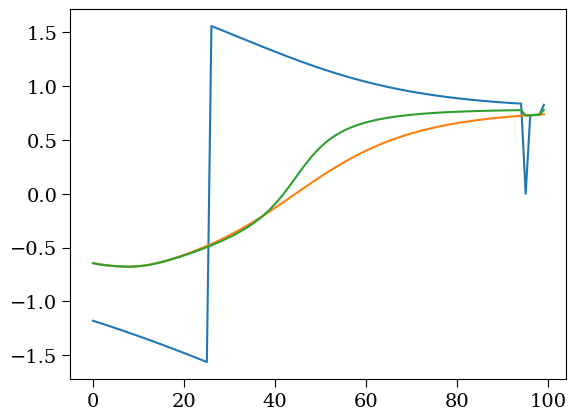

In [ ]:
plt.plot(.5*np.angle(Q_all[0][0][:,50]+1j*U_all[0][0][:,50]))
plt.plot(.5*np.angle(Q_all[1][0][:,50]+1j*U_all[1][0][:,50]))
plt.plot(.5*np.angle(Q_all[2][0][:,50]+1j*U_all[2][0][:,50]))

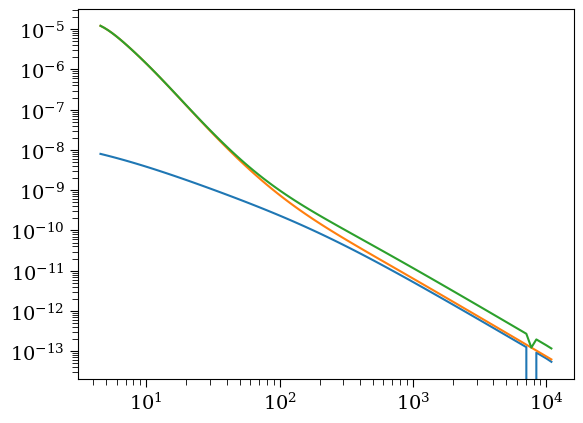

In [ ]:
plt.loglog(betagrid[0][:,50],np.abs(I_all[0][0][:,50]))
plt.loglog(betagrid[0][:,50],np.abs(I_all[1][0][:,50]))
plt.loglog(betagrid[0][:,50],np.abs(I_all[2][0][:,50]))

/tmp/ipykernel_450740/21784925.py:1: RuntimeWarning: invalid value encountered in remainder
  plt.plot(phi_all[0][50]%(2*np.pi))


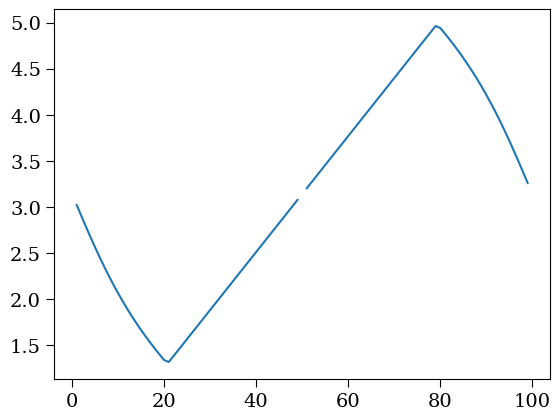

In [ ]:
plt.plot(phi_all[0][50]%(2*np.pi))

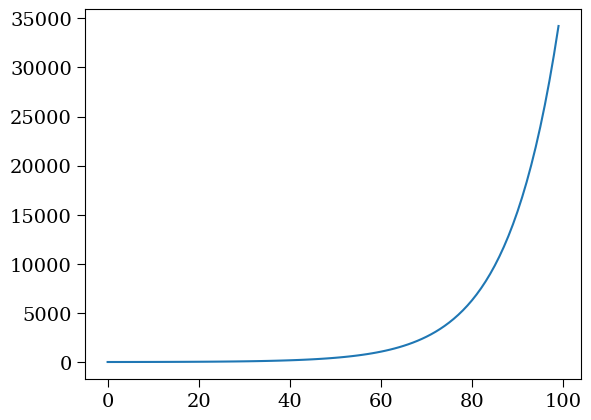

In [ ]:
rhere = np.sqrt(R_all[0]**2+Z_all[0]**2)
plt.plot(rhere[:,50])

# Misc

/tmp/ipykernel_100323/3083829004.py:2: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


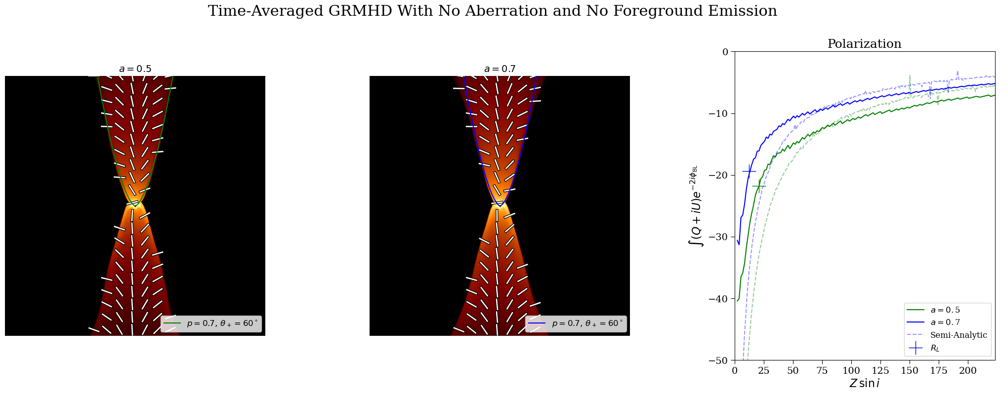

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(21,7), constrained_layout=True)
fig.tight_layout()
pval = 0.75
thplus = 60*np.pi/180
psitarget = rp**pval*(1-np.cos(thplus))
nth = 1000
thvals = np.linspace(thplus, 1*np.pi/180,nth)
colors = ['g', 'b']
for i in range(len(spins)):
    rvals = (psitarget[i]/(1-np.cos(thvals)))**(1/pval)
    Rvals = rvals*np.sin(thvals)
    Zvals = rvals*np.cos(thvals)
    alphavals = np.copy(Rvals)
    betavals = Zvals*np.sin(inc)
    rownew, colnew = Mtopix(ims[1][1], alphavals, betavals)
    ax[i].plot(rownew, colnew,color=colors[i])
    rownew, colnew = Mtopix(ims[1][1], -alphavals, betavals)
    ax[i].plot(rownew, colnew,color=colors[i],label=r'$p=0.7,\,\theta_+=60^\circ$')
    ims[i][1].display(scale='log',plotp=True,pcut=1e-10,dynamic_range=[1e7],axis=ax[i],has_title=False,label_type=None,has_cbar=False)
    ax[i].set(xlim=(0,ims[i][1].xdim),ylim=(ims[i][1].ydim,0))
ax[0].set_title(r'$a=0.5$')
ax[1].set_title(r'$a=0.7$')
ax[0].legend(loc='lower right')
ax[1].legend(loc='lower right')

for i in range(len(spins)):
    yvals = -180/np.pi*np.angle(np.sum(b2_zpvals_GRMHD[i][1][:-1], axis=1))
    ax[2].plot(Zlimbvals_GRMHD[i][1][:-1]*np.sin(inc), yvals,color=colors[i],label=r'$a=0.$'+spinstring[i])
    xlc = Zlc_all[i]*np.sin(inc)
    ylc = yvals[np.argmin(np.abs(Zlimbvals_GRMHD[i][1][:-1]*np.sin(inc)-xlc))]
    yvals = -180/np.pi*np.angle(np.sum(b2_zpvals[i], axis=1))
    if i == 1:
        ax[2].plot(Zinterp_all[i]*np.sin(inc),yvals,color=colors[i],linestyle='--',alpha=0.4,label='Semi-Analytic')
        ax[2].plot(xlc,ylc,'+',color=colors[i],markersize=20,label=r'$R_L$')
    else:
        ax[2].plot(Zinterp_all[i]*np.sin(inc),yvals,color=colors[i],linestyle='--',alpha=0.4)
        ax[2].plot(xlc,ylc,'+',color=colors[i],markersize=20)
ax[2].set(xlim=(0,np.max(Zinterp_all[0])*np.sin(inc)),ylim=(-50,0))
ax[2].legend()
ax[2].set(xlabel=r'$Z\,\sin i$',ylabel=r'$\int (Q+iU)e^{-2i\phi_{\rm BL}}$')
ax[2].set_title('Polarization',fontsize=18)
plt.subplots_adjust(wspace=0.4)
plt.suptitle('Time-Averaged GRMHD With No Aberration and No Foreground Emission', fontsize=22,y=1.1)

plt.savefig('Figures/GRMHD_images_ZAMO.pdf',bbox_inches='tight',dpi=300)
plt.savefig('Figures/GRMHD_images_ZAMO.png',bbox_inches='tight',dpi=300)

# New comparisons

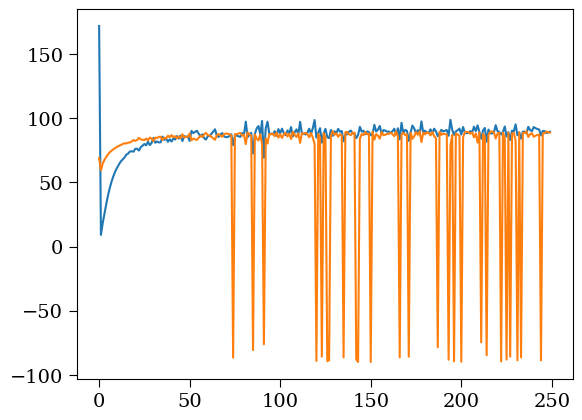

In [ ]:
phisign = 1
yvals = -.5*np.angle(b2_zpvals[0][:,0]*np.exp(2*1j*(phisign*phiinterp[0]+np.pi)))*180/np.pi
yvals[yvals<0] += 180
plt.plot(yvals)
yvals = -.5*np.angle(b2_zpvals[0][:,-1]*np.exp(2*1j*(phisign*phiinterp[-1]+np.pi)))*180/np.pi
# yvals[yvals<0] += 180
plt.plot(yvals)
# plt.plot(-np.angle(b2_zpvals[0][:,-1])*180/np.pi/2)

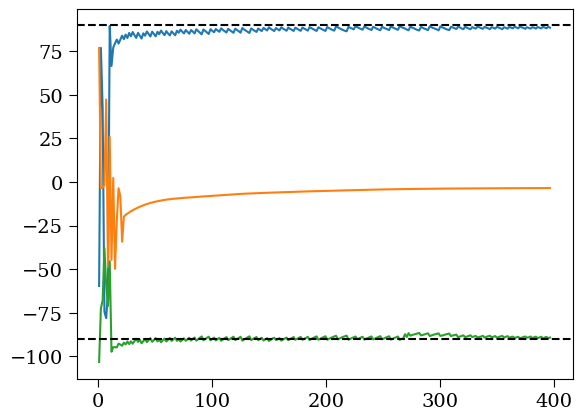

In [ ]:
plt.plot(betavals_GRMHD[0][1],-evpalimbs1[0][1]*180/np.pi)
plt.plot(betavals_GRMHD[0][1],-evpaspines[0][1]*180/np.pi)
yvals = -evpalimbs2[0][1]*180/np.pi
yvals[yvals>25] -= 180
plt.plot(betavals_GRMHD[0][1],yvals)
plt.axhline(90,color='k',linestyle='--')
plt.axhline(-90,color='k',linestyle='--')

(0.0, 223.2701311118278)

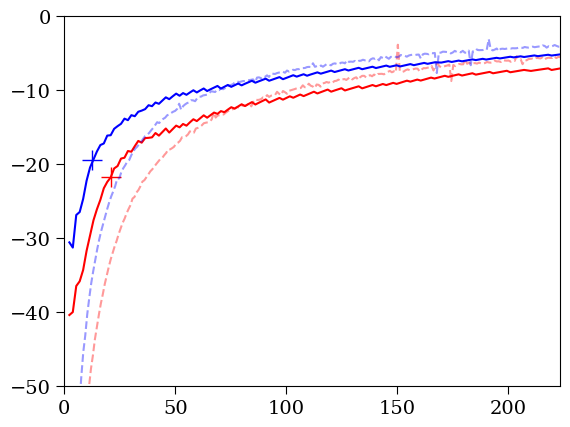

In [ ]:
colors = ['r', 'b']
for i in range(len(spins)):
    yvals = -180/np.pi*np.angle(np.sum(b2_zpvals_GRMHD[i][1][:-1], axis=1))
    plt.plot(Zlimbvals_GRMHD[i][1][:-1]*np.sin(inc), yvals,color=colors[i])
    xlc = Zlc_all[i]*np.sin(inc)
    ylc = yvals[np.argmin(np.abs(Zlimbvals_GRMHD[i][1][:-1]*np.sin(inc)-xlc))]
    plt.plot(xlc,ylc,'+',color=colors[i],markersize=15)
    yvals = -180/np.pi*np.angle(np.sum(b2_zpvals[i], axis=1))
    plt.plot(Zinterp_all[i]*np.sin(inc),yvals,color=colors[i],linestyle='--',alpha=0.4)
plt.ylim(-50,0)
plt.xlim(0,np.max(Zinterp_all[0])*np.sin(inc))

(0.0, 224.37603108597546)

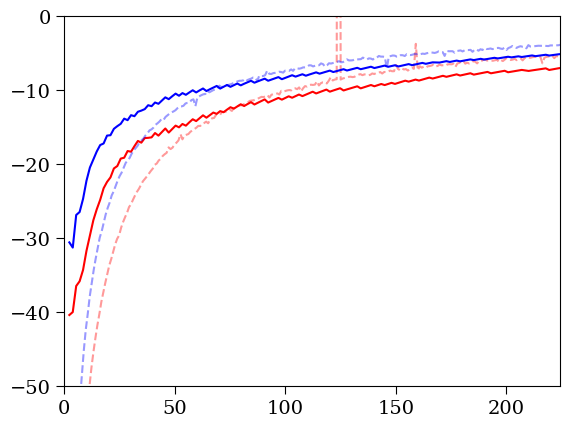

In [ ]:
colors = ['r', 'b']
for i in range(len(spins)):
    yvals = -180/np.pi*np.angle(np.sum(b2_zpvals_GRMHD[i][1][:-1], axis=1))
    # yvals[yvals>0] -= 360
    plt.plot(Zlimbvals_GRMHD[i][1][:-1]*np.sin(inc), yvals,color=colors[i])
    yvals = -180/np.pi*np.angle(np.sum(b2_zpvals[i], axis=1))
    # yvals[yvals>0] -= 360
    plt.plot(Zinterp_all[i]*np.sin(inc),yvals,color=colors[i],linestyle='--',alpha=0.4)
plt.ylim(-50,0)
plt.xlim(0,np.max(Zinterp_all[0])*np.sin(inc))

(0.0, 168.37705340642043)

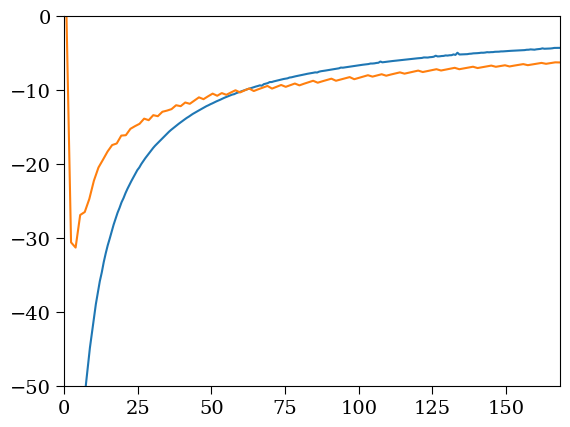

In [ ]:
plt.plot(Zinterp*np.sin(inc),-np.angle(np.sum(b2_zp,axis=1))*180/np.pi)
plt.plot(Zlimbvals[spinind][1]*np.sin(inc),-np.angle(np.sum(b2_zpvals[spinind][1],axis=1))*180/np.pi)
plt.ylim(-50,0)
plt.xlim(0,np.max(Zinterp*np.sin(inc)))

(0.0, 193.3549659370612)

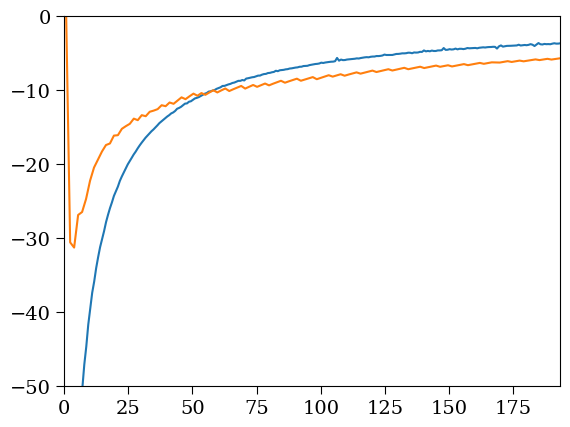

In [ ]:
plt.plot(Zinterp*np.sin(inc),-np.angle(np.sum(b2_zp,axis=1))*180/np.pi)
plt.plot(Zlimbvals[spinind][1]*np.sin(inc),-np.angle(np.sum(b2_zpvals[spinind][1],axis=1))*180/np.pi)
plt.ylim(-50,0)
plt.xlim(0,np.max(Zinterp*np.sin(inc)))

(-50.0, 0.0)

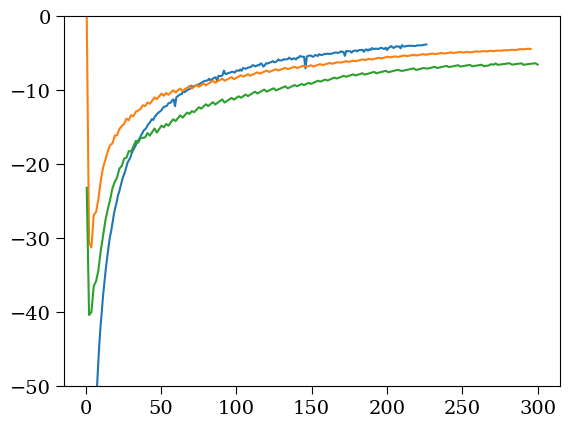

In [ ]:
plt.plot(Zinterp*np.sin(inc),-np.angle(np.sum(b2_zp,axis=1))*180/np.pi)
plt.plot(Zlimbvals[spinind][1]*np.sin(inc),-np.angle(np.sum(b2_zpvals[spinind][1],axis=1))*180/np.pi)
# plt.plot(Zlimbvals[spinind-1][1]*np.sin(inc),-np.angle(np.sum(b2_zpvals[spinind-1][1],axis=1))*180/np.pi)
plt.ylim(-50,0)

In [ ]:
ivec_1, qvec_1, uvec_1, evpa_1, r_1, th_1, sinthb_1 = getstokes(psitarget, alphagrid, betagrid, ROUT, INC, spins[spinind], NGEO, do_phi_and_t = True, model=model, neqmax=neqmax, outgeo=outgeo_7, nu_parallel = 'FF', vel='driftframe', sigma = 1, gammamax=gammamax, retvals=True, pval=pval, retsin=True, sigmaplasma = sigmaplasma, emit = emit)

(4, 125000)
before solve
after solve
guesses before  (4, 125000)


Text(0.5, 1.05, 'Polarization Angle for Spin = 0.7 and Inc = 17.0$^\\circ$: $\\gamma_\\infty=1$')

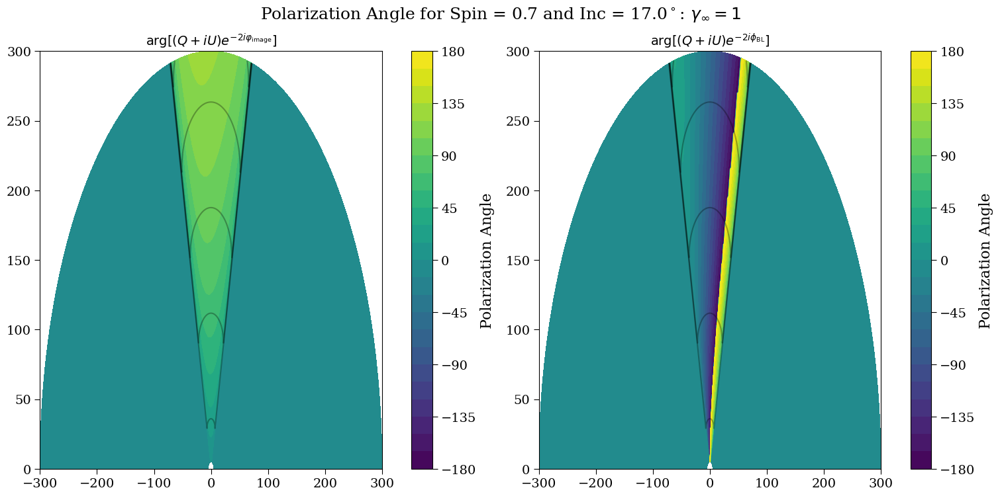

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(15,7), constrained_layout=True)
nlevel = 25
Ximage = bgrid*np.cos(varphigrid)
Yimage = bgrid*np.sin(varphigrid)
spinind = 0
incind = 0
velind = 0
b2_bv = (qvec_g[0]+1j*uvec_g[0])*np.exp(-1j*2*varphigrid)
b2_bp = (qvec_g[0]+1j*uvec_g[0])*np.exp(-1j*2*phivals)
y1 = np.angle(np.nan_to_num(b2_bv))*180/np.pi
y1[np.abs(np.nan_to_num(b2_bv))<=0] = 0
y2 = np.angle(np.nan_to_num(b2_bp))*180/np.pi
y2[np.abs(np.nan_to_num(b2_bv))<=0] = 0
ax0 = ax[0].contourf(Ximage, Yimage, -y1,levels=np.linspace(-180,180,nlevel))
ax1 = ax[1].contourf(Ximage, Yimage, -y2, levels=np.linspace(-180,180,nlevel))
# ax[0].text(0,38,r'$Z_{\rm LC}$')
# ax[1].text(0,38,r'$Z_{\rm LC}$')
plt.colorbar(ax0,label='Polarization Angle')
plt.colorbar(ax1,label='Polarization Angle')

maxb = 300

for i in range(2):
    # ax[i].contour(Ximage, Yimage, np.reshape(b2_all[spinind][incind][velind],(Nb,Nphi)), levels=[0.0], alpha=0.3, colors='k', linestyles='--')
    ax1 = ax[i].contour(Ximage, Yimage, Zvals, levels=np.linspace(100,2000,10), alpha=0.3, colors='k')
    ax[i].set(xlim=(-maxb,maxb),ylim=(0,maxb))
ax[0].set(title=r'${\rm arg}[(Q+iU)e^{-2i\varphi_{\rm image}}]$')
ax[1].set(title=r'${\rm arg}[(Q+iU)e^{-2i\phi_{\rm BL}}]$')

plt.suptitle(r'Polarization Angle for Spin = {} and Inc = {}$^\circ$: $\gamma_\infty=1$'.format(spins[spinind], incs[incind]*180/np.pi), fontsize=18,y=1.05)

In [ ]:
sigma = 20
gammamax = 2.0
pval = 0.8
model = 'power'
sigmaplasma = 1
emit = 'sigma'
#vels = ['zamo'] # , 'driftframe']
pathcor='R'
specind = 1
anis = None
thplus = 60*np.pi/180
psitarget = (1-np.cos(thplus))*np.ones_like(spins) #rp**pval*(1-np.cos(thplus))
gammamaxvals = [10.0]
vels = ['driftframe']#, 'driftframe']#, 'driftframe', 'driftframe']

In [ ]:
Z_all = [[[] for j in range(len(incs))] for k in range(len(spins))]
R_all = [[[] for j in range(len(incs))] for k in range(len(spins))]
Rlc_all = [[[] for j in range(len(incs))] for k in range(len(spins))]
Zlc_all = [[[] for j in range(len(incs))] for k in range(len(spins))]
b2_all = [[[] for j in range(len(incs))] for k in range(len(spins))]
b2_bvall = [[[] for j in range(len(incs))] for k in range(len(spins))]
b2_bv_orig_all = [[[] for j in range(len(incs))] for k in range(len(spins))]
b2_bp_all = [[[] for j in range(len(incs))] for k in range(len(spins))]
b2_bp_orig_all = [[[] for j in range(len(incs))] for k in range(len(spins))]
b2_zv_all = [[[] for j in range(len(incs))] for k in range(len(spins))]
b2_zv_orig_all = [[[] for j in range(len(incs))] for k in range(len(spins))]
b2_zp_all = [[[] for j in range(len(incs))] for k in range(len(spins))]
b2_zp_orig_all = [[[] for j in range(len(incs))] for k in range(len(spins))]
phiinterp_all = [[[] for j in range(len(incs))] for k in range(len(spins))]
Zinterp_all = [[[] for j in range(len(incs))] for k in range(len(spins))]

In [ ]:
signpr, signptheta, neqvals, rvals, thvals, np.reshape(Zvals,(Nb,Nphi)), np.reshape(Rvals,(Nb,Nphi)), np.reshape(phivals,(Nb,Nphi)), Rlc, Zlc, b2vals, omegaF

In [ ]:
for spinind in range(len(spins)):
    for incind in range(len(incs)):
        for velind in range(len(vels)): #range(len(vels)):
            vel = vels[velind]
            gammamax = gammamaxvals[velind]
            inc = incs[incind]
            spin = spins[spinind]
            print(inc*180/np.pi, spin, vel, gammamax)
            outname = f'pklgeo/geo_inc{incstring[incind]}_spin{int(spin*10)}.pkl'
            # with open(outname, 'rb') as file:
            #     outgeo = pickle.load(file)
            # file.close()
            outgeo = outgeos[spinind] #outgeo_7
            imageind = 1 # 1 #1 if inc*180/np.pi > 1 else 0
            phisign = 1 if imageind%2 == 1 else -1
            phisign = -1
            print(imageind, phisign, model)
            signpr, signptheta, neqvals, rvals, thvals, Zvals, Rvals, phivals, Rlc, Zlc, b2vals, OmegaF = getcoords(outgeo, psitarget[spinind], incs[incind], spins[spinind], model, pval, vel, imageind, Nb, Nphi, alphagrid, betagrid, neqmax=neqmax)
            ivec, qvec, uvec = getinfo(signpr, signptheta, neqvals, rvals, thvals, incs[incind], spins[spinind], model, pval, vel, alphagrid, betagrid, gammamax=gammamax, neqmax=neqmax)
            b2_bv, b2_bv_orig, b2_bp, b2_bp_orig, b2_zv, b2_zv_orig, b2_zp, b2_zp_orig, phiinterp, Zinterp, Qzp, Uzp = getinterp(qvec, uvec, varphigrid, bgrid, Zvals, phivals, phisign=phisign)
            Z_all[spinind][incind].append(Zvals)
            R_all[spinind][incind].append(Rvals)
            Rlc_all[spinind][incind].append(Rlc)
            Zlc_all[spinind][incind].append(Zlc)
            b2_all[spinind][incind].append(b2vals)
            b2_bvall[spinind][incind].append(b2_bv)
            b2_bv_orig_all[spinind][incind].append(b2_bv_orig)
            b2_bp_all[spinind][incind].append(b2_bp)
            b2_bp_orig_all[spinind][incind].append(b2_bp_orig)
            b2_zv_all[spinind][incind].append(b2_zv)
            b2_zv_orig_all[spinind][incind].append(b2_zv_orig)
            b2_zp_all[spinind][incind].append(b2_zp)
            b2_zp_orig_all[spinind][incind].append(b2_zp_orig)
            phiinterp_all[spinind][incind].append(phiinterp)
            Zinterp_all[spinind][incind].append(Zinterp)

17.0 0.5 driftframe 10.0
1 -1 power
(4, 125000)
before solve


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/scipy_ellip_binding.py:215: RuntimeWarning: invalid value encountered in divide
  p_m = (z_m*(x_m+y_m+q_m) - x_m*y_m) / (z_m + q_m)
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:43: RuntimeWarning: invalid value encountered in power
  return r**pval*(1-np.abs(np.cos(theta)))
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:204: RuntimeWarning: RMS of 0.00452637 reached
  outqty = scipy.optimize.newton(get_coord_intersect, guesses, maxiter=500, tol=tol)


after solve


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:517: RuntimeWarning: invalid value encountered in scalar divide
  dpsidr = p*psi/r
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:525: RuntimeWarning: invalid value encountered in scalar divide
  Br = C*dpsidtheta / gdet
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:527: RuntimeWarning: invalid value encountered in scalar divide
  Bph = I / (2*np.pi*Delta*sth2)
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:517: RuntimeWarning: invalid value encountered in divide
  dpsidr = p*psi/r
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:525: RuntimeWarning: invalid value encountered in divide
  Br = C*dpsidtheta / gdet
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/bfields.py:527: RuntimeWarning: invalid value encountered in divide
  Bph = I / (2*np.pi*Delta*sth2)
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equator

hiii
hiii


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equatorial_images.py:408: RuntimeWarning: divide by zero encountered in divide
  g33_up = (Delta - a2*sth2)/(Sigma*Delta*sth2)
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equatorial_images.py:419: RuntimeWarning: divide by zero encountered in divide
  TH = eta + a2*cth2 - lam*lam*cth2/sth2
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equatorial_images.py:422: RuntimeWarning: invalid value encountered in sqrt
  k1_l = kr_sign*np.sqrt(R)/Delta
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equatorial_images.py:423: RuntimeWarning: invalid value encountered in sqrt
  k2_l = kth_sign*np.sqrt(TH)
/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/equatorial_images.py:337: RuntimeWarning: divide by zero encountered in divide
  g33_up = (Delta - a2*sth2)/(Sigma*Delta*sth2)


17.0 0.9 driftframe 10.0
1 -1 power
(4, 125000)
before solve


/home/zgelles/anaconda3/lib/python3.12/site-packages/kgeo/solver.py:204: RuntimeWarning: RMS of 0.0045261 reached
  outqty = scipy.optimize.newton(get_coord_intersect, guesses, maxiter=500, tol=tol)


after solve
hiii
hiii


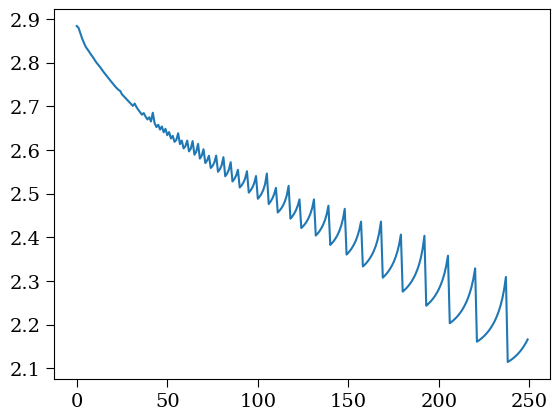

In [ ]:
plt.plot(np.angle(np.sum(b2_bv_orig_all[0][0][0],axis=1)))

Text(0.5, 1.05, 'Polarization Angle for Spin = 0.7 and Inc = 17.0$^\\circ$: $\\gamma_\\infty=1$')

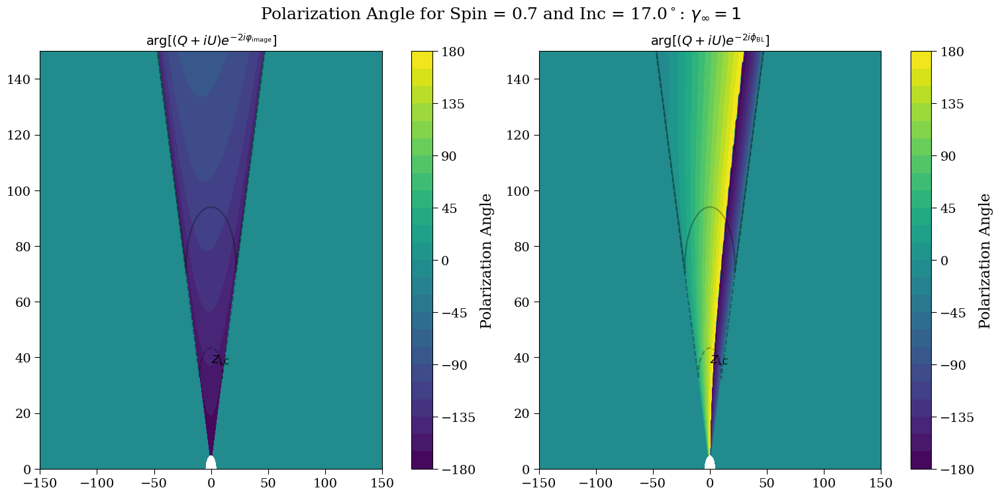

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(15,7), constrained_layout=True)
nlevel = 25
Ximage = bgrid*np.cos(varphigrid)
Yimage = bgrid*np.sin(varphigrid)
spinind = 0
incind = 0
velind = 0
y1 = np.angle(np.nan_to_num(b2_bv_orig_all[spinind][incind][velind]))*180/np.pi
y1[np.abs(np.nan_to_num(b2_bv_orig_all[spinind][incind][velind]))<=0] = 0
y2 = np.angle(np.nan_to_num(b2_bp_orig_all[spinind][incind][velind]))*180/np.pi
y2[np.abs(np.nan_to_num(b2_bv_orig_all[spinind][incind][velind]))<=0] = 0
ax0 = ax[0].contourf(Ximage, Yimage, -y1,levels=np.linspace(-180,180,nlevel))
ax1 = ax[1].contourf(Ximage, Yimage, y2, levels=np.linspace(-180,180,nlevel))
ax[0].text(0,38,r'$Z_{\rm LC}$')
ax[1].text(0,38,r'$Z_{\rm LC}$')
plt.colorbar(ax0,label='Polarization Angle')
plt.colorbar(ax1,label='Polarization Angle')

maxb = 150

for i in range(2):
    ax[i].contour(Ximage, Yimage, np.reshape(b2_all[spinind][incind][velind],(Nb,Nphi)), levels=[0.0], alpha=0.3, colors='k', linestyles='--')
    ax1 = ax[i].contour(Ximage, Yimage, Z_all[spinind][incind][velind], levels=[250], alpha=0.3, colors='k')
    ax[i].set(xlim=(-maxb,maxb),ylim=(0,maxb))
ax[0].set(title=r'${\rm arg}[(Q+iU)e^{-2i\varphi_{\rm image}}]$')
ax[1].set(title=r'${\rm arg}[(Q+iU)e^{-2i\phi_{\rm BL}}]$')

plt.suptitle(r'Polarization Angle for Spin = {} and Inc = {}$^\circ$: $\gamma_\infty=1$'.format(spins[spinind], incs[incind]*180/np.pi), fontsize=18,y=1.05)

Text(0.5, 1.05, 'Polarization Angle for Spin = 0.7 and Inc = 17.0$^\\circ$: $\\gamma_\\infty=1$')

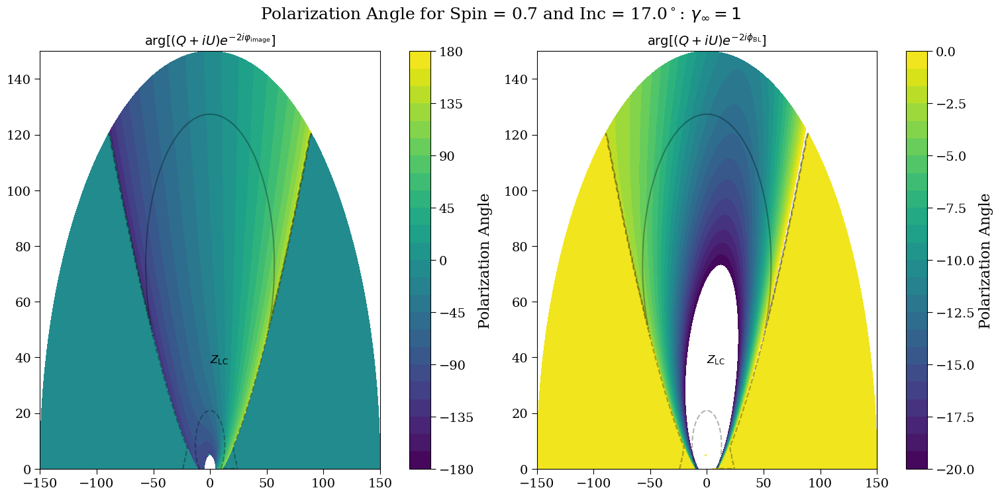

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(15,7), constrained_layout=True)
nlevel = 25
Ximage = bgrid*np.cos(varphigrid)
Yimage = bgrid*np.sin(varphigrid)
spinind = 0
incind = 0
velind = 0
y1 = np.angle(np.nan_to_num(b2_bv_orig_all[spinind][incind][velind]))*180/np.pi
y1[np.abs(np.nan_to_num(b2_bv_orig_all[spinind][incind][velind]))<=0] = 0
y2 = np.angle(np.nan_to_num(b2_bp_orig_all[spinind][incind][velind]))*180/np.pi
y2[np.abs(np.nan_to_num(b2_bv_orig_all[spinind][incind][velind]))<=0] = 0
ax0 = ax[0].contourf(Ximage, Yimage, -y1,levels=np.linspace(-180,180,nlevel))
ax1 = ax[1].contourf(Ximage, Yimage, -y2, levels=np.linspace(-20,0,nlevel))
ax[0].text(0,38,r'$Z_{\rm LC}$')
ax[1].text(0,38,r'$Z_{\rm LC}$')
plt.colorbar(ax0,label='Polarization Angle')
plt.colorbar(ax1,label='Polarization Angle')

maxb = 150

for i in range(2):
    ax[i].contour(Ximage, Yimage, np.reshape(b2_all[spinind][incind][velind],(Nb,Nphi)), levels=[0.0], alpha=0.3, colors='k', linestyles='--')
    ax1 = ax[i].contour(Ximage, Yimage, Z_all[spinind][incind][velind], levels=[250], alpha=0.3, colors='k')
    ax[i].set(xlim=(-maxb,maxb),ylim=(0,maxb))
ax[0].set(title=r'${\rm arg}[(Q+iU)e^{-2i\varphi_{\rm image}}]$')
ax[1].set(title=r'${\rm arg}[(Q+iU)e^{-2i\phi_{\rm BL}}]$')

plt.suptitle(r'Polarization Angle for Spin = {} and Inc = {}$^\circ$: $\gamma_\infty=1$'.format(spins[spinind], incs[incind]*180/np.pi), fontsize=18,y=1.05)

In [ ]:
Nb = bgrid.shape[0]
Nphi = varphigrid.shape[1]
    
# Interpolate using griddata
Qbv = scint.griddata((varphigrid.flatten(), bgrid.flatten()), qvec[0].flatten(), (varphigrid, bgrid), method='cubic')
Ubv = scint.griddata((varphigrid.flatten(), bgrid.flatten()), uvec[0].flatten(), (varphigrid, bgrid), method='cubic')
b2_bv = np.nan_to_num((Qbv+1j*Ubv)*np.exp(2*1j*(-varphigrid-np.pi/2)))
b2_bv_orig = np.nan_to_num((qvec[0]+1j*uvec[0])*np.exp(2*1j*(-varphigrid-np.pi/2)))
argb2_bv = np.angle(b2_bv)

phimod = np.nan_to_num(phivals%(2*np.pi))
phiinterp = np.linspace(np.pi/2, 3*np.pi/2, Nphi) #np.linspace(np.min(phimod[phimod>0]), np.max(phimod[phimod>0]), Nphi)
phigrid = np.reshape(np.tile(phiinterp,Nb),(Nb,Nphi))
Qbp = scint.griddata((phimod.flatten(), bgrid.flatten()), qvec[0].flatten(), (phigrid, bgrid), method='cubic')
Ubp = scint.griddata((phimod.flatten(), bgrid.flatten()), uvec[0].flatten(), (phigrid, bgrid), method='cubic')
b2_bp = np.nan_to_num((Qbp+1j*Ubp)*np.exp(2*1j*(-phisign*phigrid-np.pi)))
b2_bp_orig = np.nan_to_num((qvec[0]+1j*uvec[0])*np.exp(2*1j*(-phisign*phivals-np.pi)))
argb2_bp = np.angle(b2_bp)

Zinterp = np.linspace(np.min(Zvals[Zvals>0]),np.max(Zvals[Zvals>0]), Nb)
Zgrid = np.transpose(np.reshape(np.tile(Zinterp,Nphi),(Nphi,Nb)))
Qzv = scint.griddata((varphigrid.flatten(), Zvals.flatten()), qvec[0].flatten(), (varphigrid, Zgrid), method='cubic')
Uzv = scint.griddata((varphigrid.flatten(), Zvals.flatten()), uvec[0].flatten(), (varphigrid, Zgrid), method='cubic')
b2_zv = np.nan_to_num((Qzv+1j*Uzv)*np.exp(2*1j*(-varphigrid-np.pi/2)))
b2_zv_orig = np.nan_to_num((qvec[0]+1j*uvec[0])*np.exp(2*1j*(-varphigrid-np.pi/2)))
argb2_zv = np.angle(b2_zv)

Qzp = scint.griddata((phimod.flatten(), Zvals.flatten()), qvec[0].flatten(), (phigrid, Zgrid), method='cubic')
Uzp = scint.griddata((phimod.flatten(), Zvals.flatten()), uvec[0].flatten(), (phigrid, Zgrid), method='cubic')
b2_zp = np.nan_to_num((Qzp+1j*Uzp)*np.exp(2*1j*(-phisign*phigrid-np.pi)))
b2_zp_orig = np.nan_to_num((qvec[0]+1j*uvec[0])*np.exp(2*1j*(-phisign*phivals-np.pi)))
argb2_zp = np.angle(b2_zp)

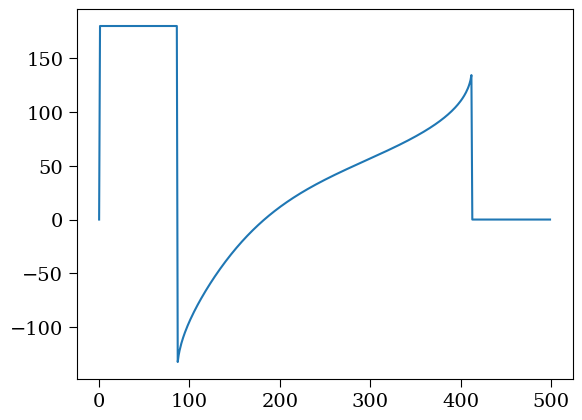

In [ ]:
plt.plot(np.angle(b2_zv_orig)[50]*180/np.pi)

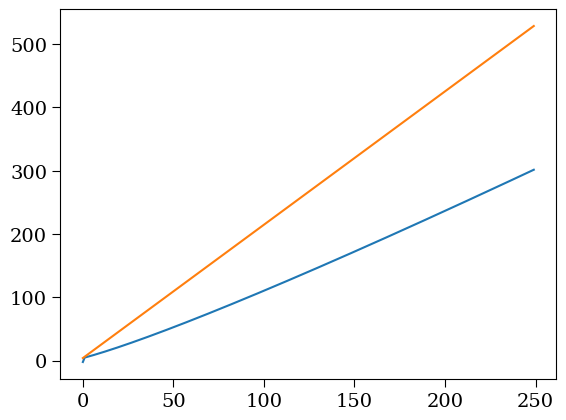

In [ ]:
plt.plot(Zvals[:,250])
plt.plot(Zinterp)

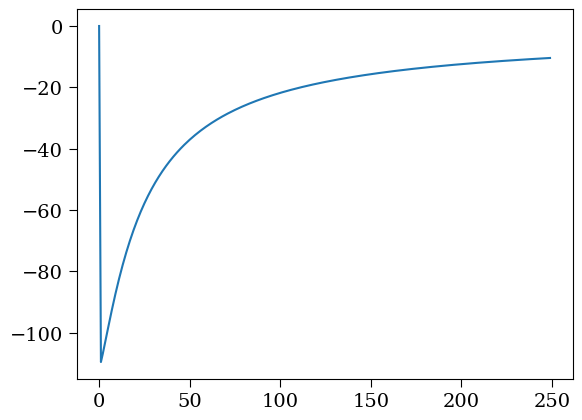

In [ ]:
plt.plot(-np.angle(b2_bv_orig_all[0][0][0][:,250])*180/np.pi)

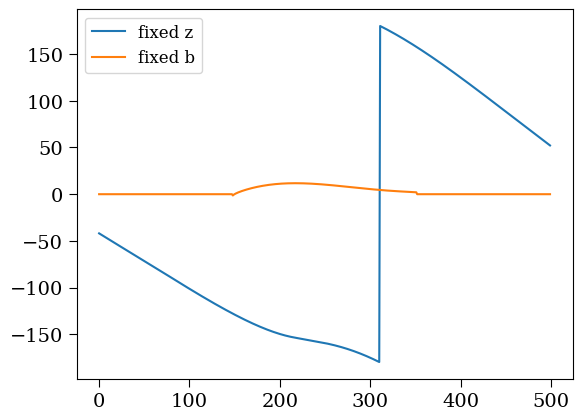

In [ ]:
ind = 240
velind = 0
plt.plot(np.angle(b2_zp_all[0][0][velind][ind])*180/np.pi,label='fixed z')
plt.plot(np.angle(b2_zp_orig_all[0][0][velind][ind])*180/np.pi, label='fixed b')
plt.legend()

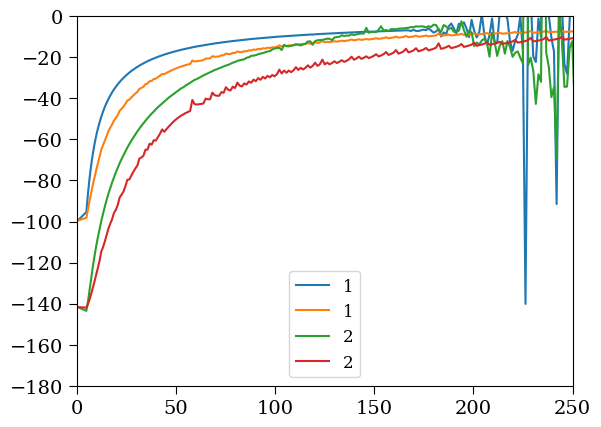

In [ ]:
labels = [1,2,'FF', 3.5, 2.5]
for velind in range(2):
    xvals = Z_all[spinind][incind][velind][:,Nphi//2]# Zinterp_all[spinind][incind][velind] if incind > 0 else Z_all[spinind][incind][velind][:,Nphi//2]
    yvals = -180/np.pi*np.angle(np.sum(b2_zp_all[spinind][incind][velind], axis=1))
    plt.plot(xvals, yvals,label=labels[velind])
    xvals = Z_all[spinind][incind][velind][:,Nphi//2]# Zinterp_all[spinind][incind][velind] if incind > 0 else Z_all[spinind][incind][velind][:,Nphi//2]
    yvals = -180/np.pi*np.angle(np.sum(b2_zp_orig_all[spinind][incind][velind], axis=1))
    plt.plot(xvals, yvals,label=labels[velind])
plt.ylim(-180,0)
plt.xlim(0,250)
plt.legend()

<>:17: SyntaxWarning: invalid escape sequence '\g'
<>:17: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_151335/3134966919.py:17: SyntaxWarning: invalid escape sequence '\g'
  plt.suptitle('Polarization Angle at Fixed $Z$: $\gamma_\infty=1$',fontsize=20,y=1.0)


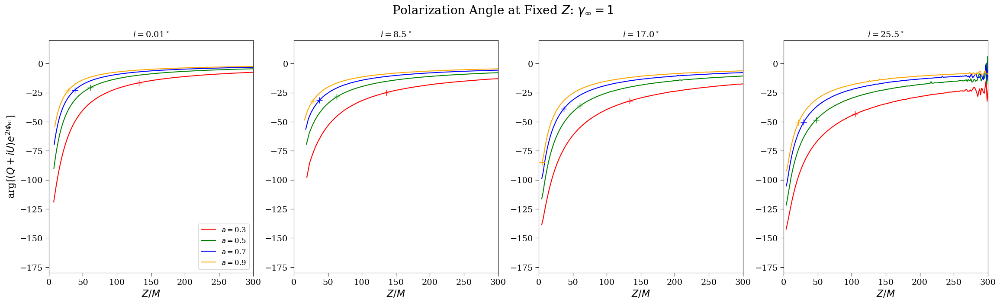

In [ ]:
velind = 0
fig, ax = plt.subplots(1,4,figsize=(28,7))
colors = ['r','g','b','orange']
for incind in range(len(incs)-1):
    for spinind in range(len(spins)):
        xvals = Zinterp_all[spinind][incind][velind] if incind > 0 else Z_all[spinind][incind][velind][:,Nphi//2]
        yvals = -180/np.pi*np.angle(np.sum(b2_zp_all[spinind][incind][velind], axis=1)) if incind > 0 else -180/np.pi*np.angle(np.sum(b2_bv_orig_all[spinind][incind][velind], axis=1))
        ax[incind].plot(xvals,yvals,label=r'$a=${}'.format(spins[spinind]),color=colors[spinind])
        Zlchere = Zlc_all[spinind][incind][velind]
        indlc = np.argmin(np.abs(xvals-Zlchere))
        ax[incind].plot(xvals[indlc],yvals[indlc],'+',color=colors[spinind],markersize=10)
  
ax[0].set(ylabel=r'arg[$(Q+iU)e^{2i\phi_{\rm BL}}$]')
ax[0].legend(loc='lower right')
for i in range(len(incs)-1):
    ax[i].set(xlim=(0,300),ylim=(-180,20),xlabel=r'$Z/M$',title=r'$i=${}$^\circ$'.format(incs[i]*180/np.pi))
plt.suptitle('Polarization Angle at Fixed $Z$: $\gamma_\infty=1$',fontsize=20,y=1.0)
plt.savefig('Figures/pol_z_compareinc_ZAMO.pdf',bbox_inches='tight',dpi=300)
plt.savefig('Figures/pol_z_compareinc_ZAMO.png',bbox_inches='tight',dpi=300)

<>:17: SyntaxWarning: invalid escape sequence '\g'
<>:17: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_151335/442335527.py:17: SyntaxWarning: invalid escape sequence '\g'
  plt.suptitle('Polarization Angle at Fixed $Z$: $\gamma_\infty=2$',fontsize=20,y=1.0)


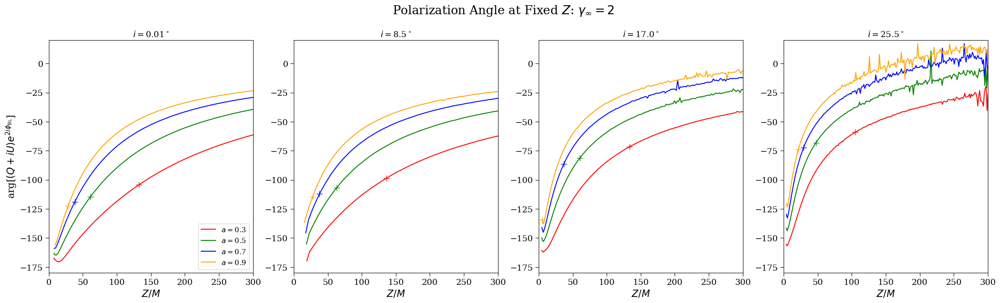

In [ ]:
velind = 1
fig, ax = plt.subplots(1,4,figsize=(28,7))
colors = ['r','g','b','orange']
for incind in range(len(incs)-1):
    for spinind in range(len(spins)):
        xvals = Zinterp_all[spinind][incind][velind] if incind > 0 else Z_all[spinind][incind][velind][:,Nphi//2]
        yvals = -180/np.pi*np.angle(np.sum(b2_zp_all[spinind][incind][velind], axis=1)) if incind > 0 else -180/np.pi*np.angle(np.sum(b2_bv_orig_all[spinind][incind][velind], axis=1))
        ax[incind].plot(xvals,yvals,label=r'$a=${}'.format(spins[spinind]),color=colors[spinind])
        Zlchere = Zlc_all[spinind][incind][velind]
        indlc = np.argmin(np.abs(xvals-Zlchere))
        ax[incind].plot(xvals[indlc],yvals[indlc],'+',color=colors[spinind],markersize=10)
  
ax[0].set(ylabel=r'arg[$(Q+iU)e^{2i\phi_{\rm BL}}$]')
ax[0].legend(loc='lower right')
for i in range(len(incs)-1):
    ax[i].set(xlim=(0,300),ylim=(-180,20),xlabel=r'$Z/M$',title=r'$i=${}$^\circ$'.format(incs[i]*180/np.pi))
plt.suptitle('Polarization Angle at Fixed $Z$: $\gamma_\infty=2$',fontsize=20,y=1.0)
plt.savefig('Figures/pol_z_compareinc_gamma2.pdf',bbox_inches='tight',dpi=300)
plt.savefig('Figures/pol_z_compareinc_gamma2.png',bbox_inches='tight',dpi=300)

Text(0.5, 1.05, 'Polarization Angle for Spin = 0.7 and Inc = 17.0$^\\circ$: $\\gamma_\\infty=1$')

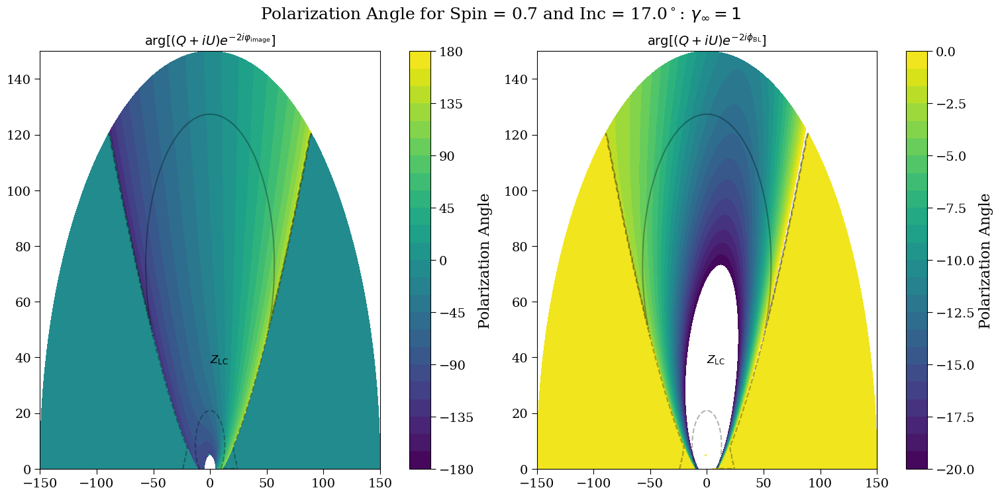

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(15,7), constrained_layout=True)
nlevel = 25
Ximage = bgrid*np.cos(varphigrid)
Yimage = bgrid*np.sin(varphigrid)
spinind = 0
incind = 0
velind = 0
y1 = np.angle(np.nan_to_num(b2_bv_orig_all[spinind][incind][velind]))*180/np.pi
y1[np.abs(np.nan_to_num(b2_bv_orig_all[spinind][incind][velind]))<=0] = 0
y2 = np.angle(np.nan_to_num(b2_bp_orig_all[spinind][incind][velind]))*180/np.pi
y2[np.abs(np.nan_to_num(b2_bv_orig_all[spinind][incind][velind]))<=0] = 0
ax0 = ax[0].contourf(Ximage, Yimage, -y1,levels=np.linspace(-180,180,nlevel))
ax1 = ax[1].contourf(Ximage, Yimage, -y2, levels=np.linspace(-20,0,nlevel))
ax[0].text(0,38,r'$Z_{\rm LC}$')
ax[1].text(0,38,r'$Z_{\rm LC}$')
plt.colorbar(ax0,label='Polarization Angle')
plt.colorbar(ax1,label='Polarization Angle')

maxb = 150

for i in range(2):
    ax[i].contour(Ximage, Yimage, np.reshape(b2_all[spinind][incind][velind],(Nb,Nphi)), levels=[0.0], alpha=0.3, colors='k', linestyles='--')
    ax1 = ax[i].contour(Ximage, Yimage, Z_all[spinind][incind][velind], levels=[250], alpha=0.3, colors='k')
    ax[i].set(xlim=(-maxb,maxb),ylim=(0,maxb))
ax[0].set(title=r'${\rm arg}[(Q+iU)e^{-2i\varphi_{\rm image}}]$')
ax[1].set(title=r'${\rm arg}[(Q+iU)e^{-2i\phi_{\rm BL}}]$')

plt.suptitle(r'Polarization Angle for Spin = {} and Inc = {}$^\circ$: $\gamma_\infty=1$'.format(spins[spinind], incs[incind]*180/np.pi), fontsize=18,y=1.05)

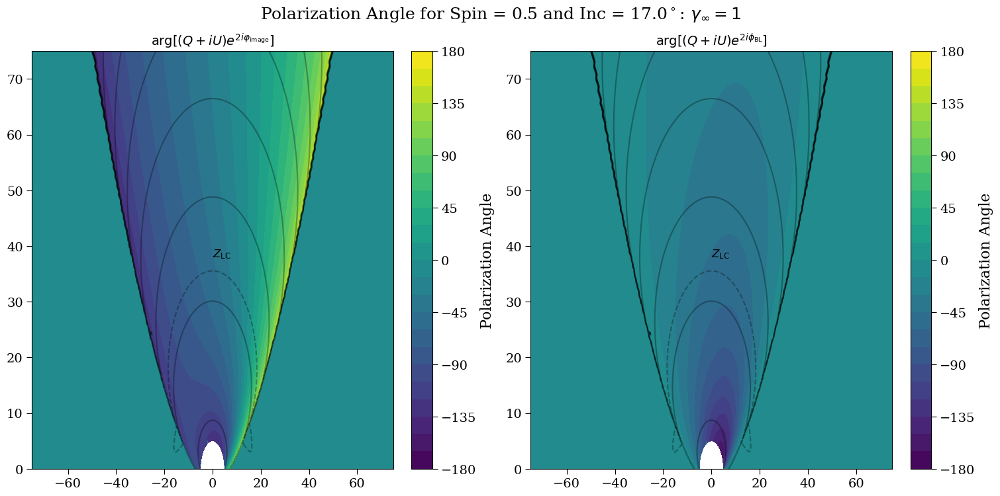

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(15,7), constrained_layout=True)
nlevel = 25
Ximage = bgrid*np.cos(varphigrid)
Yimage = bgrid*np.sin(varphigrid)
spinind = 1
incind = 2
velind = 0
y1 = np.angle(np.nan_to_num(b2_bv_orig_all[spinind][incind][velind]))*180/np.pi
y1[np.abs(np.nan_to_num(b2_bv_orig_all[spinind][incind][velind]))<=0] = 0
y2 = np.angle(np.nan_to_num(b2_bp_orig_all[spinind][incind][velind]))*180/np.pi
y2[np.abs(np.nan_to_num(b2_bv_orig_all[spinind][incind][velind]))<=0] = 0
ax0 = ax[0].contourf(Ximage, Yimage, -y1,levels=np.linspace(-180,180,nlevel))
ax1 = ax[1].contourf(Ximage, Yimage, -y2, levels=np.linspace(-180,180,nlevel))
ax[0].text(0,38,r'$Z_{\rm LC}$')
ax[1].text(0,38,r'$Z_{\rm LC}$')
plt.colorbar(ax0,label='Polarization Angle')
plt.colorbar(ax1,label='Polarization Angle')

maxb = 75

for i in range(2):
    ax[i].contour(Ximage, Yimage, np.reshape(b2_all[spinind][incind][velind],(Nb,Nphi)), levels=[0.0], alpha=0.3, colors='k', linestyles='--')
    ax1 = ax[i].contour(Ximage, Yimage, Z_all[spinind][incind][velind], np.linspace(10,250,7), alpha=0.3, colors='k')
    ax[i].set(xlim=(-maxb,maxb),ylim=(0,maxb))
ax[0].set(title=r'${\rm arg}[(Q+iU)e^{2i\varphi_{\rm image}}]$')
ax[1].set(title=r'${\rm arg}[(Q+iU)e^{2i\phi_{\rm BL}}]$')

plt.suptitle(r'Polarization Angle for Spin = {} and Inc = {}$^\circ$: $\gamma_\infty=1$'.format(spins[spinind], incs[incind]*180/np.pi), fontsize=18,y=1.05)
plt.savefig('Figures/polarization_spin0.5_inc17_ZAMO.pdf',bbox_inches='tight',dpi=300)
plt.savefig('Figures/polarization_spin0.5_inc17_ZAMO.png',bbox_inches='tight',dpi=300)